In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.image as img





In [3]:
plt.imshow([[[1,1,1], [1,1,1], [1,1,1]], [[1,1,1], [1,1,1], [1,1,1]], [[1,1,1], [1,1,1], [1,1,1]]])

In [2]:
im_data= img.imread('esempio.jpg')

In [11]:
b= np.shape(im_data)

In [13]:
im_data = img.imread('esempio.jpg')
plt.imshow(im_data, cmap='jet', interpolation='nearest')

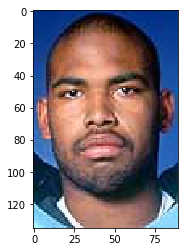

In [14]:
plt.show()

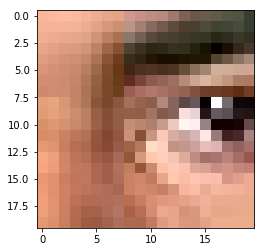

In [17]:
plt.imshow(im_data[40:60, 40:60, :], cmap='jet', interpolation='nearest')
plt.show()

###### \immagini\ECU\ECU\001

im_dataTest = img.imread('esempio.jpg')

plt.imshow(im_dataTest[30:80,30:80,:], cmap='jet', interpolation='nearest')
plt.show()


im_dataTestMask = img.imread('ground.pbm')
im_ground = im_dataTestMask[:, :, 0]
plt.imshow(im_ground[30:80,30:80], cmap='jet', interpolation='nearest')
#plt.show()

In [2]:
def split_block(r, c, input_img):
    block = []
    for i in range(2):
        for j in range(2):   
            for k in range(5):
                block.append(input_img[r+i][c+j][k])
    return block

def split_blocks(input_images):
    n_images = len(input_images)
    blocks = []
    
    for k in range(n_images):
        input_img = input_images[k]
        for i in range(len(input_img) -1):
            for j in range(len(input_img[0]) -1):
                blocks.append(split_block(i,j,input_img)) 
                
        if (k % 15) == 0:
            print(k)
    return blocks





def split_block_mask(r, c, input_img):
    block = []
    for i in range(2):
        for j in range(2):   
                block.append(input_img[r+i,c+j]) # l'indice zero serve perchè alcune maschere hanno una codifica strana  
    return block

def split_blocks_mask(input_images):
    n_images = len(input_images)
    blocks = []
    
    for k in range(n_images):
        input_img = input_images[k]
        for i in range(input_img.shape[0] -1):
            for j in range(input_img.shape[1] -1):
                blocks.append(split_block_mask(i,j,input_img)) 
        if (k % 15) == 0:
            print(k)
    return np.asarray(blocks)


    

In [225]:
# Divido l'immagine in blocchi con il metodo appena creato e ne controllo la forma
X_blocks = split_blocks(im_dataTest)
X_blocks.shape

(11926, 12)

In [227]:
# Faccio la stessa cosa per le labels, controllo se le shape sono le stesse
y_blocks = split_blocks_mask(im_dataTestMask)
y_blocks.shape

(11926, 4)

In [3]:
# Funzione per creare insiemi di batch (un batch è semplicemente un gruppo di dati)


# Questa funzione prende in input il vettore V e restituisce un vettore in cui ogni elemento
# è un vettore contenente batch_size elementi di V. -- Nota: se la lunghezza di V non è perfettamente
# divisibile per batch_size, alcuni elementi alla fine andranno persi. Questo non è però un problema perché
# il numero di blocchi per le immagini è molto alto (>>10000), mentre la taglia tipica per i batch
# è compresa tra 50 e 100.



def create_batches(V, batch_size):
    n_batches = math.floor(len(V)/batch_size)
    R = []
    for i in range(n_batches):
        R.append((V[(i * batch_size) : ((i+1) * batch_size)]))
    return np.asarray(R)

In [232]:
# Creo i batches per i dati in input e ne controllo la shape, faccio lo stesso per le labels

batches_X = create_batches(X_blocks, 50)
batches_X.shape


(238, 50, 12)

In [233]:
batches_y = create_batches(y_blocks, 50)
batches_y.shape

(238, 50, 4)

In [132]:

#creiamo livelli di input(X) e output(Y)
#12 perchè ogni input e un array di 12 elementi(i blocchi sono matrici4x4 e gni element e una tupla di 3 valori)
#1 perchè ogni neurone deve differenziare tra pelle e non pelle
X = tf.placeholder(tf.float64, shape=[None,20])
y = tf.placeholder(tf.int64, shape=[None,4])

#model parameters: livelli e collegamenti.Il livello di input di 12 e colegto all livello nascosto di 9 
#che è collegato ad un livello nascoto di 7 
#che è collegato ad un livello di output di 1

W1 = tf.Variable(tf.truncated_normal([20,15],stddev=0.1))
b1 = tf.Variable(tf.ones([15]))

W2 = tf.Variable(tf.truncated_normal([15,10],stddev=0.1))
b2 = tf.Variable(tf.ones([10]))

W3 = tf.Variable(tf.truncated_normal([10,4],stddev=0.1))
b3 = tf.Variable(tf.ones([4]))

#probabilità che il neurone si tenuto
#
print(1)

keep_prob=tf.placeholder(tf.float64)

print(1)

y1 = tf.nn.relu(tf.add(tf.matmul(X,W1), b1))
y1_dropout = tf.nn.dropout(y1, keep_prob)

y2 = tf.nn.relu(tf.add(tf.matmul(y1,W2), b2))
y2_dropout = tf.nn.dropout(y2, keep_prob)
print(1)

y_logits = tf.nn.relu(tf.add(tf.matmul(y2,W3),b3))
y_hat = tf.nn.softmax(y_logits)
print(1)

#cost function
cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=y_logits,labels=y))

print(1)


# optimizer (adam optimizer)
# Questa è l'operazione che definisce l'allenamento della rete!
train_step = tf.train.AdamOptimizer(0.001).minimize(cost)
print(1)

 

# accuracyX
true_pred = tf.equal(tf.argmax(y_hat,1), tf.argmax(y,1))
accuracy = tf.reduce_mean(tf.cast(true_pred, tf.float32))

 

# train the model
sess = tf.Session()
init = tf.global_variables_initializer()
sess.run(init)


n_batches = batches_X.shape[0]
print('batches = '+str(n_batches))
# Nota: la struttura ad inizio del for è un dizionario di parametri. Qui vengono indicati i parametri 
##      con cui eseguire l'allenamento. Per quanto riguarda i primi due, X ed y, a questi vengono assegnati
##      batches. Ad ogni iterazione, X ed y assumono il valore dell' n-esimo batch!!
for i in range(n_batches):
    
    batch_X = batches_X[i]
    batch_y = batches_y[i]
    
    #questa è la riga tramite la quale ad ogni iterazione viene allenata la rete sullo specifico batch!!
    sess.run(train_step, feed_dict = {X:batch_X, y:batch_y, keep_prob:0.5})
    # print accuracy and cost after every 100 iterations
    if i % 10000 == 0:
        # notice keep_prob = 1.0 during test (*) **** Importante!!!
        acc, cost_v = sess.run([accuracy, cost], {X:batch_X, y:batch_y, keep_prob:1})
        print("Iteration number:", i)
        print("Accuracy", acc)
        print("Cost", cost_v)

    

1
1


TypeError: Input 'b' of 'MatMul' Op has type float32 that does not match type float64 of argument 'a'.

In [131]:
tf.reset_default_graph()

In [59]:
batches_X = create_batches(X_blocks, 50)

In [60]:
batches_y = create_batches(y_blocks, 50)

In [236]:
tf.reset_default_graph()


In [4]:
# Questa funzione crea una 'maschera' che sarà usata per ricostruire l'output dei modelli predittivi

def build_empty_mask(n_rows, n_cols):
    mask = np.zeros((n_rows, n_cols), dtype=int)
    for i in range(n_rows):
        mask[i, 0] = 1
        mask[i, n_cols-1] = 1
    for i in range(n_cols):
        mask[0, i] = 1
        mask[n_rows-1, i] = 1
    return mask

In [28]:
#Questa funzione ricostruisce la maschera a partire dalle predizioni fatte dagli algoritmi

def build_output_mask(n_rows, n_cols, guesses):
    
    out_mask = build_empty_mask(n_rows, n_cols)
    n_guesses = len(guesses)
    
    for i in range(n_rows):
        for j in range(n_cols):
            
            if( (i!=(n_rows-1) ) & ( j!=(n_cols -1) ) ) :
                out_mask[i, j] = out_mask[i, j] + guesses[(i * (n_cols-1))+j][0]
                out_mask[i, j + 1] = out_mask[i, j + 1] + guesses[(i * (n_cols-1))+j][1]
                out_mask[i + 1, j] = out_mask[i + 1, j] + guesses[(i * (n_cols-1))+j][2]
                out_mask[i + 1, j + 1] = out_mask[i + 1, j + 1] + guesses[(i * (n_cols-1))+j][3]
            
            if out_mask[i, j] < 1:
                out_mask[i, j] = 0
            else:
                out_mask[i, j] = 255

    return out_mask
    
        

In [2]:
#y_blocks

In [3]:
#im_dataTestMask.shape

In [4]:
#build_output_mask(135, 90, y_blocks)

In [283]:
plt.imsave('risultato.png', np.array(build_output_mask(135, 90, y_blocks)), cmap=cm.gray)

In [8]:
from sklearn.ensemble import RandomForestClassifier as rfc

In [379]:
clf.fit(X = X_blocks,y = y_blocks)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=8, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [6]:
def save_predictions(prediction, path, n_rows, n_cols):
    plt.imsave(path, np.array(build_output_mask(n_rows, n_cols, prediction)), cmap=cm.gray)

In [392]:
predizione = clf.predict(split_blocks([img.imread('Attadia.jpg')]))

1
(1600, 1200, 3)


In [393]:
save_predictions(predizione, '1.png', 1600, 1200)

In [5]:
#X_blocks = split_blocks(images)
#y_blocks = split_blocks_mask(masks)

In [378]:
clf = rfc(max_depth = 10, random_state = 42)

In [361]:
out = clf.predict(split_blocks([))

1
(288, 352, 3)


In [362]:
plt.imsave('risultato1.png', np.array(build_output_mask(288, 352, out)), cmap=cm.gray)

In [7]:
# Lettura immagini

im1 = img.imread('ECU/001/im00001.jpg')
plt.imshow(im1, cmap='jet', interpolation='nearest')
#plt.show()

NameError: name 'img' is not defined

In [6]:
mask1 = img.imread('ECU/masks/001/im00001_s.bmp')
plt.imshow(im_data, cmap='jet', interpolation='nearest')
#plt.show()

NameError: name 'img' is not defined

In [341]:
X_blocks = split_blocks([im1, im2])

2
(288, 352, 3)
(288, 352, 3)


In [347]:
y_blocks = split_blocks_mask([mask1, mask2])

In [343]:
len(X_blocks)

201474

In [9]:
im2 = img.imread('ECU/001/im00002.jpg')

feature_extractor(im2)

NameError: name 'feature_extractor' is not defined

In [306]:
mask2 = img.imread('ECU/masks/001/im00002_s.bmp')

In [348]:
len(y_blocks)

201474

In [7]:
def fetch_images(start_index, end_index):
    images = []
    masks = []
    for i in range(start_index, end_index):
        cur = create_name_string(i)
        images.append(img.imread('ECU\\001\\im'+cur+'.jpg'))
        masks.append(img.imread('ECU\\masks\\001\\im'+cur+'_s.bmp'))
        if (i % 25) == 0:
            print(i)
        
    return images, masks

        

In [8]:
def fetch_masks(start_index, end_index):
    masks = []
    for i in range(start_index, end_index):
        cur = create_name_string(i)
        masks.append(img.imread('ECU\\masks\\001\\im'+cur+'_s.bmp'))
        if (i % 25) == 0:
            print(i)
        
    return masks

In [9]:
def create_name_string(number):
    s = str(number)
    for i in range(5 -len(s)):
        s = '0' + s
    return s

In [10]:
#images, masks = fetch_images(1, 50)

In [9]:
#train_images = compute_features(images)

In [8]:
#X_blocks = split_blocks(train_images)

In [11]:
#y_blocks = split_blocks_mask(masks)

In [28]:
X_batches = create_batches(X_blocks, 50)

In [29]:
y_batches = create_batches(y_blocks, 50)

In [28]:
clf = rfc(max_depth = 10, random_state = 42)

In [51]:
from sklearn.ensemble import RandomForestClassifier as rfc
clf = rfc(max_depth = 10, random_state = 42)

In [52]:
clf1 = etc()

In [53]:
clf1.fit(X_blocks, y_blocks)

ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=None, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [54]:
pred1 = clf1.predict(gigi_blocks)

In [55]:
save_predictions(pred1, 'bimbo_ground.png', 296, 196)

In [29]:
clf.fit(X_blocks, y_blocks)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=10, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [44]:
gigi_img = img.imread('bimbo.jpg')

In [45]:
gigi_features = compute_features([gigi_img])

In [46]:
gigi_blocks = split_blocks(gigi_features)

In [47]:
pred = clf.predict(gigi_blocks)

In [49]:
save_predictions(pred, "atta_ground.png",296, 196)

In [48]:
gigi_img.shape

(296, 196, 3)

In [10]:
def compute_features(images):
    result = []
    for i in range(len(images)):
        result.append(feature_extractor(images[i]))
        if((i % 25) == 0):
            print('fatte: '+str(i))
    return result

In [10]:
def feature_extractor(image):
    height = len(image)
    width = len(image[0])
    
    features_image = []
    
    for i in range(height):
        row = []
        for j in range(width):
            
            r = image[i][j][0]
            g = image[i][j][1]
            b = image[i][j][2]
                        
            #conversion to YCrCb
            y = (.299*r + .587*g + .114*b)
            cb = (128 -.168736*r -.331364*g + .5*b)
            cr = (128 +.5*r - .418688*g - .081312*b)
            
            values = [y, cb, cr, get_hue(r, g, b), r/255]
            print
            row.append(values)
        features_image.append(row)
    
    return features_image

In [16]:
imT = img.imread('toni.jpg')
feature_extractor(imT)

[[[169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   24.0,
   0.94117647058823528],
  [169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   24.0,
   0.94117647058823528],
  [169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   24.0,
   0.94117647058823528],
  [169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   24.0,
   0.94117647058823528],
  [169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   24.0,
   0.94117647058823528],
  [169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   24.0,
   0.94117647058823528],
  [169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   24.0,
   0.94117647058823528],
  [169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   24.0,
   0.94117647058823528],
  [169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   24.0,
   0.94117647058823528],
  [169.84200000000001,
   81.798760000000001,
   178.04134400000001,
   2

In [13]:

def get_hue(r, g, b):

    nr = r/255
    ng = g/255
    nb = b/255

    hue = 0.0

    mi = min(min(nr, ng), nb);
    ma = max(max(nr, ng), nb);

    if (mi == ma):
        return hue

    if (ma == nr):
        hue = (ng - nb) / (ma - mi)

    elif (ma == ng):
        hue = 2.0 + (nb - nr) / (ma - mi)

    else:
        hue = 4.0 + (nr - ng) / (ma - mi)

    hue = hue * 60

    if (hue < 0):
        hue = hue + 360

    hue = round(hue)
    return hue

In [430]:
conv = feature_extractor(im1)

In [12]:
#plt.imshow(conv1, cmap='brg', interpolation='nearest')
#plt.show()

In [13]:
#len(conv[0][0][0])
#conv[0]
#im1[0]

In [448]:
#conv1 = np.asarray(conv)

In [15]:
#conv1[0]

In [16]:
#len(X_blocks)

In [17]:
with open("X_blocks.txt", "w") as f:
    l = len(X_blocks)
    for i in range(l):
        f.write(str(X_blocks[i])+'\n')
        if (i % 1000000) == 0:
            #print(i)

SyntaxError: unexpected EOF while parsing (<ipython-input-17-0ee84be59741>, line 6)

In [167]:
import ast

X_blocks = []
with open("X_blocks.txt", "r") as f:
    for i in range(90000000):
        item = f.readline()
        X_blocks.append(ast.literal_eval(item.strip()))
        if (i % 1000000) == 0:
            print(i)
            
print("Fatto")

masks = fetch_masks(1, 500)
y_blocks = split_blocks_mask(masks)
y_blocks_scaled = scale_labels(y_blocks[:len(X_blocks)])
print("Fatto")

from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()
X_blocks_scaled = scaler.fit_transform(X_blocks)

print("Fatto")

0
1000000
2000000
3000000
4000000
5000000
6000000
7000000
8000000
9000000
10000000
11000000
12000000
13000000
14000000
15000000
16000000
17000000
18000000
19000000
20000000
21000000
22000000
23000000
24000000
25000000
26000000
27000000
28000000
29000000
30000000
31000000
32000000
33000000
34000000
35000000
36000000
37000000
38000000
39000000
40000000
41000000
42000000
43000000
44000000
45000000
46000000
47000000
48000000
49000000
50000000
51000000
52000000
53000000
54000000
55000000
56000000
57000000
58000000
59000000
60000000
61000000
62000000
63000000
64000000
65000000
66000000
67000000
68000000
69000000
70000000
71000000
72000000
73000000
74000000
75000000
76000000
77000000
78000000
79000000
80000000
81000000
82000000
83000000
84000000
85000000
86000000
87000000
88000000
89000000
Fatto
25
50
75
100
125
150
175
200
225
250
275
300
325
350
375
400
425
450
475
0
15
30
45
60
75
90
105
120
135
150
165
180
195
210
225
240
255
270
285
300
315
330
345
360
375
390
405
420
435
450
465
480
495

In [14]:
masks = fetch_masks(1, 150)
y_blocks = split_blocks_mask(masks)

25
50
75
100
125
0
15
30
45
60
75
90
105
120
135


In [13]:
def scale_labels(labels):
    new_labels = []
    for i in range(len(labels)):
        c = []
        for j in range(4):
            if labels[i][j] == 0:
                c.append(0)
            else :
                c.append(1)
        new_labels.append(c)
    return new_labels

In [16]:
y_blocks_scaled = scale_labels(y_blocks)

In [17]:
y_blocks_scaled = y_blocks_scaled[:len(X_blocks)]

In [18]:
X_batches = create_batches(X_blocks, 50)

In [19]:
y_batches = create_batches(y_blocks_scaled, 50)

In [71]:
len(y_batches)

100000

In [73]:
len(y_blocks_scaled)

5000000

In [72]:
len(X_batches)

100000

In [20]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_blocks_scaled = scaler.fit_transform(X_blocks)
X_batches_scaled = create_batches(X_blocks_scaled, 50)

y_blocks = y_blocks[:75000000]

In [18]:
#y_blocks_scaled

In [19]:
from sklearn.ensemble import RandomForestClassifier as rfc
clf = rfc(n_estimators = 15, max_depth = 10, random_state = 42)

NameError: name 'rfc' is not defined

In [29]:
clf1 = rfc(n_estimators = 20, max_depth = 12, random_state = 42)

In [30]:
clf1.fit(X_blocks, y_blocks)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=12, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [31]:
pickle.dump(clf1, open('RFC_2.sav', 'wb'))

In [27]:
clf.fit(X = X_blocks, y = y_blocks)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=10, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [28]:
import pickle
pickle.dump(clf, open('RFC_1.sav', 'wb'))

In [31]:
da_predire = img.imread("ECU\\001\\im00518.jpg")
k=da_predire.shape
X_features = compute_features([da_predire])
X_blocks_test = split_blocks(X_features)
predizioni = clf.predict(X_blocks_test)
save_predictions(predizioni, "p1.png", k[0], k[1])

(658, 469, 3)

In [45]:
import time
ts = time.time()
print("finito a "+str(ts))
import datetime
st = datetime.datetime.fromtimestamp(ts).strftime('%Y-%m-%d %H:%M:%S')
print st

finito a 1527508795.5548527


In [49]:
import datetime
st = datetime.datetime.fromtimestamp(ts).strftime('%Y-%m-%d %H:%M:%S')

print("finito a "+str(st))


finito a 2018-05-28 13:59:55


In [257]:
from sklearn.preprocessing import StandardScaler

In [258]:
scaler = StandardScaler()

In [297]:
X_blocks_scaled = scaler.fit_transform(X =X_blocks_to_scale)

In [299]:
y_batches_2 = create_batches(y_blocks[:50000000], 50)

In [298]:
X_batches_scaled = create_batches(X_blocks_scaled, 50)

In [296]:
X_blocks_to_scale = X_blocks[:50000000]

In [295]:
len(y_batches_2)

600000

In [179]:
tf.reset_default_graph()

In [ ]:
## RETE MLP

import tensorflow as tf

tf.reset_default_graph()


n_inputs = 20
n_hidden1 = 15
n_hidden2 = 10
n_outputs = 4

dropout_rate = 0.5
learning_rate = 0.00001


# Questo è semplicemente un placeholder per una variabile booleana!! deve essere
# settato a true durante il training ed a a false durante il testing!!
training = tf.placeholder_with_default(True, shape=(), name="training")

X = tf.placeholder(tf.float64, shape=(None, n_inputs), name ="X")
y = tf.placeholder(tf.int64, shape=(None, 4), name = "y")

with tf.name_scope("dnn"):
    hidden1 = tf.layers.dense(X, n_hidden1, name="hidden1", activation = tf.nn.relu)
    hidden1_drop = tf.layers.dropout(hidden1, dropout_rate, training = training)
    
    hidden2 = tf.layers.dense(hidden1_drop, n_hidden2, name="hidden2", activation=tf.nn.relu)
    hidden2_drop = tf.layers.dropout(hidden2, dropout_rate, training = training)
    
    logits = tf.layers.dense(hidden2_drop, n_outputs, name="outputs")
    

with tf.name_scope("loss"):
    s1  = tf.nn.relu(logits[0])
    s2  = tf.nn.relu(logits[1])
    s3  = tf.nn.relu(logits[2])
    s4  = tf.nn.relu(logits[3])
    l1 = tf.square(tf.subtract(s1, tf.cast(y[0], tf.float64)))
    l2 = tf.square(tf.subtract(s1, tf.cast(y[1], tf.float64)))
    l3 = tf.square(tf.subtract(s1, tf.cast(y[2], tf.float64)))
    l4 = tf.square(tf.subtract(s1, tf.cast(y[3], tf.float64)))
    loss = tf.reduce_sum(tf.concat([l1, l2, l3, l4], 0), name = 'loss')
    
    #    xentropy = tf.nn.sigmoid_cross_entropy_with_logits(labels = tf.cast(y, tf.float64), logits = tf.cast(logits, tf.float64))


with tf.name_scope("train"):
    optimizer = tf.train.GradientDescentOptimizer(learning_rate)
    training_op = optimizer.minimize(loss)
    

init = tf.global_variables_initializer()
saver = tf.train.Saver()

n_epochs = 100
batch_size = 50
n_batches = len(X_batches_scaled)
#training
with tf.Session() as sess:
    init.run()
    for epoch in range(n_epochs): 
        for i in range(n_batches):
            X_batch = np.asarray(X_batches_scaled[i]).reshape(-1, 20)
            y_batch = np.asarray(y_batches[i]).reshape(-1, 4)
            sess.run(training_op, feed_dict ={X: X_batch, y: y_batch, training:True})
            if (i % 10000) == 0:
                raws = logits.eval(feed_dict={X: X_batch, training:False})
                print("epoca = "+str(epoch))
                print("iterazione = "+str(i))
                print("accuratezza = "+str(get_global_accuracy_rate(raws, y_batch)))
                print("X = "+str(X_batch[0])+ " y = "+str(y_batch[0]))
                print("raws = "+str(raws[0])+" pred = " + str(get_prediction(raws[0])))
        

    save_path= saver.save(sess, "./my_model_final_1.ckpt")


In [324]:
import tensorflow as tf

tf.reset_default_graph()


n_inputs = 20
n_hidden1 = 15
n_hidden2 = 10
n_hidden3 = 8
n_outputs = 4

dropout_rate = 0.0
learning_rate = 0.000001


# Questo è semplicemente un placeholder per una variabile booleana!! deve essere
# settato a true durante il training ed a a false durante il testing!!
training = tf.placeholder_with_default(True, shape=(), name="training")

X = tf.placeholder(tf.float64, shape=(None, n_inputs), name ="X")
y = tf.placeholder(tf.int64, shape=(None, 4), name = "y")

with tf.name_scope("dnn"):
    hidden1 = tf.layers.dense(X, n_hidden1, name="hidden1", activation = tf.nn.sigmoid)
    hidden1_drop = tf.layers.dropout(hidden1, dropout_rate, training = training)
    
    hidden2 = tf.layers.dense(hidden1_drop, n_hidden2, name="hidden2", activation=tf.nn.sigmoid)
    hidden2_drop = tf.layers.dropout(hidden2, dropout_rate, training = training)
    
    hidden3 = tf.layers.dense(hidden2_drop, n_hidden3, name="hidden3", activation=tf.nn.sigmoid)
    hidden3_drop = tf.layers.dropout(hidden3, dropout_rate, training = training)
    
    logits = tf.layers.dense(hidden3_drop, n_outputs, name="outputs1")


with tf.name_scope("loss"):
    act = tf.nn.sigmoid_cross_entropy_with_logits(labels = tf.cast(y, tf.float64), logits = logits)
    '''
    s1  = act[1]
    s2  = act[2]
    s3  = act[3]
    s4  = act[4]
    l1 = tf.abs(tf.subtract(s1, tf.cast(y[0], tf.float64)))
    l2 = tf.abs(tf.subtract(s2, tf.cast(y[1], tf.float64)))
    l3 = tf.abs(tf.subtract(s3, tf.cast(y[2], tf.float64)))
    l4 = tf.abs(tf.subtract(s4, tf.cast(y[3], tf.float64)))
    loss = tf.reduce_sum(tf.concat([l1, l2, l3, l4], 0), name = 'loss')
    '''
    #    xentropy = tf.nn.sigmoid_cross_entropy_with_logits(labels = tf.cast(y, tf.float64), logits = tf.cast(logits, tf.float64))


with tf.name_scope("train"):
    optimizer = tf.train.GradientDescentOptimizer(learning_rate)
    training_op = optimizer.minimize(act)
    

init = tf.global_variables_initializer()
saver = tf.train.Saver()

n_epochs = 1
batch_size = 50
n_batches = len(X_batches_scaled)
#training
with tf.Session() as sess:
    init.run()
    for epoch in range(n_epochs): 
        for i in range(n_batches):
            X_batch = np.asarray(X_batches_scaled[i]).reshape(-1, 20)
            y_batch = np.asarray(y_batches[i]).reshape(-1, 4)
            sess.run(training_op, feed_dict ={X: X_batch, y: y_batch, training:True})
            if (i % 1000) == 0:
                raws = logits.eval(feed_dict={X: X_batch, training:False})
                print("epoca = "+str(epoch))
                print("iterazione = "+str(i))
                print("accuratezza = "+str(get_global_accuracy_rate(raws, y_batch)))
                print("X = "+str(X_batch[0])+ " y = "+str(y_batch[0]))
                print("raws = "+str(tf.nn.sigmoid(raws[0]).eval())+" pred = " + str(get_prediction(raws[0])))
        

    save_path= saver.save(sess, "./my_model_final_2.ckpt")


epoca = 0
iterazione = 0
accuratezza = 0.25
X = [-1.3937141   0.43286746 -0.44250402 -1.01241553 -1.44623742 -1.3937428
  0.43289719 -0.4424834  -1.01238563 -1.44630835 -1.3937538   0.43275981
 -0.44281867 -1.01256853 -1.44640228 -1.39378233  0.43278911 -0.4427982
 -1.01253892 -1.44647319] y = [1 1 1 1]
raws = [ 0.35236595  0.3907104   0.24879394  0.68834679] pred = [0, 0, 0, 1]
epoca = 0
iterazione = 1000
accuratezza = 0.75
X = [ 0.42991897 -1.30847532  2.22055387 -0.8949828   1.16875548  0.3823221
 -1.29889968  2.2701197  -0.90399332  1.14188532  0.27090183 -1.30874896
  2.21961758 -0.89517872  1.02111479  0.28978032 -1.31955619  2.32337561
 -0.90418624  1.07470588] y = [0 0 0 0]
raws = [ 0.36103744  0.41425925  0.26424076  0.69801563] pred = [0, 0, 0, 1]
epoca = 0
iterazione = 2000
accuratezza = 0.25
X = [-1.36691085  0.30168185 -0.32083366 -0.77755007 -1.37918632 -1.36709908
  0.30205875 -0.39774135 -0.57881638 -1.40607736 -1.36694975  0.30155669
 -0.32117672 -0.7777889  -1.3793501

epoca = 0
iterazione = 22000
accuratezza = 0.5
X = [ 1.00983203  0.4231627  -0.72308863  0.41484383  0.68598756  0.99530115
  0.42319688 -0.72304032  0.41477981  0.67252377  0.98094883  0.42306582
 -0.72333779  0.41416924  0.65903348  0.96555033  0.49324303 -0.68230807
  0.54954556  0.65897954] y = [1 1 1 1]
raws = [ 0.60781554  0.65294766  0.56916353  0.77216822] pred = [0, 1, 0, 1]
epoca = 0
iterazione = 23000
accuratezza = 0.49
X = [-0.46697795 -0.21763597  1.06182345 -0.98531567 -0.06498476 -0.3769155
 -0.22571603  0.62730609 -0.91302601 -0.13209602 -0.36366301 -0.18881696
  1.28746757  2.22919641  0.1092063  -0.21121735 -0.27576728  0.53155618
 -0.86806868 -0.0115468 ] y = [1 1 1 1]
raws = [ 0.61881516  0.66515673  0.58487523  0.77282362] pred = [0, 1, 0, 1]
epoca = 0
iterazione = 24000
accuratezza = 0.5
X = [-0.30800894 -0.96648791  0.09511124 -0.59688432 -0.25272784 -0.23577462
 -0.96671538  0.09507879 -0.59688177 -0.18573734 -0.30801642 -0.96678227
  0.09467109 -0.59718918 -0.2

epoca = 0
iterazione = 44000
accuratezza = 1.0
X = [-0.78430879  0.29126345 -0.29372274 -0.81368322 -0.8293673  -1.63950691
  0.43299974 -0.4424834  -1.01238563 -1.67428396 -1.09312632  0.37157419
 -0.2801911  -1.01256853 -1.11114181 -1.59807615  0.57352899 -0.43773339
  1.26286737 -1.63422056] y = [1 1 1 1]
raws = [ 0.7318341   0.76036285  0.7157653   0.81254505] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 45000
accuratezza = 1.0
X = [-1.56719792  0.43293984 -0.44250402 -1.01241553 -1.60716006 -1.55276664
  0.43296355 -0.4424834  -1.01238563 -1.59382198 -1.56724277  0.4328322
 -0.44281867 -1.01256853 -1.60732731 -1.53835372  0.43284944 -0.4427982
 -1.01253892 -1.58057846] y = [1 1 1 1]
raws = [ 0.73763785  0.76433222  0.72177623  0.81528834] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 46000
accuratezza = 1.0
X = [ 0.12249117 -0.0401128  -0.39907275 -0.43428516 -0.0247541   0.12243379
 -0.04015981 -0.39905642 -0.4342933  -0.02481338  0.09687793  0.02005056
 -0.40821326 -0.43464943 -0.051

epoca = 0
iterazione = 66000
accuratezza = 1.0
X = [-1.16342878  0.50326211 -0.47843272  0.97490764 -1.24508412 -0.86822686
  0.96542741 -0.49472729  1.18255869 -0.97694681 -0.75657216  1.07680341
 -0.71630014  1.01014831 -0.95021679 -0.56635695  1.82047564 -0.72243799
  1.11839713 -0.77594684] y = [1 1 1 1]
raws = [ 0.7877748   0.80781734  0.78493398  0.8372236 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 67000
accuratezza = 1.0
X = [ 1.02105065 -0.28395918  0.09774165 -0.73238363  0.9810124   1.04683933
 -0.51518023  0.10586831 -0.678176    1.00778202  0.38557804 -0.18323548
  0.05697272 -0.75069894  0.37741468  1.15198958 -0.35444696  0.05628649
 -0.69651027  1.08811641] y = [1 1 1 1]
raws = [ 0.7938501   0.8174089   0.79111429  0.8465584 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 68000
accuratezza = 0.32
X = [ 0.71357948 -0.75115991  1.19099637 -0.86788294  1.07488394  0.65733213
 -0.72113627  1.18644732 -0.87689524  1.02119235  0.6821719  -0.7114424
  1.23569389 -0.88614873  1.0

epoca = 0
iterazione = 88000
accuratezza = 1.0
X = [ 1.46937623 -1.44178712  0.60008581 -0.66915062  1.57106208  1.26519351
 -1.744339    0.79792063 -0.66914331  1.45032291  1.24839654 -1.43224437
  0.64932912 -0.67845905  1.3831961   1.10950005 -1.68433851  0.78850147
 -0.67845149  1.30268484] y = [1 1 1 1]
raws = [ 0.78879337  0.80424923  0.78629974  0.82406697] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 89000
accuratezza = 1.0
X = [ 1.80600714  0.25021808 -0.33912681 -0.66915062  1.55765186  1.99385517
  0.25013975 -0.3391164  -0.678176    1.73193983  1.9072643   0.25004383
 -0.3394656  -0.66942907  1.65140447  1.9046571   0.29002111 -0.29406633
 -0.80486295  1.66476907] y = [1 1 1 1]
raws = [ 0.79401159  0.80640887  0.79261456  0.82757114] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 90000
accuratezza = 1.0
X = [ 2.02254387  0.2508644  -0.49297458 -0.23555284  1.70516428  1.96046016
  0.26069907 -0.44314094 -0.38009714  1.66488819  2.02260555  0.25073247
 -0.49327745 -0.23598974  1.7

epoca = 0
iterazione = 110000
accuratezza = 0.985
X = [-0.6976247  -0.89988629  0.90534527 -0.79561664 -0.33318916 -0.44529575
 -0.88166608  1.23559782 -0.84979716  0.01541761 -0.95890368 -0.82956263
  0.86879568 -0.80487886 -0.58813548 -0.68691502 -0.8916581   1.18509494
 -0.84098051 -0.22611523] y = [0 0 1 1]
raws = [ 0.83303678  0.84554733  0.83169677  0.85512365] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 111000
accuratezza = 1.0
X = [ 0.29899651 -1.68108704  0.32766137 -0.58785104  0.39096272  0.34230592
 -1.68141839  0.32760597 -0.58784907  0.43113783  0.32981579 -1.82212148
  0.32210163 -0.57912921  0.41764594  0.35866858 -1.82246917  0.32204663
 -0.5791282   0.44441111] y = [1 1 1 1]
raws = [ 0.83414478  0.8461734   0.83299314  0.85696435] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 112000
accuratezza = 1.0
X = [-1.46572434  0.05788323  0.25290462 -0.94014923 -1.27190456 -1.37869337
  0.05707901  0.40668919 -0.97625486 -1.13787077 -1.39316104  0.05695849
  0.4062395  -0.97644859

epoca = 0
iterazione = 132000
accuratezza = 0.77
X = [ 0.06291394 -0.47836425  0.92054474 -0.88594951  0.3775525  -0.01704457
 -0.5285972   0.90213948 -0.87689524  0.29703453  0.10628971 -0.47861158
  0.91991191 -0.88614873  0.41764594  0.01187075 -0.52884525  0.90151084
 -0.87709807  0.32371637] y = [0 0 0 0]
raws = [ 0.84274307  0.85173135  0.84246063  0.85754741] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 133000
accuratezza = 1.0
X = [-0.90421503  1.15216578 -1.75198853  0.69487574 -1.44623742 -0.90425299
  1.15231221 -1.75183867  0.69479328 -1.44630835 -0.88978278  1.15214807
 -1.75199751  0.6940988  -1.43299187 -0.87536382  1.15228775 -1.75184786
  0.6940158  -1.41965213] y = [1 1 1 1]
raws = [ 0.83885059  0.84224917  0.8386667   0.84885362] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 134000
accuratezza = 1.0
X = [-0.42937534 -0.1020396  -0.00563556 -0.75045021 -0.40024026 -0.42942228
 -0.10209666 -0.00565806 -0.75043754 -0.40030262 -0.18361037 -0.10232117
 -0.00605219 -0.75069894 

epoca = 0
iterazione = 154000
accuratezza = 1.0
X = [-0.6716455  -0.82498643 -0.05367004 -0.56075118 -0.64162422 -0.7173277
 -0.95596906 -0.00894575 -0.560751   -0.66850922 -0.74081358 -0.76454125
 -0.1397971  -0.53397928 -0.73565008 -0.54504712 -0.88545382 -0.12217684
 -0.52495186 -0.54796788] y = [1 1 1 1]
raws = [ 0.84839391  0.85335263  0.84688375  0.85755857] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 155000
accuratezza = 1.0
X = [ 1.33787549 -2.22141223 -0.20836974 -0.43428516  1.16875548  1.32523223
 -2.36244383 -0.21343823 -0.4342933   1.15529565  1.41539414 -2.30221481
 -0.22262007 -0.42561945  1.23568149  1.41201567 -2.36295994 -0.21380648
 -0.43465796  1.2356322 ] y = [1 1 1 1]
raws = [ 0.84856189  0.85445981  0.84809093  0.86061349] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 156000
accuratezza = 1.0
X = [ 1.04814304 -4.16008555 -0.2067856  -0.41621858  0.90055108  1.05136428
 -4.10047722 -0.21560515 -0.40719522  0.90049938  1.00480356 -4.16078793
 -0.20715528 -0.41658946  0

epoca = 0
iterazione = 176000
accuratezza = 1.0
X = [ 1.23543329  0.13019369 -0.39841515 -0.4704183   1.00783284  1.47201123
  0.04939641 -0.33536549 -0.5517183   1.24916796  1.59690698  0.12989485
 -0.3987401  -0.47076938  1.34296484  1.35639906  0.04928558 -0.33570529
 -0.55204003  1.14175851] y = [1 1 1 1]
raws = [ 0.86379691  0.86753292  0.86415114  0.87219476] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 177000
accuratezza = 1.0
X = [ 1.48540903  0.73287488 -0.409669    1.30010597  1.23580658  1.49546002
  0.74312604 -0.43675988  1.25482023  1.23575763  1.42659863  0.80333194
 -0.44591163  1.23589796  1.16862939  1.45959411  0.79359749 -0.49568727
  1.15451469  1.1819901 ] y = [1 1 1 1]
raws = [ 0.86471274  0.87007081  0.86751141  0.87409284] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 178000
accuratezza = 1.0
X = [ 1.56972217  0.60240193 -0.44184642  1.24590625  1.30285768  1.54072398
  0.60247123 -0.44182587  1.24578754  1.27598862  1.555313    0.60232293
 -0.44216122  1.24492794  

epoca = 0
iterazione = 197000
accuratezza = 0.36
X = [-0.02124018 -0.3482597   1.02964603 -0.94014923  0.33732184 -0.12265085
 -0.34794603  0.95260506 -0.93109139  0.21657255  0.00751665 -0.3481152
  0.95208181 -0.93129866  0.33718342 -0.050613   -0.17736681  0.95262203
 -0.98545075  0.28348479] y = [0 0 0 0]
raws = [ 0.8516377   0.8548135   0.85104817  0.8558081 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 198000
accuratezza = 1.0
X = [-0.02401592 -0.27371618  0.14755461 -0.75948349  0.02888678 -0.02407053
 -0.27380109  0.14751699 -0.75947023  0.02882794 -0.00955756 -0.27392414
  0.14710222 -0.75972893  0.04215421 -0.02406969 -0.27400318  0.14706448
 -0.759716    0.02868478] y = [1 1 1 1]
raws = [ 0.85258219  0.85400928  0.85119161  0.85572955] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 199000
accuratezza = 0.29
X = [-0.12457871 -1.19410525  1.4607904  -0.83174979  0.39096272 -0.13908813
 -1.19433346  1.46062317 -0.83173178  0.37749651 -0.09566592 -1.19444204
  1.46003146 -0.83196881 

epoca = 0
iterazione = 219000
accuratezza = 1.0
X = [-1.01854087  0.502465   -0.32458495  1.80597005 -1.05734104 -1.14868708
  0.50256031 -0.32457597  1.80581448 -1.17810176 -1.04748426  0.5023787
 -0.32492713  1.80478707 -1.08432098 -1.04751942  0.50241926 -0.32491829
  1.80463077 -1.08438896] y = [1 1 1 1]
raws = [ 0.8359      0.83634452  0.83750356  0.83531876] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 220000
accuratezza = 1.0
X = [-1.05047635  1.90506406 -1.63143905  0.87554148 -1.54010896 -1.03605483
  1.90532661 -1.63130109  0.87544714 -1.52677033 -1.03604845  1.90514681
 -1.63147617  0.87469852 -1.5268648  -1.05054096  1.90542042 -1.63133841
  0.8746036  -1.54034687] y = [1 1 1 1]
raws = [ 0.84157985  0.83939219  0.8421274   0.83894546] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 221000
accuratezza = 0.47
X = [ 0.60113305 -0.75871002  0.6796401  -0.78658335  0.79326932  0.55904095
 -0.83009503  0.86930771 -0.8046337   0.8200374   0.67822503 -0.6681553
  0.58893401 -0.78681888  0

epoca = 0
iterazione = 241000
accuratezza = 1.0
X = [ 0.08123094  2.84795195 -3.53736389  0.76714203 -1.15121258  0.07683732
  2.96069061 -3.91214484  0.75802213 -1.2853844   0.11120523  3.49246348
 -3.81043756  0.80245863 -1.21842516  0.08402633  3.62494931 -4.08551144
  0.79333909 -1.33918897] y = [1 1 1 1]
raws = [ 0.832383    0.82531652  0.83186689  0.82737305] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 242000
accuratezza = 1.0
X = [ 0.83461337  0.80179545 -0.06097828  1.67047075  0.75303866  0.70608017
  0.83210122 -0.06540377  1.64322601  0.63229278  0.77681014  0.80176115
 -0.06138199  1.66933728  0.69926473  0.66273111  0.83206434 -0.06580658
  1.64210175  0.59192691] y = [1 1 1 1]
raws = [ 0.82768338  0.82773503  0.83042796  0.82778615] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 243000
accuratezza = 0.17
X = [-0.53716662  0.01568948  0.59211997 -0.99434896 -0.2929585  -0.55464632
 -0.04540315  0.75468796 -1.00335294 -0.25278899 -0.71380713 -0.04509195
  0.67728545 -0.98547857 

epoca = 0
iterazione = 263000
accuratezza = 1.0
X = [-1.55123741  0.36133747 -0.17580367  2.18536811 -1.4998783  -1.53680643
  0.36134955 -0.17580937  2.18518757 -1.48653934 -1.55128179  0.36122027
 -0.17618058  2.18404648 -1.50004396 -1.53685017  0.36123195 -0.17618641
  2.18386516 -1.48670477] y = [1 1 1 1]
raws = [ 0.79983174  0.7960703   0.80074199  0.79276145] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 264000
accuratezza = 0.36
X = [ 1.09290187 -0.58924938  0.91106936 -0.85884965  1.32967812  0.37013509
 -0.48731401  0.63987391 -0.83173178  0.56524113  0.91953373 -0.5214996
  1.41285993 -0.94935863  1.34296484  0.77377639 -0.28059962  1.45433626
 -1.01253892  1.22222168] y = [1 1 1 1]
raws = [ 0.79996789  0.79773439  0.79920286  0.7984901 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 265000
accuratezza = 0.59
X = [ 1.3367623   0.57234143 -0.43743753  1.26397282  1.08829416  1.19211483
  0.57245411 -0.43741741  1.26385292  0.9541407   1.29343139  0.57227049
 -0.43775337  1.26298792 

epoca = 0
iterazione = 284000
accuratezza = 1.0
X = [-0.7526769  -0.29376286  0.20177646 -0.76851678 -0.628214   -0.77252343
 -0.21316362  0.13870009 -0.77753562 -0.66850922 -0.81052724 -0.29394334
  0.20131141 -0.76875891 -0.68200841 -0.86958096 -0.22312705  0.08845322
 -0.75068661 -0.77594684] y = [1 1 1 1]
raws = [ 0.78573831  0.78027381  0.78173661  0.77941035] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 285000
accuratezza = 1.0
X = [ 0.84833305  1.99474496 -1.64466571  0.88457477  0.21662986  0.85839609
  2.00520085 -1.67163469  0.88447983  0.21657255  0.90618954  1.99482157
 -1.64469974  0.88372851  0.27013133  0.89165989  1.9951097  -1.64456068
  0.88363299  0.25666374] y = [1 1 1 1]
raws = [ 0.786671    0.77956006  0.78769154  0.7807741 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 286000
accuratezza = 1.0
X = [-1.49515877  0.60368059 -0.44184642  1.24590625 -1.54010896 -1.50964227
  0.60374406 -0.44182587  1.24578754 -1.55359099 -1.47658032  0.59377964
 -0.49196256  1.06432823 -

epoca = 0
iterazione = 306000
accuratezza = 1.0
X = [-0.77194806  0.73860495 -1.4096795   0.58647629 -1.20485346 -0.87734905
  0.74853684 -1.35975538  0.59543366 -1.2853844  -0.78313044  0.79886618
 -1.4185841   0.61282893 -1.21842516 -0.87407713  0.80880256 -1.36867093
  0.63081007 -1.28554686] y = [1 1 1 1]
raws = [ 0.79675447  0.79373687  0.79628311  0.79166686] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 307000
accuratezza = 1.0
X = [-0.45302696  0.90666438 -0.87055471  0.84844162 -0.72208554 -0.43861675
  0.90676494 -0.87049184  0.84834906 -0.70874021 -0.4716599   0.91643603
 -0.82096811  0.88372851 -0.72223967 -0.44279179  0.91653153 -0.82091032
  0.88363299 -0.69548368] y = [1 1 1 1]
raws = [ 0.79271859  0.79042096  0.79334912  0.78858939] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 308000
accuratezza = 1.0
X = [-1.37698737  0.56366659 -0.48725049  1.04717393 -1.44623742 -1.34810296
  0.56370547 -0.48722546  1.0470683  -1.41948769 -1.37702657  0.56357639
 -0.4875547   1.04626825 -

epoca = 0
iterazione = 327000
accuratezza = 1.0
X = [ 1.15151049  1.58723652 -0.48330488  1.22783968  0.90055108  1.1080635
  1.58747163 -0.48328023  1.22772215  0.86026839  1.15154632  1.58728289
 -0.48361     1.22686797  0.90042102  0.92180303  1.61776146 -0.48799293
  1.21772042  0.6858006 ] y = [1 1 1 1]
raws = [ 0.79298607  0.79297195  0.79627091  0.79222514] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 328000
accuratezza = 1.0
X = [ 0.86046246  0.67282022 -0.40085123  1.33623912  0.65916712  0.86039111
  0.67288888 -0.40083472  1.33611446  0.65911344  0.82128114  0.66295263
 -0.45097694  1.22686797  0.6053918   0.82121026  0.66301917 -0.45095566
  1.22674981  0.60533744] y = [1 1 1 1]
raws = [ 0.79559392  0.79649838  0.7982223   0.79638036] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 329000
accuratezza = 1.0
X = [ 1.7204507   0.17939472 -0.22627423 -0.75948349  1.5174212   1.72036309
  0.17938332 -0.22627496 -0.75947023  1.51737456  1.73496083  0.17924722
 -0.22663936 -0.75972893  1

epoca = 0
iterazione = 349000
accuratezza = 1.0
X = [-1.07590619  0.60350568 -0.44184642  1.24590625 -1.15121258 -1.04702748
  0.60355102 -0.44182587  1.24578754 -1.12446044 -1.09039387  0.60342683
 -0.44216122  1.24492794 -1.16478349 -1.07597107  0.60347771 -0.44214082
  1.24480859 -1.15144159] y = [1 1 1 1]
raws = [ 0.79730991  0.7981134   0.79893291  0.79423423] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 350000
accuratezza = 1.0
X = [-1.2452264   0.59376931 -0.49165938  1.06524051 -1.32554544 -1.2308012
  0.59381911 -0.49163391  1.06513368 -1.31220505 -1.18743203  0.593659
 -0.49196256  1.06432823 -1.27206684 -1.17300738  0.5937083  -0.49193724
  1.06422079 -1.25872581] y = [1 1 1 1]
raws = [ 0.80216112  0.80341211  0.80364365  0.79943819] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 351000
accuratezza = 1.0
X = [-0.97084727  0.49226976 -0.29747402  1.87823635 -1.00370016 -0.97488849
  0.50175101 -0.17074339  1.94130487 -0.96353648 -0.98533184  0.49217607
 -0.29782253  1.87702696 -1.0

epoca = 0
iterazione = 371000
accuratezza = 0.0
X = [ 0.97660988 -0.34941267  1.1834938  -0.95821581  1.3162679   0.96207962
 -0.34950383  1.18335394 -0.95818947  1.30280928  0.94772569 -0.34961263
  1.18279959 -0.95838862  1.28932316  0.94348873 -0.33989831  1.23245608
 -0.96739197  1.30268484] y = [0 0 0 0]
raws = [ 0.81517863  0.81836076  0.81411015  0.82074288] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 372000
accuratezza = 1.0
X = [ 1.68575393 -0.28349983 -0.05610612 -0.66011733  1.54424164  1.68566698
 -0.28358633 -0.05612364 -0.66011062  1.54419522  1.68580562 -0.28370307
 -0.05651097 -0.66039908  1.54412112  1.6857182  -0.28378972 -0.05652862
 -0.66039271  1.54407432] y = [1 1 1 1]
raws = [ 0.81608931  0.81744042  0.81516349  0.82127684] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 373000
accuratezza = 1.0
X = [ 0.03975384 -1.44510439 -0.6805093  -0.31685242 -0.19908696  0.03969802
 -1.44537936 -0.68046519 -0.31686829 -0.19914767  0.03975669 -1.44546262
 -0.6807684  -0.31725962 -

epoca = 0
iterazione = 393000
accuratezza = 1.0
X = [ 0.80088522  2.07248416 -1.09231426  1.02007407  0.36414228 -0.57284732
  2.68678175 -1.20750679  1.0470683  -0.95012615 -0.08707821  2.66602337
 -1.15352978  1.05529824 -0.48085213 -0.84247383  3.21990636 -1.25987472
  1.07325018 -1.21849423] y = [1 1 1 1]
raws = [ 0.79761094  0.79718336  0.80050263  0.79381869] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 394000
accuratezza = 1.0
X = [-1.52180299  0.73449781 -0.48659289  1.15557338 -1.58033962 -1.53628599
  0.7345825  -0.48656792  1.15546061 -1.59382198 -1.52184649  0.7344304
 -0.48689725  1.15462808 -1.58050647 -1.53632972  0.73451455 -0.48687243
  1.15451469 -1.59398898] y = [1 1 1 1]
raws = [ 0.80108508  0.80174603  0.80288748  0.79694327] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 395000
accuratezza = 1.0
X = [-0.81949709  2.48445584 -0.97307998  1.09234037 -1.0975717  -0.81953666
  2.48481842 -0.973007    1.09223176 -1.09763978 -0.81951975  2.48462193
 -0.97327078  1.09141818 -1

epoca = 0
iterazione = 415000
accuratezza = 1.0
X = [ 0.9769713   2.78100123 -2.22084008  0.89360805  0.13616854  1.02026789
  2.78139383 -2.22064395  0.89351252  0.17634157  0.84648042  2.95242331
 -2.29698809  0.89275849 -0.01148747  0.70600132  2.94310906 -2.34658109
  0.89266238 -0.1590626 ] y = [1 1 1 1]
raws = [ 0.77420931  0.76713063  0.77572655  0.76683925] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 416000
accuratezza = 1.0
X = [ 0.15084132  0.13138284 -0.55226292 -0.19941969 -0.05157454  0.12721896
  0.05069434 -0.48919807 -0.31686829 -0.05163404  0.16546391  0.13086048
 -0.47564602 -0.3262896  -0.01148747  0.16894756  0.02035141 -0.48509454
 -0.32630528 -0.0115468 ] y = [1 1 1 1]
raws = [ 0.77515546  0.77021774  0.77316626  0.77030824] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 417000
accuratezza = 0.6
X = [ 1.48117313 -0.34630818  0.49117884 -0.84078308  1.54424164  1.62565717
 -0.3464652   0.49110731 -0.84076447  1.67829851  1.51116005 -0.41703242
  0.52656655 -0.83196881  

epoca = 0
iterazione = 437000
accuratezza = 1.0
X = [ 1.90664221  0.42168356 -0.49231698  0.34257754  1.59788252  1.90655108
  0.42171147 -0.49229145  0.34251827  1.59783654  1.90670046  0.42157441
 -0.49262001  0.34192935  1.5977628   1.90660882  0.4216019  -0.49259462
  0.34186959  1.59771643] y = [1 1 1 1]
raws = [ 0.75340034  0.74884585  0.75422087  0.75248602] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 438000
accuratezza = 1.0
X = [-1.62502587  0.43296397 -0.44250402 -1.01241553 -1.66080094 -1.62175407
  0.4933175  -0.45130031  1.15546061 -1.66087363 -1.63952984  0.43286236
 -0.44281867 -1.01256853 -1.67437941 -1.62180032  0.49321745 -0.45161305
  1.15451469 -1.66104162] y = [1 1 1 1]
raws = [ 0.75954444  0.75639282  0.75812139  0.75064437] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 439000
accuratezza = 1.0
X = [-1.61159533  0.50344909 -0.47843272  0.97490764 -1.66080094 -1.61161991
  0.50349026 -0.47840855  0.97480676 -1.66087363 -1.61164149  0.50335085
 -0.47873898  0.97402837 -

epoca = 0
iterazione = 459000
accuratezza = 0.28
X = [-0.20774975 -0.58981175  1.14184101 -0.8949828   0.20321964 -0.13592211
 -0.41881104  1.06544651 -0.93109139  0.24339321 -0.20461699 -0.52936535
  1.05543488 -0.89517872  0.1762584  -0.19894324 -0.33868467  1.07865941
 -0.94933319  0.1896111 ] y = [0 0 0 0]
raws = [ 0.79458859  0.79743455  0.79332325  0.79813627] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 460000
accuratezza = 1.0
X = [ 0.32407938  0.30208137 -0.55160532 -0.01875395  0.1093481   0.46874433
  0.30166109 -0.47465764 -0.25363945  0.27021387  0.3674629   0.30193817
 -0.5518945  -0.01927008  0.14943756  0.74344531  0.30142092 -0.47496493
 -0.25407016  0.52487428] y = [1 1 1 1]
raws = [ 0.79941493  0.80141354  0.80148465  0.80173977] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 461000
accuratezza = 1.0
X = [-1.50607379  0.49322972 -0.45132179  1.15557338 -1.55351918 -1.49164366
  0.49326321 -0.45130031  1.15546061 -1.54018066 -1.44741972  0.42297389
 -0.49262001  0.34192935 

epoca = 0
iterazione = 481000
accuratezza = 0.76
X = [ 1.09827987 -0.4318332  -0.49560499 -0.34395228  0.8469102   1.14157416
 -0.43196187 -0.49557914 -0.34396637  0.88708905  1.14168637 -0.43207432
 -0.49590725 -0.34434958  0.8870106   1.15606649 -0.43219102 -0.49588154
 -0.34436406  0.90036903] y = [1 1 1 1]
raws = [ 0.7963519   0.79558706  0.79583481  0.79885684] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 482000
accuratezza = 0.0
X = [-0.46488169 -1.14161324  1.01754025 -0.77755007 -0.07839498 -0.61365862
 -1.13196831  1.06722481 -0.78656831 -0.19914767 -0.62808912 -1.13205456
  1.06668611 -0.78681888 -0.21264375 -0.76940745 -1.07188636  1.05774279
 -0.79583356 -0.34680998] y = [0 0 0 0]
raws = [ 0.78371992  0.78321982  0.78075184  0.78375911] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 483000
accuratezza = 1.0
X = [-1.18995734  0.02111847 -0.48481441 -0.32588571 -1.27190456 -1.17537417
  0.0207069  -0.40787333 -0.4342933  -1.23174308 -1.14661875  0.02093778
 -0.48511919 -0.3262896  

epoca = 0
iterazione = 503000
accuratezza = 1.0
X = [-0.46326251 -0.90721275  0.31706512 -0.66915062 -0.31977894 -0.50111312
 -0.71623218  0.26345181 -0.68720869 -0.37348196 -0.48308125 -0.82681412
  0.25354825 -0.66942907 -0.36015836 -0.53004062 -0.71648105  0.26297224
 -0.68748088 -0.40045208] y = [1 1 1 1]
raws = [ 0.81391932  0.81546925  0.81192346  0.81610692] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 504000
accuratezza = 1.0
X = [-1.12757545  0.18058291 -0.22627423 -0.75948349 -1.12439214 -1.18543604
  0.18059583 -0.22627496 -0.75947023 -1.17810176 -1.15652208  0.18045366
 -0.22663936 -0.75972893 -1.15137307 -1.22884084  0.18047228 -0.22664022
 -0.759716   -1.21849423] y = [1 1 1 1]
raws = [ 0.81183569  0.81244675  0.81087769  0.80968714] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 505000
accuratezza = 1.0
X = [-1.21966645  0.26128739 -0.28931385 -0.76851678 -1.2316739  -1.17632831
  0.26127118 -0.28930836 -0.76850293 -1.19151209 -1.19078615  0.26114478
 -0.28966427 -0.76875891 -

epoca = 0
iterazione = 525000
accuratezza = 1.0
X = [-1.22612872 -0.33610836  0.69483957 -0.88594951 -0.8964184  -1.24061731
 -0.33619737  0.69474794 -0.88592793 -0.90989516 -1.19724862 -0.33633068
  0.69425943 -0.88614873 -0.86975427 -1.20757439 -0.34623146  0.64437129
 -0.87709807 -0.89664158] y = [1 1 1 1]
raws = [ 0.82107093  0.82320579  0.81992944  0.82143445] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 526000
accuratezza = 0.54
X = [ 1.02252526 -1.07026974  0.67391601 -0.73238363  1.1821657   0.96194951
 -1.03011907  0.64230974 -0.73237216  1.11506466  1.35178151 -1.13103874
  0.68215647 -0.72360898  1.49047945  1.20610265 -1.06069023  0.64614917
 -0.72359844  1.34291642] y = [0 0 0 0]
raws = [ 0.81343379  0.81333555  0.81134159  0.81819867] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 527000
accuratezza = 1.0
X = [ 0.33755329 -0.17211361 -0.12355463 -0.66011733  0.27027074  0.44285235
 -0.18203461 -0.17337354 -0.62397984  0.35067585 -0.07753632 -0.18193711
 -0.17374507 -0.62427914 

epoca = 0
iterazione = 547000
accuratezza = 1.0
X = [-0.20799552  0.26160199 -0.44316162 -0.38008543 -0.34659938 -0.23696007
  0.26161599 -0.44314094 -0.38009714 -0.37348196 -0.22245744  0.26147751
 -0.44347612 -0.38046952 -0.36015836 -0.23696551  0.26148512 -0.44345558
 -0.38048162 -0.37363103] y = [1 1 1 1]
raws = [ 0.80317928  0.80180836  0.80306116  0.80051396] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 548000
accuratezza = 1.0
X = [-0.13147469  0.42179719 -0.33846921  2.10406853 -0.23931762 -0.11707056
  0.42181909 -0.33845886  2.10389334 -0.22596833 -0.08810469  0.42166997
 -0.33880815  2.1027766  -0.19923333 -0.08815819  0.42169746 -0.33879794
  2.10260065 -0.19929418] y = [1 1 1 1]
raws = [ 0.80125956  0.80421451  0.80715092  0.80001489] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 549000
accuratezza = 1.0
X = [-0.72442795 -0.73439889  4.10969509  2.17633483  0.75303866 -0.69617753
 -0.8352351   4.14960003  2.18518757  0.79321674 -0.78119314 -0.53294655
  3.95075555  2.15695652  

epoca = 0
iterazione = 569000
accuratezza = 1.0
X = [ 1.22610853 -0.22225603 -0.21877166 -0.57881775  1.06147372  1.16820343
 -0.22230846 -0.21877313 -0.57881638  1.00778202  1.16815789 -0.22205851
 -0.29604447 -0.51591931  0.98088353  1.05242327 -0.22208693 -0.29603848
 -0.51592247  0.87354798] y = [1 1 1 1]
raws = [ 0.81825752  0.81743158  0.81671108  0.82113333] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 570000
accuratezza = 1.0
X = [ 0.97802666 -0.72723624  0.36753568 -0.71431706  1.03465328  0.92264171
 -0.76734284  0.32207676 -0.69624139  0.96755103  0.97805735 -0.72749868
  0.36703194 -0.714579    1.0345252   0.93296394 -0.75780497  0.37137993
 -0.71456905  0.99424272] y = [1 1 1 1]
raws = [ 0.81684819  0.81618358  0.81430863  0.82055174] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 571000
accuratezza = 0.11
X = [-1.48045601  0.43290365 -0.44250402 -1.01241553 -1.52669874 -1.4815095
  0.50343597 -0.47840855  0.97480676 -1.54018066 -1.47720199  0.49311806
 -0.45163439  1.15462808 -

epoca = 0
iterazione = 591000
accuratezza = 1.0
X = [-0.66204606  0.07140659 -0.54344515 -0.23555284 -0.80254686 -0.6877059
  0.13171353 -0.55223147 -0.19944329 -0.82943318 -0.65876776  0.13157277
 -0.55255195 -0.1998698  -0.80270218 -0.68772462  0.13156538 -0.55252065
 -0.19989382 -0.82958895] y = [1 1 1 1]
raws = [ 0.81900219  0.81961021  0.8196479   0.81653867] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 592000
accuratezza = 0.28
X = [ 0.66215599  0.05073385  1.56061066  2.14923496  1.15534526  0.76163731
  0.02049745  1.56484203  2.15808949  1.24916796  0.68708742  0.06000475
  1.68653568  2.13889655  1.22227107  0.7736029   0.06030603  1.60944771
  2.13871821  1.27586378] y = [1 1 1 1]
raws = [ 0.81198006  0.81807937  0.81804354  0.8161471 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 593000
accuratezza = 1.0
X = [-0.55120435  1.58034986 -0.99466114  0.98394092 -0.85618774 -0.66941816
  1.62058625 -0.94918644  1.01093753 -0.95012615 -0.63096615  1.52991348
 -0.93622986  1.00111832 -

epoca = 0
iterazione = 613000
accuratezza = 0.81
X = [-0.17420954  1.33929939 -1.03631393  0.92070791 -0.52093224  0.23052662
  1.33930727 -1.03623471  0.9206106  -0.14550635 -0.06200906  1.27931082
 -1.10458018  0.88372851 -0.44062087  0.03913691  1.27943488 -1.10449442
  0.88363299 -0.34680998] y = [1 1 1 1]
raws = [ 0.86453001  0.86997683  0.86885637  0.86731771] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 614000
accuratezza = 0.13
X = [-1.14610931  0.25831005  0.32607722  2.16730154 -0.95005928 -1.14449463
  0.28847335  0.32161353  2.1490568  -0.95012615 -1.25182536  0.26876828
  0.22157264  2.17501649 -1.08432098 -1.22545787  0.30873652  0.26691655
  2.13871821 -1.04415738] y = [1 1 1 1]
raws = [ 0.85846674  0.8670313   0.8643172   0.86200018] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 615000
accuratezza = 1.0
X = [ 0.34680576  0.04460377  2.86831669  2.11310182  1.3162679   0.41353414
  0.02345187  3.07605963  2.11292603  1.45032291  0.14211518  0.1179769
  2.21606146  2.11180659 

epoca = 0
iterazione = 635000
accuratezza = 1.0
X = [ 0.47250925  0.19082736 -0.40723293 -0.4704183   0.29709118  0.40016168
  0.19084798 -0.40721579 -0.47042407  0.22998288  0.51589718  0.19066932
 -0.40755581 -0.47076938  0.33718342  0.4290893   0.19069563 -0.40753882
 -0.47077552  0.25666374] y = [1 1 1 1]
raws = [ 0.84543832  0.84578906  0.84506571  0.84697517] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 636000
accuratezza = 1.0
X = [ 0.46066898 -0.12165661 -0.18218536 -0.63301747  0.36414228  0.44614848
 -0.12171082 -0.18219044 -0.63301254  0.35067585  0.35948241 -0.12179602
 -0.18256078 -0.63330912  0.27013133  0.40279177 -0.12187457 -0.18256599
 -0.63330454  0.31030584] y = [1 1 1 1]
raws = [ 0.84332723  0.8430588   0.84185749  0.84532578] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 637000
accuratezza = 1.0
X = [ 0.38242777  0.67522965 -0.86239454  0.70390902  0.05570722  0.38220645
  0.67566715 -0.93924877  0.66769521  0.02882794  0.42581303  0.67513623
 -0.86261117  0.70312879  

epoca = 0
iterazione = 657000
accuratezza = 0.11
X = [-1.29265977  0.56938677  0.4087252   1.9866358  -1.05734104 -0.87146517
  0.49655037  0.90608471  2.0316318  -0.49417493 -1.15873407  0.56016988
  0.20459865  1.96732682 -1.00385846 -0.87212542  0.49792478  0.59786179
  2.03036553 -0.60160999] y = [1 1 1 1]
raws = [ 0.84475727  0.85007715  0.85018417  0.84459022] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 658000
accuratezza = 1.0
X = [-0.78094031  2.12121209 -2.73923564  0.75810875 -1.67421116 -0.715058
  2.17053123 -2.48994812  0.7941529  -1.52677033 -0.70208217  2.24194365
 -2.7566456   0.77536868 -1.60732731 -0.69732416  2.23098006 -2.49859988
  0.79333909 -1.51352582] y = [1 1 1 1]
raws = [ 0.85319481  0.85528503  0.85684644  0.84973949] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 659000
accuratezza = 1.0
X = [ 0.54547366 -0.59367136 -0.21567798 -0.51558474  0.43119338  0.38622541
 -0.59337337 -0.29259604 -0.47042407  0.25680354  0.48374389 -0.75487549
 -0.1669017  -0.52494929  0

epoca = 0
iterazione = 679000
accuratezza = 0.9
X = [-0.12418837 -1.2631228   1.18902356 -0.78658335  0.29709118 -0.05195753
 -1.26339841  1.18888316 -0.78656831  0.36408618 -0.20409653 -1.31357014
  1.17003918 -0.7777889   0.21648965 -0.03482581 -1.30408421  1.21969693
 -0.78680417  0.39076901] y = [1 1 1 1]
raws = [ 0.85643909  0.85757491  0.85389756  0.861378  ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 680000
accuratezza = 0.79
X = [-0.84512933 -0.58659918  0.52644994 -0.78658335 -0.60139356 -0.6159717
 -0.71802621  0.64803327 -0.78656831 -0.3466613  -0.65391006 -0.52659922
  0.51709339 -0.79584887 -0.42721045 -0.47141692 -0.71834772  0.64746394
 -0.78680417 -0.21270471] y = [1 1 1 1]
raws = [ 0.85937887  0.86095391  0.85800346  0.86170339] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 681000
accuratezza = 0.0
X = [ 1.12213389 -0.82831311  0.48479715 -0.73238363  1.20898614  1.10673349
 -0.75834784  0.52571739 -0.75043754  1.20893697  1.04571805 -0.81874882
  0.53406737 -0.74166895  

epoca = 0
iterazione = 701000
accuratezza = 1.0
X = [ 1.38225843  0.83969002  0.36904522  1.8421032   1.41013944  1.36772051
  0.83979178  0.36898574  1.84194525  1.39668159  1.42567336  0.83961855
  0.36854112  1.84090701  1.45024819  1.45450519  0.83970162  0.36848154
  1.84074833  1.47702169] y = [1 1 1 1]
raws = [ 0.83258213  0.83418376  0.83744209  0.83289602] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 702000
accuratezza = 1.0
X = [-0.03552368  2.30612928 -1.56201773  0.93877449 -0.57457312 -0.20905862
  2.30653532 -1.56188663  0.93867598 -0.73556087 -0.32467136  2.30639222
 -1.56207106  0.93790842 -0.84293344 -0.20906323  2.30667646 -1.56194015
  0.93780933 -0.73571526] y = [1 1 1 1]
raws = [ 0.84186446  0.84326758  0.84671457  0.83723432] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 703000
accuratezza = 1.0
X = [-0.2175805   0.18204492 -0.61089365 -0.07295367 -0.41365048 -0.15470138
  0.27212705 -0.54716548 -0.08201829 -0.33325097 -0.19242939  0.02053965
 -0.48511919 -0.3262896  -

epoca = 0
iterazione = 723000
accuratezza = 1.0
X = [ 0.35686782  1.45003952 -3.23052028  0.60454286 -0.78913664  0.31443338
  1.82237995 -3.31023417  0.66769521 -0.85625384  0.25362522  1.59111093
 -3.30202475  0.6308889  -0.90998553  0.37556897  1.88276437 -3.31869446
  0.67595702 -0.80276789] y = [1 1 1 1]
raws = [ 0.81215634  0.8073515   0.81464287  0.80331172] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 724000
accuratezza = 1.0
X = [-1.20636602 -0.11041745 -0.28622017 -0.55171789 -1.21826368 -1.11949898
 -0.11088053 -0.20929869 -0.61494715 -1.11105011 -1.23531499 -0.11058553
 -0.28657131 -0.55203925 -1.245246   -1.16290184 -0.11104284 -0.20966791
 -0.61524576 -1.15144159] y = [1 1 1 1]
raws = [ 0.80544329  0.79990322  0.80317805  0.79707053] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 725000
accuratezza = 1.0
X = [-1.07422917  0.19110432 -0.33030904 -0.63301747 -1.11098192 -1.12093019
  0.13078913 -0.32148259 -0.60591446 -1.1512811  -0.46515406  0.0500784
 -0.33571519 -0.55203925 -0

epoca = 0
iterazione = 745000
accuratezza = 1.0
X = [-0.80284264  0.13067572 -0.32149127 -0.60591761 -0.85618774 -0.85638682
  0.12050175 -0.29437435 -0.63301254 -0.89648483 -0.81732222  0.13053378
 -0.32183417 -0.60621917 -0.86975427 -0.79858196  0.12032798 -0.29472371
 -0.63330454 -0.84299947] y = [1 1 1 1]
raws = [ 0.81797931  0.81620819  0.81733352  0.81373391] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 746000
accuratezza = 1.0
X = [ 0.03888643 -1.13666677 -0.05939413 -0.52461803  0.01547656  0.12746472
 -1.2775646  -0.06447732 -0.51558753  0.09587959 -0.10468734 -0.76480667
 -0.1397971  -0.53397928 -0.14559165  0.0332384  -0.88569514 -0.12217684
 -0.52495186 -0.0115468 ] y = [1 1 1 1]
raws = [ 0.81040938  0.80470597  0.80582075  0.80945776] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 747000
accuratezza = 0.4
X = [-0.91611312 -0.11311687  0.25224702 -0.84981636 -0.7623162  -0.87278073
 -0.11319382  0.25219907 -0.84979716 -0.72215054 -0.90168123 -0.1133034
  0.25177019 -0.85002879 -0

epoca = 0
iterazione = 766000
accuratezza = 0.52
X = [-0.11745142  0.11653112  0.4748585   2.22150126  0.05570722 -0.12269422
  0.19682245  0.48867147  2.17615488  0.0556486  -0.13191065  0.11638729
  0.47432971  2.22016642  0.04215421 -0.13715343  0.19668899  0.48813934
  2.17483577  0.04209531] y = [0 0 0 0]
raws = [ 0.77560295  0.77877223  0.783213    0.77251072] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 767000
accuratezza = 0.49
X = [-0.34065282 -0.17477732  0.49183645 -0.8949828  -0.14544608 -0.34070144
 -0.17484619  0.49176485 -0.89496062 -0.14550635 -0.34066126 -0.17496605
  0.49130369 -0.89517872 -0.14559165 -0.36962421 -0.17502304  0.49123199
 -0.89515685 -0.17247313] y = [0 0 0 0]
raws = [ 0.76811849  0.76121981  0.763681    0.76338731] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 768000
accuratezza = 1.0
X = [-0.56824914  0.29301497 -0.67834216  0.17997837 -0.7623162  -0.64420565
  0.57395714 -0.59125     0.81221829 -0.80261252  0.34204677 -0.4211956
 -0.59991777 -0.28113967 

epoca = 0
iterazione = 788000
accuratezza = 0.0
X = [-0.19313373 -0.82850105  0.63864492 -0.75948349  0.042297   -0.18099814
 -0.95950838  0.68330088 -0.75043754  0.06905893 -0.17868039 -0.82878303
  0.63807789 -0.75972893  0.05556463 -0.19648552 -0.88928368  0.64680656
 -0.75068661  0.04209531] y = [0 0 0 0]
raws = [ 0.77058698  0.76318514  0.76395669  0.76868513] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 789000
accuratezza = 0.0
X = [ 0.14930888 -1.19237785  1.07617098 -0.77755007  0.5116547   0.14343939
 -1.21296337  1.13025821 -0.78656831  0.52501014  0.18687534 -1.21307142
  1.12971101 -0.78681888  0.56516054  0.1579023  -1.21329642  1.12957633
 -0.78680417  0.5382848 ] y = [0 0 0 0]
raws = [ 0.74755803  0.73449258  0.73797337  0.74499484] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 790000
accuratezza = 1.0
X = [-1.43764888  0.60439326 -0.59569419  0.8574749  -1.54010896 -1.42486811
  0.57428288 -0.59125     0.81221829 -1.52677033 -1.43784891  0.60467694
 -0.67287901  0.7573087  -

epoca = 0
iterazione = 810000
accuratezza = 1.0
X = [-0.74437859 -0.10913687 -0.59391571 -0.23555284 -0.8964184  -0.36941247
 -0.03921779 -0.55288901 -0.26267214 -0.53440592 -0.10426808 -0.11902386
 -0.72090228 -0.1366599  -0.34674794 -0.95800082 -0.04895296 -0.60297446
 -0.2179526  -1.09779949] y = [1 1 1 1]
raws = [ 0.80748223  0.81127925  0.80877571  0.80589947] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 811000
accuratezza = 1.0
X = [-0.66061482  0.06809101  0.14886981 -0.90401609 -0.5611629  -0.48122068
  0.19011058 -0.17646691 -0.82269908 -0.50758526 -0.62353504 -0.05346441
  0.3198604  -0.9042087  -0.46744171 -0.57095432  0.12893757 -0.01423227
 -0.87709807 -0.53455735] y = [1 1 1 1]
raws = [ 0.80624411  0.80883732  0.80637984  0.80611236] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 812000
accuratezza = 1.0
X = [ -1.14635508e+00  -4.75487881e-02  -8.33505137e-01  -2.77872347e-02
  -1.35236588e+00  -1.04595768e+00  -4.88427107e-01  -1.10209257e+00
  -6.39528998e-02  -1.35243604e+00

epoca = 0
iterazione = 831000
accuratezza = 1.0
X = [-0.70405806 -0.101925   -0.00563556 -0.75045021 -0.65503444 -0.54507598
 -0.1020484  -0.00565806 -0.75043754 -0.50758526 -0.66070505 -0.1021221
 -0.00605219 -0.75069894 -0.61495632 -0.61737619 -0.10219747 -0.00607481
 -0.75068661 -0.57478893] y = [1 1 1 1]
raws = [ 0.83001197  0.83354958  0.83039377  0.83119451] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 832000
accuratezza = 1.0
X = [-0.3484885  -0.49670164  0.59014716 -0.8227165  -0.11862564 -0.44510782
 -0.4055579   0.42300792 -0.8046337  -0.26619932 -0.39186943 -0.49691522
  0.58959146 -0.82293883 -0.15900207 -0.43647402 -0.42613781  0.47669496
 -0.81389234 -0.23952576] y = [1 1 1 1]
raws = [ 0.82096634  0.82220894  0.81906855  0.82330591] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 833000
accuratezza = 1.0
X = [-1.14600811  0.9047435  -0.4090114   1.2820394  -1.20485346 -1.16379434
  0.84453202 -0.40017719  1.29998369 -1.21833275 -1.14604046  0.9046988
 -0.40933387  1.28104789 -1.

epoca = 0
iterazione = 853000
accuratezza = 1.0
X = [-0.19037245  0.35634974  0.74728294  2.08600195  0.08252766 -0.21352574
  0.37673067  0.69296964  2.07679526  0.04223827 -0.21929127  0.35624394
  0.74669056  2.08471663  0.05556463 -0.21353049  0.37661512  0.69238982
  2.07551248  0.04209531] y = [1 1 1 1]
raws = [ 0.84146823  0.85167678  0.84988718  0.84478712] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 854000
accuratezza = 1.0
X = [ 0.37025499 -0.4190517   3.19233257  2.16730154  1.4503701   0.3412795
 -0.41914813  3.19199445  2.16712219  1.42350225  0.41363988 -0.41929112
  3.19116944  2.16598651  1.49047945  0.48586248 -0.41942988  3.19083134
  2.16580638  1.55748485] y = [1 1 1 1]
raws = [ 0.82692726  0.83217874  0.82971568  0.83412845] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 855000
accuratezza = 1.0
X = [ 0.44488195 -1.27551516  3.72751175 -0.99434896  1.70516428  0.37088684
 -1.30589435  3.73152926 -0.99432024  1.63806753  0.28067504 -1.19547379
  3.74010471 -1.00353855  1

epoca = 0
iterazione = 875000
accuratezza = 0.79
X = [ 1.2421847   0.2504533  -0.33912681 -0.66915062  1.03465328  1.08308231
  0.25051979 -0.3391164  -0.66914331  0.88708905  1.29140735  0.27065419
 -0.39367479 -0.56106924  1.06134604  1.23349892  0.27068138 -0.39365917
 -0.56106942  1.00765325] y = [1 1 1 1]
raws = [ 0.82901202  0.82566696  0.82690023  0.83015114] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 876000
accuratezza = 0.11
X = [ 0.74985206 -0.42814247  0.861914   -0.8949828   0.99442262  1.18027478
 -0.65918735  0.79304895 -0.82269908  1.36986093  0.44222219 -1.03147092
  0.94945201 -0.78681888  0.73949599  0.36838378 -1.06218284  1.03064087
 -0.79583356  0.69921113] y = [0 0 0 0]
raws = [ 0.8100248   0.80040508  0.80187009  0.81087158] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 877000
accuratezza = 1.0
X = [-0.10877722 -0.58469639  0.06490663 -0.65108405 -0.07839498  0.09356373
 -0.58491622  0.06487717 -0.65107792  0.10928992  0.13699726 -0.58504236
  0.06447353 -0.6513691 

epoca = 0
iterazione = 897000
accuratezza = 1.0
X = [-1.33367424  0.29149264 -0.29372274 -0.81368322 -1.33895566 -1.33370408
  0.29149943 -0.29371681 -0.81366639 -1.33902571 -1.33371215  0.29136613
 -0.29407212 -0.81390884 -1.33911893 -1.33374184  0.29137254 -0.29406633
 -0.81389234 -1.33918897] y = [1 1 1 1]
raws = [ 0.79194881  0.78866197  0.79045406  0.78273369] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 898000
accuratezza = 1.0
X = [-0.61540783  0.57426086 -0.66820918  0.7219756  -0.80254686 -0.61128772
  0.56450319 -0.71797434  0.65866251 -0.81602285 -0.60096701  0.57416605
 -0.66847115  0.72118876 -0.78929176 -0.61130419  0.56441261 -0.71822483
  0.65789824 -0.81617842] y = [1 1 1 1]
raws = [ 0.79232237  0.79398929  0.79707812  0.78465457] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 899000
accuratezza = 1.0
X = [-0.87515648  0.57326424 -0.43743753  1.26397282 -0.9634695  -0.75537777
  0.56345814 -0.48722546  1.0470683  -0.86966417 -0.94746787  0.57320548
 -0.43775337  1.26298792 -

epoca = 0
iterazione = 919000
accuratezza = 1.0
X = [-0.09047468  0.56349819 -0.56417438  0.84844162 -0.27954828 -0.13389817
  0.56356721 -0.56414175  0.84834906 -0.31984064 -0.07601829  0.56340194
 -0.56446063  0.84760856 -0.26628542 -0.14835771  0.56348254 -0.56442815
  0.84751543 -0.33339945] y = [1 1 1 1]
raws = [ 0.8177189   0.82400244  0.82415926  0.81623318] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 920000
accuratezza = 1.0
X = [ 0.43012137  0.66503441 -0.83528361  0.71294231  0.1093481   0.50234172
  0.66507164 -0.83522423  0.71285867  0.17634157  0.38676355  0.66497583
 -0.83550658  0.71215878  0.06897505  0.45898666  0.66501254 -0.83544736
  0.71207458  0.13596899] y = [1 1 1 1]
raws = [ 0.81966884  0.82442506  0.82543706  0.8189646 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 921000
accuratezza = 1.0
X = [-1.40348702 -0.12272055  0.20243406 -0.83174979 -1.2316739  -0.79962977
 -0.18335811  0.21120793 -0.81366639 -0.66850922 -1.47605986  0.04792152
  0.20262631 -0.91323869 -

epoca = 0
iterazione = 940000
accuratezza = 1.0
X = [-1.03279545 -0.96153516  1.22185858 -0.84078308 -0.53434246 -0.98946085
 -0.96174977  1.22171493 -0.84076447 -0.49417493 -1.06009113 -0.93165578
  1.21674756 -0.8409988  -0.56131464 -1.0039456  -0.96203733  1.2210117
 -0.84098051 -0.5077363 ] y = [1 1 1 1]
raws = [ 0.75692497  0.74392297  0.74649454  0.75145317] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 941000
accuratezza = 1.0
X = [-0.43656046 -0.52755925  0.74840382 -0.84981636 -0.14544608 -0.44344529
 -0.47753432  0.76659824 -0.85882985 -0.14550635 -0.44073549 -0.51798499
  0.7976125  -0.85905877 -0.13218124 -0.38130558 -0.48796779  0.79310316
 -0.86806868 -0.07859944] y = [1 1 1 1]
raws = [ 0.76411868  0.75188238  0.75495568  0.75966096] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 942000
accuratezza = 0.0
X = [ 0.07037374 -0.42785899  0.861914   -0.8949828   0.36414228 -0.05068534
 -0.34723927  0.79877248 -0.90399332  0.22998288  0.09929232 -0.42809355
  0.86129486 -0.89517872  0

epoca = 0
iterazione = 962000
accuratezza = 1.0
X = [-0.75840187  1.59171664 -1.25254372  0.91167463 -1.13780236 -0.74398588
  1.59192835 -1.25244316  0.91157791 -1.12446044 -0.7439653   1.59175758
 -1.25266928  0.91081847 -1.12455223 -0.74400626  1.59197444 -1.2525689
  0.91072116 -1.12462054] y = [1 1 1 1]
raws = [ 0.81839524  0.83159113  0.82805124  0.81776241] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 963000
accuratezza = 1.0
X = [-0.38328647 -0.89108503  3.23576384  2.23053455  0.76644888 -0.42670442
 -0.89125201  3.23542143  2.23035103  0.72616509 -0.51341291 -0.89131504
  3.23459057  2.22919641  0.64562306 -0.51345828 -0.89150003  3.23424819
  2.22901211  0.64556902] y = [1 1 1 1]
raws = [ 0.76961722  0.76801012  0.76922694  0.77219553] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 964000
accuratezza = 1.0
X = [ 0.38436501  1.14720821 -0.82890192  0.96587435  0.06911744  0.20963667
  1.21829727 -0.94168461  0.92964329 -0.13209602  0.48109818  1.15770059
 -0.9331369   0.91984845  0

epoca = 0
iterazione = 984000
accuratezza = 1.0
X = [-0.03809702 -2.99747905  2.54437542 -0.76851678  0.8469102  -0.01834567
 -3.0786933   2.60713465 -0.76850293  0.88708905  0.02610889 -3.14924815
  2.64230876 -0.75972893  0.94065227  0.02518577 -3.07965509  2.68300639
 -0.76874539  0.95401114] y = [1 1 1 1]
raws = [ 0.7842238   0.77189345  0.77472718  0.78727486] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 985000
accuratezza = 1.0
X = [ 0.34009772 -3.41151082  2.96360834 -0.76851678  1.34308834  0.31112279
 -3.41209276  2.96329278 -0.76850293  1.31621961  0.35456689 -3.41213744
  2.96249859 -0.76875891  1.35637526  0.31278162 -3.38254638  2.95777564
 -0.76874539  1.31609536] y = [1 1 1 1]
raws = [ 0.7875698   0.77564982  0.77879416  0.7915747 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 986000
accuratezza = 1.0
X = [ 0.12489103 -3.38126334  2.95919945 -0.76851678  1.14193504  0.07627351
 -3.30152142  2.97276723 -0.77753562  1.10165433  0.11043899 -3.38187387
  2.95809073 -0.76875891  

epoca = 0
iterazione = 1006000
accuratezza = 1.0
X = [-1.61056888  0.43295794 -0.44250402 -1.01241553 -1.64739072 -1.61059349
  0.43298768 -0.4424834  -1.01238563 -1.6474633  -1.61061501  0.4328503
 -0.44281867 -1.01256853 -1.64755857 -1.61063941  0.4328796  -0.4427982
 -1.01253892 -1.64763109] y = [1 1 1 1]
raws = [ 0.84750173  0.85684997  0.85202702  0.84649876] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1007000
accuratezza = 1.0
X = [-1.36585549  3.49876492 -0.86509956  1.16460667 -1.5669294  -1.335569
  3.70024051 -0.86878815  1.1644933  -1.54018066 -1.18556703  3.44884437
 -0.88360444  1.15462808 -1.40617103 -1.24902301  3.70089934 -0.94590178
  1.1454853  -1.48670477] y = [1 1 1 1]
raws = [ 0.84885091  0.86333328  0.85874779  0.84865474] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1008000
accuratezza = 0.0
X = [ -2.70811118e-01   3.51923772e-02   6.91745891e-01   2.23053455e+00
  -1.13438825e-02  -2.76672663e-01   1.48060230e-02   7.45871059e-01
   2.23035103e+00   2.00727624e-03 

epoca = 0
iterazione = 1027000
accuratezza = 1.0
X = [-1.19425107 -0.61527584  2.34992113 -1.01241553 -0.2929585  -1.18996099
 -0.62559496  2.37677439 -1.01238563 -0.27960965 -1.07570513 -0.82670481
  2.37980964 -0.97644859 -0.17241249 -1.08603323 -0.83668495  2.32975519
 -0.97642136 -0.19929418] y = [1 1 1 1]
raws = [ 0.81118873  0.80795854  0.8065343   0.81272295] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1028000
accuratezza = 1.0
X = [-0.8181815  -1.50068737  4.7085715  -1.01241553  0.87373064 -0.8182211
 -1.50097135  4.70808372 -1.01238563  0.87367872 -0.81820412 -1.50105301
  4.70705442 -1.01256853  0.87360018 -0.81824366 -1.50133667  4.70656676
 -1.01253892  0.87354798] y = [1 1 1 1]
raws = [ 0.79561671  0.78578404  0.78774862  0.79830556] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1029000
accuratezza = 1.0
X = [ 1.73782799  0.20659851  0.38470796  2.18536811  1.74539494  1.36964325
  0.2565249   0.47985457  2.1490568   1.43691258  1.38006022  0.26619663
  0.52919635  2.13889655

epoca = 0
iterazione = 1049000
accuratezza = 1.0
X = [ 0.21261602  1.92599278 -1.91643255  0.83037504 -0.46729136  0.19810022
  1.92627079 -1.91626646  0.83028367 -0.4807646   0.22605493  1.99657888
 -1.95232345  0.83857858 -0.46744171  0.19708115  1.99687332 -1.95215404
  0.83848604 -0.49432577] y = [1 1 1 1]
raws = [ 0.87893591  0.89170831  0.88805619  0.88110588] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1050000
accuratezza = 1.0
X = [-0.52941768  0.26970143 -0.00872924 -1.01241553 -0.4941118  -0.62901165
  0.29990881 -0.01315989  2.20325296 -0.58804724 -0.69427517  0.24928739
  0.04506404 -1.01256853 -0.62836673 -0.5728482   0.26959299 -0.00916747
 -1.01253892 -0.53455735] y = [1 1 1 1]
raws = [ 0.86307011  0.87181234  0.86791457  0.86572567] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1051000
accuratezza = 1.0
X = [-0.79045301  0.6120886  -0.1612618   1.78790348 -0.78913664 -1.06517065
  0.61226202 -0.16126894  1.78774909 -1.04399846 -0.97096117  0.66259528
 -0.22025915  1.6512773

epoca = 0
iterazione = 1071000
accuratezza = 0.74
X = [-0.3091655  -0.89585876 -2.0675753   0.09867879 -1.00370016 -0.34142428
 -0.95635634 -2.05857739  0.08057018 -1.03058813 -0.33808784 -0.89613164
 -2.06751061  0.09811973 -1.0306793  -0.36705084 -0.89630534 -2.06732983
  0.09807605 -1.0575679 ] y = [1 1 1 1]
raws = [ 0.85224656  0.85939435  0.85680023  0.85141312] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1072000
accuratezza = 1.0
X = [-0.32612354  0.43757871 -1.5194384   0.43291041 -0.8293673   0.03345272
  0.30552664 -1.24382056  0.36058365 -0.40030262 -0.40855328  0.42732938
 -1.49239707  0.43222921 -0.89657511  0.19680646  0.2951551  -1.2168464
  0.35089898 -0.23952576] y = [1 1 1 1]
raws = [ 0.8495135   0.85871115  0.856906    0.84917386] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1073000
accuratezza = 0.84
X = [-1.45190346  0.05935079 -0.05479092 -0.80464993 -1.3657761  -1.4560946
  0.06913025 -0.00500052 -0.84076447 -1.35243604 -1.39946448  0.13984823
 -0.11822098 -0.8229388

epoca = 0
iterazione = 1092000
accuratezza = 1.0
X = [-1.48641229  0.31080205 -0.11717293 -1.01241553 -1.41941698 -1.45336229
  0.30098957 -0.16699247 -0.96722217 -1.40607736 -1.5834929   0.30091028
 -0.16736486 -0.9674186  -1.5268648  -1.49261133  0.2910704  -0.21716799
 -0.90418624 -1.45988371] y = [1 1 1 1]
raws = [ 0.84476732  0.85180798  0.84784904  0.84314509] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1093000
accuratezza = 1.0
X = [-0.43538944 -0.73461192 -0.0668967  -0.56978446 -0.4270607  -0.3937142
 -0.76495161 -0.0625047  -0.56978369 -0.38689229 -0.46596368 -0.76502431
 -0.06289118 -0.57009922 -0.45403129 -0.39372426 -0.76521902 -0.06290819
 -0.57009881 -0.38704156] y = [1 1 1 1]
raws = [ 0.81236951  0.80724646  0.80825689  0.80922082] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1094000
accuratezza = 1.0
X = [ 0.65768878 -0.75578696  0.06424903 -0.6149509   0.63234668  0.84555853
 -0.75602851  0.06421963 -0.61494715  0.80662707  0.73164517 -0.72592235
  0.05940823 -0.62427914

epoca = 0
iterazione = 1114000
accuratezza = 1.0
X = [ 0.03729616  0.26260465 -0.67393328  0.12577865 -0.19908696  0.10622781
  0.20225279 -0.66507291  0.02637403 -0.13209602  0.01929944  0.37295194
 -0.66472074  0.3148394  -0.21264375  0.138443    0.26243378 -0.6741506
  0.12516423 -0.10542049] y = [1 1 1 1]
raws = [ 0.87198286  0.88145156  0.87847525  0.87430174] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1115000
accuratezza = 1.0
X = [ 0.32939955  0.66397143 -0.60451196  0.91167463  0.09593788  0.09803086
  0.66413517 -0.60447535  0.91157791 -0.11868569  0.41615547  0.66385842
 -0.60478879  0.91081847  0.1762584   0.50283516  0.66388892 -0.60475234
  0.91072116  0.25666374] y = [1 1 1 1]
raws = [ 0.8787301   0.8907068   0.88765538  0.88215128] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1116000
accuratezza = 0.015
X = [-0.22553184 -1.36483393  1.4601328  -0.81368322  0.29709118 -0.16343324
 -1.3752988   1.48707388 -0.81366639  0.36408618 -0.08323254 -1.49606437
  1.50411004 -0.795848

epoca = 0
iterazione = 1136000
accuratezza = 1.0
X = [ 1.55740481  0.29102316 -0.44757051 -0.36201886  1.28944746  1.60995718
  0.37131866 -0.4336665  -0.47042407  1.34304027  1.58636752  0.29088452
 -0.44788398 -0.36240955  1.316144    1.59554903  0.37120842 -0.43398335
 -0.47077552  1.32950589] y = [1 1 1 1]
raws = [ 0.84946541  0.84389057  0.84648434  0.85039633] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1137000
accuratezza = 1.0
X = [ 1.01944593  0.06016141 -0.43941034 -0.38911872  0.79326932  0.96154473
  0.06015479 -0.43939003 -0.38912984  0.73957542  1.01782969  0.029843
 -0.43531786 -0.3894995   0.79313767  0.6563266   0.02995792 -0.43529812
 -0.38951101  0.45782164] y = [1 1 1 1]
raws = [ 0.8639731   0.86326074  0.86289952  0.86552121] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1138000
accuratezza = 1.0
X = [-0.4519716  -0.7636577  -0.29325947 -0.46138502 -0.52093224 -0.27837855
 -0.76426295 -0.21633729 -0.49752215 -0.33325097 -0.22066472 -0.76402152
 -0.29360896 -0.46173939 

epoca = 0
iterazione = 1158000
accuratezza = 1.0
X = [ 2.04704846  0.43143199 -0.44250402 -1.01241553  1.74539494  2.04695467
  0.43146148 -0.4424834  -1.01238563  1.74535016  2.04711087  0.43132415
 -0.44281867 -1.01256853  1.7452774   2.04701654  0.43135321 -0.4427982
 -1.01253892  1.74523223] y = [1 1 1 1]
raws = [ 0.85019188  0.8409381   0.84465365  0.84981469] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1159000
accuratezza = 0.0
X = [ 0.93673751 -1.07244394  1.13545932 -0.80464993  1.26262702  0.96557815
 -1.0726705   1.1353242  -0.8046337   1.28939895  0.91814582 -1.06293635
  1.18457765 -0.81390884  1.26250233  0.94698736 -1.06316118  1.18443755
 -0.81389234  1.28927431] y = [0 0 0 0]
raws = [ 0.8070469   0.78454381  0.79386046  0.80378505] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1160000
accuratezza = 0.79
X = [ 0.15608921 -1.27636173  1.83152556 -0.85884965  0.7798591   0.13992641
 -1.30676518  1.8357302  -0.85882985  0.76639608  0.12718067 -1.27668537
  1.83068008 -0.8590587

epoca = 0
iterazione = 1179000
accuratezza = 1.0
X = [-0.05973913  0.25283812 -0.72374624  0.1619118  -0.30636872 -1.01676958
  0.29394592 -0.83213085  0.27025673 -1.23174308 -0.05305992  0.20292531
 -0.81919005  0.17035962 -0.33333752 -0.83050332  0.26357502 -0.82794728
  0.2425463  -1.0575679 ] y = [1 1 1 1]
raws = [ 0.90066049  0.91320444  0.90818006  0.90306121] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1180000
accuratezza = 1.0
X = [ 1.07605948  0.57355519 -0.66820918  0.7219756   0.76644888  1.12413937
  0.66444379 -0.75830794  0.75802213  0.77980641  1.15254388  0.56362609
 -0.71827248  0.65797886  0.8199585   1.12401502  0.66473501 -0.83544736
  0.71207458  0.75285323] y = [1 1 1 1]
raws = [ 0.88668408  0.89587726  0.89396823  0.88949573] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1181000
accuratezza = 0.0
X = [ 0.08232967 -0.72833589  0.67523122 -0.78658335  0.3105014   0.06797535
 -0.72885699  0.75205781 -0.8046337   0.32385519  0.06803539 -0.72896089
  0.75156158 -0.8048788

epoca = 0
iterazione = 1201000
accuratezza = 0.0
X = [ 1.22019563 -0.65072286  1.15065879 -0.88594951  1.53083142  1.22444004
 -0.66104774  1.17763041 -0.88592793  1.54419522  1.24914833 -0.65098716
  1.14997224 -0.88614873  1.55753154  1.23893481 -0.66130737  1.17693747
 -0.88612746  1.55748485] y = [0 0 0 0]
raws = [ 0.77685844  0.74409934  0.75840148  0.77001601] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1202000
accuratezza = 1.0
X = [ 1.49979373  0.56283474 -0.56417438  0.84844162  1.19557592  1.514167
  0.56287952 -0.56414175  0.84834906  1.20893697  1.54321214  0.56272633
 -0.56446063  0.84760856  1.23568149  1.51421317  0.56278872 -0.56442815
  0.84751543  1.20881115] y = [1 1 1 1]
raws = [ 0.86744632  0.8728376   0.87304627  0.86910838] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1203000
accuratezza = 1.0
X = [ 1.75786538  0.05727502  0.09905685 -0.88594951  1.66493362  1.43972939
  0.05737652  0.09902402 -0.88592793  1.36986093  1.62780247  0.05717155
  0.09861578 -0.88614873 

epoca = 0
iterazione = 1223000
accuratezza = 1.0
X = [-0.33909146 -0.21253268 -0.01511093 -0.70528377 -0.31977894 -0.36805354
 -0.21259561 -0.0151325  -0.70527408 -0.3466613  -0.32464245 -0.21273248
 -0.01552535 -0.70554901 -0.30651668 -0.33914856 -0.21280162 -0.01554704
 -0.70553966 -0.31998892] y = [1 1 1 1]
raws = [ 0.8179228   0.81167145  0.81368761  0.81320672] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1224000
accuratezza = 1.0
X = [ 0.60262212  0.19077308 -0.40723293 -0.4704183   0.41778316  0.39702458
  0.13015573 -0.32148259 -0.60591446  0.25680354  0.48698235  0.19068138
 -0.40755581 -0.47076938  0.31036259  0.45800358  0.19068357 -0.40753882
 -0.47077552  0.28348479] y = [1 1 1 1]
raws = [ 0.82245057  0.8175236   0.82034419  0.81912137] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1225000
accuratezza = 0.0
X = [ 0.15407969 -0.76110183  1.2181073  -0.87691622  0.56529558  0.12510828
 -0.76125376  1.21796402 -0.87689524  0.53842047  0.18300075 -0.76138086
  1.21740501 -0.8771187

epoca = 0
iterazione = 1245000
accuratezza = 0.0
X = [ 1.26165826 -0.40800531  0.80769215 -0.88594951  1.4503701   1.281226
 -0.48843097  0.79370649 -0.86786255  1.46373324  0.90561124 -0.48875341
  0.87011057 -0.87711874  1.14180856  0.71343229 -0.47898317  0.91979792
 -0.88612746  0.98083219] y = [0 0 0 0]
raws = [ 0.75707325  0.72085348  0.73545674  0.74870849] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1246000
accuratezza = 1.0
X = [ 1.74793343  0.42101311 -0.33846921  2.10406853  1.50401098  0.69250531
  0.42148127 -0.33845886  2.10389334  0.52501014  1.40100901  0.42104865
 -0.33880815  2.1027766   1.18203981  1.79126977  0.42091315 -0.33879794
  2.10260065  1.54407432] y = [1 1 1 1]
raws = [ 0.87211772  0.883559    0.88196303  0.87617783] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1247000
accuratezza = 1.0
X = [ 1.51316644  0.361164   -0.40657532 -0.65108405  1.26262702  0.99264111
  0.36139926 -0.40655825 -0.65107792  0.77980641  1.39755369  0.36109504
 -0.40689836 -0.6513691  

epoca = 0
iterazione = 1267000
accuratezza = 1.0
X = [ 1.28011983  0.50150601 -0.32458495  1.80597005  1.07488394  1.55471808
  0.50143225 -0.32457597  1.80581448  1.32962994  1.19341499  0.50144371
 -0.32492713  1.80478707  0.99429395  1.20779413  0.50147808 -0.32491829
  1.80463077  1.00765325] y = [1 1 1 1]
raws = [ 0.89055597  0.90096341  0.89870565  0.89440474] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1268000
accuratezza = 1.0
X = [ 0.05163749 -0.28171309 -0.28687777 -0.51558474 -0.05157454  0.123865
 -0.28182946 -0.28687252 -0.51558753  0.01541761  0.22929339 -0.29179853
 -0.33703009 -0.47076938  0.09579588  0.33043379 -0.29192872 -0.33702005
 -0.47077552  0.1896111 ] y = [1 1 1 1]
raws = [ 0.8654157   0.86702914  0.86603658  0.86586119] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1269000
accuratezza = 1.0
X = [-0.34199731 -0.34186425 -0.27806    -0.50655145 -0.41365048 -0.37095934
 -0.34194815 -0.27805561 -0.50655484 -0.44053361 -0.56813422 -0.42228936
 -0.29229406 -0.48882935 

epoca = 0
iterazione = 1289000
accuratezza = 1.0
X = [-0.3224081  -1.61328372  0.90712375 -0.70528377  0.01547656 -0.30800036
 -1.61359201  0.90701116 -0.70527408  0.02882794 -0.30795859 -1.61367042
  0.90649405 -0.70554901  0.02874379 -0.30800789 -1.61397231  0.90638138
 -0.70553966  0.02868478] y = [1 1 1 1]
raws = [ 0.80486735  0.78035162  0.7890811   0.79902455] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1290000
accuratezza = 0.9
X = [ 0.19797109 -2.46417779  2.33827861 -0.78658335  0.99442262  0.18329655
 -2.46424361  2.26110849 -0.77753562  0.9541407   0.22689346 -2.46468405
  2.33731484 -0.78681888  1.02111479  0.21221777 -2.46474912  2.26016266
 -0.77777478  0.98083219] y = [0 0 0 0]
raws = [ 0.77979795  0.74479074  0.7591031   0.77370765] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1291000
accuratezza = 0.0
X = [ 0.87948785 -0.42709156  0.63114235 -0.84981636  1.03465328  0.84304306
 -0.47770274  0.68968195 -0.84979716  1.02119235  0.87535187 -0.41750389
  0.68037841 -0.8590587

epoca = 0
iterazione = 1310000
accuratezza = 0.0
X = [ 1.04753585 -0.17609313  0.64568421 -0.93111595  1.19557592  1.13749737
 -0.11587461  0.63678053 -0.94915678  1.27598862  1.0653223  -0.11596602
  0.63629983 -0.94935863  1.20886065  1.13753244 -0.11605569  0.63621383
 -0.94933319  1.27586378] y = [0 0 0 0]
raws = [ 0.72900881  0.68491208  0.70233448  0.71800767] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1311000
accuratezza = 1.0
X = [-1.31751133  0.59379947 -0.49165938  1.06524051 -1.39259654 -1.37701639
  0.56371753 -0.48722546  1.0470683  -1.44630835 -1.39148398  0.56358242
 -0.4875547   1.04626825 -1.4598127  -1.43488398  0.56365099 -0.48752981
  1.04616201 -1.50011529] y = [1 1 1 1]
raws = [ 0.90697032  0.92099607  0.91499332  0.90948621] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1312000
accuratezza = 0.64
X = [-0.22220673 -1.06643545 -0.01839895 -0.55171789 -0.21249718 -0.48067133
 -1.03674696  0.05408765 -0.57881638 -0.42712328  0.02443183 -1.13697781
 -0.05979822 -0.524949

epoca = 0
iterazione = 1332000
accuratezza = 1.0
X = [ 0.84970646 -0.59527161  0.09201756 -0.65108405  0.82008976  0.97974573
 -0.59546299  0.09198542 -0.65107792  0.94073037  0.94574503 -0.51524806
  0.10545915 -0.67845905  0.91383144  1.10470028 -0.51543855  0.10542553
 -0.67845149  1.06129535] y = [1 1 1 1]
raws = [ 0.6991871   0.65755155  0.6730344   0.68854014] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1333000
accuratezza = 1.0
X = [ 0.27118127 -0.42425945  0.09267516 -0.69625048  0.28368096  0.37231806
 -0.42441102  0.09264296 -0.69624139  0.37749651  0.29680952 -0.48481558
  0.10105129 -0.67845905  0.31036259  0.13772014 -0.48486842  0.1010181
 -0.67845149  0.16279005] y = [1 1 1 1]
raws = [ 0.74783955  0.72369399  0.73181187  0.73971369] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1334000
accuratezza = 0.715
X = [-0.82045125 -0.74683661  0.42175753 -0.72335034 -0.61480378 -0.83329945
 -0.71683035  0.41728439 -0.73237216 -0.62827823 -0.8783036  -0.74707753
  0.42124113 -0.723608

epoca = 0
iterazione = 1354000
accuratezza = 0.935
X = [-1.04952219 -0.17337659  0.26106479 -0.83174979 -0.88300818 -1.02064398
 -0.17345729  0.26101597 -0.83173178 -0.85625384 -1.03509426 -0.17357116
  0.26058591 -0.83196881 -0.86975427 -0.99175824 -0.17365809  0.26053697
 -0.83195112 -0.82958895] y = [1 1 1 1]
raws = [ 0.80690176  0.81050114  0.80591202  0.80649692] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1355000
accuratezza = 1.0
X = [-0.74349672 -0.28138136 -0.28687777 -0.51558474 -0.78913664 -0.89053357
 -0.41186512 -0.31904675 -0.47042407 -0.93671582 -0.3420058  -0.34207527
 -0.27841304 -0.50688932 -0.41380003 -0.52480713 -0.42241655 -0.29228844
 -0.4888343  -0.58819946] y = [1 1 1 1]
raws = [ 0.84029629  0.85194045  0.84513001  0.84316493] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1356000
accuratezza = 1.0
X = [ 1.97372263  0.60407504 -0.82646584  0.6497093   1.54424164  1.97363023
  0.60413254 -0.82640733  0.64962982  1.54419522  1.95932544  0.60399627
 -0.82669086  0.64894

epoca = 0
iterazione = 1376000
accuratezza = 0.495
X = [ 0.29626414 -0.51732131  0.64436901 -0.83174979  0.49824448  0.33030685
 -0.59777073  0.63039946 -0.8046337   0.52501014  0.26735976 -0.51754368
  0.64380065 -0.83196881  0.47128761  0.27248958 -0.59799178  0.62983425
 -0.80486295  0.47123217] y = [1 1 1 1]
raws = [ 0.6513233   0.60521805  0.61935954  0.64048102] pred = [1, 0, 0, 0]
epoca = 0
iterazione = 1377000
accuratezza = 1.0
X = [-0.82750626  0.1887914   0.13123427 -0.98531567 -0.72208554 -0.85748553
  0.25929618  0.09527311  2.21228565 -0.76238153 -0.89981623  0.18868134
  0.13078569 -0.98547857 -0.78929176 -0.96200545  0.19887542  0.10364764
 -0.98545075 -0.85641   ] y = [1 1 1 1]
raws = [ 0.86743597  0.88239795  0.87501985  0.87188222] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1378000
accuratezza = 0.84
X = [ 0.44216404 -0.48648782  0.48611235 -0.79561664  0.5787058   0.38340635
 -0.416449    0.52703246 -0.83173178  0.53842047  0.48138733 -0.47692618
  0.53538227 -0.8139

epoca = 0
iterazione = 1398000
accuratezza = 0.76
X = [-0.96019247 -0.04334442  0.37016609 -0.92208266 -0.7623162  -1.0147601
  0.01695596  0.3612896  -0.94915678 -0.81602285 -1.0436675   0.01684264
  0.36084602 -0.94935863 -0.84293344 -1.04653633  0.05751918  0.25237951
 -0.9403038  -0.88323105] y = [0 0 0 0]
raws = [ 0.8113827   0.81251371  0.80893056  0.81039823] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1399000
accuratezza = 1.0
X = [ 0.81788663  0.43268146 -0.59635179  0.43291041  0.55188536  0.90455637
  0.43267496 -0.59631599  0.4328452   0.63229278  0.87574222  0.43254965
 -0.59663053  0.43222921  0.6053918   0.73109892  0.43263924 -0.59659488
  0.43216349  0.47123217] y = [1 1 1 1]
raws = [ 0.85046489  0.86044236  0.85721243  0.85412421] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1400000
accuratezza = 1.0
X = [-1.11553278 -0.05198163  0.08958148 -0.8227165  -1.00370016 -1.02882648
 -0.05206676  0.08954958 -0.82269908 -0.92330549 -1.14777535 -0.11246396
  0.09795833 -0.7958488

epoca = 0
iterazione = 1420000
accuratezza = 0.8
X = [ 0.95065959 -0.42454293  0.09267516 -0.69625048  0.9139613   1.01541044
 -0.47519593  0.1512679  -0.70527408  0.99437169  0.99076541 -0.48510513
  0.10105129 -0.67845905  0.95406269  0.7841277  -0.47532827  0.15081452
 -0.70553966  0.77967429] y = [1 1 1 1]
raws = [ 0.69661822  0.66151481  0.67406906  0.68797106] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1421000
accuratezza = 0.58
X = [ 0.03999961  0.01802701  0.05365278 -0.84078308  0.05570722 -0.3070173
  0.01813421  0.05362443 -0.84076447 -0.26619932  0.25670465  0.01814197
 -0.02368362 -0.80487886  0.22990007  0.01087321  0.01820673 -0.0237045
 -0.80486295  0.00186372] y = [1 1 1 1]
raws = [ 0.81704515  0.81752072  0.81631034  0.81636349] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1422000
accuratezza = 1.0
X = [ 0.71673111 -1.03091412  0.87316786 -0.77755007  0.96760218  0.71666248
 -1.03112189  0.87305862 -0.77753562  0.96755103  0.70229662 -1.03121105
  0.87254608 -0.7777889 

epoca = 0
iterazione = 1441000
accuratezza = 1.0
X = [-0.29625541  0.67367113 -0.47777512  1.15557338 -0.44047092 -0.30643903
  0.66356716 -0.45064277  1.22772215 -0.44053361 -0.23411012  0.66339298
 -0.45097694  1.22686797 -0.37356878 -0.19495307  0.67325314 -0.40115924
  1.33510249 -0.31998892] y = [1 1 1 1]
raws = [ 0.93592766  0.95082258  0.94585231  0.9396226 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1442000
accuratezza = 1.0
X = [-0.22185977  0.80481453 -0.59944547  1.01104079 -0.41365048 -0.12071365
  0.80486237 -0.59940936  1.01093753 -0.31984064 -0.1051789   0.73420769
 -0.56380318  1.0191783  -0.29310626 -0.27871773  0.73435817 -0.56377077
  1.01907384 -0.45409419] y = [1 1 1 1]
raws = [ 0.93618201  0.95080346  0.94581026  0.9397287 ] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1443000
accuratezza = 1.0
X = [-0.27708545  0.5944704  -0.72243103  0.70390902 -0.50752202 -0.03656113
  0.67473672 -0.70849989  0.80318559 -0.27960965 -0.58486145  0.60432104
 -0.67287901  0.7573087

epoca = 0
iterazione = 1462000
accuratezza = 1.0
X = [-0.44926815  2.2252675  -1.42205423  0.95684106 -0.90982862 -0.2953941
  2.13540445 -1.48562787  0.93867598 -0.78920219 -0.3336205   2.22535074
 -1.42214022  0.95596839 -0.80270218 -0.38214409  2.13555902 -1.48569919
  0.93780933 -0.86982053] y = [1 1 1 1]
raws = [ 0.94740121  0.95965059  0.955237    0.94986234] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1463000
accuratezza = 1.0
X = [-1.3174535  -0.05300238  0.32035313 -0.90401609 -1.11098192 -1.37460212
 -0.12279303  0.20239102 -0.83173178 -1.20492242 -1.31749093 -0.05317486
  0.3198604  -0.9042087  -1.11114181 -1.3798312  -0.04265142  0.21580536
 -0.87709807 -1.2050837 ] y = [1 1 1 1]
raws = [ 0.92666288  0.93861433  0.93334521  0.92933775] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1464000
accuratezza = 0.98
X = [ 0.813058   -0.71307837  1.62101987 -0.93111595  1.3162679  -0.10758696
 -0.82590252  2.14977643 -0.95818947  0.64570311  0.86462447 -0.73260869
  1.44371493 -0.9042087

epoca = 0
iterazione = 1484000
accuratezza = 1.0
X = [ 1.64575145 -0.05313362  0.08958148 -0.8227165   1.55765186  1.61675183
 -0.05317069  0.08954958 -0.82269908  1.53078489  1.63134454 -0.05330009
  0.08914262 -0.82293883  1.54412112  1.60234389 -0.05333739  0.0891106
 -0.82292173  1.51725327] y = [1 1 1 1]
raws = [ 0.78987772  0.77944407  0.78429144  0.78814614] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1485000
accuratezza = 1.0
X = [ 1.33833811 -0.48649337  0.40918847 -0.77755007  1.383319    1.35271444
 -0.48661884  0.40912503 -0.77753562  1.39668159  1.07295582 -0.4063045
  0.42255603 -0.80487886  1.14180856  1.54069865 -0.48692767  0.40861146
 -0.77777478  1.57089538] y = [1 1 1 1]
raws = [ 0.76867383  0.75336279  0.76014655  0.76626554] pred = [1, 1, 1, 1]
epoca = 0
iterazione = 1486000
accuratezza = 1.0
X = [-0.47007175 -1.74195618  2.61708475 -0.87691622  0.47142404 -0.4714624
 -1.6710398   2.42704566 -0.86786255  0.40431717 -0.54041936 -1.61076434
  2.41750801 -0.87711874  

In [142]:
import uuid

In [ ]:
# Per fare le predizioni con la rete utilizziamo un classificatore SVM

from sklearn.svm import SVC

nn_svm = SVM()

In [86]:
X_batches_scaled[0]

array([[-1.40239956,  0.44717562, -0.42934767, -1.05242937, -1.45058676,
        -1.40243971,  0.44670061, -0.429039  , -1.05289798, -1.45043149,
        -1.40235496,  0.44561775, -0.42924376, -1.05319783, -1.45059536,
        -1.40239659,  0.44514163, -0.42893423, -1.05366802, -1.45044138],
       [-1.40239956,  0.44717562, -0.42934767, -1.05242937, -1.45058676,
        -1.40243971,  0.44670061, -0.429039  , -1.05289798, -1.45043149,
        -1.40235496,  0.44561775, -0.42924376, -1.05319783, -1.45059536,
        -1.40239659,  0.44514163, -0.42893423, -1.05366802, -1.45044138],
       [-1.40239956,  0.44717562, -0.42934767, -1.05242937, -1.45058676,
        -1.40243971,  0.44670061, -0.429039  , -1.05289798, -1.45043149,
        -1.40235496,  0.44561775, -0.42924376, -1.05319783, -1.45059536,
        -1.40239659,  0.44514163, -0.42893423, -1.05366802, -1.45044138],
       [-1.40239956,  0.44717562, -0.42934767, -1.05242937, -1.45058676,
        -1.40243971,  0.44670061, -0.429039  , -

In [14]:
import math
def sigmoid(z):
    return [1 / (1 + math.exp(-n)) for n in z]

In [304]:
sigmoid(X_batches_scaled[0][0])

[0.20119279592348158,
 0.6068270339630029,
 0.3871237935926304,
 0.26732170364900826,
 0.19184304986464698,
 0.20118000963296268,
 0.6068304005327964,
 0.3871415813473623,
 0.26731329462794573,
 0.19182695309930914,
 0.20118231953914736,
 0.6068027284910845,
 0.3870429543927081,
 0.26726952284028327,
 0.1918069696672051,
 0.2011695746041884,
 0.6068059619064294,
 0.38706066810221473,
 0.2672610517464177,
 0.1917908855035906]

In [15]:
def get_prediction(raw):
    s = raw
    r = []
    for i in range(4):
        if s[i] >= .82:
            r.append(1)
        else:
            r.append(0) #### CONTROLLARE
    return r

In [16]:
def get_accuracy(prediction, label):
    c = 0
    for i in range(len(prediction)):
        if prediction[i] == label[i]:
            c = c + 1
    return c

In [17]:
def get_global_accuracy_rate(raws, labels):
    c = 0
    l = len(labels)
    for i in range(l):
        a = get_accuracy(get_prediction(raws[i]), labels[i])
        c = c + a
    return c / (l*4)

In [319]:
#Calcolo predizioni
# Ricordati di mettere training a False
# training = tf.placeholder_with_default(False, shape=(), name="training")
with tf.Session() as sess:
    saver.restore(sess, "./my_model_final_2.ckpt")
    X_prepared = np.asarray(X_batches_scaled[4700]).reshape(-1, 20)
    ## Controllare l'output di Z ed y_pred per capire bene cosa sono
    ## Usare argmax è come usare la softmax
    Z = logits.eval(feed_dict={X: X_prepared, training:False})
    print(Z)
    print(tf.nn.sigmoid(Z).eval())

INFO:tensorflow:Restoring parameters from ./my_model_final_2.ckpt
[[-2.39581423 -2.37260225 -2.3997677  -2.37890914]
 [-2.51802231 -2.49373486 -2.52147718 -2.49969936]
 [-2.65520076 -2.6297074  -2.65811088 -2.63530697]
 [-2.55176349 -2.5271849  -2.55511243 -2.53308385]
 [-2.41876531 -2.39536385 -2.42268563 -2.40165891]
 [-2.25762037 -2.23565866 -2.26230051 -2.24250166]
 [-1.95497976 -1.93573164 -1.96116371 -1.94369874]
 [-1.65003773 -1.63353565 -1.65783236 -1.64275877]
 [-1.35659651 -1.34275428 -1.36606363 -1.35333181]
 [-1.14813126 -1.13618676 -1.15884699 -1.14780109]
 [-0.89339218 -0.88376532 -0.90565641 -0.89668361]
 [-0.72117948 -0.713119   -0.73449997 -0.7269345 ]
 [-0.78534276 -0.77670502 -0.79829853 -0.79021619]
 [-0.86152943 -0.85219918 -0.87402185 -0.86531773]
 [-0.88914614 -0.87955944 -0.90144693 -0.89251101]
 [-0.93504115 -0.9250421  -0.94708533 -0.93778107]
 [-1.13888838 -1.12703391 -1.14969228 -1.13872865]
 [-1.22804124 -1.21537298 -1.23829727 -1.22660826]
 [-1.2728621  -1

In [313]:
y_batches[4700]

array([[0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 1, 0, 0],
       [1, 1, 0, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1,

In [270]:
def mlp_wrapper(image, save_path):
    f = compute_features([image])
    b = split_blocks(f)
    p = []
    with tf.Session() as sess:
        saver.restore(sess, "./my_model_final_1.ckpt")
        Z = logits.eval(feed_dict={X: b, training:False})
        for i in range(len(b)):
            p.append(get_prediction(Z[i]))
    save_predictions(p, save_path, len(image), len(image[0]))
        

In [302]:
def mlp_pred(image, save_path):
    f = compute_features([image])
    b = split_blocks(f)
    p = []
    with tf.Session() as sess:
        saver.restore(sess, "./my_model_final_2.ckpt")
        Z = logits.eval(feed_dict={X: b, training:False})
        for i in range(len(b)):
            p.append(get_prediction(sigmoid(Z[i])))
    save_predictions(p, save_path, len(image), len(image[0]))
        

In [ ]:
img1 = img.imread()

In [214]:
def get_network_accuracy(n_images):
    start_img = 500
    images, masks = fetch_images(start_img, start_img+n_images)
    predictions = []
    for i in range(len(images)):
        p = mlp_pred(images[i], "save_"+str(i)+".png")
        predictions.append(build_output_mask(len(masks[i]), len(masks[i][0]), p))
    TP, TN, FP, FN = get_accuratezza_globale(predictions, masks)
    print("FINITO !!")
    print("TP = " + str(TP))
    print("TN = " + str(TN))
    print("FP = " + str(FP))
    print("FN = " + str(FN))
    acc = (TP + TN)/(TP + TN + FP + FN)
    print("ACCURATEZZA = "+str(acc))

In [320]:
mlp_pred(img.imread("ECU\\001\\im00171.jpg"), "pred_nn2_171.png")

fatte: 0
0
INFO:tensorflow:Restoring parameters from ./my_model_final_2.ckpt
[ 5.33200339  5.28330169  5.26932642  5.2230302 ]


In [336]:
image = img.imread("ECU\\001\\im00733.jpg")
f = compute_features([image])
b = split_blocks(f)
p = []
with tf.Session() as sess:
    saver.restore(sess, "./my_model_final_2.ckpt")
    Z = logits.eval(feed_dict={X: b, training:False})
    s = tf.nn.sigmoid(Z).eval()
    print(Z)
    print(s)
    for i in range(len(s)):
        p.append(get_prediction(s[i]))
save_predictions(p, "pred_nn2_171.png", len(image), len(image[0]))

fatte: 0
0
INFO:tensorflow:Restoring parameters from ./my_model_final_2.ckpt
[[ 2.76426012  3.02831686  2.97317299  2.83583894]
 [ 2.76426012  3.02831686  2.97317299  2.83583894]
 [ 2.76426012  3.02831686  2.97317299  2.83583894]
 ..., 
 [ 1.15897164  1.09173826  1.1505863   1.14764552]
 [ 1.15897164  1.09173826  1.1505863   1.14764552]
 [ 1.15897164  1.09173826  1.1505863   1.14764552]]
[[ 0.94071367  0.95383712  0.95134735  0.94458205]
 [ 0.94071367  0.95383712  0.95134735  0.94458205]
 [ 0.94071367  0.95383712  0.95134735  0.94458205]
 ..., 
 [ 0.76114581  0.74870891  0.75961799  0.7590806 ]
 [ 0.76114581  0.74870891  0.75961799  0.7590806 ]
 [ 0.76114581  0.74870891  0.75961799  0.7590806 ]]


In [328]:
s[150000:150250]

array([[ 0.88626058,  0.89742046,  0.89755671,  0.88959476],
       [ 0.91821395,  0.9328676 ,  0.93054142,  0.92317006],
       [ 0.88409511,  0.89970318,  0.89784545,  0.88996258],
       [ 0.9260489 ,  0.94102318,  0.93789179,  0.93113891],
       [ 0.92681518,  0.93912911,  0.93719997,  0.93024988],
       [ 0.89973083,  0.91264405,  0.91090918,  0.90383877],
       [ 0.89973984,  0.91265297,  0.91091806,  0.90384757],
       [ 0.75656144,  0.7436657 ,  0.75611759,  0.7540414 ],
       [ 0.82934731,  0.82991346,  0.83878712,  0.82955151],
       [ 0.83833071,  0.84061996,  0.84803508,  0.83994283],
       [ 0.84466668,  0.84745627,  0.85365561,  0.84659721],
       [ 0.91821396,  0.93286762,  0.93054143,  0.92317008],
       [ 0.9182207 ,  0.93287413,  0.93054779,  0.92317662],
       [ 0.88398312,  0.89958983,  0.89773519,  0.88985143],
       [ 0.88626058,  0.89742046,  0.89755671,  0.88959476],
       [ 0.88633502,  0.89750669,  0.89763565,  0.8896744 ],
       [ 0.91821401,  0.

In [297]:
len(s)

241794

In [323]:
with open("s.txt", "w") as f:
    l = len(s)
    for i in range(l):
        f.write(str(s[i])+'\n')
        if (i % 1000000) == 0:
            print(i)

0


In [215]:
get_network_accuracy(3)

500
1
fatte: 0
1
0
1
INFO:tensorflow:Restoring parameters from ./my_model_final_1.ckpt


TypeError: object of type 'NoneType' has no len()

In [230]:
np.asarray(X_batches[0][0]).reshape(-1, 20).shape

(1, 20)

In [1]:
import tensorflow as tf

In [161]:
np.asarray(X_blocks[0]).reshape(-1, 1) ## TEAMVIEWER

array([[  1.70000000e+01],
       [  1.27998300e+02],
       [  1.28000000e+02],
       [  0.00000000e+00],
       [  6.66666667e-02],
       [  1.70000000e+01],
       [  1.27998300e+02],
       [  1.28000000e+02],
       [  0.00000000e+00],
       [  6.66666667e-02],
       [  1.70000000e+01],
       [  1.27998300e+02],
       [  1.28000000e+02],
       [  0.00000000e+00],
       [  6.66666667e-02],
       [  1.70000000e+01],
       [  1.27998300e+02],
       [  1.28000000e+02],
       [  0.00000000e+00],
       [  6.66666667e-02]])

In [15]:
def cast_to_number(mat):
    number = 0
    number  = number + mat[0]*1
    number  = number + mat[1]*2
    number  = number + mat[2]*4
    number  = number + mat[3]*8
    return number

In [16]:
def cast_to_numbers(mats):
    v = []
    for i in range(len(mats)):
        v.append(cast_to_number(mats[i]))
    return v

In [40]:
y_blocks_cast = cast_to_numbers(y_blocks)

In [82]:
X_batches

NameError: name 'X_batches' is not defined

In [193]:
X_batches = create_batches(X_blocks[:10000000], 50) ## Running

In [401]:
y_batches = create_batches(y_blocks[:50000000], 50)

In [402]:
len(y_batches)

1000000

In [400]:
y_batches_scaled_1 = y_batches_scaled_1[: 1000000]

In [396]:
len(X_batches_scaled)

1000000

In [307]:
y_batches[54057]

array([[0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 0],
       [0, 0, 0, 1],
       [0, 0, 1, 1],
       [0, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 1],
       [1, 1,

In [366]:
y_blocks_scaled = scaler1.fit_transform(y_blocks)

C:\Users\Andrea\AppData\Local\conda\conda\envs\CCM-SDM-ANN\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype uint8 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [367]:
y_batches_scaled_1 = create_batches(y_blocks_scaled, 50)

In [ ]:
y_batches_scaled = create_batches(y_blocks_scaled, 50)

In [365]:
scaler1 = StandardScaler()

In [383]:
y_batches_scaled_1[54057]

array([[-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.16088561, -2.15958141, -2.15961033],
       [-2.16085715, -2.

In [38]:
def get_accuratezza_singola(pred, ground):
    TP = 0
    TN = 0
    FP = 0
    FN = 0
    n_rows = len(pred)
    n_cols = len(pred[0])
    for i in range(n_rows):
        for j in range(n_cols):
            if ground[i][j] == 255 and pred[i][j] == 255:
                TN = TN + 1
            elif ground[i][j] == 255 and pred[i][j] == 0:
                FP = FP + 1
            elif ground[i][j] == 0 and pred[i][j] == 0:
                TP = TP + 1
            elif ground[i][j] == 0 and pred[i][j] == 255:
                FN = FN + 1
    print("TP = " + str(TP))
    print("TN = " + str(TN))
    print("FP = " + str(FP))
    print("FN = " + str(FN))
    acc = (TP + TN)/(TP + TN + FP + FN)
    print("ACCURATEZZA = "+str(acc))
    return TP, TN, FP, FN

In [39]:
def get_accuratezza_globale(preds, grounds):
    TP = 0
    TN = 0
    FP = 0
    FN = 0
    n_img = len(preds)
    for i in range(n_img):
        print(i)
        cTP, cTN, cFP, cFN = get_accuratezza_singola(preds[i], grounds[i])
        
        TP = TP + cTP
        TN = TN + cTN
        FP = FP + cFP
        FN = FN + cFN
        
    return TP, TN, FP, FN

In [40]:
def get_test_predictions(classifier, n_images):
    start_img=900
    images, masks = fetch_images(start_img, start_img+n_images)
    predictions = []
    for i in range(len(images)):
        p = classifier.predict(split_blocks(compute_features([images[i]])))
        predictions.append(build_output_mask(len(masks[i]), len(masks[i][0]), p))
    TP, TN, FP, FN = get_accuratezza_globale(predictions, masks)
    print("FINITO !!")
    print("TP = " + str(TP))
    print("TN = " + str(TN))
    print("FP = " + str(FP))
    print("FN = " + str(FN))
    acc = (TP + TN)/(TP + TN + FP + FN)
    print("ACCURATEZZA = "+str(acc))
    print("F_Measure")
    r = TP/(FN+TP)
    p = TP/(TP+FP)
    print("Precision = " + str(p) + " Recall = "+str(r))
    f_m = 2*((p*r)/(p+r))
    print("F1 = "+str(f_m))


In [41]:
get_test_predictions(clf, 10)

900
fatte: 0
0
fatte: 0
0
fatte: 0
0
fatte: 0
0
fatte: 0
0
fatte: 0
0
fatte: 0
0
fatte: 0
0
fatte: 0
0
fatte: 0
0
0
TP = 1385
TN = 174327
FP = 4239
FN = 27049
ACCURATEZZA = 0.8488502415458937
1
TP = 8016
TN = 167673
FP = 30
FN = 10781
ACCURATEZZA = 0.9420321715817694
2
TP = 39974
TN = 152431
FP = 10325
FN = 7270
ACCURATEZZA = 0.9162142857142858
3
TP = 21500
TN = 170631
FP = 4421
FN = 12448
ACCURATEZZA = 0.9192870813397129
4
TP = 15339
TN = 145305
FP = 11405
FN = 18451
ACCURATEZZA = 0.8432755905511811
5
TP = 14654
TN = 163767
FP = 2071
FN = 15008
ACCURATEZZA = 0.9126393861892583
6
TP = 9418
TN = 160428
FP = 12948
FN = 4706
ACCURATEZZA = 0.9058453333333333
7
TP = 25503
TN = 104336
FP = 9571
FN = 48090
ACCURATEZZA = 0.6924746666666667
8
TP = 34554
TN = 416936
FP = 2212
FN = 26298
ACCURATEZZA = 0.9406041666666667
9
TP = 26396
TN = 109277
FP = 1452
FN = 2843
ACCURATEZZA = 0.9693144147233653
FINITO !!
TP = 196739
TN = 1765111
FP = 58674
FN = 172944
ACCURATEZZA = 0.8944055714512361
F_Measure


In [35]:
import pickle
from sklearn.ensemble import RandomForestClassifier
clf = pickle.load(open("RFC_2.sav", 'rb'))
clf

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=12, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=20, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [42]:
def ottieni_predizione(classifier, img_path, save_path):
    i = img.imread(img_path)
    f = compute_features([i])
    b = split_blocks(f)
    p = classifier.predict(b)
    save_predictions(p, save_path, len(i), len(i[0]))

In [223]:
clf

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=10, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
            oob_score=False, random_state=42, verbose=0, warm_start=False)

In [44]:
ottieni_predizione(clf, "ECU\\001\\im00346.jpg", "p3461.png")

fatte: 0
0


In [45]:
ottieni_predizione(clf, "pink_hair.jpg", "pink_hair_ground.png")

fatte: 0
0


In [ ]:
save_predictions(predictions[i], "pred"+str(i)+".png",len(masks[i]), len(masks[i][0]))

In [1]:
y_batches[3506]

NameError: name 'y_batches' is not defined

In [ ]:
# Single-Pixel Layer

import tensorflow as tf

tf.reset_default_graph()


n_inputs = 5
n_hidden1 = 5
n_hidden2 = 4
n_outputs = 1

learning_rate = 0.0001


X = tf.placeholder(tf.float64, shape=(None, n_inputs), name ="X")
y = tf.placeholder(tf.int64, shape=(None), name = "y")

with tf.name_scope("dnn"):
    hidden1 = tf.layers.dense(X, n_hidden1, name="hidden1", activation = tf.nn.sigmoid)   
    
    hidden2 = tf.layers.dense(hidden1, n_hidden2, name="hidden2", activation = tf.nn.sigmoid)
    
    logits = tf.layers.dense(hidden2, n_outputs, name="outputs1")


with tf.name_scope("loss"):
    xentropy = tf.nn.sigmoid_cross_entropy_with_logits(labels = tf.cast(y, tf.float64), logits = logits)
    loss = tf.reduce_mean(xentropy, name = "loss")
    #loss = tf.abs(tf.subtract(tf.nn.sigmoid(logits), tf.cast(y, tf.float64)))

with tf.name_scope("train"):
    optimizer = tf.train.GradientDescentOptimizer(learning_rate)
    training_op = optimizer.minimize(loss)
    

init = tf.global_variables_initializer()
saver = tf.train.Saver()

n_pixels = 4
n_epochs = 3
batch_size = 50
n_batches = len(X_batches_scaled)
#training
with tf.Session() as sess:
    init.run()
    for epoch in range(n_epochs): 
        for i in range(n_batches):
            X_batch = np.asarray(X_batches_scaled[i, :, :5]).reshape(-1, 5)
            y_batch = np.asarray(y_batches[i, :, 0])
            sess.run(training_op, feed_dict ={X: X_batch, y: y_batch})
            if (i % 1000) == 0:
                raws = logits.eval(feed_dict={X: X_batch})
                print("epoca = "+str(epoch))
                print("iterazione = "+str(i))
                print("X = "+str(X_batch[0])+ " y = "+str(y_batch[0]))
                print("raws = "+str(tf.nn.softmax(raws[0]).eval()))
        

    save_path= saver.save(sess, "./my_model_final_3.ckpt")


epoca = 0
iterazione = 0
X = [-1.3937141   0.43286746 -0.44250402 -1.01241553 -1.44623742] y = 1
raws = [ 1.]
epoca = 0
iterazione = 1000
X = [ 0.42991897 -1.30847532  2.22055387 -0.8949828   1.16875548] y = 0
raws = [ 1.]
epoca = 0
iterazione = 2000
X = [-1.36691085  0.30168185 -0.32083366 -0.77755007 -1.37918632] y = 1
raws = [ 1.]
epoca = 0
iterazione = 3000
X = [-0.43576532 -0.52940124  1.13302324 -0.91304937 -0.01134388] y = 0
raws = [ 1.]
epoca = 0
iterazione = 4000
X = [-1.19585579 -0.50947011  1.23264916 -0.93111595 -0.68185488] y = 1
raws = [ 1.]
epoca = 0
iterazione = 5000
X = [-0.49820504 -0.51869357 -1.09776941 -0.07295367 -0.84277752] y = 1
raws = [ 1.]
epoca = 0
iterazione = 6000
X = [-1.4916168   0.49322369 -0.45132179  1.15557338 -1.54010896] y = 1
raws = [ 1.]
epoca = 0
iterazione = 7000
X = [-1.24795877  0.3619476  -0.32965144 -0.90401609 -1.27190456] y = 1
raws = [ 1.]
epoca = 0
iterazione = 8000
X = [-1.10560083  0.50323799 -0.47843272  0.97490764 -1.19144324] y = 1

epoca = 0
iterazione = 72000
X = [-0.35775543  0.58027707  0.15084262  1.95050265 -0.27954828] y = 1
raws = [ 1.]
epoca = 0
iterazione = 73000
X = [-1.40892285  0.12835025  0.21697592 -0.9672491  -1.2316739 ] y = 1
raws = [ 1.]
epoca = 0
iterazione = 74000
X = [-0.25068699 -0.76116335 -0.83172666 -0.21748626 -0.52093224] y = 1
raws = [ 1.]
epoca = 0
iterazione = 75000
X = [-1.63948285  0.43297    -0.44250402 -1.01241553 -1.67421116] y = 1
raws = [ 1.]
epoca = 0
iterazione = 76000
X = [ 1.36492451 -0.65115157  1.22758267 -0.8949828   1.69175406] y = 0
raws = [ 1.]
epoca = 0
iterazione = 77000
X = [ 0.44282906  0.90739562 -1.10132636  0.74907546  0.02888678] y = 1
raws = [ 1.]
epoca = 0
iterazione = 78000
X = [ 0.4730297   0.56399976 -0.71802214  0.65874259  0.18980942] y = 1
raws = [ 1.]
epoca = 0
iterazione = 79000
X = [ 0.16751023  1.14729868 -0.82890192  0.96587435 -0.13203586] y = 0
raws = [ 1.]
epoca = 0
iterazione = 80000
X = [ 1.25500805  0.79881135 -1.57234504  0.58647629  0.618

epoca = 0
iterazione = 144000
X = [-0.74711096  0.37398604  1.30845217  2.06793538 -0.23931762] y = 1
raws = [ 1.]
epoca = 0
iterazione = 145000
X = [-1.43415029  0.11965876 -0.06360869 -0.84078308 -1.35236588] y = 1
raws = [ 1.]
epoca = 0
iterazione = 146000
X = [-0.84278729 -0.28575992  0.63620884 -0.8949828  -0.5611629 ] y = 1
raws = [ 1.]
epoca = 0
iterazione = 147000
X = [-1.11953737 -0.04254128  0.21631832 -0.87691622 -0.9634695 ] y = 1
raws = [ 1.]
epoca = 0
iterazione = 148000
X = [-1.16065303 -0.04791115 -0.75658125 -0.08198696 -1.33895566] y = 1
raws = [ 1.]
epoca = 0
iterazione = 149000
X = [ 0.20797533 -0.81996637  0.91922953 -0.81368322  0.5116547 ] y = 0
raws = [ 1.]
epoca = 0
iterazione = 150000
X = [ 1.64617071  0.59256303 -0.49165938  1.06524051  1.35649856] y = 1
raws = [ 1.]
epoca = 0
iterazione = 151000
X = [-0.61083942 -0.52564488  0.3637844  -0.75948349 -0.44047092] y = 1
raws = [ 1.]
epoca = 0
iterazione = 152000
X = [ 0.17265691  1.61167889 -1.30676557  0.902641

epoca = 0
iterazione = 216000
X = [ 0.47026842  3.08928155 -1.52280102  1.02007407 -0.0918052 ] y = 1
raws = [ 1.]
epoca = 0
iterazione = 217000
X = [ 0.09473376 -0.58735962  0.60337382 -0.80464993  0.29709118] y = 0
raws = [ 1.]
epoca = 0
iterazione = 218000
X = [ 1.21079859  0.66470871 -0.83528361  0.71294231  0.83349998] y = 1
raws = [ 1.]
epoca = 0
iterazione = 219000
X = [-1.01854087  0.502465   -0.32458495  1.80597005 -1.05734104] y = 1
raws = [ 1.]
epoca = 0
iterazione = 220000
X = [-1.05047635  1.90506406 -1.63143905  0.87554148 -1.54010896] y = 1
raws = [ 1.]
epoca = 0
iterazione = 221000
X = [ 0.60113305 -0.75871002  0.6796401  -0.78658335  0.79326932] y = 0
raws = [ 1.]
epoca = 0
iterazione = 222000
X = [-0.17789607 -0.96654219  0.09511124 -0.59688432 -0.13203586] y = 1
raws = [ 1.]
epoca = 0
iterazione = 223000
X = [ 0.08152008 -1.54332985  0.94811893 -0.71431706  0.40437294] y = 1
raws = [ 1.]
epoca = 0
iterazione = 224000
X = [ 1.72569858  0.37125068 -0.43368625 -0.470418

In [342]:
np.asarray(y_batches[i][:][0])

array([1, 1, 1, 1])

In [400]:
np.asarray(X_batches_scaled[i, :, :5]).shape

(50, 5)

In [168]:
y1 = np.asarray(y_blocks_scaled)[:, 0].reshape(-1, 1)
y2 = np.asarray(y_blocks_scaled)[:, 1].reshape(-1, 1)
y3 = np.asarray(y_blocks_scaled)[:, 2].reshape(-1, 1)
y4 = np.asarray(y_blocks_scaled)[:, 3].reshape(-1, 1)
y_train = np.concatenate((y1, y2, y3, y4), axis = 0)

X1 = np.asarray(X_blocks_scaled)[:, :5]
X2 = np.asarray(X_blocks_scaled)[:, 5:10]
X3 = np.asarray(X_blocks_scaled)[:, 10:15]
X4 = np.asarray(X_blocks_scaled)[:, 15:20]
X_train = np.concatenate((X1, X2, X3, X4), axis = 0)

In [169]:
## Un semplice MLP che deve classificare un pixel alla volta

import tensorflow as tf

steps = int(len(X_train)/50) -1

feature_cols = tf.contrib.learn.infer_real_valued_columns_from_input(X_train)
dnn_clf = tf.estimator.DNNClassifier(hidden_units = [5, 5, 5], activation_fn= tf.nn.sigmoid, n_classes = 2, dropout = 0.2, feature_columns = feature_cols)
dnn_clf.fit(X_train, y_train, batch_size = 50, steps = steps)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_task_type': None, '_task_id': 0, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000028DBF3D6860>, '_master': '', '_num_ps_replicas': 0, '_num_worker_replicas': 0, '_environment': 'local', '_is_chief': True, '_evaluation_master': '', '_tf_config': gpu_options {
  per_process_gpu_memory_fraction: 1
}
, '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_secs': 600, '_session_config': None, '_save_checkpoints_steps': None, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_model_dir': 'C:\\Users\\Andrea\\AppData\\Local\\Temp\\tmpqquksb61'}
Instructions for updating:
Please switch to tf.summary.scalar. Note that tf.summary.scalar uses the node name instead of the tag. This means that TensorFlow will automatically de-duplicate summary names based on the scope they are created in. Also, passing a tensor or list of tags to a scalar summary op is no lo

INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.575459, step = 6601 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.399935, step = 6701 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.471945, step = 6801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.632155, step = 6901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.847
INFO:tensorflow:loss = 0.368537, step = 7001 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.977
INFO:tensorflow:loss = 0.324327, step = 7101 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.29932, step = 7201 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.450922, step = 7301 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.968
INFO:tensorflow:loss = 0.306561, step = 7401 (0.563 sec)
INFO:tensorflow:global_step/sec: 206.452
INFO:tensorflow:loss = 0.302864, step = 7501 (0.484 sec)
INFO:tensorflow:globa

INFO:tensorflow:loss = 0.340269, step = 14901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.302749, step = 15001 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.291571, step = 15101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.296411, step = 15201 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.432305, step = 15301 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.371534, step = 15401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.26812, step = 15501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.421328, step = 15601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.347947, step = 15701 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.371663, step = 15801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensor

INFO:tensorflow:loss = 0.296845, step = 23201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.315534, step = 23301 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.360809, step = 23401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.292132, step = 23501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.316109, step = 23601 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.274223, step = 23701 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.267535, step = 23801 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.291804, step = 23901 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.20526, step = 24001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.387401, step = 24101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensor

INFO:tensorflow:loss = 0.269611, step = 31501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.303564, step = 31601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.255189, step = 31701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.292109, step = 31801 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.180353, step = 31901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.259044, step = 32001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.435402, step = 32101 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.336338, step = 32201 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.29117, step = 32301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.372023, step = 32401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensor

INFO:tensorflow:loss = 0.180598, step = 39801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.33032, step = 39901 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.242275, step = 40001 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.312277, step = 40101 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.308317, step = 40201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.220077, step = 40301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.437385, step = 40401 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.507674, step = 40501 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.344164, step = 40601 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.27243, step = 40701 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorf

INFO:tensorflow:loss = 0.256775, step = 48101 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.372104, step = 48201 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.482193, step = 48301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.446525, step = 48401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.345533, step = 48501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.225209, step = 48601 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.355972, step = 48701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.228763, step = 48801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.302895, step = 48901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.315449, step = 49001 (0.531 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tenso

INFO:tensorflow:loss = 0.356325, step = 56401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.228105, step = 56501 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.29752, step = 56601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.281817, step = 56701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.333408, step = 56801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.176187, step = 56901 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.213899, step = 57001 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.237213, step = 57101 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.364602, step = 57201 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.310948, step = 57301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensor

INFO:tensorflow:loss = 0.265595, step = 64701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.7
INFO:tensorflow:loss = 0.261825, step = 64801 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.287278, step = 64901 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.248864, step = 65001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.272905, step = 65101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.433496, step = 65201 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.275892, step = 65301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.359544, step = 65401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.296438, step = 65501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.296635, step = 65601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorf

INFO:tensorflow:loss = 0.308171, step = 73001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.29536, step = 73101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.251732, step = 73201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.398208, step = 73301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.37615, step = 73401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.262625, step = 73501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.522733, step = 73601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.305409, step = 73701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.348932, step = 73801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.281091, step = 73901 (0.531 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorf

INFO:tensorflow:loss = 0.298502, step = 81301 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.948
INFO:tensorflow:loss = 0.223846, step = 81401 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.531931, step = 81501 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.378576, step = 81601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.407823, step = 81701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.359273, step = 81801 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.339991, step = 81901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.455103, step = 82001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.36734, step = 82101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.480852, step = 82201 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensor

INFO:tensorflow:loss = 0.360957, step = 89601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.364971, step = 89701 (0.531 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.489394, step = 89801 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.52079, step = 89901 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.675
INFO:tensorflow:loss = 0.389758, step = 90001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.332619, step = 90101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.18736, step = 90201 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.262002, step = 90301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.239552, step = 90401 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.444008, step = 90501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorf

INFO:tensorflow:loss = 0.357441, step = 97901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.28056, step = 98001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.401807, step = 98101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.280582, step = 98201 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.386761, step = 98301 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.289108, step = 98401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.482902, step = 98501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.377952, step = 98601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.382808, step = 98701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.302835, step = 98801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensor

INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.306715, step = 106201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.29545, step = 106301 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.238762, step = 106401 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.360396, step = 106501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.267458, step = 106601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.368898, step = 106701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.256828, step = 106801 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.288098, step = 106901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.319036, step = 107001 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.278937, step = 107101 (0.547 sec)
INF

INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.27855, step = 114301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.419254, step = 114401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.419836, step = 114501 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.245096, step = 114601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.409195, step = 114701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.294869, step = 114801 (0.484 sec)
INFO:tensorflow:global_step/sec: 148.835
INFO:tensorflow:loss = 0.427955, step = 114901 (0.672 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.479418, step = 115001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.428208, step = 115101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.161969, step = 115201 (0.547 sec)
IN

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.454289, step = 122501 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.283607, step = 122601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.307302, step = 122701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.342479, step = 122801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.215898, step = 122901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.290757, step = 123001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.363535, step = 123101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.370957, step = 123201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.355045, step = 123301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.322
INFO:tensorflow:loss = 0.373413, step = 123401 (0.484 sec)


INFO:tensorflow:loss = 0.300191, step = 130701 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.768
INFO:tensorflow:loss = 0.309665, step = 130801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.30281, step = 130901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.197277, step = 131001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.305439, step = 131101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.166495, step = 131201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.351712, step = 131301 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.263794, step = 131401 (0.562 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.478812, step = 131501 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.393602, step = 131601 (0.484 sec)
INFO:tensorflow:global_step/sec: 255.996
I

INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.306853, step = 139001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.267583, step = 139101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.289504, step = 139201 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.326036, step = 139301 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.194213, step = 139401 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.495863, step = 139501 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.318354, step = 139601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.466456, step = 139701 (0.469 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.281454, step = 139801 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.279963, step = 139901 (0.500 sec)
IN

INFO:tensorflow:loss = 0.167386, step = 147201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.256995, step = 147301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.23635, step = 147401 (0.500 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.29084, step = 147501 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.32897, step = 147601 (0.375 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.279191, step = 147701 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.230433, step = 147801 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.271228, step = 147901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.254177, step = 148001 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.311883, step = 148101 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.031
INF

INFO:tensorflow:global_step/sec: 290.903
INFO:tensorflow:loss = 0.324293, step = 155501 (0.359 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.198471, step = 155601 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.308827, step = 155701 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.274263, step = 155801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.303616, step = 155901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.446898, step = 156001 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.209933, step = 156101 (0.563 sec)
INFO:tensorflow:global_step/sec: 319.997
INFO:tensorflow:loss = 0.305477, step = 156201 (0.313 sec)
INFO:tensorflow:global_step/sec: 304.756
INFO:tensorflow:loss = 0.209759, step = 156301 (0.328 sec)
INFO:tensorflow:global_step/sec: 110.343
INFO:tensorflow:loss = 0.315544, step = 156401 (0.906 sec)


INFO:tensorflow:loss = 0.312672, step = 163701 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.360787, step = 163801 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.23873, step = 163901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.285908, step = 164001 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.244479, step = 164101 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.196725, step = 164201 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.994
INFO:tensorflow:loss = 0.287721, step = 164301 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.267816, step = 164401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.292954, step = 164501 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.173807, step = 164601 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.663
IN

INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.373127, step = 172001 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.309348, step = 172101 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.298323, step = 172201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.377142, step = 172301 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.19455, step = 172401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.328835, step = 172501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.312724, step = 172601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.243507, step = 172701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.388252, step = 172801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.699
INFO:tensorflow:loss = 0.311333, step = 172901 (0.453 sec)
IN

INFO:tensorflow:loss = 0.312356, step = 180201 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.512366, step = 180301 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.26441, step = 180401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.308451, step = 180501 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.267089, step = 180601 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.302177, step = 180701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.222832, step = 180801 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.329694, step = 180901 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.407994, step = 181001 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.363335, step = 181101 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO

INFO:tensorflow:global_step/sec: 278.272
INFO:tensorflow:loss = 0.406773, step = 188501 (0.359 sec)
INFO:tensorflow:global_step/sec: 255.981
INFO:tensorflow:loss = 0.282284, step = 188601 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.165
INFO:tensorflow:loss = 0.38515, step = 188701 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.29333, step = 188801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.404733, step = 188901 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.31109, step = 189001 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.201517, step = 189101 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.411046, step = 189201 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.235451, step = 189301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.246329, step = 189401 (0.422 sec)
INFO:

INFO:tensorflow:loss = 0.281066, step = 196701 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.269082, step = 196801 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.33476, step = 196901 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.257542, step = 197001 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.228453, step = 197101 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.289698, step = 197201 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.280302, step = 197301 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.280555, step = 197401 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.357029, step = 197501 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.227763, step = 197601 (0.406 sec)
INFO:tensorflow:global_step/sec: 256
INFO:t

INFO:tensorflow:global_step/sec: 255.978
INFO:tensorflow:loss = 0.421887, step = 205001 (0.391 sec)
INFO:tensorflow:global_step/sec: 256.015
INFO:tensorflow:loss = 0.203043, step = 205101 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.353148, step = 205201 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.981
INFO:tensorflow:loss = 0.318998, step = 205301 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.164
INFO:tensorflow:loss = 0.357187, step = 205401 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.292814, step = 205501 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.457647, step = 205601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.399061, step = 205701 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.401293, step = 205801 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.359184, step = 205901 (0.391 sec)
I

INFO:tensorflow:loss = 0.398949, step = 213201 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.467265, step = 213301 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.418968, step = 213401 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.258669, step = 213501 (0.375 sec)
INFO:tensorflow:global_step/sec: 304.757
INFO:tensorflow:loss = 0.216344, step = 213601 (0.328 sec)
INFO:tensorflow:global_step/sec: 304.747
INFO:tensorflow:loss = 0.295564, step = 213701 (0.328 sec)
INFO:tensorflow:global_step/sec: 320.005
INFO:tensorflow:loss = 0.245667, step = 213801 (0.312 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.505587, step = 213901 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.253546, step = 214001 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.341215, step = 214101 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.662


INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.303326, step = 221501 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.25703, step = 221601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.41151, step = 221701 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.646
INFO:tensorflow:loss = 0.441437, step = 221801 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.276
INFO:tensorflow:loss = 0.203675, step = 221901 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.224751, step = 222001 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.325596, step = 222101 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.265009, step = 222201 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.220855, step = 222301 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.235961, step = 222401 (0.375 sec)
INF

INFO:tensorflow:loss = 0.25916, step = 229701 (0.328 sec)
INFO:tensorflow:global_step/sec: 304.757
INFO:tensorflow:loss = 0.300565, step = 229801 (0.328 sec)
INFO:tensorflow:global_step/sec: 319.993
INFO:tensorflow:loss = 0.235527, step = 229901 (0.313 sec)
INFO:tensorflow:global_step/sec: 336.839
INFO:tensorflow:loss = 0.293881, step = 230001 (0.313 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.627573, step = 230101 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.413157, step = 230201 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.298225, step = 230301 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.204817, step = 230401 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.288361, step = 230501 (0.406 sec)
INFO:tensorflow:global_step/sec: 304.759
INFO:tensorflow:loss = 0.327211, step = 230601 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.903
INF

INFO:tensorflow:global_step/sec: 336.84
INFO:tensorflow:loss = 0.26745, step = 238001 (0.297 sec)
INFO:tensorflow:global_step/sec: 376.465
INFO:tensorflow:loss = 0.447367, step = 238101 (0.266 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.175624, step = 238201 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.136
INFO:tensorflow:loss = 0.253725, step = 238301 (0.391 sec)
INFO:tensorflow:global_step/sec: 256.012
INFO:tensorflow:loss = 0.299322, step = 238401 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.304777, step = 238501 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.364185, step = 238601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.251025, step = 238701 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.443959, step = 238801 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.421489, step = 238901 (0.391 sec)
INF

INFO:tensorflow:loss = 0.300416, step = 246201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.189151, step = 246301 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.319409, step = 246401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.297539, step = 246501 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.320657, step = 246601 (0.406 sec)
INFO:tensorflow:global_step/sec: 336.816
INFO:tensorflow:loss = 0.419242, step = 246701 (0.281 sec)
INFO:tensorflow:global_step/sec: 376.495
INFO:tensorflow:loss = 0.415723, step = 246801 (0.266 sec)
INFO:tensorflow:global_step/sec: 336.811
INFO:tensorflow:loss = 0.376046, step = 246901 (0.297 sec)
INFO:tensorflow:global_step/sec: 278.275
INFO:tensorflow:loss = 0.243096, step = 247001 (0.375 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.318901, step = 247101 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
IN

INFO:tensorflow:loss = 0.354445, step = 254301 (0.375 sec)
INFO:tensorflow:global_step/sec: 256.013
INFO:tensorflow:loss = 0.200174, step = 254401 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.356268, step = 254501 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.276203, step = 254601 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.209157, step = 254701 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.311564, step = 254801 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.481414, step = 254901 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.600368, step = 255001 (0.344 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.282148, step = 255101 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.3309, step = 255201 (0.328 sec)
INFO:tensorflow:global_step/sec: 278.24
INF

INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.290175, step = 262601 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.903
INFO:tensorflow:loss = 0.29672, step = 262701 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.349891, step = 262801 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.281501, step = 262901 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.248627, step = 263001 (0.375 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.329977, step = 263101 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.305285, step = 263201 (0.391 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.420231, step = 263301 (0.344 sec)
INFO:tensorflow:global_step/sec: 336.833
INFO:tensorflow:loss = 0.331457, step = 263401 (0.313 sec)
INFO:tensorflow:global_step/sec: 290.907
INFO:tensorflow:loss = 0.217504, step = 263501 (0.328 sec)
I

INFO:tensorflow:loss = 0.427972, step = 270801 (0.328 sec)
INFO:tensorflow:global_step/sec: 400.032
INFO:tensorflow:loss = 0.277291, step = 270901 (0.250 sec)
INFO:tensorflow:global_step/sec: 492.3
INFO:tensorflow:loss = 0.176987, step = 271001 (0.187 sec)
INFO:tensorflow:global_step/sec: 533.326
INFO:tensorflow:loss = 0.328268, step = 271101 (0.188 sec)
INFO:tensorflow:global_step/sec: 492.301
INFO:tensorflow:loss = 0.312963, step = 271201 (0.203 sec)
INFO:tensorflow:global_step/sec: 376.467
INFO:tensorflow:loss = 0.477751, step = 271301 (0.266 sec)
INFO:tensorflow:global_step/sec: 319.973
INFO:tensorflow:loss = 0.330392, step = 271401 (0.313 sec)
INFO:tensorflow:global_step/sec: 246.162
INFO:tensorflow:loss = 0.305776, step = 271501 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.269354, step = 271601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.226356, step = 271701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
IN

INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.27151, step = 279101 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.372114, step = 279201 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.282468, step = 279301 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.282301, step = 279401 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.303148, step = 279501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.423766, step = 279601 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.258877, step = 279701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.212897, step = 279801 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.556
INFO:tensorflow:loss = 0.325731, step = 279901 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.167
INFO:tensorflow:loss = 0.386224, step = 280001 (0.391 sec)
I

INFO:tensorflow:loss = 0.338788, step = 287301 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.268789, step = 287401 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.284977, step = 287501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.214926, step = 287601 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.261338, step = 287701 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.461082, step = 287801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.251042, step = 287901 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.333099, step = 288001 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.554
INFO:tensorflow:loss = 0.270238, step = 288101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.282234, step = 288201 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.571


INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.275996, step = 295601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.280225, step = 295701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.332052, step = 295801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.196084, step = 295901 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.362454, step = 296001 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.344142, step = 296101 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.983
INFO:tensorflow:loss = 0.196216, step = 296201 (0.375 sec)
INFO:tensorflow:global_step/sec: 256.007
INFO:tensorflow:loss = 0.508443, step = 296301 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.999
INFO:tensorflow:loss = 0.2046, step = 296401 (0.391 sec)
INFO:tensorflow:global_step/sec: 304.76
INFO:tensorflow:loss = 0.307854, step = 296501 (0.344 sec)
INFO

INFO:tensorflow:loss = 0.299054, step = 303801 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.687
INFO:tensorflow:loss = 0.232756, step = 303901 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.343149, step = 304001 (0.391 sec)
INFO:tensorflow:global_step/sec: 319.988
INFO:tensorflow:loss = 0.289458, step = 304101 (0.313 sec)
INFO:tensorflow:global_step/sec: 320.003
INFO:tensorflow:loss = 0.251369, step = 304201 (0.312 sec)
INFO:tensorflow:global_step/sec: 290.903
INFO:tensorflow:loss = 0.222683, step = 304301 (0.344 sec)
INFO:tensorflow:global_step/sec: 304.759
INFO:tensorflow:loss = 0.275826, step = 304401 (0.344 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.301852, step = 304501 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.207473, step = 304601 (0.359 sec)
INFO:tensorflow:global_step/sec: 336.838
INFO:tensorflow:loss = 0.368525, step = 304701 (0.297 sec)
INFO:tensorflow:global_step/sec: 355.551
I

INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.24147, step = 312101 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.322219, step = 312201 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.209814, step = 312301 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.400773, step = 312401 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.28187, step = 312501 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.438166, step = 312601 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.362183, step = 312701 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.384801, step = 312801 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.37824, step = 312901 (0.359 sec)
INFO:tensorflow:global_step/sec: 304.756
INFO:tensorflow:loss = 0.305633, step = 313001 (0.328 sec)
INF

INFO:tensorflow:loss = 0.354756, step = 320301 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.288276, step = 320401 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.280952, step = 320501 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.378578, step = 320601 (0.359 sec)
INFO:tensorflow:global_step/sec: 319.997
INFO:tensorflow:loss = 0.338072, step = 320701 (0.313 sec)
INFO:tensorflow:global_step/sec: 336.837
INFO:tensorflow:loss = 0.32238, step = 320801 (0.313 sec)
INFO:tensorflow:global_step/sec: 533.328
INFO:tensorflow:loss = 0.243759, step = 320901 (0.188 sec)
INFO:tensorflow:global_step/sec: 492.299
INFO:tensorflow:loss = 0.200967, step = 321001 (0.188 sec)
INFO:tensorflow:global_step/sec: 533.327
INFO:tensorflow:loss = 0.237421, step = 321101 (0.188 sec)
INFO:tensorflow:global_step/sec: 355.548
INFO:tensorflow:loss = 0.252864, step = 321201 (0.281 sec)
INFO:tensorflow:global_step/sec: 266.662
I

INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.251614, step = 328601 (0.422 sec)
INFO:tensorflow:global_step/sec: 278.259
INFO:tensorflow:loss = 0.246155, step = 328701 (0.359 sec)
INFO:tensorflow:global_step/sec: 319.996
INFO:tensorflow:loss = 0.247071, step = 328801 (0.297 sec)
INFO:tensorflow:global_step/sec: 336.836
INFO:tensorflow:loss = 0.319769, step = 328901 (0.297 sec)
INFO:tensorflow:global_step/sec: 319.993
INFO:tensorflow:loss = 0.181089, step = 329001 (0.313 sec)
INFO:tensorflow:global_step/sec: 319.998
INFO:tensorflow:loss = 0.38739, step = 329101 (0.313 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.329038, step = 329201 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.902
INFO:tensorflow:loss = 0.236136, step = 329301 (0.344 sec)
INFO:tensorflow:global_step/sec: 304.761
INFO:tensorflow:loss = 0.232928, step = 329401 (0.328 sec)
INFO:tensorflow:global_step/sec: 376.467
INFO:tensorflow:loss = 0.295011, step = 329501 (0.281 sec)
IN

INFO:tensorflow:loss = 0.362271, step = 336801 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.177975, step = 336901 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.257639, step = 337001 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.245885, step = 337101 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.31315, step = 337201 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.432118, step = 337301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.271765, step = 337401 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.265064, step = 337501 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.263558, step = 337601 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.244272, step = 337701 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
I

INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.441044, step = 345101 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.502018, step = 345201 (0.328 sec)
INFO:tensorflow:global_step/sec: 336.836
INFO:tensorflow:loss = 0.34129, step = 345301 (0.297 sec)
INFO:tensorflow:global_step/sec: 336.837
INFO:tensorflow:loss = 0.333978, step = 345401 (0.297 sec)
INFO:tensorflow:global_step/sec: 355.552
INFO:tensorflow:loss = 0.285829, step = 345501 (0.281 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.226176, step = 345601 (0.484 sec)
INFO:tensorflow:global_step/sec: 159.997
INFO:tensorflow:loss = 0.234379, step = 345701 (0.625 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.417969, step = 345801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.258565, step = 345901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.21394, step = 346001 (0.453 sec)
IN

INFO:tensorflow:loss = 0.531807, step = 353301 (0.328 sec)
INFO:tensorflow:global_step/sec: 290.904
INFO:tensorflow:loss = 0.310013, step = 353401 (0.328 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.357011, step = 353501 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.222761, step = 353601 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.224756, step = 353701 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.981
INFO:tensorflow:loss = 0.259173, step = 353801 (0.406 sec)
INFO:tensorflow:global_step/sec: 256.012
INFO:tensorflow:loss = 0.212754, step = 353901 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.317546, step = 354001 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.273933, step = 354101 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.364293, step = 354201 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.15
INF

INFO:tensorflow:global_step/sec: 278.249
INFO:tensorflow:loss = 0.432373, step = 361601 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.678
INFO:tensorflow:loss = 0.313399, step = 361701 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.357335, step = 361801 (0.375 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.308306, step = 361901 (0.312 sec)
INFO:tensorflow:global_step/sec: 319.997
INFO:tensorflow:loss = 0.288362, step = 362001 (0.313 sec)
INFO:tensorflow:global_step/sec: 319.994
INFO:tensorflow:loss = 0.237513, step = 362101 (0.313 sec)
INFO:tensorflow:global_step/sec: 304.757
INFO:tensorflow:loss = 0.208943, step = 362201 (0.328 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.298082, step = 362301 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.907
INFO:tensorflow:loss = 0.273345, step = 362401 (0.344 sec)
INFO:tensorflow:global_step/sec: 319.993
INFO:tensorflow:loss = 0.290429, step = 362501 (0.328 sec)


INFO:tensorflow:loss = 0.248211, step = 369801 (0.281 sec)
INFO:tensorflow:global_step/sec: 304.755
INFO:tensorflow:loss = 0.271047, step = 369901 (0.328 sec)
INFO:tensorflow:global_step/sec: 290.907
INFO:tensorflow:loss = 0.214899, step = 370001 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.423666, step = 370101 (0.359 sec)
INFO:tensorflow:global_step/sec: 304.76
INFO:tensorflow:loss = 0.365691, step = 370201 (0.328 sec)
INFO:tensorflow:global_step/sec: 304.755
INFO:tensorflow:loss = 0.264521, step = 370301 (0.344 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.381783, step = 370401 (0.359 sec)
INFO:tensorflow:global_step/sec: 228.555
INFO:tensorflow:loss = 0.243512, step = 370501 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.049
INFO:tensorflow:loss = 0.287678, step = 370601 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.238697, step = 370701 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.57
IN

INFO:tensorflow:global_step/sec: 246.162
INFO:tensorflow:loss = 0.183448, step = 378101 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.270956, step = 378201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.343269, step = 378301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.430825, step = 378401 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.314048, step = 378501 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.214046, step = 378601 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.304051, step = 378701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.518452, step = 378801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.298594, step = 378901 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.290473, step = 379001 (0.422 sec)


INFO:tensorflow:loss = 0.187964, step = 386301 (0.297 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.514189, step = 386401 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.319294, step = 386501 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.405817, step = 386601 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.281835, step = 386701 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.25038, step = 386801 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.385085, step = 386901 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.245296, step = 387001 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.304887, step = 387101 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.352034, step = 387201 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INF

INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.288364, step = 394601 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.41775, step = 394701 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.367635, step = 394801 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.379287, step = 394901 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.280574, step = 395001 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.325473, step = 395101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.362778, step = 395201 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.235809, step = 395301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.295857, step = 395401 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.344383, step = 395501 (0.438 sec)
I

INFO:tensorflow:loss = 0.242578, step = 402801 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.408618, step = 402901 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.136
INFO:tensorflow:loss = 0.349089, step = 403001 (0.406 sec)
INFO:tensorflow:Saving checkpoints for 403026 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 78.0478
INFO:tensorflow:loss = 0.288848, step = 403101 (1.281 sec)
INFO:tensorflow:global_step/sec: 246.164
INFO:tensorflow:loss = 0.21527, step = 403201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.031
INFO:tensorflow:loss = 0.259155, step = 403301 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.391552, step = 403401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.445886, step = 403501 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.294618, step = 403601 (0.438 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.370659, step = 411001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.359315, step = 411101 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.216559, step = 411201 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.33943, step = 411301 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.38451, step = 411401 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.295295, step = 411501 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.264722, step = 411601 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.308714, step = 411701 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.318034, step = 411801 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.276662, step = 411901 (0.438 sec)
INF

INFO:tensorflow:loss = 0.233797, step = 419201 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.141
INFO:tensorflow:loss = 0.395715, step = 419301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.576
INFO:tensorflow:loss = 0.403295, step = 419401 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.340644, step = 419501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.237255, step = 419601 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.345075, step = 419701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.274772, step = 419801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.219359, step = 419901 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.351548, step = 420001 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.021
INFO:tensorflow:loss = 0.253464, step = 420101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.047
IN

INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.207707, step = 427501 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.298705, step = 427601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.314889, step = 427701 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.440715, step = 427801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.031
INFO:tensorflow:loss = 0.356818, step = 427901 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.425153, step = 428001 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.186597, step = 428101 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.270687, step = 428201 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.137
INFO:tensorflow:loss = 0.392331, step = 428301 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.045
INFO:tensorflow:loss = 0.289077, step = 428401 (0.422 sec)
I

INFO:tensorflow:loss = 0.278243, step = 435701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.236702, step = 435801 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.354628, step = 435901 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.209725, step = 436001 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.397067, step = 436101 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.223226, step = 436201 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.34361, step = 436301 (0.453 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.332474, step = 436401 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.2282, step = 436501 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.319164, step = 436601 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.035
INF

INFO:tensorflow:global_step/sec: 266.678
INFO:tensorflow:loss = 0.218449, step = 444001 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.316326, step = 444101 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.202244, step = 444201 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.421567, step = 444301 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.250899, step = 444401 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.161867, step = 444501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.036
INFO:tensorflow:loss = 0.282919, step = 444601 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.268833, step = 444701 (0.391 sec)
INFO:tensorflow:global_step/sec: 319.995
INFO:tensorflow:loss = 0.253616, step = 444801 (0.313 sec)
INFO:tensorflow:global_step/sec: 336.835
INFO:tensorflow:loss = 0.252629, step = 444901 (0.297 sec)


INFO:tensorflow:loss = 0.236672, step = 452201 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.274
INFO:tensorflow:loss = 0.245622, step = 452301 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.305868, step = 452401 (0.344 sec)
INFO:tensorflow:global_step/sec: 255.994
INFO:tensorflow:loss = 0.285637, step = 452501 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.407323, step = 452601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.264413, step = 452701 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.983
INFO:tensorflow:loss = 0.388812, step = 452801 (0.375 sec)
INFO:tensorflow:global_step/sec: 336.863
INFO:tensorflow:loss = 0.301893, step = 452901 (0.297 sec)
INFO:tensorflow:global_step/sec: 336.837
INFO:tensorflow:loss = 0.285977, step = 453001 (0.297 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.221203, step = 453101 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.257
I

INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.308094, step = 460501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.349778, step = 460601 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.400251, step = 460701 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.283331, step = 460801 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.018
INFO:tensorflow:loss = 0.469116, step = 460901 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.166
INFO:tensorflow:loss = 0.32775, step = 461001 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.981
INFO:tensorflow:loss = 0.29987, step = 461101 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.275
INFO:tensorflow:loss = 0.385439, step = 461201 (0.344 sec)
INFO:tensorflow:global_step/sec: 336.839
INFO:tensorflow:loss = 0.197535, step = 461301 (0.297 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.344653, step = 461401 (0.359 sec)
INF

INFO:tensorflow:loss = 0.201548, step = 468701 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.19656, step = 468801 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.339262, step = 468901 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.150446, step = 469001 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.270487, step = 469101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.258812, step = 469201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.271688, step = 469301 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.490046, step = 469401 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.407547, step = 469501 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.665
INFO:tensorflow:loss = 0.335435, step = 469601 (0.375 sec)
INFO:tensorflow:global_step/sec: 336.837
I

INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.312303, step = 477001 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.333327, step = 477101 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.26689, step = 477201 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.259
INFO:tensorflow:loss = 0.272301, step = 477301 (0.344 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.296894, step = 477401 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.299937, step = 477501 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.188542, step = 477601 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.238
INFO:tensorflow:loss = 0.257794, step = 477701 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.68
INFO:tensorflow:loss = 0.317748, step = 477801 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.354682, step = 477901 (0.359 sec)
IN

INFO:tensorflow:loss = 0.395969, step = 485201 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.321151, step = 485301 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.318317, step = 485401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.134
INFO:tensorflow:loss = 0.326542, step = 485501 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.167
INFO:tensorflow:loss = 0.417799, step = 485601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.479569, step = 485701 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.392739, step = 485801 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.316166, step = 485901 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.272549, step = 486001 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.295341, step = 486101 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO

INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.378919, step = 493501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.036
INFO:tensorflow:loss = 0.301858, step = 493601 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.171712, step = 493701 (0.375 sec)
INFO:tensorflow:global_step/sec: 319.991
INFO:tensorflow:loss = 0.384926, step = 493801 (0.313 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.321914, step = 493901 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.332908, step = 494001 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.181746, step = 494101 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.241976, step = 494201 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.235693, step = 494301 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.250187, step = 494401 (0.406 sec)


INFO:tensorflow:loss = 0.193379, step = 501701 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.291465, step = 501801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.311296, step = 501901 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.279344, step = 502001 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.29906, step = 502101 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.27882, step = 502201 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.235557, step = 502301 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.315297, step = 502401 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.300113, step = 502501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.237055, step = 502601 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO

INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.249072, step = 510001 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.646
INFO:tensorflow:loss = 0.280421, step = 510101 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.679
INFO:tensorflow:loss = 0.267385, step = 510201 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.244288, step = 510301 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.313002, step = 510401 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.392184, step = 510501 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.39886, step = 510601 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.281982, step = 510701 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.17625, step = 510801 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.26
INFO:tensorflow:loss = 0.280457, step = 510901 (0.344 sec)
INF

INFO:tensorflow:loss = 0.349768, step = 518201 (0.375 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.328103, step = 518301 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.391547, step = 518401 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.529427, step = 518501 (0.391 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.214137, step = 518601 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.247421, step = 518701 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.339908, step = 518801 (0.359 sec)
INFO:tensorflow:global_step/sec: 304.757
INFO:tensorflow:loss = 0.274151, step = 518901 (0.328 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.245439, step = 519001 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.259623, step = 519101 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.258


INFO:tensorflow:global_step/sec: 256.003
INFO:tensorflow:loss = 0.286389, step = 526501 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.258509, step = 526601 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.167729, step = 526701 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.328863, step = 526801 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.289204, step = 526901 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.988
INFO:tensorflow:loss = 0.253959, step = 527001 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.266
INFO:tensorflow:loss = 0.278296, step = 527101 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.33059, step = 527201 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.323525, step = 527301 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.440732, step = 527401 (0.375 sec)
I

INFO:tensorflow:loss = 0.275464, step = 534701 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.352315, step = 534801 (0.375 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.35097, step = 534901 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.299876, step = 535001 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.422865, step = 535101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.031
INFO:tensorflow:loss = 0.330061, step = 535201 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.283622, step = 535301 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.999
INFO:tensorflow:loss = 0.292852, step = 535401 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.409197, step = 535501 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.248418, step = 535601 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.134
I

INFO:tensorflow:global_step/sec: 237.05
INFO:tensorflow:loss = 0.325151, step = 543001 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.306022, step = 543101 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.309865, step = 543201 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.246583, step = 543301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.347769, step = 543401 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.302745, step = 543501 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.399456, step = 543601 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.350334, step = 543701 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.355688, step = 543801 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.198239, step = 543901 (0.422 sec)
IN

INFO:tensorflow:loss = 0.303713, step = 551201 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.299698, step = 551301 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.357744, step = 551401 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.259
INFO:tensorflow:loss = 0.218043, step = 551501 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.904
INFO:tensorflow:loss = 0.243651, step = 551601 (0.344 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.277848, step = 551701 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.356805, step = 551801 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.264325, step = 551901 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.370986, step = 552001 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.268558, step = 552101 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997


INFO:tensorflow:loss = 0.319357, step = 559301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.417534, step = 559401 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.16156, step = 559501 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.242423, step = 559601 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.244064, step = 559701 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.311122, step = 559801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.29636, step = 559901 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.153
INFO:tensorflow:loss = 0.351318, step = 560001 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.350792, step = 560101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.338455, step = 560201 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO

INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.233834, step = 567601 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.299646, step = 567701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.309086, step = 567801 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.398427, step = 567901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.31503, step = 568001 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.326215, step = 568101 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.295959, step = 568201 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.360631, step = 568301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.699
INFO:tensorflow:loss = 0.402057, step = 568401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.195378, step = 568501 (0.438 sec)
I

INFO:tensorflow:loss = 0.314001, step = 575801 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.266684, step = 575901 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.366392, step = 576001 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.312063, step = 576101 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.25748, step = 576201 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.353523, step = 576301 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.32229, step = 576401 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.393067, step = 576501 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.026
INFO:tensorflow:loss = 0.334622, step = 576601 (0.406 sec)
INFO:tensorflow:global_step/sec: 256.003
INFO:tensorflow:loss = 0.231627, step = 576701 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.686
INF

INFO:tensorflow:global_step/sec: 256.011
INFO:tensorflow:loss = 0.298766, step = 584101 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.136
INFO:tensorflow:loss = 0.273427, step = 584201 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.046
INFO:tensorflow:loss = 0.221594, step = 584301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.421838, step = 584401 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.374372, step = 584501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.03
INFO:tensorflow:loss = 0.437523, step = 584601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.153
INFO:tensorflow:loss = 0.380114, step = 584701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.29898, step = 584801 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.278781, step = 584901 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.24956, step = 585001 (0.422 sec)
INFO:

INFO:tensorflow:loss = 0.398187, step = 592301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.238305, step = 592401 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.208289, step = 592501 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.558
INFO:tensorflow:loss = 0.316407, step = 592601 (0.437 sec)
INFO:tensorflow:global_step/sec: 237.045
INFO:tensorflow:loss = 0.285648, step = 592701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.280669, step = 592801 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.328675, step = 592901 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.485449, step = 593001 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.274596, step = 593101 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.377054, step = 593201 (0.359 sec)
INFO:tensorflow:global_step/sec: 255.996


INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.449677, step = 600601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.438913, step = 600701 (0.438 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.266033, step = 600801 (0.375 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.328605, step = 600901 (0.328 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.342593, step = 601001 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.305384, step = 601101 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.192436, step = 601201 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.21106, step = 601301 (0.344 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.352323, step = 601401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.250379, step = 601501 (0.453 sec)
IN

INFO:tensorflow:loss = 0.324407, step = 608801 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.354123, step = 608901 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.434257, step = 609001 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.313751, step = 609101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.280862, step = 609201 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.355087, step = 609301 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.406537, step = 609401 (0.422 sec)
INFO:tensorflow:global_step/sec: 304.76
INFO:tensorflow:loss = 0.202356, step = 609501 (0.328 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.408107, step = 609601 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.328628, step = 609701 (0.391 sec)
INFO:tensorflow:global_step/sec: 290.902
IN

INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.253812, step = 617101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.310332, step = 617201 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.394246, step = 617301 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.208328, step = 617401 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.42505, step = 617501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.228796, step = 617601 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.227379, step = 617701 (0.438 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.193628, step = 617801 (0.344 sec)
INFO:tensorflow:global_step/sec: 255.981
INFO:tensorflow:loss = 0.538161, step = 617901 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.677
INFO:tensorflow:loss = 0.307054, step = 618001 (0.375 sec)
I

INFO:tensorflow:loss = 0.24975, step = 625301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.582
INFO:tensorflow:loss = 0.314055, step = 625401 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.265562, step = 625501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.279844, step = 625601 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.555
INFO:tensorflow:loss = 0.254425, step = 625701 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.048
INFO:tensorflow:loss = 0.203108, step = 625801 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.307714, step = 625901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.321482, step = 626001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.35174, step = 626101 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.380054, step = 626201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
IN

INFO:tensorflow:global_step/sec: 228.581
INFO:tensorflow:loss = 0.270908, step = 633601 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.57985, step = 633701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.510348, step = 633801 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.309108, step = 633901 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.466476, step = 634001 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.395087, step = 634101 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.136
INFO:tensorflow:loss = 0.378562, step = 634201 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.165
INFO:tensorflow:loss = 0.412965, step = 634301 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.453264, step = 634401 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.329279, step = 634501 (0.406 sec)
INF

INFO:tensorflow:loss = 0.306358, step = 641801 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.376076, step = 641901 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.252117, step = 642001 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.319826, step = 642101 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.44437, step = 642201 (0.328 sec)
INFO:tensorflow:global_step/sec: 319.993
INFO:tensorflow:loss = 0.422253, step = 642301 (0.313 sec)
INFO:tensorflow:global_step/sec: 319.997
INFO:tensorflow:loss = 0.331092, step = 642401 (0.328 sec)
INFO:tensorflow:global_step/sec: 319.995
INFO:tensorflow:loss = 0.338568, step = 642501 (0.297 sec)
INFO:tensorflow:global_step/sec: 319.996
INFO:tensorflow:loss = 0.188988, step = 642601 (0.328 sec)
INFO:tensorflow:global_step/sec: 266.66
INFO:tensorflow:loss = 0.37526, step = 642701 (0.375 sec)
INFO:tensorflow:global_step/sec: 237.032
INF

INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.288673, step = 650101 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.290373, step = 650201 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.289154, step = 650301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.307846, step = 650401 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.310089, step = 650501 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.195318, step = 650601 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.32125, step = 650701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.182959, step = 650801 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.665
INFO:tensorflow:loss = 0.356479, step = 650901 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.447775, step = 651001 (0.391 sec)
I

INFO:tensorflow:loss = 0.254517, step = 658301 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.307194, step = 658401 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.266684, step = 658501 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.311867, step = 658601 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.260066, step = 658701 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.339584, step = 658801 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.451256, step = 658901 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.389902, step = 659001 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.346533, step = 659101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.218271, step = 659201 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.996


INFO:tensorflow:global_step/sec: 290.903
INFO:tensorflow:loss = 0.322232, step = 666601 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.665
INFO:tensorflow:loss = 0.253258, step = 666701 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.148
INFO:tensorflow:loss = 0.434557, step = 666801 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.33025, step = 666901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.231694, step = 667001 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.018
INFO:tensorflow:loss = 0.35874, step = 667101 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.584
INFO:tensorflow:loss = 0.388381, step = 667201 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.272542, step = 667301 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.238572, step = 667401 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.384378, step = 667501 (0.437 sec)
IN

INFO:tensorflow:loss = 0.238959, step = 674801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.487262, step = 674901 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.348892, step = 675001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.33005, step = 675101 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.31826, step = 675201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.340747, step = 675301 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.341675, step = 675401 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.420616, step = 675501 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.323708, step = 675601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.34904, step = 675701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INF

INFO:tensorflow:global_step/sec: 220.673
INFO:tensorflow:loss = 0.384643, step = 683101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.701
INFO:tensorflow:loss = 0.205656, step = 683201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.300533, step = 683301 (0.469 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.317604, step = 683401 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.288963, step = 683501 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.22124, step = 683601 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.330784, step = 683701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.319796, step = 683801 (0.406 sec)
INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.256945, step = 683901 (0.344 sec)
INFO:tensorflow:global_step/sec: 319.996
INFO:tensorflow:loss = 0.380852, step = 684001 (0.313 sec)
IN

INFO:tensorflow:loss = 0.31583, step = 691301 (0.344 sec)
INFO:tensorflow:global_step/sec: 256.01
INFO:tensorflow:loss = 0.338548, step = 691401 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.277928, step = 691501 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.334176, step = 691601 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.406733, step = 691701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.252085, step = 691801 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.253147, step = 691901 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.377333, step = 692001 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.1962, step = 692101 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.306498, step = 692201 (0.359 sec)
INFO:tensorflow:global_step/sec: 319.997
INFO

INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.370271, step = 699601 (0.438 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.286233, step = 699701 (0.375 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.329405, step = 699801 (0.344 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.467701, step = 699901 (0.391 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.461227, step = 700001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.449593, step = 700101 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.277415, step = 700201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.407523, step = 700301 (0.453 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.282971, step = 700401 (0.375 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.398264, step = 700501 (0.422 sec)


INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.263306, step = 707701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.207126, step = 707801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.293975, step = 707901 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.334598, step = 708001 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.301048, step = 708101 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.335934, step = 708201 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.318417, step = 708301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.229211, step = 708401 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.334089, step = 708501 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.391192, step = 708601 (0.453 sec)


INFO:tensorflow:loss = 0.369555, step = 715901 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.291321, step = 716001 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.565
INFO:tensorflow:loss = 0.256013, step = 716101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.037
INFO:tensorflow:loss = 0.264004, step = 716201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.237165, step = 716301 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.452557, step = 716401 (0.422 sec)
INFO:tensorflow:global_step/sec: 319.999
INFO:tensorflow:loss = 0.261879, step = 716501 (0.313 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.215504, step = 716601 (0.328 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.224339, step = 716701 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.423846, step = 716801 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.565


INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.287639, step = 724201 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.294821, step = 724301 (0.422 sec)
INFO:tensorflow:global_step/sec: 319.996
INFO:tensorflow:loss = 0.261536, step = 724401 (0.297 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.285128, step = 724501 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.258828, step = 724601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.288329, step = 724701 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.255195, step = 724801 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.314547, step = 724901 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.046
INFO:tensorflow:loss = 0.389198, step = 725001 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.268875, step = 725101 (0.422 sec)
I

INFO:tensorflow:loss = 0.291556, step = 732401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.420181, step = 732501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.65375, step = 732601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.172417, step = 732701 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.036
INFO:tensorflow:loss = 0.329201, step = 732801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.237338, step = 732901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.400894, step = 733001 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.202021, step = 733101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.397935, step = 733201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.29596, step = 733301 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
IN

INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.278205, step = 740701 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.365655, step = 740801 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.287254, step = 740901 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.148
INFO:tensorflow:loss = 0.156867, step = 741001 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.999
INFO:tensorflow:loss = 0.231697, step = 741101 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.291053, step = 741201 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.907
INFO:tensorflow:loss = 0.277383, step = 741301 (0.344 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.307032, step = 741401 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.328316, step = 741501 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.66
INFO:tensorflow:loss = 0.284907, step = 741601 (0.359 sec)
IN

INFO:tensorflow:loss = 0.231993, step = 748901 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.665
INFO:tensorflow:loss = 0.225356, step = 749001 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.179692, step = 749101 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.249232, step = 749201 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.263445, step = 749301 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.221561, step = 749401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.148
INFO:tensorflow:loss = 0.324838, step = 749501 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.376933, step = 749601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.450056, step = 749701 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.324947, step = 749801 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
IN

INFO:tensorflow:global_step/sec: 304.755
INFO:tensorflow:loss = 0.254954, step = 757201 (0.344 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.39152, step = 757301 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.295349, step = 757401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.349795, step = 757501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.16449, step = 757601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.342
INFO:tensorflow:loss = 0.154191, step = 757701 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.554
INFO:tensorflow:loss = 0.349329, step = 757801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.699
INFO:tensorflow:loss = 0.427, step = 757901 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.22372, step = 758001 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.239795, step = 758101 (0.406 sec)
INFO:t

INFO:tensorflow:loss = 0.229392, step = 765401 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.153
INFO:tensorflow:loss = 0.440485, step = 765501 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.02
INFO:tensorflow:loss = 0.427857, step = 765601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.048
INFO:tensorflow:loss = 0.324462, step = 765701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.341596, step = 765801 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.222552, step = 765901 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.305157, step = 766001 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.322284, step = 766101 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.364734, step = 766201 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.300796, step = 766301 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
I

INFO:tensorflow:global_step/sec: 228.557
INFO:tensorflow:loss = 0.28411, step = 773701 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.230252, step = 773801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.28053, step = 773901 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.289739, step = 774001 (0.500 sec)
INFO:tensorflow:global_step/sec: 319.995
INFO:tensorflow:loss = 0.353876, step = 774101 (0.313 sec)
INFO:tensorflow:global_step/sec: 336.837
INFO:tensorflow:loss = 0.318845, step = 774201 (0.297 sec)
INFO:tensorflow:global_step/sec: 290.904
INFO:tensorflow:loss = 0.21287, step = 774301 (0.344 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.284249, step = 774401 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.251399, step = 774501 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.2315, step = 774601 (0.375 sec)
INFO:

INFO:tensorflow:loss = 0.362346, step = 781901 (0.313 sec)
INFO:tensorflow:global_step/sec: 266.67
INFO:tensorflow:loss = 0.36967, step = 782001 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.297236, step = 782101 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.581
INFO:tensorflow:loss = 0.373094, step = 782201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.380059, step = 782301 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.556
INFO:tensorflow:loss = 0.332018, step = 782401 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.363479, step = 782501 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.408344, step = 782601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.204461, step = 782701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.319
INFO:tensorflow:loss = 0.288484, step = 782801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
IN

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.289446, step = 790201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.292147, step = 790301 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.249612, step = 790401 (0.438 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.31893, step = 790501 (0.359 sec)
INFO:tensorflow:global_step/sec: 426.661
INFO:tensorflow:loss = 0.247502, step = 790601 (0.234 sec)
INFO:tensorflow:global_step/sec: 492.3
INFO:tensorflow:loss = 0.279233, step = 790701 (0.203 sec)
INFO:tensorflow:global_step/sec: 492.301
INFO:tensorflow:loss = 0.236566, step = 790801 (0.203 sec)
INFO:tensorflow:global_step/sec: 355.55
INFO:tensorflow:loss = 0.398517, step = 790901 (0.281 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.348781, step = 791001 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.3512, step = 791101 (0.406 sec)
INFO:t

INFO:tensorflow:loss = 0.288846, step = 798401 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.559
INFO:tensorflow:loss = 0.336463, step = 798501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.694
INFO:tensorflow:loss = 0.296875, step = 798601 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.164694, step = 798701 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.285119, step = 798801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.251136, step = 798901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.221194, step = 799001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.446
INFO:tensorflow:loss = 0.218775, step = 799101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.451
INFO:tensorflow:loss = 0.341661, step = 799201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.179152, step = 799301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
I

INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.465084, step = 806701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.245707, step = 806801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.374255, step = 806901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.233575, step = 807001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.258529, step = 807101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.270064, step = 807201 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.269841, step = 807301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.181077, step = 807401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.483719, step = 807501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.40309, step = 807601 (0.484 sec)
INFO

INFO:tensorflow:loss = 0.504767, step = 814901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.388568, step = 815001 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.359304, step = 815101 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.31883, step = 815201 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.355391, step = 815301 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.221114, step = 815401 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.338059, step = 815501 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.240855, step = 815601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.183396, step = 815701 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.275193, step = 815801 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.665
IN

INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.294922, step = 823201 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.259439, step = 823301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.242244, step = 823401 (0.422 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.290798, step = 823501 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.251198, step = 823601 (0.344 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.455968, step = 823701 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.20701, step = 823801 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.305086, step = 823901 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.665
INFO:tensorflow:loss = 0.368123, step = 824001 (0.375 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.357684, step = 824101 (0.344 sec)
IN

INFO:tensorflow:loss = 0.303331, step = 831401 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.230552, step = 831501 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.9
INFO:tensorflow:loss = 0.309647, step = 831601 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.262
INFO:tensorflow:loss = 0.249794, step = 831701 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.266634, step = 831801 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.266641, step = 831901 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.270765, step = 832001 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.371586, step = 832101 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.021
INFO:tensorflow:loss = 0.289904, step = 832201 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.58
INFO:tensorflow:loss = 0.267717, step = 832301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:

INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.236316, step = 839701 (0.469 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.332027, step = 839801 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.297855, step = 839901 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.366684, step = 840001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.285997, step = 840101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.288924, step = 840201 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.223338, step = 840301 (0.438 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.296486, step = 840401 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.198629, step = 840501 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.290677, step = 840601 (0.469 sec)


INFO:tensorflow:loss = 0.280456, step = 847801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.696
INFO:tensorflow:loss = 0.283075, step = 847901 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.290689, step = 848001 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.245812, step = 848101 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.201444, step = 848201 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.259977, step = 848301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.223962, step = 848401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.305092, step = 848501 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.218688, step = 848601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.303493, step = 848701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
I

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.328916, step = 856101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.23364, step = 856201 (0.469 sec)
INFO:tensorflow:global_step/sec: 290.907
INFO:tensorflow:loss = 0.295916, step = 856301 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.281566, step = 856401 (0.344 sec)
INFO:tensorflow:global_step/sec: 533.326
INFO:tensorflow:loss = 0.399813, step = 856501 (0.188 sec)
INFO:tensorflow:global_step/sec: 492.301
INFO:tensorflow:loss = 0.242911, step = 856601 (0.203 sec)
INFO:tensorflow:global_step/sec: 492.3
INFO:tensorflow:loss = 0.277832, step = 856701 (0.203 sec)
INFO:tensorflow:global_step/sec: 290.903
INFO:tensorflow:loss = 0.201676, step = 856801 (0.344 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.616948, step = 856901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.260848, step = 857001 (0.500 sec)
INFO

INFO:tensorflow:loss = 0.452336, step = 864301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.335477, step = 864401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.300092, step = 864501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.544307, step = 864601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.299122, step = 864701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.442
INFO:tensorflow:loss = 0.267239, step = 864801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.337
INFO:tensorflow:loss = 0.391884, step = 864901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.416963, step = 865001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.238892, step = 865101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.330302, step = 865201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
I

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.291819, step = 872601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.252697, step = 872701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.370279, step = 872801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.280139, step = 872901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.437
INFO:tensorflow:loss = 0.363563, step = 873001 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.228757, step = 873101 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.152023, step = 873201 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.360142, step = 873301 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.294058, step = 873401 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.302028, step = 873501 (0.422 sec)


INFO:tensorflow:loss = 0.262673, step = 880801 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.340158, step = 880901 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.374484, step = 881001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.243697, step = 881101 (0.484 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.403295, step = 881201 (0.391 sec)
INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.260019, step = 881301 (0.344 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.208821, step = 881401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.139
INFO:tensorflow:loss = 0.351382, step = 881501 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.159
INFO:tensorflow:loss = 0.233379, step = 881601 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.024
INFO:tensorflow:loss = 0.273822, step = 881701 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.162
I

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.566915, step = 889101 (0.453 sec)
INFO:tensorflow:global_step/sec: 304.757
INFO:tensorflow:loss = 0.273287, step = 889201 (0.328 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.427445, step = 889301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.262256, step = 889401 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.373145, step = 889501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.305985, step = 889601 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.290634, step = 889701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.202782, step = 889801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.331646, step = 889901 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.257189, step = 890001 (0.453 sec)
I

INFO:tensorflow:loss = 0.304097, step = 897301 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.291581, step = 897401 (0.438 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.507603, step = 897501 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.252868, step = 897601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.252324, step = 897701 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.297175, step = 897801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.194894, step = 897901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.355854, step = 898001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.323497, step = 898101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.298454, step = 898201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.342


INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.456514, step = 905601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.278977, step = 905701 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.021
INFO:tensorflow:loss = 0.401728, step = 905801 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.674
INFO:tensorflow:loss = 0.220244, step = 905901 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.264
INFO:tensorflow:loss = 0.331147, step = 906001 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.223809, step = 906101 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.412226, step = 906201 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.243978, step = 906301 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.27286, step = 906401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.190956, step = 906501 (0.453 sec)
I

INFO:tensorflow:loss = 0.386264, step = 913801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.264349, step = 913901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.237674, step = 914001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.326444, step = 914101 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.403594, step = 914201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.353288, step = 914301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.367629, step = 914401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.32909, step = 914501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.319831, step = 914601 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.675
INFO:tensorflow:loss = 0.270477, step = 914701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.698
IN

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.368474, step = 922101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.682
INFO:tensorflow:loss = 0.350057, step = 922201 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.039
INFO:tensorflow:loss = 0.216292, step = 922301 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.297755, step = 922401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.375126, step = 922501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.34886, step = 922601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.198461, step = 922701 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.318924, step = 922801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.261641, step = 922901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.320462, step = 923001 (0.500 sec)
I

INFO:tensorflow:loss = 0.291816, step = 930301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.279409, step = 930401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.272583, step = 930501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.269882, step = 930601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.277561, step = 930701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.332974, step = 930801 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.280273, step = 930901 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.538473, step = 931001 (0.469 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.268923, step = 931101 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.239411, step = 931201 (0.344 sec)
INFO:tensorflow:global_step/sec: 266.663


INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.326574, step = 938601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.395276, step = 938701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.308175, step = 938801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.273069, step = 938901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.239447, step = 939001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.224786, step = 939101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.302835, step = 939201 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.268629, step = 939301 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.297287, step = 939401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.286679, step = 939501 (0.453 sec)
INF

INFO:tensorflow:loss = 0.30243, step = 946801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.44282, step = 946901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.443549, step = 947001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.236624, step = 947101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.3008, step = 947201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.130985, step = 947301 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.292105, step = 947401 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.270489, step = 947501 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.314099, step = 947601 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.381572, step = 947701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO

INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.36605, step = 955101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.291, step = 955201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.339749, step = 955301 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.369628, step = 955401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.281922, step = 955501 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.263194, step = 955601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.386852, step = 955701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.261035, step = 955801 (0.453 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.245752, step = 955901 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.350021, step = 956001 (0.359 sec)
INFO:

INFO:tensorflow:loss = 0.198222, step = 963301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.300097, step = 963401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.29176, step = 963501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.315664, step = 963601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.293471, step = 963701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.279505, step = 963801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.306348, step = 963901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.385054, step = 964001 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.270449, step = 964101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.356313, step = 964201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.332
INF

INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.35189, step = 971601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.439696, step = 971701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.277903, step = 971801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.245568, step = 971901 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.315849, step = 972001 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.261607, step = 972101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.321989, step = 972201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.267152, step = 972301 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.403439, step = 972401 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.341262, step = 972501 (0.422 sec)
IN

INFO:tensorflow:loss = 0.396945, step = 979701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.492266, step = 979801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.678
INFO:tensorflow:loss = 0.269763, step = 979901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.337
INFO:tensorflow:loss = 0.263086, step = 980001 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.238707, step = 980101 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.265758, step = 980201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.310272, step = 980301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.500211, step = 980401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.17333, step = 980501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.353623, step = 980601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
I

INFO:tensorflow:global_step/sec: 255.981
INFO:tensorflow:loss = 0.292272, step = 988001 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.162
INFO:tensorflow:loss = 0.269254, step = 988101 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.036
INFO:tensorflow:loss = 0.211283, step = 988201 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.351488, step = 988301 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.136
INFO:tensorflow:loss = 0.323911, step = 988401 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.402577, step = 988501 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.556
INFO:tensorflow:loss = 0.347468, step = 988601 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.58
INFO:tensorflow:loss = 0.288533, step = 988701 (0.437 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.383358, step = 988801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.29569, step = 988901 (0.422 sec)
INF

INFO:tensorflow:loss = 0.151497, step = 996201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.470501, step = 996301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.316068, step = 996401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.205814, step = 996501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.252184, step = 996601 (0.484 sec)
INFO:tensorflow:global_step/sec: 156.095
INFO:tensorflow:loss = 0.195228, step = 996701 (0.641 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.179048, step = 996801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.30758, step = 996901 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.336869, step = 997001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.3533, step = 997101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:

INFO:tensorflow:loss = 0.26143, step = 1004401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.290149, step = 1004501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.235121, step = 1004601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.257959, step = 1004701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.294433, step = 1004801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.493556, step = 1004901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.323026, step = 1005001 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.326674, step = 1005101 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.28262, step = 1005201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.244228, step = 1005301 (0.453 sec)
INFO:tensorflow:global_step/sec: 22

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.254482, step = 1012601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.286721, step = 1012701 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.272183, step = 1012801 (0.438 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.361734, step = 1012901 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.245896, step = 1013001 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.200316, step = 1013101 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.431477, step = 1013201 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.392993, step = 1013301 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.399894, step = 1013401 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.227195, step = 1013501 (0.

INFO:tensorflow:loss = 0.228649, step = 1020701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.342
INFO:tensorflow:loss = 0.470303, step = 1020801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.286878, step = 1020901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.236757, step = 1021001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.245652, step = 1021101 (0.500 sec)
INFO:tensorflow:global_step/sec: 237.031
INFO:tensorflow:loss = 0.297941, step = 1021201 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.334
INFO:tensorflow:loss = 0.254021, step = 1021301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.215077, step = 1021401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.316737, step = 1021501 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.563
INFO:tensorflow:loss = 0.305715, step = 1021601 (0.453 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.374569, step = 1028901 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.353766, step = 1029001 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.224534, step = 1029101 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.435446, step = 1029201 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.23375, step = 1029301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.27465, step = 1029401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.231004, step = 1029501 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.319
INFO:tensorflow:loss = 0.321227, step = 1029601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.342
INFO:tensorflow:loss = 0.185737, step = 1029701 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.395808, step = 1029801 (0.4

INFO:tensorflow:loss = 0.266012, step = 1037001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.346415, step = 1037101 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.259717, step = 1037201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.356188, step = 1037301 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.281757, step = 1037401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.180218, step = 1037501 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.260348, step = 1037601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.277493, step = 1037701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.291479, step = 1037801 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.255308, step = 1037901 (0.453 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.295663, step = 1045201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.243299, step = 1045301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.315026, step = 1045401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.229816, step = 1045501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.275307, step = 1045601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.328109, step = 1045701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.27138, step = 1045801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.275519, step = 1045901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.286197, step = 1046001 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.259428, step = 1046101 (0.50

INFO:tensorflow:loss = 0.371134, step = 1053301 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.277115, step = 1053401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.392741, step = 1053501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.228277, step = 1053601 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.249575, step = 1053701 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.327097, step = 1053801 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.019
INFO:tensorflow:loss = 0.351618, step = 1053901 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.236265, step = 1054001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.363303, step = 1054101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.681
INFO:tensorflow:loss = 0.358171, step = 1054201 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.530298, step = 1061501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.047
INFO:tensorflow:loss = 0.306601, step = 1061601 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.323105, step = 1061701 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.259
INFO:tensorflow:loss = 0.264237, step = 1061801 (0.359 sec)
INFO:tensorflow:global_step/sec: 255.994
INFO:tensorflow:loss = 0.2196, step = 1061901 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.292401, step = 1062001 (0.391 sec)
INFO:tensorflow:global_step/sec: 355.551
INFO:tensorflow:loss = 0.370702, step = 1062101 (0.281 sec)
INFO:tensorflow:global_step/sec: 355.551
INFO:tensorflow:loss = 0.401387, step = 1062201 (0.297 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.438134, step = 1062301 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.24
INFO:tensorflow:loss = 0.437979, step = 1062401 (0.34

INFO:tensorflow:loss = 0.234701, step = 1069601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.426609, step = 1069701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.333146, step = 1069801 (0.500 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.323765, step = 1069901 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.417136, step = 1070001 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.238715, step = 1070101 (0.391 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.345648, step = 1070201 (0.469 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.284818, step = 1070301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.3635, step = 1070401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.578846, step = 1070501 (0.500 sec)
INFO:tensorflow:global_step/sec: 20

INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.358491, step = 1077801 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.276989, step = 1077901 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.20968, step = 1078001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.307559, step = 1078101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.322933, step = 1078201 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.284211, step = 1078301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.37256, step = 1078401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.202977, step = 1078501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.204294, step = 1078601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.313499, step = 1078701 (0.50

INFO:tensorflow:loss = 0.25312, step = 1085901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.403613, step = 1086001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.181185, step = 1086101 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.254054, step = 1086201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.364419, step = 1086301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.255127, step = 1086401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.338
INFO:tensorflow:loss = 0.418138, step = 1086501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.179308, step = 1086601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.3453, step = 1086701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.228753, step = 1086801 (0.453 sec)
INFO:tensorflow:global_step/sec: 255

INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.276445, step = 1094101 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.375183, step = 1094201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.209271, step = 1094301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.230263, step = 1094401 (0.453 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.284086, step = 1094501 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.25399, step = 1094601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.448217, step = 1094701 (0.484 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.334097, step = 1094801 (0.391 sec)
INFO:tensorflow:global_step/sec: 355.55
INFO:tensorflow:loss = 0.326887, step = 1094901 (0.281 sec)
INFO:tensorflow:global_step/sec: 319.995
INFO:tensorflow:loss = 0.48614, step = 1095001 (0.31

INFO:tensorflow:loss = 0.272124, step = 1102201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.258378, step = 1102301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.31893, step = 1102401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.430731, step = 1102501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.171739, step = 1102601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.314696, step = 1102701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.304112, step = 1102801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.305093, step = 1102901 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.3441, step = 1103001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.377231, step = 1103101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193

INFO:tensorflow:global_step/sec: 237.021
INFO:tensorflow:loss = 0.250154, step = 1110301 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.68
INFO:tensorflow:loss = 0.204427, step = 1110401 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.215128, step = 1110501 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.182146, step = 1110601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.558
INFO:tensorflow:loss = 0.284276, step = 1110701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.044
INFO:tensorflow:loss = 0.417581, step = 1110801 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.486637, step = 1110901 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.497277, step = 1111001 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.347516, step = 1111101 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.286837, step = 1111201 (0.4

INFO:tensorflow:loss = 0.264736, step = 1118401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.18534, step = 1118501 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.203839, step = 1118601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.269772, step = 1118701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.210028, step = 1118801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.297976, step = 1118901 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.364534, step = 1119001 (0.469 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.226087, step = 1119101 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.210798, step = 1119201 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.210441, step = 1119301 (0.422 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.40024, step = 1126601 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.300527, step = 1126701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.225272, step = 1126801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.199653, step = 1126901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.349988, step = 1127001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.291973, step = 1127101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.360041, step = 1127201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.3342, step = 1127301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.43065, step = 1127401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.360495, step = 1127501 (0.484 se

INFO:tensorflow:loss = 0.495502, step = 1134701 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.555
INFO:tensorflow:loss = 0.434324, step = 1134801 (0.438 sec)
INFO:tensorflow:global_step/sec: 266.682
INFO:tensorflow:loss = 0.402373, step = 1134901 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.334269, step = 1135001 (0.391 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.31681, step = 1135101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.2463, step = 1135201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.272269, step = 1135301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.341709, step = 1135401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.301657, step = 1135501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.410425, step = 1135601 (0.500 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.258543, step = 1142901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.225079, step = 1143001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.300462, step = 1143101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.366252, step = 1143201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.215646, step = 1143301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.281661, step = 1143401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.185677, step = 1143501 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.215018, step = 1143601 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.312558, step = 1143701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.2042, step = 1143801 (0.438

INFO:tensorflow:loss = 0.249856, step = 1151001 (0.453 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.361726, step = 1151101 (0.406 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.334849, step = 1151201 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.343158, step = 1151301 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.29902, step = 1151401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.282694, step = 1151501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.274437, step = 1151601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.191558, step = 1151701 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.256274, step = 1151801 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.28319, step = 1151901 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.259543, step = 1159201 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.902
INFO:tensorflow:loss = 0.309551, step = 1159301 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.285056, step = 1159401 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.250683, step = 1159501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.295992, step = 1159601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.437263, step = 1159701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.225957, step = 1159801 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.275644, step = 1159901 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.495746, step = 1160001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.283683, step = 1160101 (0.

INFO:tensorflow:loss = 0.351863, step = 1167301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.367878, step = 1167401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.387476, step = 1167501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.304245, step = 1167601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.411683, step = 1167701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.262976, step = 1167801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.282246, step = 1167901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.298365, step = 1168001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.320602, step = 1168101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.23123, step = 1168201 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.333516, step = 1175501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.370855, step = 1175601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.232911, step = 1175701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.492519, step = 1175801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.319578, step = 1175901 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.260508, step = 1176001 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.248501, step = 1176101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.325605, step = 1176201 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.235248, step = 1176301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.259788, step = 1176401 (0.

INFO:tensorflow:loss = 0.253162, step = 1183601 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.335326, step = 1183701 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.321465, step = 1183801 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.346199, step = 1183901 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.247783, step = 1184001 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.148
INFO:tensorflow:loss = 0.213477, step = 1184101 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.320156, step = 1184201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.235708, step = 1184301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.306762, step = 1184401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.245973, step = 1184501 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.314219, step = 1191801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.200567, step = 1191901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.375559, step = 1192001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.44148, step = 1192101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.373437, step = 1192201 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.29089, step = 1192301 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.245492, step = 1192401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.230609, step = 1192501 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.267569, step = 1192601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.252799, step = 1192701 (0.4

INFO:tensorflow:loss = 0.286778, step = 1199901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.317012, step = 1200001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.329258, step = 1200101 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.364014, step = 1200201 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.277251, step = 1200301 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.272234, step = 1200401 (0.422 sec)
INFO:tensorflow:global_step/sec: 304.757
INFO:tensorflow:loss = 0.345033, step = 1200501 (0.344 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.278301, step = 1200601 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.208195, step = 1200701 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.250434, step = 1200801 (0.406 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.317449, step = 1208101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.339415, step = 1208201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.281816, step = 1208301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.2906, step = 1208401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.29533, step = 1208501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.408121, step = 1208601 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.357736, step = 1208701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.297948, step = 1208801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.248134, step = 1208901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.168556, step = 1209001 (0.484 

INFO:tensorflow:loss = 0.632524, step = 1216201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.991
INFO:tensorflow:loss = 0.358268, step = 1216301 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.002
INFO:tensorflow:loss = 0.265067, step = 1216401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.269116, step = 1216501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.358514, step = 1216601 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.208935, step = 1216701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.386662, step = 1216801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.531239, step = 1216901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.258869, step = 1217001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.321183, step = 1217101 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.437
INFO:tensorflow:loss = 0.262138, step = 1224401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.7
INFO:tensorflow:loss = 0.408255, step = 1224501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.684
INFO:tensorflow:loss = 0.236865, step = 1224601 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.237248, step = 1224701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.340636, step = 1224801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.31492, step = 1224901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.30824, step = 1225001 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.253495, step = 1225101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.258097, step = 1225201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.391219, step = 1225301 (0.516

INFO:tensorflow:loss = 0.308181, step = 1232501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.356156, step = 1232601 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.28583, step = 1232701 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.247011, step = 1232801 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.341011, step = 1232901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.357465, step = 1233001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.437
INFO:tensorflow:loss = 0.330903, step = 1233101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.342
INFO:tensorflow:loss = 0.234397, step = 1233201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.316429, step = 1233301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.403748, step = 1233401 (0.500 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.35926, step = 1240601 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.678
INFO:tensorflow:loss = 0.391165, step = 1240701 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.66
INFO:tensorflow:loss = 0.296593, step = 1240801 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.999
INFO:tensorflow:loss = 0.448794, step = 1240901 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.273387, step = 1241001 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.327625, step = 1241101 (0.375 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.406832, step = 1241201 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.386107, step = 1241301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.217732, step = 1241401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.167484, step = 1241501 (0.50

INFO:tensorflow:loss = 0.279319, step = 1248701 (0.391 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.364426, step = 1248801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.20668, step = 1248901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.244201, step = 1249001 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.339143, step = 1249101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.278184, step = 1249201 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.289976, step = 1249301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.303723, step = 1249401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.246738, step = 1249501 (0.500 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.351174, step = 1249601 (0.438 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.344931, step = 1256901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.320822, step = 1257001 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.335065, step = 1257101 (0.391 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.229001, step = 1257201 (0.328 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.383969, step = 1257301 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.223175, step = 1257401 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.25934, step = 1257501 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.228946, step = 1257601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.325842, step = 1257701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.375594, step = 1257801 (0.422

INFO:tensorflow:loss = 0.32758, step = 1265001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.325398, step = 1265101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.230713, step = 1265201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.271665, step = 1265301 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.360481, step = 1265401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.415046, step = 1265501 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.234628, step = 1265601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.240356, step = 1265701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.353341, step = 1265801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.422311, step = 1265901 (0.469 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.250347, step = 1273201 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.259
INFO:tensorflow:loss = 0.399316, step = 1273301 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.391175, step = 1273401 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.255457, step = 1273501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.3362, step = 1273601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.308204, step = 1273701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.289386, step = 1273801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.230807, step = 1273901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.221473, step = 1274001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.201157, step = 1274101 (0.51

INFO:tensorflow:loss = 0.293025, step = 1281301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.251382, step = 1281401 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.273939, step = 1281501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.197222, step = 1281601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.420366, step = 1281701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.294656, step = 1281801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.365237, step = 1281901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.332453, step = 1282001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.303023, step = 1282101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.36675, step = 1282201 (0.469 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.302746, step = 1289501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.307517, step = 1289601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.383732, step = 1289701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.412569, step = 1289801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.291721, step = 1289901 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.355013, step = 1290001 (0.453 sec)
INFO:tensorflow:global_step/sec: 266.678
INFO:tensorflow:loss = 0.35424, step = 1290101 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.37384, step = 1290201 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.370493, step = 1290301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.290713, step = 1290401 (0.46

INFO:tensorflow:loss = 0.236725, step = 1297601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.240692, step = 1297701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.37611, step = 1297801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.511284, step = 1297901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.355775, step = 1298001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.350359, step = 1298101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.437
INFO:tensorflow:loss = 0.262703, step = 1298201 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.185086, step = 1298301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.286834, step = 1298401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.312784, step = 1298501 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.229206, step = 1305801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.223446, step = 1305901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.318
INFO:tensorflow:loss = 0.206968, step = 1306001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.297024, step = 1306101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.282782, step = 1306201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.211922, step = 1306301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.291675, step = 1306401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.247643, step = 1306501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.23699, step = 1306601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.170103, step = 1306701 (0.5

INFO:tensorflow:loss = 0.347225, step = 1313901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.26593, step = 1314001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.241268, step = 1314101 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.256689, step = 1314201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.27059, step = 1314301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.440294, step = 1314401 (0.438 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.27403, step = 1314501 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.33009, step = 1314601 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.285475, step = 1314701 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.31363, step = 1314801 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.

INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.344783, step = 1322101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.29032, step = 1322201 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.98
INFO:tensorflow:loss = 0.178656, step = 1322301 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.049
INFO:tensorflow:loss = 0.359945, step = 1322401 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.295123, step = 1322501 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.232166, step = 1322601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.297638, step = 1322701 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.148
INFO:tensorflow:loss = 0.313761, step = 1322801 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.196843, step = 1322901 (0.375 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.263201, step = 1323001 (0.484

INFO:tensorflow:loss = 0.158165, step = 1330201 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.452204, step = 1330301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.22306, step = 1330401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.317895, step = 1330501 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.379916, step = 1330601 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.294583, step = 1330701 (0.406 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.296809, step = 1330801 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.257348, step = 1330901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.341517, step = 1331001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.293833, step = 1331101 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.281253, step = 1338401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.183362, step = 1338501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.278554, step = 1338601 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.48982, step = 1338701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.264867, step = 1338801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.166457, step = 1338901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.361117, step = 1339001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.327
INFO:tensorflow:loss = 0.312686, step = 1339101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.451
INFO:tensorflow:loss = 0.301673, step = 1339201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.210046, step = 1339301 (0.469

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.282974, step = 1346601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.231996, step = 1346701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.172034, step = 1346801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.3097, step = 1346901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.271893, step = 1347001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.353937, step = 1347101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.211949, step = 1347201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.242577, step = 1347301 (0.531 sec)
INFO:tensorflow:global_step/sec: 246.153
INFO:tensorflow:loss = 0.297272, step = 1347401 (0.391 sec)
INFO:tensorflow:global_step/sec: 290.904
INFO:tensorflow:loss = 0.256886, step = 1347501 (0.34

INFO:tensorflow:loss = 0.256612, step = 1354701 (0.438 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.341936, step = 1354801 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.255883, step = 1354901 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.221683, step = 1355001 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.25347, step = 1355101 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.203653, step = 1355201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.220074, step = 1355301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.294078, step = 1355401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.48101, step = 1355501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.336955, step = 1355601 (0.484 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.239988, step = 1362901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.245298, step = 1363001 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.362947, step = 1363101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.290827, step = 1363201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.321487, step = 1363301 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.26867, step = 1363401 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.321506, step = 1363501 (0.422 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.237351, step = 1363601 (0.547 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.297549, step = 1363701 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.362114, step = 1363801 (0.

INFO:tensorflow:loss = 0.279937, step = 1370901 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.163802, step = 1371001 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.427137, step = 1371101 (0.422 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.340684, step = 1371201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.319993, step = 1371301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.244255, step = 1371401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.279604, step = 1371501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.278726, step = 1371601 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.378784, step = 1371701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.338615, step = 1371801 (0.469 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.298167, step = 1379101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.334349, step = 1379201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.421855, step = 1379301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.215054, step = 1379401 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.223956, step = 1379501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.334724, step = 1379601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.310358, step = 1379701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.243
INFO:tensorflow:loss = 0.353985, step = 1379801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.409758, step = 1379901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.298243, step = 1380001 (0

INFO:tensorflow:loss = 0.279947, step = 1387201 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.184045, step = 1387301 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.401219, step = 1387401 (0.359 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.431435, step = 1387501 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.274108, step = 1387601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.336095, step = 1387701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.340978, step = 1387801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.261545, step = 1387901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.227006, step = 1388001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.263788, step = 1388101 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.211171, step = 1395401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.289046, step = 1395501 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.175612, step = 1395601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.376862, step = 1395701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.232737, step = 1395801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.310344, step = 1395901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.353781, step = 1396001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.256821, step = 1396101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.259471, step = 1396201 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.299034, step = 1396301 (0

INFO:tensorflow:loss = 0.370128, step = 1403501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.238572, step = 1403601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.29831, step = 1403701 (0.531 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.408597, step = 1403801 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.376834, step = 1403901 (0.437 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.26037, step = 1404001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.344808, step = 1404101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.288808, step = 1404201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.303225, step = 1404301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.361678, step = 1404401 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.290127, step = 1411701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.289135, step = 1411801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.288117, step = 1411901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.236877, step = 1412001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.38936, step = 1412101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.225894, step = 1412201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.212112, step = 1412301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.298089, step = 1412401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.314125, step = 1412501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.319543, step = 1412601 (0.

INFO:tensorflow:loss = 0.37472, step = 1419801 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.342919, step = 1419901 (0.406 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.25229, step = 1420001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.448523, step = 1420101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.322872, step = 1420201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.270312, step = 1420301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.24894, step = 1420401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.358881, step = 1420501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.494749, step = 1420601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.204654, step = 1420701 (0.516 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.25303, step = 1428001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.238823, step = 1428101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.350441, step = 1428201 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.218444, step = 1428301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.448649, step = 1428401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.27591, step = 1428501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.359465, step = 1428601 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.330959, step = 1428701 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.319974, step = 1428801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.236108, step = 1428901 (0.4

INFO:tensorflow:loss = 0.247452, step = 1436101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.246989, step = 1436201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.272523, step = 1436301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.196301, step = 1436401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.258047, step = 1436501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.375173, step = 1436601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.230105, step = 1436701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.395069, step = 1436801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.211181, step = 1436901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.216422, step = 1437001 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.354753, step = 1444301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.426704, step = 1444401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.33974, step = 1444501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.35553, step = 1444601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.314567, step = 1444701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.270988, step = 1444801 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.382869, step = 1444901 (0.469 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.416488, step = 1445001 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.999
INFO:tensorflow:loss = 0.253611, step = 1445101 (0.406 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.332863, step = 1445201 (0.5

INFO:tensorflow:loss = 0.23378, step = 1452401 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.243687, step = 1452501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.410113, step = 1452601 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.337812, step = 1452701 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.375679, step = 1452801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.219407, step = 1452901 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.294732, step = 1453001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.419827, step = 1453101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.261933, step = 1453201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.248519, step = 1453301 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.354003, step = 1460601 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.343603, step = 1460701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.299623, step = 1460801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.32847, step = 1460901 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.317125, step = 1461001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.250876, step = 1461101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.436
INFO:tensorflow:loss = 0.240231, step = 1461201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.31018, step = 1461301 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.608336, step = 1461401 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.245061, step = 1461501 (0.469 s

INFO:tensorflow:loss = 0.343995, step = 1468701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.304192, step = 1468801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.279805, step = 1468901 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.284314, step = 1469001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.345564, step = 1469101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.242188, step = 1469201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.330673, step = 1469301 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.419594, step = 1469401 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.33862, step = 1469501 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.257637, step = 1469601 (0.375 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 355.548
INFO:tensorflow:loss = 0.244534, step = 1476901 (0.281 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.22259, step = 1477001 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.394911, step = 1477101 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.237509, step = 1477201 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.235162, step = 1477301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.29083, step = 1477401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.123319, step = 1477501 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.274476, step = 1477601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.991
INFO:tensorflow:loss = 0.146314, step = 1477701 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.003
INFO:tensorflow:loss = 0.193563, step = 1477801 (0.5

INFO:tensorflow:loss = 0.265962, step = 1485001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.257662, step = 1485101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.323716, step = 1485201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.24556, step = 1485301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.286396, step = 1485401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.409212, step = 1485501 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.675
INFO:tensorflow:loss = 0.251621, step = 1485601 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.322
INFO:tensorflow:loss = 0.322377, step = 1485701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.696
INFO:tensorflow:loss = 0.24307, step = 1485801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.202074, step = 1485901 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.327167, step = 1493101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.298914, step = 1493201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.294115, step = 1493301 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.331546, step = 1493401 (0.438 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.410423, step = 1493501 (0.375 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.373292, step = 1493601 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.210538, step = 1493701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.26106, step = 1493801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.278803, step = 1493901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.34657, step = 1494001 (0.5

INFO:tensorflow:loss = 0.457317, step = 1501201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.437691, step = 1501301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.303134, step = 1501401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.397699, step = 1501501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.220871, step = 1501601 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.251267, step = 1501701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.467226, step = 1501801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.291299, step = 1501901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.311953, step = 1502001 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.299021, step = 1502101 (0.453 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.314753, step = 1509401 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.474149, step = 1509501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.682
INFO:tensorflow:loss = 0.430765, step = 1509601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.691
INFO:tensorflow:loss = 0.31481, step = 1509701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.202967, step = 1509801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.276126, step = 1509901 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.456514, step = 1510001 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.420239, step = 1510101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.343981, step = 1510201 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.286099, step = 1510301 (0.4

INFO:tensorflow:loss = 0.492308, step = 1517501 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.215421, step = 1517601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.501512, step = 1517701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.388848, step = 1517801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.323676, step = 1517901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.274457, step = 1518001 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.58
INFO:tensorflow:loss = 0.207774, step = 1518101 (0.422 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.260258, step = 1518201 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.904
INFO:tensorflow:loss = 0.249484, step = 1518301 (0.344 sec)
INFO:tensorflow:global_step/sec: 255.983
INFO:tensorflow:loss = 0.280147, step = 1518401 (0.406 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 304.755
INFO:tensorflow:loss = 0.243206, step = 1525701 (0.328 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.255864, step = 1525801 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.359423, step = 1525901 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.404202, step = 1526001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.255711, step = 1526101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.23676, step = 1526201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.386718, step = 1526301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.296889, step = 1526401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.436259, step = 1526501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.336951, step = 1526601 (0.

INFO:tensorflow:loss = 0.233999, step = 1533801 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.254495, step = 1533901 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.203119, step = 1534001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.246176, step = 1534101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.243639, step = 1534201 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.272369, step = 1534301 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.316591, step = 1534401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.28, step = 1534501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.338068, step = 1534601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.264343, step = 1534701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.32269, step = 1542001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.380857, step = 1542101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.165755, step = 1542201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.442
INFO:tensorflow:loss = 0.275829, step = 1542301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.333546, step = 1542401 (0.453 sec)
INFO:tensorflow:global_step/sec: 256.008
INFO:tensorflow:loss = 0.317632, step = 1542501 (0.391 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.224994, step = 1542601 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.409009, step = 1542701 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.356812, step = 1542801 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.354242, step = 1542901 (0.42

INFO:tensorflow:loss = 0.207647, step = 1550101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.283675, step = 1550201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.276507, step = 1550301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.354132, step = 1550401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.204649, step = 1550501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.302143, step = 1550601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.560177, step = 1550701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.257869, step = 1550801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.281853, step = 1550901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.282731, step = 1551001 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.376504, step = 1558301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.316949, step = 1558401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.311664, step = 1558501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.285578, step = 1558601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.471094, step = 1558701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.239212, step = 1558801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.214155, step = 1558901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.502235, step = 1559001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.243978, step = 1559101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.350213, step = 1559201 (0.469

INFO:tensorflow:loss = 0.252745, step = 1566401 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.390128, step = 1566501 (0.359 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.184635, step = 1566601 (0.344 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.407064, step = 1566701 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.376831, step = 1566801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.223394, step = 1566901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.40926, step = 1567001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.351262, step = 1567101 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.209415, step = 1567201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.315341, step = 1567301 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.308743, step = 1574601 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.250601, step = 1574701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.220759, step = 1574801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.3595, step = 1574901 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.252025, step = 1575001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.366506, step = 1575101 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.380958, step = 1575201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.396159, step = 1575301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.378608, step = 1575401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.253551, step = 1575501 (0.53

INFO:tensorflow:loss = 0.260767, step = 1582701 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.318529, step = 1582801 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.3059, step = 1582901 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.323222, step = 1583001 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.40415, step = 1583101 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.401288, step = 1583201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.38291, step = 1583301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.266059, step = 1583401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.227589, step = 1583501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.238671, step = 1583601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.337011, step = 1590901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.20329, step = 1591001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.475136, step = 1591101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.371879, step = 1591201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.319774, step = 1591301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.256023, step = 1591401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.280444, step = 1591501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.440905, step = 1591601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.33633, step = 1591701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.247619, step = 1591801 (0.5

INFO:tensorflow:loss = 0.386811, step = 1599001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.402055, step = 1599101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.296898, step = 1599201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.348467, step = 1599301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.481324, step = 1599401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.292135, step = 1599501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.28683, step = 1599601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.249082, step = 1599701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.33116, step = 1599801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.297316, step = 1599901 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.284811, step = 1607201 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.345667, step = 1607301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.26152, step = 1607401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.320426, step = 1607501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.326563, step = 1607601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.401313, step = 1607701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.165103, step = 1607801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.321545, step = 1607901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.20031, step = 1608001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.338539, step = 1608101 (0.5

INFO:tensorflow:loss = 0.30762, step = 1615301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.283004, step = 1615401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.375433, step = 1615501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.344841, step = 1615601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.224606, step = 1615701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.268538, step = 1615801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.300948, step = 1615901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.295761, step = 1616001 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.332463, step = 1616101 (0.453 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.323232, step = 1616201 (0.375 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.222222, step = 1623401 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.347342, step = 1623501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.476305, step = 1623601 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.264368, step = 1623701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.297103, step = 1623801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.252531, step = 1623901 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.242121, step = 1624001 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.689
INFO:tensorflow:loss = 0.353992, step = 1624101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.457
INFO:tensorflow:loss = 0.478249, step = 1624201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.341746, step = 1624301 (0.

INFO:tensorflow:loss = 0.196024, step = 1631501 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.133
INFO:tensorflow:loss = 0.347647, step = 1631601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.166
INFO:tensorflow:loss = 0.24937, step = 1631701 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.259
INFO:tensorflow:loss = 0.336573, step = 1631801 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.138
INFO:tensorflow:loss = 0.295438, step = 1631901 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.043
INFO:tensorflow:loss = 0.430114, step = 1632001 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.31178, step = 1632101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.30838, step = 1632201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.302981, step = 1632301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.304123, step = 1632401 (0.484 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.291834, step = 1639701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.293791, step = 1639801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.305045, step = 1639901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.182759, step = 1640001 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.203325, step = 1640101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.478923, step = 1640201 (0.453 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.3693, step = 1640301 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.205757, step = 1640401 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.231211, step = 1640501 (0.453 sec)
INFO:tensorflow:global_step/sec: 255.994
INFO:tensorflow:loss = 0.327216, step = 1640601 (0.375

INFO:tensorflow:loss = 0.148893, step = 1647801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.355726, step = 1647901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.237637, step = 1648001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.375157, step = 1648101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.24779, step = 1648201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.345927, step = 1648301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.272734, step = 1648401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.308929, step = 1648501 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.307416, step = 1648601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.261264, step = 1648701 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.28648, step = 1656001 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.341113, step = 1656101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.196742, step = 1656201 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.21888, step = 1656301 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.319
INFO:tensorflow:loss = 0.2041, step = 1656401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.320022, step = 1656501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.322353, step = 1656601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.335083, step = 1656701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.216747, step = 1656801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.289811, step = 1656901 (0.484 s

INFO:tensorflow:loss = 0.383225, step = 1664101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.209937, step = 1664201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.34709, step = 1664301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.31712, step = 1664401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.993
INFO:tensorflow:loss = 0.202583, step = 1664501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.94
INFO:tensorflow:loss = 0.341176, step = 1664601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.206887, step = 1664701 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.391717, step = 1664801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.229586, step = 1664901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.457
INFO:tensorflow:loss = 0.406452, step = 1665001 (0.500 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.341781, step = 1672301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.291223, step = 1672401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.200295, step = 1672501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.248369, step = 1672601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.201026, step = 1672701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.239036, step = 1672801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.182189, step = 1672901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.25707, step = 1673001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.248028, step = 1673101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.304776, step = 1673201 (0.

INFO:tensorflow:loss = 0.243077, step = 1680401 (0.438 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.183262, step = 1680501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.254057, step = 1680601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.30659, step = 1680701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.496861, step = 1680801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.441
INFO:tensorflow:loss = 0.449072, step = 1680901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.321424, step = 1681001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.355295, step = 1681101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.448639, step = 1681201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.221721, step = 1681301 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.3428, step = 1688601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.211213, step = 1688701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.237279, step = 1688801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.299623, step = 1688901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.402014, step = 1689001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.412515, step = 1689101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.252386, step = 1689201 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.476121, step = 1689301 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.27627, step = 1689401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.209907, step = 1689501 (0.50

INFO:tensorflow:loss = 0.315705, step = 1696701 (0.219 sec)
INFO:tensorflow:global_step/sec: 426.66
INFO:tensorflow:loss = 0.259662, step = 1696801 (0.234 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.237771, step = 1696901 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.279878, step = 1697001 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.20921, step = 1697101 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.266645, step = 1697201 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.684
INFO:tensorflow:loss = 0.332473, step = 1697301 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.202572, step = 1697401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.257511, step = 1697501 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.35476, step = 1697601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199

INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.242238, step = 1704901 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.493524, step = 1705001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.151349, step = 1705101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.295854, step = 1705201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.174563, step = 1705301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.288396, step = 1705401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.471452, step = 1705501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.417131, step = 1705601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.35434, step = 1705701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.323
INFO:tensorflow:loss = 0.284557, step = 1705801 (0.484

INFO:tensorflow:loss = 0.208175, step = 1713001 (0.484 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.313695, step = 1713101 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.328395, step = 1713201 (0.375 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.370093, step = 1713301 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.264876, step = 1713401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.264737, step = 1713501 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.358458, step = 1713601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.239119, step = 1713701 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.207228, step = 1713801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.209254, step = 1713901 (0.469 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.295524, step = 1721201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.458752, step = 1721301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.332029, step = 1721401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.206879, step = 1721501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.435198, step = 1721601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.272508, step = 1721701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.238386, step = 1721801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.279387, step = 1721901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.262041, step = 1722001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.254463, step = 1722101 (0.

INFO:tensorflow:loss = 0.414532, step = 1729301 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.379854, step = 1729401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.276563, step = 1729501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.303691, step = 1729601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.232323, step = 1729701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.378808, step = 1729801 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.412845, step = 1729901 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.26903, step = 1730001 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.352847, step = 1730101 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.326945, step = 1730201 (0.469 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.260462, step = 1737501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.328553, step = 1737601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.289281, step = 1737701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.32209, step = 1737801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.4803, step = 1737901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.341246, step = 1738001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.314353, step = 1738101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.196998, step = 1738201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.329722, step = 1738301 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.283421, step = 1738401 (0.51

INFO:tensorflow:loss = 0.298825, step = 1745501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.292402, step = 1745601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.309161, step = 1745701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.234246, step = 1745801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.263982, step = 1745901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.316106, step = 1746001 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.326984, step = 1746101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.322882, step = 1746201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.276991, step = 1746301 (0.516 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.132236, step = 1746401 (0.406 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.292992, step = 1753701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.25668, step = 1753801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.325315, step = 1753901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.178323, step = 1754001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.312414, step = 1754101 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.461993, step = 1754201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.240455, step = 1754301 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.32189, step = 1754401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.220648, step = 1754501 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.231215, step = 1754601 (0.5

INFO:tensorflow:loss = 0.370255, step = 1761801 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.26023, step = 1761901 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.204455, step = 1762001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.318502, step = 1762101 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.389686, step = 1762201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.231177, step = 1762301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.29451, step = 1762401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.299762, step = 1762501 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.25397, step = 1762601 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.306648, step = 1762701 (0.484 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.289694, step = 1770001 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.286777, step = 1770101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.286685, step = 1770201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.273248, step = 1770301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.402126, step = 1770401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.275222, step = 1770501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.305368, step = 1770601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.278327, step = 1770701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.295928, step = 1770801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.324628, step = 1770901 (0

INFO:tensorflow:loss = 0.345349, step = 1778101 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.22771, step = 1778201 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.184053, step = 1778301 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.280612, step = 1778401 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.357645, step = 1778501 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.307332, step = 1778601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.271058, step = 1778701 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.282491, step = 1778801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.286264, step = 1778901 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.245951, step = 1779001 (0.453 sec)
INFO:tensorflow:global_step/sec: 20

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.306025, step = 1786301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.266804, step = 1786401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.401281, step = 1786501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.40201, step = 1786601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.929
INFO:tensorflow:loss = 0.244033, step = 1786701 (0.500 sec)
INFO:tensorflow:global_step/sec: 278.273
INFO:tensorflow:loss = 0.202321, step = 1786801 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.887
INFO:tensorflow:loss = 0.243306, step = 1786901 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.046
INFO:tensorflow:loss = 0.415925, step = 1787001 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.309894, step = 1787101 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.317567, step = 1787201 (0.

INFO:tensorflow:loss = 0.223619, step = 1794401 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.047
INFO:tensorflow:loss = 0.315228, step = 1794501 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.286109, step = 1794601 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.23526, step = 1794701 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.319373, step = 1794801 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.269043, step = 1794901 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.318
INFO:tensorflow:loss = 0.335312, step = 1795001 (0.453 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.365897, step = 1795101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.231189, step = 1795201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.150554, step = 1795301 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.351211, step = 1802601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.378297, step = 1802701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.265051, step = 1802801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.340266, step = 1802901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.315328, step = 1803001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.356149, step = 1803101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.395234, step = 1803201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.374171, step = 1803301 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.380178, step = 1803401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.335966, step = 1803501 (0

INFO:tensorflow:loss = 0.220318, step = 1810701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.37998, step = 1810801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.375797, step = 1810901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.345209, step = 1811001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.263026, step = 1811101 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.211627, step = 1811201 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.328936, step = 1811301 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.334237, step = 1811401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.345789, step = 1811501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.33669, step = 1811601 (0.453 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.290809, step = 1818901 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.400837, step = 1819001 (0.469 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.495827, step = 1819101 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.316995, step = 1819201 (0.438 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.277366, step = 1819301 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.208953, step = 1819401 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.198857, step = 1819501 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.255483, step = 1819601 (0.422 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.365851, step = 1819701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.273242, step = 1819801 (0.

INFO:tensorflow:loss = 0.309757, step = 1827001 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.383187, step = 1827101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.378142, step = 1827201 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.432636, step = 1827301 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.368903, step = 1827401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.291986, step = 1827501 (0.437 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.291509, step = 1827601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.325962, step = 1827701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.334928, step = 1827801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.329525, step = 1827901 (0.484 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.170679, step = 1835201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.219429, step = 1835301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.283594, step = 1835401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.34179, step = 1835501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.170718, step = 1835601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.191389, step = 1835701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.25954, step = 1835801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.309297, step = 1835901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.334695, step = 1836001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.501393, step = 1836101 (0.5

INFO:tensorflow:loss = 0.228967, step = 1843301 (0.438 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.255478, step = 1843401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.283019, step = 1843501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.293153, step = 1843601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.29377, step = 1843701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.327449, step = 1843801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.457
INFO:tensorflow:loss = 0.267833, step = 1843901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.254815, step = 1844001 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.305591, step = 1844101 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.466317, step = 1844201 (0.453 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.26866, step = 1851501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.272148, step = 1851601 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.294933, step = 1851701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.364672, step = 1851801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.264611, step = 1851901 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.354357, step = 1852001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.214102, step = 1852101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.274284, step = 1852201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.237357, step = 1852301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.984
INFO:tensorflow:loss = 0.273178, step = 1852401 (0.4

INFO:tensorflow:loss = 0.216972, step = 1859601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.22342, step = 1859701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.311639, step = 1859801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.237543, step = 1859901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.203978, step = 1860001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.215418, step = 1860101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.156258, step = 1860201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.256424, step = 1860301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.343527, step = 1860401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.288729, step = 1860501 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.324023, step = 1867801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.239166, step = 1867901 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.239364, step = 1868001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.347174, step = 1868101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.333741, step = 1868201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.289764, step = 1868301 (0.500 sec)
INFO:tensorflow:Saving checkpoints for 1868350 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 84.2092
INFO:tensorflow:loss = 0.278589, step = 1868401 (1.203 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.275041, step = 1868501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.269571, step = 

INFO:tensorflow:loss = 0.338271, step = 1875801 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.279907, step = 1875901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.373007, step = 1876001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.372909, step = 1876101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.226916, step = 1876201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.255498, step = 1876301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.285367, step = 1876401 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.253215, step = 1876501 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.313883, step = 1876601 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.356228, step = 1876701 (0.453 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.341229, step = 1884001 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.352826, step = 1884101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.384808, step = 1884201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.393381, step = 1884301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.269727, step = 1884401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.355221, step = 1884501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.217983, step = 1884601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.281928, step = 1884701 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.181658, step = 1884801 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.271534, step = 1884901 (0

INFO:tensorflow:loss = 0.297866, step = 1892101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.349251, step = 1892201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.271179, step = 1892301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.251258, step = 1892401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.285307, step = 1892501 (0.438 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.412984, step = 1892601 (0.344 sec)
INFO:tensorflow:global_step/sec: 457.138
INFO:tensorflow:loss = 0.324554, step = 1892701 (0.234 sec)
INFO:tensorflow:global_step/sec: 457.138
INFO:tensorflow:loss = 0.3553, step = 1892801 (0.203 sec)
INFO:tensorflow:global_step/sec: 336.813
INFO:tensorflow:loss = 0.2392, step = 1892901 (0.297 sec)
INFO:tensorflow:global_step/sec: 200.005
INFO:tensorflow:loss = 0.259659, step = 1893001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.

INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.287708, step = 1900301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.509229, step = 1900401 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.356739, step = 1900501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.276297, step = 1900601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.444
INFO:tensorflow:loss = 0.369786, step = 1900701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.334
INFO:tensorflow:loss = 0.195659, step = 1900801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.392921, step = 1900901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.200581, step = 1901001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.577157, step = 1901101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.168013, step = 1901201 (0.5

INFO:tensorflow:loss = 0.214272, step = 1908401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.387172, step = 1908501 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.298374, step = 1908601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.442
INFO:tensorflow:loss = 0.397721, step = 1908701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.454
INFO:tensorflow:loss = 0.377938, step = 1908801 (0.484 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.291031, step = 1908901 (0.375 sec)
INFO:tensorflow:global_step/sec: 457.137
INFO:tensorflow:loss = 0.277341, step = 1909001 (0.219 sec)
INFO:tensorflow:global_step/sec: 492.301
INFO:tensorflow:loss = 0.298107, step = 1909101 (0.219 sec)
INFO:tensorflow:global_step/sec: 336.838
INFO:tensorflow:loss = 0.306406, step = 1909201 (0.281 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.254713, step = 1909301 (0.391 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.224689, step = 1916601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.36174, step = 1916701 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.309232, step = 1916801 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.270276, step = 1916901 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.371678, step = 1917001 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.419685, step = 1917101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.366187, step = 1917201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.311786, step = 1917301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.293828, step = 1917401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.271925, step = 1917501 (0.4

INFO:tensorflow:loss = 0.197721, step = 1924701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.218086, step = 1924801 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.303309, step = 1924901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.331505, step = 1925001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.336473, step = 1925101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.239956, step = 1925201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.394231, step = 1925301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.428912, step = 1925401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.274412, step = 1925501 (0.531 sec)
INFO:tensorflow:global_step/sec: 246.144
INFO:tensorflow:loss = 0.406297, step = 1925601 (0.391 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.23917, step = 1932901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.249217, step = 1933001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.274275, step = 1933101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.205812, step = 1933201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.19551, step = 1933301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.357943, step = 1933401 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.236753, step = 1933501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.296824, step = 1933601 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.272303, step = 1933701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.16375, step = 1933801 (0.453

INFO:tensorflow:loss = 0.361319, step = 1941001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.472784, step = 1941101 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.308857, step = 1941201 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.226276, step = 1941301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.471782, step = 1941401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.275744, step = 1941501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.275958, step = 1941601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.289028, step = 1941701 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.312848, step = 1941801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.280901, step = 1941901 (0.453 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.319972, step = 1949201 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.294835, step = 1949301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.273659, step = 1949401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.181077, step = 1949501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.298313, step = 1949601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.321
INFO:tensorflow:loss = 0.534001, step = 1949701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.272891, step = 1949801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.254166, step = 1949901 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.253195, step = 1950001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.27515, step = 1950101 (0.4

INFO:tensorflow:loss = 0.229058, step = 1957301 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.293325, step = 1957401 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.361918, step = 1957501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.217543, step = 1957601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.226293, step = 1957701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.303772, step = 1957801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.405815, step = 1957901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.368972, step = 1958001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.428715, step = 1958101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.390184, step = 1958201 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.329089, step = 1965501 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.305459, step = 1965601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.265917, step = 1965701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.393293, step = 1965801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.36855, step = 1965901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.290453, step = 1966001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.296988, step = 1966101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.3921, step = 1966201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.337449, step = 1966301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.344016, step = 1966401 (0.54

INFO:tensorflow:loss = 0.324919, step = 1973601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.253067, step = 1973701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.266213, step = 1973801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.300451, step = 1973901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.352817, step = 1974001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.23889, step = 1974101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.328386, step = 1974201 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.440204, step = 1974301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.342599, step = 1974401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.275644, step = 1974501 (0.453 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.417268, step = 1981801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.288075, step = 1981901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.273602, step = 1982001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.375286, step = 1982101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.197225, step = 1982201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.189693, step = 1982301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.214915, step = 1982401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.271097, step = 1982501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.275302, step = 1982601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.404064, step = 1982701 (0.

INFO:tensorflow:loss = 0.274316, step = 1989901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.258455, step = 1990001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.263975, step = 1990101 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.846
INFO:tensorflow:loss = 0.333856, step = 1990201 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.273649, step = 1990301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.411481, step = 1990401 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.314045, step = 1990501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.314845, step = 1990601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.266785, step = 1990701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.281278, step = 1990801 (0.484 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 228.579
INFO:tensorflow:loss = 0.420304, step = 1998001 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.351926, step = 1998101 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.384828, step = 1998201 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.308199, step = 1998301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.369837, step = 1998401 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.349371, step = 1998501 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.266653, step = 1998601 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.394721, step = 1998701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.336037, step = 1998801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.208147, step = 1998901 (0.

INFO:tensorflow:loss = 0.421257, step = 2006101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.274688, step = 2006201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.159416, step = 2006301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.311099, step = 2006401 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.240879, step = 2006501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.350754, step = 2006601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.359317, step = 2006701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.327791, step = 2006801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.306341, step = 2006901 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.321698, step = 2007001 (0.500 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.397073, step = 2014301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.297493, step = 2014401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.404081, step = 2014501 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.321
INFO:tensorflow:loss = 0.30389, step = 2014601 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.994
INFO:tensorflow:loss = 0.296377, step = 2014701 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.280768, step = 2014801 (0.375 sec)
INFO:tensorflow:global_step/sec: 237.047
INFO:tensorflow:loss = 0.327621, step = 2014901 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.230016, step = 2015001 (0.437 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.526031, step = 2015101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.401895, step = 2015201 (0.46

INFO:tensorflow:loss = 0.323344, step = 2022401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.239647, step = 2022501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.276267, step = 2022601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.368984, step = 2022701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.211681, step = 2022801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.34482, step = 2022901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.299175, step = 2023001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.235072, step = 2023101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.344178, step = 2023201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.213581, step = 2023301 (0.453 sec)
INFO:tensorflow:global_step/sec: 20

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.27452, step = 2030601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.346843, step = 2030701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.490395, step = 2030801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.379514, step = 2030901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.326972, step = 2031001 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.451755, step = 2031101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.16678, step = 2031201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.231754, step = 2031301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.220091, step = 2031401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.204133, step = 2031501 (0.484

INFO:tensorflow:loss = 0.207748, step = 2038701 (0.359 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.263985, step = 2038801 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.402292, step = 2038901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.299156, step = 2039001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.355901, step = 2039101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.299377, step = 2039201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.337421, step = 2039301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.276142, step = 2039401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.1816, step = 2039501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.246817, step = 2039601 (0.500 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.332015, step = 2046901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.442
INFO:tensorflow:loss = 0.344583, step = 2047001 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.004
INFO:tensorflow:loss = 0.240121, step = 2047101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.326
INFO:tensorflow:loss = 0.36351, step = 2047201 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.939
INFO:tensorflow:loss = 0.285903, step = 2047301 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.341526, step = 2047401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.277787, step = 2047501 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.332094, step = 2047601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.326064, step = 2047701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.394431, step = 2047801 (0.48

INFO:tensorflow:loss = 0.211775, step = 2055001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.29627, step = 2055101 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.3807, step = 2055201 (0.469 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.160237, step = 2055301 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.139
INFO:tensorflow:loss = 0.184988, step = 2055401 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.046
INFO:tensorflow:loss = 0.246791, step = 2055501 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.552
INFO:tensorflow:loss = 0.276167, step = 2055601 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.051
INFO:tensorflow:loss = 0.279035, step = 2055701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.273148, step = 2055801 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.294486, step = 2055901 (0.453 sec)
INFO:tensorflow:global_step/sec: 22

INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.466155, step = 2063201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.325121, step = 2063301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.379674, step = 2063401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.925
INFO:tensorflow:loss = 0.274696, step = 2063501 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.011
INFO:tensorflow:loss = 0.271864, step = 2063601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.399342, step = 2063701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.317047, step = 2063801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.318023, step = 2063901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.522832, step = 2064001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.263041, step = 2064101 (0

INFO:tensorflow:loss = 0.323294, step = 2071301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.409258, step = 2071401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.526212, step = 2071501 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.322387, step = 2071601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.42388, step = 2071701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.842
INFO:tensorflow:loss = 0.261328, step = 2071801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.236
INFO:tensorflow:loss = 0.263051, step = 2071901 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.21746, step = 2072001 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.024
INFO:tensorflow:loss = 0.228478, step = 2072101 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.456
INFO:tensorflow:loss = 0.392765, step = 2072201 (0.500 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.218959, step = 2079501 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.332257, step = 2079601 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.266595, step = 2079701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.277902, step = 2079801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.226909, step = 2079901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.278458, step = 2080001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.218617, step = 2080101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.410219, step = 2080201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.280866, step = 2080301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.236964, step = 2080401 (0

INFO:tensorflow:loss = 0.299189, step = 2087601 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.319906, step = 2087701 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.25132, step = 2087801 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.280268, step = 2087901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.338619, step = 2088001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.485103, step = 2088101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.297484, step = 2088201 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.31981, step = 2088301 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.284611, step = 2088401 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.49092, step = 2088501 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.358628, step = 2095801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.221029, step = 2095901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.281522, step = 2096001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.415907, step = 2096101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.335774, step = 2096201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.342643, step = 2096301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.290883, step = 2096401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.437593, step = 2096501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.257002, step = 2096601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.348653, step = 2096701 (0

INFO:tensorflow:loss = 0.231732, step = 2103901 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.313721, step = 2104001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.268074, step = 2104101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.305095, step = 2104201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.325385, step = 2104301 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.291127, step = 2104401 (0.422 sec)
INFO:tensorflow:global_step/sec: 457.133
INFO:tensorflow:loss = 0.358029, step = 2104501 (0.234 sec)
INFO:tensorflow:global_step/sec: 426.662
INFO:tensorflow:loss = 0.364851, step = 2104601 (0.219 sec)
INFO:tensorflow:global_step/sec: 426.66
INFO:tensorflow:loss = 0.213401, step = 2104701 (0.234 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.225968, step = 2104801 (0.375 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.327413, step = 2112101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.304033, step = 2112201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.225301, step = 2112301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.345365, step = 2112401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.359767, step = 2112501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.319
INFO:tensorflow:loss = 0.161608, step = 2112601 (0.469 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.281465, step = 2112701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.32407, step = 2112801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.231828, step = 2112901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.333493, step = 2113001 (0.

INFO:tensorflow:loss = 0.406169, step = 2120101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.322427, step = 2120201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.269102, step = 2120301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.309463, step = 2120401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.34187, step = 2120501 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.343709, step = 2120601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.313587, step = 2120701 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.32642, step = 2120801 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.292458, step = 2120901 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.204989, step = 2121001 (0.359 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.297773, step = 2128301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.218926, step = 2128401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.311758, step = 2128501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.328342, step = 2128601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.265474, step = 2128701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.265501, step = 2128801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.292552, step = 2128901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.278118, step = 2129001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.340974, step = 2129101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.242012, step = 2129201 (0.

INFO:tensorflow:loss = 0.364387, step = 2136401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.283991, step = 2136501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.401046, step = 2136601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.357715, step = 2136701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.306223, step = 2136801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.353978, step = 2136901 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.699
INFO:tensorflow:loss = 0.309523, step = 2137001 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.292175, step = 2137101 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.44469, step = 2137201 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.213673, step = 2137301 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.344408, step = 2144601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.559821, step = 2144701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.350196, step = 2144801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.262815, step = 2144901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.205169, step = 2145001 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.261781, step = 2145101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.152647, step = 2145201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.291053, step = 2145301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.345812, step = 2145401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.219049, step = 2145501 (0.

INFO:tensorflow:loss = 0.28772, step = 2152701 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.316301, step = 2152801 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.302525, step = 2152901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.369312, step = 2153001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.228859, step = 2153101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.316432, step = 2153201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.423288, step = 2153301 (0.516 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.249094, step = 2153401 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.302393, step = 2153501 (0.391 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.362826, step = 2153601 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.252238, step = 2160901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.201701, step = 2161001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.284577, step = 2161101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.468922, step = 2161201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.30124, step = 2161301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.306105, step = 2161401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.532379, step = 2161501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.301887, step = 2161601 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.337316, step = 2161701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.311776, step = 2161801 (0.

INFO:tensorflow:loss = 0.285606, step = 2169001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.310468, step = 2169101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.232713, step = 2169201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.383111, step = 2169301 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.309153, step = 2169401 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.420671, step = 2169501 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.315015, step = 2169601 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.399153, step = 2169701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.319821, step = 2169801 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.264273, step = 2169901 (0.484 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.235335, step = 2177201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.382807, step = 2177301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.296341, step = 2177401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.339852, step = 2177501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.408414, step = 2177601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.300458, step = 2177701 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.271383, step = 2177801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.360574, step = 2177901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.322214, step = 2178001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.237198, step = 2178101 (0

INFO:tensorflow:loss = 0.306534, step = 2185301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.250592, step = 2185401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.343646, step = 2185501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.236338, step = 2185601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.318
INFO:tensorflow:loss = 0.216694, step = 2185701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.26269, step = 2185801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.263746, step = 2185901 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.195854, step = 2186001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.240584, step = 2186101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.290056, step = 2186201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.386568, step = 2193501 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.299193, step = 2193601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.246724, step = 2193701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.202579, step = 2193801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.339569, step = 2193901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.335646, step = 2194001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.337557, step = 2194101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.26217, step = 2194201 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.289368, step = 2194301 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.40323, step = 2194401 (0.4

INFO:tensorflow:loss = 0.35181, step = 2201601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.322396, step = 2201701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.256652, step = 2201801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.326502, step = 2201901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.290118, step = 2202001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.261912, step = 2202101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.251197, step = 2202201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.269324, step = 2202301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.318426, step = 2202401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.243165, step = 2202501 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.256121, step = 2209801 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.399639, step = 2209901 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.26749, step = 2210001 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.457193, step = 2210101 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.2415, step = 2210201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.255146, step = 2210301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.248154, step = 2210401 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.274878, step = 2210501 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.278674, step = 2210601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.272022, step = 2210701 (0.53

INFO:tensorflow:loss = 0.33685, step = 2217901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.351498, step = 2218001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.29725, step = 2218101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.206133, step = 2218201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.269014, step = 2218301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.36902, step = 2218401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.929
INFO:tensorflow:loss = 0.255586, step = 2218501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.266873, step = 2218601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.31613, step = 2218701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.230803, step = 2218801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.268383, step = 2226101 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.234608, step = 2226201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.862
INFO:tensorflow:loss = 0.302025, step = 2226301 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.31143, step = 2226401 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.356779, step = 2226501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.380947, step = 2226601 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.360848, step = 2226701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.309488, step = 2226801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.263919, step = 2226901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.341539, step = 2227001 (0.5

INFO:tensorflow:loss = 0.254713, step = 2234201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.246859, step = 2234301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.317
INFO:tensorflow:loss = 0.272131, step = 2234401 (0.469 sec)
INFO:tensorflow:global_step/sec: 200.009
INFO:tensorflow:loss = 0.266059, step = 2234501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.276869, step = 2234601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.177907, step = 2234701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.233845, step = 2234801 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.316203, step = 2234901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.227617, step = 2235001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.441939, step = 2235101 (0.484 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.326856, step = 2242301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.412189, step = 2242401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.376055, step = 2242501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.391328, step = 2242601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.303272, step = 2242701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.195542, step = 2242801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.529771, step = 2242901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.413727, step = 2243001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.206119, step = 2243101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.352264, step = 2243201 (0

INFO:tensorflow:loss = 0.267358, step = 2250401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.226645, step = 2250501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.320704, step = 2250601 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.275343, step = 2250701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.311268, step = 2250801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.262392, step = 2250901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.222551, step = 2251001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.264001, step = 2251101 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.190518, step = 2251201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.301485, step = 2251301 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.257274, step = 2258601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.260399, step = 2258701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.312721, step = 2258801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.29159, step = 2258901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.488597, step = 2259001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.427449, step = 2259101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.276386, step = 2259201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.370934, step = 2259301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.331628, step = 2259401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.315267, step = 2259501 (0.

INFO:tensorflow:loss = 0.313589, step = 2266701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.397426, step = 2266801 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.329086, step = 2266901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.309283, step = 2267001 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.197868, step = 2267101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.242393, step = 2267201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.303788, step = 2267301 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.206276, step = 2267401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.317762, step = 2267501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.356417, step = 2267601 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.306261, step = 2274901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.257768, step = 2275001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.298626, step = 2275101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.358785, step = 2275201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.287037, step = 2275301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.304957, step = 2275401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.339673, step = 2275501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.240946, step = 2275601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.504773, step = 2275701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.991
INFO:tensorflow:loss = 0.471365, step = 2275801 (0

INFO:tensorflow:loss = 0.31055, step = 2283001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.347909, step = 2283101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.26067, step = 2283201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.325478, step = 2283301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.268035, step = 2283401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.287647, step = 2283501 (0.453 sec)
INFO:tensorflow:global_step/sec: 278.274
INFO:tensorflow:loss = 0.27609, step = 2283601 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.270552, step = 2283701 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.203224, step = 2283801 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.311298, step = 2283901 (0.422 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.453938, step = 2291201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.368998, step = 2291301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.236697, step = 2291401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.220877, step = 2291501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.404562, step = 2291601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.243035, step = 2291701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.237725, step = 2291801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.350121, step = 2291901 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.225049, step = 2292001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.466536, step = 2292101 (0

INFO:tensorflow:loss = 0.241138, step = 2299301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.321491, step = 2299401 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.444302, step = 2299501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.297983, step = 2299601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.442895, step = 2299701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.392792, step = 2299801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.340894, step = 2299901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.345953, step = 2300001 (0.531 sec)
INFO:tensorflow:global_step/sec: 228.581
INFO:tensorflow:loss = 0.333004, step = 2300101 (0.437 sec)
INFO:tensorflow:global_step/sec: 255.983
INFO:tensorflow:loss = 0.371073, step = 2300201 (0.406 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.298038, step = 2307501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.378325, step = 2307601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.28375, step = 2307701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.418824, step = 2307801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.306858, step = 2307901 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.504851, step = 2308001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.252447, step = 2308101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.295104, step = 2308201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.261726, step = 2308301 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.253136, step = 2308401 (0.

INFO:tensorflow:loss = 0.331143, step = 2315601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.184051, step = 2315701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.510461, step = 2315801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.314852, step = 2315901 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.245869, step = 2316001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.172285, step = 2316101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.304537, step = 2316201 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.344179, step = 2316301 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.353376, step = 2316401 (0.391 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.310905, step = 2316501 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.242336, step = 2323801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.844
INFO:tensorflow:loss = 0.246541, step = 2323901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.864
INFO:tensorflow:loss = 0.283326, step = 2324001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.213799, step = 2324101 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.353057, step = 2324201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.336461, step = 2324301 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.341658, step = 2324401 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.422507, step = 2324501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.255156, step = 2324601 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.19961, step = 2324701 (0.

INFO:tensorflow:loss = 0.253974, step = 2331901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.426966, step = 2332001 (0.516 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.427903, step = 2332101 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.199342, step = 2332201 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.254452, step = 2332301 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.487485, step = 2332401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.338265, step = 2332501 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.275858, step = 2332601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.273758, step = 2332701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.404387, step = 2332801 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.213312, step = 2340101 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.275556, step = 2340201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.228508, step = 2340301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.361243, step = 2340401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.399138, step = 2340501 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.982
INFO:tensorflow:loss = 0.275346, step = 2340601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.247
INFO:tensorflow:loss = 0.298025, step = 2340701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.303066, step = 2340801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.314094, step = 2340901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.329491, step = 2341001 (0

INFO:tensorflow:loss = 0.353513, step = 2348201 (0.375 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.263563, step = 2348301 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.252495, step = 2348401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.345162, step = 2348501 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.216639, step = 2348601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.232112, step = 2348701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.279047, step = 2348801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.296497, step = 2348901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.329991, step = 2349001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.29398, step = 2349101 (0.469 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.283227, step = 2356401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.321622, step = 2356501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.242543, step = 2356601 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.336248, step = 2356701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.532917, step = 2356801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.382409, step = 2356901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.333507, step = 2357001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.229551, step = 2357101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.190181, step = 2357201 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.314
INFO:tensorflow:loss = 0.331676, step = 2357301 (0.

INFO:tensorflow:loss = 0.23912, step = 2364401 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.196195, step = 2364501 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.247356, step = 2364601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.376188, step = 2364701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.319
INFO:tensorflow:loss = 0.277795, step = 2364801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.342
INFO:tensorflow:loss = 0.197635, step = 2364901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.363408, step = 2365001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.194586, step = 2365101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.246133, step = 2365201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.271995, step = 2365301 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.213628, step = 2372601 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.398971, step = 2372701 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.271201, step = 2372801 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.249535, step = 2372901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.356361, step = 2373001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.451917, step = 2373101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.334441, step = 2373201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.317703, step = 2373301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.325237, step = 2373401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.247364, step = 2373501 (0

INFO:tensorflow:loss = 0.301437, step = 2380701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.355858, step = 2380801 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.381531, step = 2380901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.232354, step = 2381001 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.24135, step = 2381101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.437317, step = 2381201 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.450026, step = 2381301 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.287316, step = 2381401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.306304, step = 2381501 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.294756, step = 2381601 (0.453 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.22657, step = 2388901 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.227464, step = 2389001 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.292171, step = 2389101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.479663, step = 2389201 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.557
INFO:tensorflow:loss = 0.33866, step = 2389301 (0.438 sec)
INFO:tensorflow:global_step/sec: 200.005
INFO:tensorflow:loss = 0.313716, step = 2389401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.244634, step = 2389501 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.334114, step = 2389601 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.2156, step = 2389701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.318324, step = 2389801 (0.531 

INFO:tensorflow:loss = 0.214604, step = 2397001 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.208979, step = 2397101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.348046, step = 2397201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.247302, step = 2397301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.365624, step = 2397401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.278433, step = 2397501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.250882, step = 2397601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.219646, step = 2397701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.249369, step = 2397801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.284651, step = 2397901 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.284718, step = 2405201 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.365819, step = 2405301 (0.438 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.262004, step = 2405401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.31577, step = 2405501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.284295, step = 2405601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.312296, step = 2405701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.287875, step = 2405801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.217956, step = 2405901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.563931, step = 2406001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.293997, step = 2406101 (0.5

INFO:tensorflow:loss = 0.251338, step = 2413301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.414534, step = 2413401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.216101, step = 2413501 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.347275, step = 2413601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.302071, step = 2413701 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.460883, step = 2413801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.309427, step = 2413901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.193753, step = 2414001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.325396, step = 2414101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.226
INFO:tensorflow:loss = 0.363982, step = 2414201 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.178979, step = 2421501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.316146, step = 2421601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.260873, step = 2421701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.18408, step = 2421801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.296763, step = 2421901 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.264923, step = 2422001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.217712, step = 2422101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.300139, step = 2422201 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.436403, step = 2422301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.187439, step = 2422401 (0.

INFO:tensorflow:loss = 0.260902, step = 2429601 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.985
INFO:tensorflow:loss = 0.352431, step = 2429701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.552547, step = 2429801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.294871, step = 2429901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.367775, step = 2430001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.215616, step = 2430101 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.308559, step = 2430201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.292564, step = 2430301 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.367523, step = 2430401 (0.453 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.303853, step = 2430501 (0.375 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.329708, step = 2437801 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.223033, step = 2437901 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.211667, step = 2438001 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.292085, step = 2438101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.211386, step = 2438201 (0.500 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.333685, step = 2438301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.322115, step = 2438401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.273809, step = 2438501 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.26851, step = 2438601 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.342459, step = 2438701 (0.46

INFO:tensorflow:loss = 0.313564, step = 2445901 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.224419, step = 2446001 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.367119, step = 2446101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.339074, step = 2446201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.286166, step = 2446301 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.367678, step = 2446401 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.557
INFO:tensorflow:loss = 0.219445, step = 2446501 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.696
INFO:tensorflow:loss = 0.465379, step = 2446601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.226327, step = 2446701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.271195, step = 2446801 (0.453 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.370222, step = 2454101 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.254
INFO:tensorflow:loss = 0.283836, step = 2454201 (0.359 sec)
INFO:tensorflow:global_step/sec: 220.677
INFO:tensorflow:loss = 0.231876, step = 2454301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.241543, step = 2454401 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.488446, step = 2454501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.181325, step = 2454601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.277487, step = 2454701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.394464, step = 2454801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.378509, step = 2454901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.204711, step = 2455001 (0.4

INFO:tensorflow:loss = 0.304628, step = 2462201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.247636, step = 2462301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.232432, step = 2462401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.481325, step = 2462501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.675
INFO:tensorflow:loss = 0.370242, step = 2462601 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.314702, step = 2462701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.272887, step = 2462801 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.235835, step = 2462901 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.238568, step = 2463001 (0.438 sec)
INFO:tensorflow:global_step/sec: 355.55
INFO:tensorflow:loss = 0.175792, step = 2463101 (0.297 sec)
INFO:tensorflow:global_step/sec: 4

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.236195, step = 2470401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.302597, step = 2470501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.253137, step = 2470601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.340526, step = 2470701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.446
INFO:tensorflow:loss = 0.267347, step = 2470801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.334
INFO:tensorflow:loss = 0.232358, step = 2470901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.306141, step = 2471001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.298756, step = 2471101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.268733, step = 2471201 (0.469 sec)
INFO:tensorflow:global_step/sec: 246.155
INFO:tensorflow:loss = 0.283605, step = 2471301 (0.4

INFO:tensorflow:loss = 0.227315, step = 2478501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.135807, step = 2478601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.256785, step = 2478701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.193999, step = 2478801 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.306407, step = 2478901 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.186557, step = 2479001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.261533, step = 2479101 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.304483, step = 2479201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.201873, step = 2479301 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.422754, step = 2479401 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.389208, step = 2486601 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.322765, step = 2486701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.284297, step = 2486801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.332424, step = 2486901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.414072, step = 2487001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.290766, step = 2487101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.409396, step = 2487201 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.301851, step = 2487301 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.318361, step = 2487401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.308655, step = 2487501 (0

INFO:tensorflow:loss = 0.187715, step = 2494701 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.276473, step = 2494801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.277634, step = 2494901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.205417, step = 2495001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.311338, step = 2495101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.212634, step = 2495201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.857
INFO:tensorflow:loss = 0.27366, step = 2495301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.216115, step = 2495401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.309369, step = 2495501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.39413, step = 2495601 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.242471, step = 2502901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.931
INFO:tensorflow:loss = 0.274654, step = 2503001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.942
INFO:tensorflow:loss = 0.327747, step = 2503101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.266734, step = 2503201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.275129, step = 2503301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.397679, step = 2503401 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.364457, step = 2503501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.26738, step = 2503601 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.351638, step = 2503701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.279021, step = 2503801 (0.

INFO:tensorflow:loss = 0.305465, step = 2511001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.304518, step = 2511101 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.367834, step = 2511201 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.286256, step = 2511301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.32065, step = 2511401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.482707, step = 2511501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.337765, step = 2511601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.232681, step = 2511701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.509534, step = 2511801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.383244, step = 2511901 (0.484 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.290988, step = 2519201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.394944, step = 2519301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.233703, step = 2519401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.222357, step = 2519501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.505764, step = 2519601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.224335, step = 2519701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.458018, step = 2519801 (0.516 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.294784, step = 2519901 (0.406 sec)
INFO:tensorflow:global_step/sec: 376.465
INFO:tensorflow:loss = 0.263781, step = 2520001 (0.266 sec)
INFO:tensorflow:global_step/sec: 319.995
INFO:tensorflow:loss = 0.309998, step = 2520101 (0

INFO:tensorflow:loss = 0.346679, step = 2527301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.425508, step = 2527401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.343168, step = 2527501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.378543, step = 2527601 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.291126, step = 2527701 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.284931, step = 2527801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.168076, step = 2527901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.311814, step = 2528001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.363723, step = 2528101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.265144, step = 2528201 (0.547 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.190747, step = 2535501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.188437, step = 2535601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.251439, step = 2535701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.234714, step = 2535801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.396437, step = 2535901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.537226, step = 2536001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.269597, step = 2536101 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.558
INFO:tensorflow:loss = 0.356675, step = 2536201 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.138
INFO:tensorflow:loss = 0.417622, step = 2536301 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.349
INFO:tensorflow:loss = 0.247787, step = 2536401 (0

INFO:tensorflow:loss = 0.226751, step = 2543601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.994
INFO:tensorflow:loss = 0.334778, step = 2543701 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.009
INFO:tensorflow:loss = 0.304585, step = 2543801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.257451, step = 2543901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.412043, step = 2544001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.563038, step = 2544101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.462052, step = 2544201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.264809, step = 2544301 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.285901, step = 2544401 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.26106, step = 2544501 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.308753, step = 2551801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.280303, step = 2551901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.229756, step = 2552001 (0.516 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.4139, step = 2552101 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.237
INFO:tensorflow:loss = 0.212265, step = 2552201 (0.359 sec)
INFO:tensorflow:global_step/sec: 213.336
INFO:tensorflow:loss = 0.295113, step = 2552301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.454
INFO:tensorflow:loss = 0.480482, step = 2552401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.343499, step = 2552501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.421982, step = 2552601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.200417, step = 2552701 (0.5

INFO:tensorflow:loss = 0.346456, step = 2559901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.190602, step = 2560001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.321117, step = 2560101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.49625, step = 2560201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.257908, step = 2560301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.199808, step = 2560401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.306656, step = 2560501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.316816, step = 2560601 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.255856, step = 2560701 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.302994, step = 2560801 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.29716, step = 2568101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.442267, step = 2568201 (0.500 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.263883, step = 2568301 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.293737, step = 2568401 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.280246, step = 2568501 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.311176, step = 2568601 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.301269, step = 2568701 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.242195, step = 2568801 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.327251, step = 2568901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.248589, step = 2569001 (0.

INFO:tensorflow:loss = 0.196953, step = 2576201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.23765, step = 2576301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.282304, step = 2576401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.23282, step = 2576501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.242978, step = 2576601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.27436, step = 2576701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.233445, step = 2576801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.297941, step = 2576901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.474506, step = 2577001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.236714, step = 2577101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.318188, step = 2584401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.264076, step = 2584501 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.316605, step = 2584601 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.322476, step = 2584701 (0.438 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.235532, step = 2584801 (0.375 sec)
INFO:tensorflow:global_step/sec: 399.994
INFO:tensorflow:loss = 0.199603, step = 2584901 (0.266 sec)
INFO:tensorflow:global_step/sec: 457.136
INFO:tensorflow:loss = 0.185307, step = 2585001 (0.203 sec)
INFO:tensorflow:global_step/sec: 457.136
INFO:tensorflow:loss = 0.430491, step = 2585101 (0.219 sec)
INFO:tensorflow:global_step/sec: 319.995
INFO:tensorflow:loss = 0.207281, step = 2585201 (0.313 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.272411, step = 2585301 (0

INFO:tensorflow:loss = 0.260367, step = 2592501 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.94
INFO:tensorflow:loss = 0.198105, step = 2592601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.246703, step = 2592701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.394343, step = 2592801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.295917, step = 2592901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.291598, step = 2593001 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.308819, step = 2593101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.389765, step = 2593201 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.342214, step = 2593301 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.532152, step = 2593401 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.270563, step = 2600701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.186432, step = 2600801 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.297477, step = 2600901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.308004, step = 2601001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.273807, step = 2601101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.293282, step = 2601201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.325648, step = 2601301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.346538, step = 2601401 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.439402, step = 2601501 (0.422 sec)
INFO:tensorflow:global_step/sec: 278.259
INFO:tensorflow:loss = 0.387652, step = 2601601 (0

INFO:tensorflow:loss = 0.369132, step = 2608701 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.435337, step = 2608801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.275907, step = 2608901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.315091, step = 2609001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.254568, step = 2609101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.30036, step = 2609201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.236411, step = 2609301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.237378, step = 2609401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.215116, step = 2609501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.259829, step = 2609601 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.31449, step = 2616901 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.336383, step = 2617001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.385218, step = 2617101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.244904, step = 2617201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.314537, step = 2617301 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.172916, step = 2617401 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.303832, step = 2617501 (0.500 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.244078, step = 2617601 (0.422 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.282087, step = 2617701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.36765, step = 2617801 (0.53

INFO:tensorflow:loss = 0.214913, step = 2625001 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.260826, step = 2625101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.219052, step = 2625201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.337517, step = 2625301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.360544, step = 2625401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.230018, step = 2625501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.22178, step = 2625601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.22032, step = 2625701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.323402, step = 2625801 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.392399, step = 2625901 (0.547 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.238875, step = 2633201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.339469, step = 2633301 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.225
INFO:tensorflow:loss = 0.311466, step = 2633401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.861
INFO:tensorflow:loss = 0.276583, step = 2633501 (0.547 sec)
INFO:tensorflow:global_step/sec: 168.418
INFO:tensorflow:loss = 0.235148, step = 2633601 (0.578 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.285487, step = 2633701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.205182, step = 2633801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.234192, step = 2633901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.370895, step = 2634001 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.184154, step = 2634101 (0.

INFO:tensorflow:loss = 0.281716, step = 2641301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.356079, step = 2641401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.481756, step = 2641501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.383011, step = 2641601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.319418, step = 2641701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.307602, step = 2641801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.400587, step = 2641901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.222673, step = 2642001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.449831, step = 2642101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.241909, step = 2642201 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 200.002
INFO:tensorflow:loss = 0.37497, step = 2649501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.275096, step = 2649601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.265324, step = 2649701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.310983, step = 2649801 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.225178, step = 2649901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.341465, step = 2650001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.166813, step = 2650101 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.268791, step = 2650201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.235619, step = 2650301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.286582, step = 2650401 (0.46

INFO:tensorflow:loss = 0.278865, step = 2657601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.245807, step = 2657701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.232967, step = 2657801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.406852, step = 2657901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.194213, step = 2658001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.229918, step = 2658101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.293884, step = 2658201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.328637, step = 2658301 (0.531 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.298934, step = 2658401 (0.422 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.271938, step = 2658501 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.288234, step = 2665801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.347368, step = 2665901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.287653, step = 2666001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.323353, step = 2666101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.452153, step = 2666201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.203782, step = 2666301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.336979, step = 2666401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.509189, step = 2666501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.25153, step = 2666601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.456825, step = 2666701 (0.5

INFO:tensorflow:loss = 0.351765, step = 2673901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.194027, step = 2674001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.27679, step = 2674101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.34744, step = 2674201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.236815, step = 2674301 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.35372, step = 2674401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.298246, step = 2674501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.216434, step = 2674601 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.278986, step = 2674701 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.303944, step = 2674801 (0.516 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.301257, step = 2682101 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.404701, step = 2682201 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.237723, step = 2682301 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.236828, step = 2682401 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.212551, step = 2682501 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.145
INFO:tensorflow:loss = 0.260283, step = 2682601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.039
INFO:tensorflow:loss = 0.206855, step = 2682701 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.408684, step = 2682801 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.019
INFO:tensorflow:loss = 0.333274, step = 2682901 (0.422 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.323293, step = 2683001 (0

INFO:tensorflow:loss = 0.259104, step = 2690201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.392589, step = 2690301 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.357345, step = 2690401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.29775, step = 2690501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.267569, step = 2690601 (0.562 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.337046, step = 2690701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.411813, step = 2690801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.186, step = 2690901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.25463, step = 2691001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.196649, step = 2691101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193

INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.328106, step = 2698401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.369755, step = 2698501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.383588, step = 2698601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.479974, step = 2698701 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.442884, step = 2698801 (0.422 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.341895, step = 2698901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.322962, step = 2699001 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.286128, step = 2699101 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.230782, step = 2699201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.361646, step = 2699301 (0.

INFO:tensorflow:loss = 0.256219, step = 2706501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.383924, step = 2706601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.369624, step = 2706701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.391189, step = 2706801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.237966, step = 2706901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.317448, step = 2707001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.26004, step = 2707101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.270408, step = 2707201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.149844, step = 2707301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.246437, step = 2707401 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.379197, step = 2714701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.275487, step = 2714801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.268924, step = 2714901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.350067, step = 2715001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.28516, step = 2715101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.319261, step = 2715201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.307888, step = 2715301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.340182, step = 2715401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.392136, step = 2715501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.27095, step = 2715601 (0.4

INFO:tensorflow:loss = 0.264562, step = 2722801 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.284107, step = 2722901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.247698, step = 2723001 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.266426, step = 2723101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.180475, step = 2723201 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.359889, step = 2723301 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.263106, step = 2723401 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.268254, step = 2723501 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.399853, step = 2723601 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.493764, step = 2723701 (0.547 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.412984, step = 2730901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.285073, step = 2731001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.290136, step = 2731101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.383878, step = 2731201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.151322, step = 2731301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.255834, step = 2731401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.23932, step = 2731501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.460991, step = 2731601 (0.516 sec)
INFO:tensorflow:global_step/sec: 246.153
INFO:tensorflow:loss = 0.312023, step = 2731701 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.554
INFO:tensorflow:loss = 0.197289, step = 2731801 (0.

INFO:tensorflow:loss = 0.285371, step = 2739001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.292102, step = 2739101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.354234, step = 2739201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.219589, step = 2739301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.256493, step = 2739401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.235721, step = 2739501 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.275141, step = 2739601 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.305874, step = 2739701 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.39082, step = 2739801 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.400304, step = 2739901 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.212205, step = 2747201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.495313, step = 2747301 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.282057, step = 2747401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.295252, step = 2747501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.29849, step = 2747601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.398594, step = 2747701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.448382, step = 2747801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.395451, step = 2747901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.244357, step = 2748001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.249536, step = 2748101 (0.4

INFO:tensorflow:loss = 0.308883, step = 2755301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.470769, step = 2755401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.32485, step = 2755501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.411131, step = 2755601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.367808, step = 2755701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.29828, step = 2755801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.438003, step = 2755901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.303245, step = 2756001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.365477, step = 2756101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.279693, step = 2756201 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.300662, step = 2763501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.452737, step = 2763601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.24563, step = 2763701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.239398, step = 2763801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.369686, step = 2763901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.239225, step = 2764001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.227549, step = 2764101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.285424, step = 2764201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.295383, step = 2764301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.273487, step = 2764401 (0.5

INFO:tensorflow:loss = 0.245245, step = 2771601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.317973, step = 2771701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.27348, step = 2771801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.314347, step = 2771901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.321
INFO:tensorflow:loss = 0.290738, step = 2772001 (0.484 sec)
INFO:tensorflow:global_step/sec: 256.011
INFO:tensorflow:loss = 0.367917, step = 2772101 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.295621, step = 2772201 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.325
INFO:tensorflow:loss = 0.335354, step = 2772301 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.574
INFO:tensorflow:loss = 0.316966, step = 2772401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.255642, step = 2772501 (0.453 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.376496, step = 2779801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.266372, step = 2779901 (0.438 sec)
INFO:tensorflow:global_step/sec: 304.757
INFO:tensorflow:loss = 0.431088, step = 2780001 (0.328 sec)
INFO:tensorflow:global_step/sec: 426.661
INFO:tensorflow:loss = 0.265664, step = 2780101 (0.234 sec)
INFO:tensorflow:global_step/sec: 457.136
INFO:tensorflow:loss = 0.25071, step = 2780201 (0.219 sec)
INFO:tensorflow:global_step/sec: 290.904
INFO:tensorflow:loss = 0.259246, step = 2780301 (0.359 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.247222, step = 2780401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.345327, step = 2780501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.356068, step = 2780601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.211436, step = 2780701 (0.4

INFO:tensorflow:loss = 0.258221, step = 2787901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.261725, step = 2788001 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.404528, step = 2788101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.396616, step = 2788201 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.41171, step = 2788301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.32053, step = 2788401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.330786, step = 2788501 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.226131, step = 2788601 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.376659, step = 2788701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.289221, step = 2788801 (0.500 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.400151, step = 2796101 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.379321, step = 2796201 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.284501, step = 2796301 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.359321, step = 2796401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.376832, step = 2796501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.369457, step = 2796601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.293873, step = 2796701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.278076, step = 2796801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.256834, step = 2796901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.232634, step = 2797001 (0

INFO:tensorflow:loss = 0.369554, step = 2804201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.333808, step = 2804301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.351738, step = 2804401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.325645, step = 2804501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.299223, step = 2804601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.262977, step = 2804701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.37597, step = 2804801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.316802, step = 2804901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.299992, step = 2805001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.525636, step = 2805101 (0.500 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.185112, step = 2812401 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.267234, step = 2812501 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.250852, step = 2812601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.294358, step = 2812701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.343424, step = 2812801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.227862, step = 2812901 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.278185, step = 2813001 (0.438 sec)
INFO:tensorflow:global_step/sec: 336.837
INFO:tensorflow:loss = 0.18547, step = 2813101 (0.313 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.296302, step = 2813201 (0.438 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.317362, step = 2813301 (0.

INFO:tensorflow:loss = 0.319383, step = 2820501 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.395422, step = 2820601 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.212089, step = 2820701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.377428, step = 2820801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.387799, step = 2820901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.345525, step = 2821001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.238325, step = 2821101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.236327, step = 2821201 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.357804, step = 2821301 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.675
INFO:tensorflow:loss = 0.463082, step = 2821401 (0.469 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.213417, step = 2828701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.320199, step = 2828801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.279795, step = 2828901 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.519463, step = 2829001 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.331795, step = 2829101 (0.453 sec)
INFO:tensorflow:global_step/sec: 304.756
INFO:tensorflow:loss = 0.31878, step = 2829201 (0.328 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.251471, step = 2829301 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.021
INFO:tensorflow:loss = 0.346784, step = 2829401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.164
INFO:tensorflow:loss = 0.311816, step = 2829501 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.42143, step = 2829601 (0.4

INFO:tensorflow:loss = 0.373637, step = 2836801 (0.422 sec)
INFO:tensorflow:global_step/sec: 319.996
INFO:tensorflow:loss = 0.293517, step = 2836901 (0.328 sec)
INFO:tensorflow:global_step/sec: 399.994
INFO:tensorflow:loss = 0.172746, step = 2837001 (0.234 sec)
INFO:tensorflow:global_step/sec: 457.139
INFO:tensorflow:loss = 0.234875, step = 2837101 (0.219 sec)
INFO:tensorflow:global_step/sec: 246.145
INFO:tensorflow:loss = 0.303355, step = 2837201 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.441
INFO:tensorflow:loss = 0.195025, step = 2837301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.366763, step = 2837401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.221167, step = 2837501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.241637, step = 2837601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.435667, step = 2837701 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 228.577
INFO:tensorflow:loss = 0.369464, step = 2845001 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.33645, step = 2845101 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.560266, step = 2845201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.261601, step = 2845301 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.230596, step = 2845401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.306739, step = 2845501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.364544, step = 2845601 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.346072, step = 2845701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.370579, step = 2845801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.331003, step = 2845901 (0.5

INFO:tensorflow:loss = 0.23715, step = 2853001 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.249708, step = 2853101 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.451382, step = 2853201 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.303602, step = 2853301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.239905, step = 2853401 (0.516 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.220803, step = 2853501 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.328199, step = 2853601 (0.391 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.275072, step = 2853701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.246757, step = 2853801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.313238, step = 2853901 (0.500 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.34349, step = 2861201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.382696, step = 2861301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.496519, step = 2861401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.335622, step = 2861501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.451181, step = 2861601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.210313, step = 2861701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.203963, step = 2861801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.309656, step = 2861901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.388906, step = 2862001 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.302872, step = 2862101 (0.

INFO:tensorflow:loss = 0.283837, step = 2869301 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.254906, step = 2869401 (0.453 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.348606, step = 2869501 (0.375 sec)
INFO:tensorflow:global_step/sec: 457.136
INFO:tensorflow:loss = 0.378109, step = 2869601 (0.219 sec)
INFO:tensorflow:global_step/sec: 426.661
INFO:tensorflow:loss = 0.277437, step = 2869701 (0.219 sec)
INFO:tensorflow:global_step/sec: 376.465
INFO:tensorflow:loss = 0.449674, step = 2869801 (0.266 sec)
INFO:tensorflow:global_step/sec: 237.031
INFO:tensorflow:loss = 0.286749, step = 2869901 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.2769, step = 2870001 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.249486, step = 2870101 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.263827, step = 2870201 (0.406 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.344415, step = 2877501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.302689, step = 2877601 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.384456, step = 2877701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.379996, step = 2877801 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.175921, step = 2877901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.183595, step = 2878001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.282477, step = 2878101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.32846, step = 2878201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.277263, step = 2878301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.307712, step = 2878401 (0.

INFO:tensorflow:loss = 0.311471, step = 2885601 (0.422 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.311933, step = 2885701 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.284713, step = 2885801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.537212, step = 2885901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.518885, step = 2886001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.221
INFO:tensorflow:loss = 0.370079, step = 2886101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.244
INFO:tensorflow:loss = 0.375575, step = 2886201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.212471, step = 2886301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.310196, step = 2886401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.301257, step = 2886501 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.249912, step = 2893801 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.283286, step = 2893901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.233814, step = 2894001 (0.531 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.258672, step = 2894101 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.293045, step = 2894201 (0.484 sec)
INFO:tensorflow:global_step/sec: 114.284
INFO:tensorflow:loss = 0.344629, step = 2894301 (0.859 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.408188, step = 2894401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.845
INFO:tensorflow:loss = 0.296255, step = 2894501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.243
INFO:tensorflow:loss = 0.173258, step = 2894601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.425386, step = 2894701 (0.

INFO:tensorflow:loss = 0.33392, step = 2901901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.228981, step = 2902001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.280991, step = 2902101 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.234592, step = 2902201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.207011, step = 2902301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.241112, step = 2902401 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.270579, step = 2902501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.270256, step = 2902601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.398001, step = 2902701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.426537, step = 2902801 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.22232, step = 2910101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.314326, step = 2910201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.451318, step = 2910301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.349329, step = 2910401 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.317242, step = 2910501 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.260413, step = 2910601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.392708, step = 2910701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.252219, step = 2910801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.258625, step = 2910901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.225798, step = 2911001 (0.

INFO:tensorflow:loss = 0.300145, step = 2918201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.045
INFO:tensorflow:loss = 0.274401, step = 2918301 (0.437 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.23718, step = 2918401 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.325595, step = 2918501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.263306, step = 2918601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.292039, step = 2918701 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.332552, step = 2918801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.212992, step = 2918901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.302488, step = 2919001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.381968, step = 2919101 (0.469 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.258567, step = 2926401 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.306575, step = 2926501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.319797, step = 2926601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.333943, step = 2926701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.263929, step = 2926801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.242327, step = 2926901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.259739, step = 2927001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.421308, step = 2927101 (0.516 sec)
INFO:tensorflow:global_step/sec: 237.022
INFO:tensorflow:loss = 0.209306, step = 2927201 (0.422 sec)
INFO:tensorflow:global_step/sec: 278.274
INFO:tensorflow:loss = 0.212815, step = 2927301 (0

INFO:tensorflow:loss = 0.286605, step = 2934501 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.314221, step = 2934601 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.323444, step = 2934701 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.251624, step = 2934801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.337763, step = 2934901 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.320901, step = 2935001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.338
INFO:tensorflow:loss = 0.369596, step = 2935101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.337868, step = 2935201 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.262531, step = 2935301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.324191, step = 2935401 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.37922, step = 2942701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.202246, step = 2942801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.290911, step = 2942901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.251915, step = 2943001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.233661, step = 2943101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.344016, step = 2943201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.288579, step = 2943301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.374507, step = 2943401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.26924, step = 2943501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.301799, step = 2943601 (0.5

INFO:tensorflow:loss = 0.22812, step = 2950801 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.359865, step = 2950901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.360142, step = 2951001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.33042, step = 2951101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.257539, step = 2951201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.283422, step = 2951301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.324528, step = 2951401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.325287, step = 2951501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.25351, step = 2951601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.225715, step = 2951701 (0.516 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.355671, step = 2959001 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.312448, step = 2959101 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.39022, step = 2959201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.243632, step = 2959301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.924
INFO:tensorflow:loss = 0.243502, step = 2959401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.949
INFO:tensorflow:loss = 0.338181, step = 2959501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.177866, step = 2959601 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.266413, step = 2959701 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.326846, step = 2959801 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.262771, step = 2959901 (0.4

INFO:tensorflow:loss = 0.293692, step = 2967101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.291753, step = 2967201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.38743, step = 2967301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.458734, step = 2967401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.426341, step = 2967501 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.40946, step = 2967601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.991
INFO:tensorflow:loss = 0.382685, step = 2967701 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.004
INFO:tensorflow:loss = 0.250186, step = 2967801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.333666, step = 2967901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.242657, step = 2968001 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.246394, step = 2975201 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.337412, step = 2975301 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.24933, step = 2975401 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.320418, step = 2975501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.266142, step = 2975601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.484496, step = 2975701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.351522, step = 2975801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.268125, step = 2975901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.36362, step = 2976001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.272664, step = 2976101 (0.50

INFO:tensorflow:loss = 0.379353, step = 2983301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.345354, step = 2983401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.325225, step = 2983501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.357396, step = 2983601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.261944, step = 2983701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.386871, step = 2983801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.274529, step = 2983901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.326259, step = 2984001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.289979, step = 2984101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.238969, step = 2984201 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.287387, step = 2991501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.30504, step = 2991601 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.252293, step = 2991701 (0.484 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.271863, step = 2991801 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.196742, step = 2991901 (0.375 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.247072, step = 2992001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.23462, step = 2992101 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.328852, step = 2992201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.275714, step = 2992301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.279361, step = 2992401 (0.516

INFO:tensorflow:loss = 0.345721, step = 2999601 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.24242, step = 2999701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.349346, step = 2999801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.355998, step = 2999901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.215621, step = 3000001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.330919, step = 3000101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.283911, step = 3000201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.320425, step = 3000301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.276474, step = 3000401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.275875, step = 3000501 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.391848, step = 3007801 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.287373, step = 3007901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.138928, step = 3008001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.292055, step = 3008101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.98
INFO:tensorflow:loss = 0.308799, step = 3008201 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.014
INFO:tensorflow:loss = 0.359478, step = 3008301 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.446
INFO:tensorflow:loss = 0.284573, step = 3008401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.216434, step = 3008501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.223083, step = 3008601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.328128, step = 3008701 (0.5

INFO:tensorflow:loss = 0.308355, step = 3015901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.233297, step = 3016001 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.333111, step = 3016101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.349722, step = 3016201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.31253, step = 3016301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.27955, step = 3016401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.168017, step = 3016501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.228138, step = 3016601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.207024, step = 3016701 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.251744, step = 3016801 (0.547 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.311602, step = 3024101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.337573, step = 3024201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.263672, step = 3024301 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.347575, step = 3024401 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.216412, step = 3024501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.393172, step = 3024601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.203359, step = 3024701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.295982, step = 3024801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.23169, step = 3024901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.292468, step = 3025001 (0.5

INFO:tensorflow:loss = 0.439364, step = 3032201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.276157, step = 3032301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.25121, step = 3032401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.309081, step = 3032501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.378887, step = 3032601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.329643, step = 3032701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.318
INFO:tensorflow:loss = 0.42911, step = 3032801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.699
INFO:tensorflow:loss = 0.280507, step = 3032901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.406575, step = 3033001 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.344059, step = 3033101 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 266.676
INFO:tensorflow:loss = 0.241825, step = 3040401 (0.375 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.181278, step = 3040501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.240851, step = 3040601 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.310983, step = 3040701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.173038, step = 3040801 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.143
INFO:tensorflow:loss = 0.202487, step = 3040901 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.042
INFO:tensorflow:loss = 0.289527, step = 3041001 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.282274, step = 3041101 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.22343, step = 3041201 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.299503, step = 3041301 (0.4

INFO:tensorflow:loss = 0.231583, step = 3048501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.332015, step = 3048601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.312106, step = 3048701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.235404, step = 3048801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.401918, step = 3048901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.318895, step = 3049001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.250464, step = 3049101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.25739, step = 3049201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.332078, step = 3049301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.188177, step = 3049401 (0.469 sec)
INFO:tensorflow:global_step/sec: 22

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.399218, step = 3056701 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.290084, step = 3056801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.269628, step = 3056901 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.428399, step = 3057001 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.443209, step = 3057101 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.243506, step = 3057201 (0.406 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.331247, step = 3057301 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.31171, step = 3057401 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.272945, step = 3057501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.126239, step = 3057601 (0.

INFO:tensorflow:loss = 0.318782, step = 3064801 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.342293, step = 3064901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.358865, step = 3065001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.322974, step = 3065101 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.304877, step = 3065201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.354782, step = 3065301 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.243308, step = 3065401 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.554
INFO:tensorflow:loss = 0.422888, step = 3065501 (0.438 sec)
INFO:tensorflow:global_step/sec: 256.014
INFO:tensorflow:loss = 0.362563, step = 3065601 (0.391 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.232325, step = 3065701 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.227814, step = 3073001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.228914, step = 3073101 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.395768, step = 3073201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.321
INFO:tensorflow:loss = 0.252012, step = 3073301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.696
INFO:tensorflow:loss = 0.319965, step = 3073401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.339489, step = 3073501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.197514, step = 3073601 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.684
INFO:tensorflow:loss = 0.315492, step = 3073701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.264484, step = 3073801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.362674, step = 3073901 (0

INFO:tensorflow:loss = 0.415684, step = 3081101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.25364, step = 3081201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.233314, step = 3081301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.27098, step = 3081401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.37972, step = 3081501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.37563, step = 3081601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.303788, step = 3081701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.182544, step = 3081801 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.276435, step = 3081901 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.242426, step = 3082001 (0.438 sec)
INFO:tensorflow:global_step/sec: 22

INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.32544, step = 3089301 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.204784, step = 3089401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.189975, step = 3089501 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.347986, step = 3089601 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.32485, step = 3089701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.377713, step = 3089801 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.32722, step = 3089901 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.413352, step = 3090001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.197683, step = 3090101 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.346281, step = 3090201 (0.484 se

INFO:tensorflow:loss = 0.229902, step = 3097301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.392689, step = 3097401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.267037, step = 3097501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.398012, step = 3097601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.46314, step = 3097701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.34895, step = 3097801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.357554, step = 3097901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.252846, step = 3098001 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.219168, step = 3098101 (0.469 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.239754, step = 3098201 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.317
INFO:tensorflow:loss = 0.345677, step = 3105501 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.270134, step = 3105601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.398397, step = 3105701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.175643, step = 3105801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.476427, step = 3105901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.302372, step = 3106001 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.261075, step = 3106101 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.309727, step = 3106201 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.24675, step = 3106301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.305857, step = 3106401 (0.5

INFO:tensorflow:loss = 0.186144, step = 3113601 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.236707, step = 3113701 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.256655, step = 3113801 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.420873, step = 3113901 (0.406 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.206961, step = 3114001 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.375252, step = 3114101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.295797, step = 3114201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.345572, step = 3114301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.342436, step = 3114401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.288763, step = 3114501 (0.484 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.253433, step = 3121801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.272977, step = 3121901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.181963, step = 3122001 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.244338, step = 3122101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.367392, step = 3122201 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.224792, step = 3122301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.367145, step = 3122401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.225235, step = 3122501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.250646, step = 3122601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.274525, step = 3122701 (0.5

INFO:tensorflow:loss = 0.3802, step = 3129901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.345263, step = 3130001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.354344, step = 3130101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.367275, step = 3130201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.211569, step = 3130301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.178007, step = 3130401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.484905, step = 3130501 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.544911, step = 3130601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.298274, step = 3130701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.425265, step = 3130801 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.272988, step = 3138101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.272386, step = 3138201 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.237516, step = 3138301 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.215613, step = 3138401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.284993, step = 3138501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.237893, step = 3138601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.248791, step = 3138701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.358624, step = 3138801 (0.484 sec)
INFO:tensorflow:global_step/sec: 336.843
INFO:tensorflow:loss = 0.271075, step = 3138901 (0.297 sec)
INFO:tensorflow:global_step/sec: 355.55
INFO:tensorflow:loss = 0.470892, step = 3139001 (0.

INFO:tensorflow:loss = 0.296344, step = 3146201 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.249692, step = 3146301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.325356, step = 3146401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.199267, step = 3146501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.339597, step = 3146601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.278585, step = 3146701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.379061, step = 3146801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.343815, step = 3146901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.27731, step = 3147001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.323063, step = 3147101 (0.547 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 457.135
INFO:tensorflow:loss = 0.285851, step = 3154401 (0.219 sec)
INFO:tensorflow:global_step/sec: 376.465
INFO:tensorflow:loss = 0.336056, step = 3154501 (0.266 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.337301, step = 3154601 (0.422 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.225917, step = 3154701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.229365, step = 3154801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.350148, step = 3154901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.394299, step = 3155001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.242992, step = 3155101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.189091, step = 3155201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.340146, step = 3155301 (0

INFO:tensorflow:loss = 0.264126, step = 3162501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.992
INFO:tensorflow:loss = 0.299794, step = 3162601 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.003
INFO:tensorflow:loss = 0.328658, step = 3162701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.330145, step = 3162801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.289873, step = 3162901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.370687, step = 3163001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.342
INFO:tensorflow:loss = 0.237594, step = 3163101 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.215313, step = 3163201 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.288602, step = 3163301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.38061, step = 3163401 (0.438 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.266415, step = 3170701 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.223536, step = 3170801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.85
INFO:tensorflow:loss = 0.314848, step = 3170901 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.779
INFO:tensorflow:loss = 0.347271, step = 3171001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.368109, step = 3171101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.278141, step = 3171201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.405936, step = 3171301 (0.562 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.268952, step = 3171401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.276722, step = 3171501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.293297, step = 3171601 (0.

INFO:tensorflow:loss = 0.252082, step = 3178801 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.196378, step = 3178901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.323012, step = 3179001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.312099, step = 3179101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.210546, step = 3179201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.217197, step = 3179301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.228278, step = 3179401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.355548, step = 3179501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.316305, step = 3179601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.193557, step = 3179701 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.269491, step = 3187001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.254675, step = 3187101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.327847, step = 3187201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.326321, step = 3187301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.227945, step = 3187401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.229741, step = 3187501 (0.516 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.315834, step = 3187601 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.182693, step = 3187701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.447848, step = 3187801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.236707, step = 3187901 (0.

INFO:tensorflow:loss = 0.319006, step = 3195101 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.424873, step = 3195201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.248407, step = 3195301 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.198221, step = 3195401 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.288539, step = 3195501 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.557
INFO:tensorflow:loss = 0.308752, step = 3195601 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.253692, step = 3195701 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.163
INFO:tensorflow:loss = 0.301255, step = 3195801 (0.422 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.386193, step = 3195901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.351261, step = 3196001 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.277345, step = 3203301 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.27595, step = 3203401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.384857, step = 3203501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.158883, step = 3203601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.303724, step = 3203701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.254373, step = 3203801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.247851, step = 3203901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.311064, step = 3204001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.316462, step = 3204101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.23533, step = 3204201 (0.53

INFO:tensorflow:loss = 0.25691, step = 3211401 (0.422 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.496506, step = 3211501 (0.516 sec)
INFO:tensorflow:global_step/sec: 116.362
INFO:tensorflow:loss = 0.270333, step = 3211601 (0.875 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.211287, step = 3211701 (0.563 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.392665, step = 3211801 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.294865, step = 3211901 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.31022, step = 3212001 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.510088, step = 3212101 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.363894, step = 3212201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.239284, step = 3212301 (0.531 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.320705, step = 3219501 (0.531 sec)
INFO:tensorflow:global_step/sec: 168.41
INFO:tensorflow:loss = 0.320563, step = 3219601 (0.594 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.228773, step = 3219701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.221
INFO:tensorflow:loss = 0.237257, step = 3219801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.243
INFO:tensorflow:loss = 0.236313, step = 3219901 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.377689, step = 3220001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.284313, step = 3220101 (0.547 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.318159, step = 3220201 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.352248, step = 3220301 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.39587, step = 3220401 (0.5

INFO:tensorflow:loss = 0.304346, step = 3227601 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.315502, step = 3227701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.319051, step = 3227801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.297505, step = 3227901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.195619, step = 3228001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.341157, step = 3228101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.22982, step = 3228201 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.42314, step = 3228301 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.216675, step = 3228401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.28852, step = 3228501 (0.547 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.32941, step = 3235801 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.291639, step = 3235901 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.387656, step = 3236001 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.66
INFO:tensorflow:loss = 0.309486, step = 3236101 (0.359 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.262106, step = 3236201 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.247787, step = 3236301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.290902, step = 3236401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.431528, step = 3236501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.223424, step = 3236601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.332418, step = 3236701 (0.53

INFO:tensorflow:loss = 0.379389, step = 3243901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.173631, step = 3244001 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.374212, step = 3244101 (0.531 sec)
INFO:tensorflow:global_step/sec: 237.036
INFO:tensorflow:loss = 0.250263, step = 3244201 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.260685, step = 3244301 (0.484 sec)
INFO:tensorflow:global_step/sec: 290.908
INFO:tensorflow:loss = 0.294133, step = 3244401 (0.328 sec)
INFO:tensorflow:global_step/sec: 228.562
INFO:tensorflow:loss = 0.265238, step = 3244501 (0.438 sec)
INFO:tensorflow:global_step/sec: 200.002
INFO:tensorflow:loss = 0.409643, step = 3244601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.188924, step = 3244701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.315109, step = 3244801 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.418263, step = 3252101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.304756, step = 3252201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.260658, step = 3252301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.845
INFO:tensorflow:loss = 0.441589, step = 3252401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.864
INFO:tensorflow:loss = 0.462091, step = 3252501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.318574, step = 3252601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.282897, step = 3252701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.390849, step = 3252801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.365313, step = 3252901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.262336, step = 3253001 (0

INFO:tensorflow:loss = 0.374696, step = 3260201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.222674, step = 3260301 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.390474, step = 3260401 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.196979, step = 3260501 (0.578 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.246087, step = 3260601 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.508819, step = 3260701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.101721, step = 3260801 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.3415, step = 3260901 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.271682, step = 3261001 (0.453 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.18111, step = 3261101 (0.578 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.309437, step = 3268401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.296964, step = 3268501 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.413553, step = 3268601 (0.500 sec)
INFO:tensorflow:global_step/sec: 103.224
INFO:tensorflow:loss = 0.229692, step = 3268701 (0.953 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.31792, step = 3268801 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.767
INFO:tensorflow:loss = 0.332097, step = 3268901 (0.563 sec)
INFO:tensorflow:global_step/sec: 168.426
INFO:tensorflow:loss = 0.37973, step = 3269001 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.399485, step = 3269101 (0.594 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.299683, step = 3269201 (0.562 sec)
INFO:tensorflow:global_step/sec: 168.418
INFO:tensorflow:loss = 0.239889, step = 3269301 (0.57

INFO:tensorflow:loss = 0.352109, step = 3276501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.381969, step = 3276601 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.335352, step = 3276701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.406121, step = 3276801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.389851, step = 3276901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.408241, step = 3277001 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.274752, step = 3277101 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.447771, step = 3277201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.213207, step = 3277301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.203635, step = 3277401 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.245824, step = 3284701 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.005
INFO:tensorflow:loss = 0.249174, step = 3284801 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.391595, step = 3284901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.307407, step = 3285001 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.412716, step = 3285101 (0.437 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.331431, step = 3285201 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.227021, step = 3285301 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.213989, step = 3285401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.263695, step = 3285501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.344929, step = 3285601 (0.

INFO:tensorflow:loss = 0.21767, step = 3292801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.3779, step = 3292901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.300419, step = 3293001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.172497, step = 3293101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.324798, step = 3293201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.27688, step = 3293301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.197851, step = 3293401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.250715, step = 3293501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.298494, step = 3293601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.205228, step = 3293701 (0.531 sec)
INFO:tensorflow:global_step/sec: 18

INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.214843, step = 3301001 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.225
INFO:tensorflow:loss = 0.208091, step = 3301101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.221864, step = 3301201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.275845, step = 3301301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.262217, step = 3301401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.226387, step = 3301501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.254261, step = 3301601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.274447, step = 3301701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.347689, step = 3301801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.362614, step = 3301901 (0

INFO:tensorflow:loss = 0.254959, step = 3309101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.157489, step = 3309201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.260832, step = 3309301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.284167, step = 3309401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.227568, step = 3309501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.297738, step = 3309601 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.320773, step = 3309701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.334287, step = 3309801 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.536395, step = 3309901 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.272226, step = 3310001 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.239777, step = 3317301 (0.531 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.380656, step = 3317401 (0.453 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.303219, step = 3317501 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.196987, step = 3317601 (0.375 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.329718, step = 3317701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.409734, step = 3317801 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.294988, step = 3317901 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.192355, step = 3318001 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.274123, step = 3318101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.287745, step = 3318201 (0

INFO:tensorflow:loss = 0.337342, step = 3325401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.448927, step = 3325501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.346101, step = 3325601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.445
INFO:tensorflow:loss = 0.387916, step = 3325701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.939
INFO:tensorflow:loss = 0.317989, step = 3325801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.186433, step = 3325901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.343153, step = 3326001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.274384, step = 3326101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.460334, step = 3326201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.237245, step = 3326301 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.293467, step = 3333501 (0.469 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.275644, step = 3333601 (0.391 sec)
INFO:tensorflow:global_step/sec: 304.756
INFO:tensorflow:loss = 0.331844, step = 3333701 (0.313 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.257914, step = 3333801 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.250622, step = 3333901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.318569, step = 3334001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.341348, step = 3334101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.324
INFO:tensorflow:loss = 0.26832, step = 3334201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.336
INFO:tensorflow:loss = 0.204942, step = 3334301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.322786, step = 3334401 (0.4

INFO:tensorflow:loss = 0.506564, step = 3341601 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.32925, step = 3341701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.227827, step = 3341801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.294987, step = 3341901 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.290885, step = 3342001 (0.375 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.199068, step = 3342101 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.344659, step = 3342201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.255921, step = 3342301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.181714, step = 3342401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.284295, step = 3342501 (0.500 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.35658, step = 3349801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.27198, step = 3349901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.413819, step = 3350001 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.247913, step = 3350101 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.42272, step = 3350201 (0.391 sec)
INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.332093, step = 3350301 (0.344 sec)
INFO:tensorflow:global_step/sec: 457.136
INFO:tensorflow:loss = 0.352689, step = 3350401 (0.219 sec)
INFO:tensorflow:global_step/sec: 304.732
INFO:tensorflow:loss = 0.322871, step = 3350501 (0.344 sec)
INFO:tensorflow:global_step/sec: 237.048
INFO:tensorflow:loss = 0.289019, step = 3350601 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.521594, step = 3350701 (0.48

INFO:tensorflow:loss = 0.160119, step = 3357901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.253747, step = 3358001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.358055, step = 3358101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.350277, step = 3358201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.254482, step = 3358301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.246275, step = 3358401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.312269, step = 3358501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.230905, step = 3358601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.281162, step = 3358701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.275873, step = 3358801 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.289467, step = 3366101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.339
INFO:tensorflow:loss = 0.461121, step = 3366201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.335442, step = 3366301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.361209, step = 3366401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.280068, step = 3366501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.258057, step = 3366601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.46946, step = 3366701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.176214, step = 3366801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.298012, step = 3366901 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.352199, step = 3367001 (0.391

INFO:tensorflow:loss = 0.421353, step = 3374201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.212018, step = 3374301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.253482, step = 3374401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.199172, step = 3374501 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.7
INFO:tensorflow:loss = 0.300417, step = 3374601 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.217614, step = 3374701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.241469, step = 3374801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.392293, step = 3374901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.307537, step = 3375001 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.29053, step = 3375101 (0.438 sec)
INFO:tensorflow:global_step/sec: 355

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.333856, step = 3382401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.396431, step = 3382501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.247737, step = 3382601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.332898, step = 3382701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.29609, step = 3382801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.14988, step = 3382901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.210101, step = 3383001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.298844, step = 3383101 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.279937, step = 3383201 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.554
INFO:tensorflow:loss = 0.271524, step = 3383301 (0.4

INFO:tensorflow:loss = 0.389406, step = 3390501 (0.234 sec)
INFO:tensorflow:global_step/sec: 319.997
INFO:tensorflow:loss = 0.242723, step = 3390601 (0.313 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.16792, step = 3390701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.340769, step = 3390801 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.350066, step = 3390901 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.342653, step = 3391001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.408568, step = 3391101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.267122, step = 3391201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.337567, step = 3391301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.20102, step = 3391401 (0.531 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.373639, step = 3398701 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.21211, step = 3398801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.352017, step = 3398901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.338889, step = 3399001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.287532, step = 3399101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.442965, step = 3399201 (0.547 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.290402, step = 3399301 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.394429, step = 3399401 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.317
INFO:tensorflow:loss = 0.298701, step = 3399501 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.343
INFO:tensorflow:loss = 0.206453, step = 3399601 (0.

INFO:tensorflow:loss = 0.170233, step = 3406801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.247886, step = 3406901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.344127, step = 3407001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.281941, step = 3407101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.231663, step = 3407201 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.246132, step = 3407301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.365536, step = 3407401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.324
INFO:tensorflow:loss = 0.373156, step = 3407501 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.941
INFO:tensorflow:loss = 0.257768, step = 3407601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.398779, step = 3407701 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.273537, step = 3415001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.359696, step = 3415101 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.390712, step = 3415201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.270133, step = 3415301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.337999, step = 3415401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.287221, step = 3415501 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.421326, step = 3415601 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.547746, step = 3415701 (0.453 sec)
INFO:tensorflow:global_step/sec: 255.972
INFO:tensorflow:loss = 0.306132, step = 3415801 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.054
INFO:tensorflow:loss = 0.402531, step = 3415901 (0.

INFO:tensorflow:loss = 0.19581, step = 3423101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.159045, step = 3423201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.267244, step = 3423301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.261887, step = 3423401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.268351, step = 3423501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.288125, step = 3423601 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.251713, step = 3423701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.436512, step = 3423801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.352722, step = 3423901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.403083, step = 3424001 (0.469 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.325854, step = 3431301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.30219, step = 3431401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.313001, step = 3431501 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.36104, step = 3431601 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.312578, step = 3431701 (0.438 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.315349, step = 3431801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.334317, step = 3431901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.294905, step = 3432001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.170538, step = 3432101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.346173, step = 3432201 (0.5

INFO:tensorflow:loss = 0.346099, step = 3439401 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.175938, step = 3439501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.191193, step = 3439601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.428961, step = 3439701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.22547, step = 3439801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.457
INFO:tensorflow:loss = 0.362901, step = 3439901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.166493, step = 3440001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.286087, step = 3440101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.413376, step = 3440201 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.356005, step = 3440301 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.992
INFO:tensorflow:loss = 0.297966, step = 3447601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.478365, step = 3447701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.250167, step = 3447801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.312967, step = 3447901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.273556, step = 3448001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.185831, step = 3448101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.344071, step = 3448201 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.267456, step = 3448301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.208665, step = 3448401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.31888, step = 3448501 (0.4

INFO:tensorflow:loss = 0.320711, step = 3455601 (0.484 sec)
INFO:tensorflow:global_step/sec: 200
INFO:tensorflow:loss = 0.284712, step = 3455701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.221772, step = 3455801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.277923, step = 3455901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.245146, step = 3456001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.268025, step = 3456101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.260962, step = 3456201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.248194, step = 3456301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.2313, step = 3456401 (0.516 sec)
INFO:tensorflow:global_step/sec: 110.343
INFO:tensorflow:loss = 0.341259, step = 3456501 (0.906 sec)
INFO:tensorflow:global_step/sec: 188.

INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.35422, step = 3463801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.864
INFO:tensorflow:loss = 0.352166, step = 3463901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.329457, step = 3464001 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.302104, step = 3464101 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.362328, step = 3464201 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.293799, step = 3464301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.220875, step = 3464401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.205869, step = 3464501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.258064, step = 3464601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.3942, step = 3464701 (0.51

INFO:tensorflow:loss = 0.302029, step = 3471901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.313522, step = 3472001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.308617, step = 3472101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.239249, step = 3472201 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.29876, step = 3472301 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.226465, step = 3472401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.437
INFO:tensorflow:loss = 0.21934, step = 3472501 (0.469 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.290392, step = 3472601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.279985, step = 3472701 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.354969, step = 3472801 (0.516 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.195917, step = 3480101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.415449, step = 3480201 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.252024, step = 3480301 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.362362, step = 3480401 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.317376, step = 3480501 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.341769, step = 3480601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.393105, step = 3480701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.391156, step = 3480801 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.535384, step = 3480901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.208777, step = 3481001 (0.5

INFO:tensorflow:loss = 0.202229, step = 3488201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.213506, step = 3488301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.350468, step = 3488401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.32481, step = 3488501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.27714, step = 3488601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.232756, step = 3488701 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.211118, step = 3488801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.360433, step = 3488901 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.301856, step = 3489001 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.225063, step = 3489101 (0.516 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.317007, step = 3496401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.345844, step = 3496501 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.152556, step = 3496601 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.242433, step = 3496701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.290941, step = 3496801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.175626, step = 3496901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.308403, step = 3497001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.218546, step = 3497101 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.331036, step = 3497201 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.23314, step = 3497301 (0.

INFO:tensorflow:loss = 0.258167, step = 3504501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.294495, step = 3504601 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.194138, step = 3504701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.289853, step = 3504801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.363787, step = 3504901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.289032, step = 3505001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.426512, step = 3505101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.439805, step = 3505201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.343
INFO:tensorflow:loss = 0.231629, step = 3505301 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.320781, step = 3505401 (0.438 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.270807, step = 3512701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.308975, step = 3512801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.276051, step = 3512901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.243664, step = 3513001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.370787, step = 3513101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.227105, step = 3513201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.352551, step = 3513301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.317
INFO:tensorflow:loss = 0.263616, step = 3513401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.343
INFO:tensorflow:loss = 0.311491, step = 3513501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.327669, step = 3513601 (0.4

INFO:tensorflow:loss = 0.267419, step = 3520801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.379024, step = 3520901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.381758, step = 3521001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.290147, step = 3521101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.461892, step = 3521201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.341787, step = 3521301 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.339014, step = 3521401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.295086, step = 3521501 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.333
INFO:tensorflow:loss = 0.315022, step = 3521601 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.347243, step = 3521701 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.374508, step = 3529001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.238046, step = 3529101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.310718, step = 3529201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.238679, step = 3529301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.989
INFO:tensorflow:loss = 0.297482, step = 3529401 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.29107, step = 3529501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.391386, step = 3529601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.266558, step = 3529701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.25012, step = 3529801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.181583, step = 3529901 (0.46

INFO:tensorflow:loss = 0.252666, step = 3537101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.979
INFO:tensorflow:loss = 0.221028, step = 3537201 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.467
INFO:tensorflow:loss = 0.424307, step = 3537301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.293864, step = 3537401 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.212851, step = 3537501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.217865, step = 3537601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.358973, step = 3537701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.361784, step = 3537801 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.341511, step = 3537901 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.329876, step = 3538001 (0.391 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.333819, step = 3545301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.354671, step = 3545401 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.287223, step = 3545501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.43414, step = 3545601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.445898, step = 3545701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.335184, step = 3545801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.393509, step = 3545901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.349586, step = 3546001 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.212796, step = 3546101 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.681651, step = 3546201 (0.

INFO:tensorflow:loss = 0.371081, step = 3553401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.327061, step = 3553501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.408901, step = 3553601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.244718, step = 3553701 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.334293, step = 3553801 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.321755, step = 3553901 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.469975, step = 3554001 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.24128, step = 3554101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.311489, step = 3554201 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.35856, step = 3554301 (0.438 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.263109, step = 3561601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.993
INFO:tensorflow:loss = 0.449217, step = 3561701 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.236
INFO:tensorflow:loss = 0.246043, step = 3561801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.471641, step = 3561901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.388148, step = 3562001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.289672, step = 3562101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.250732, step = 3562201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.305981, step = 3562301 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.256865, step = 3562401 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.846
INFO:tensorflow:loss = 0.390482, step = 3562501 (0

INFO:tensorflow:loss = 0.391934, step = 3569701 (0.219 sec)
INFO:tensorflow:global_step/sec: 492.301
INFO:tensorflow:loss = 0.243669, step = 3569801 (0.219 sec)
INFO:tensorflow:global_step/sec: 355.549
INFO:tensorflow:loss = 0.27114, step = 3569901 (0.266 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.338293, step = 3570001 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.28257, step = 3570101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.266049, step = 3570201 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.343902, step = 3570301 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.361679, step = 3570401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.283959, step = 3570501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.244635, step = 3570601 (0.531 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.199515, step = 3577801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.330316, step = 3577901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.269925, step = 3578001 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.399695, step = 3578101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.333693, step = 3578201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.375713, step = 3578301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.350663, step = 3578401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.249485, step = 3578501 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.226816, step = 3578601 (0.469 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.296409, step = 3578701 (0.

INFO:tensorflow:loss = 0.281812, step = 3585901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.25515, step = 3586001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.383955, step = 3586101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.2715, step = 3586201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.336754, step = 3586301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.198633, step = 3586401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.325073, step = 3586501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.378392, step = 3586601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.395746, step = 3586701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.287186, step = 3586801 (0.484 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.25705, step = 3594101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.846
INFO:tensorflow:loss = 0.255637, step = 3594201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.177495, step = 3594301 (0.547 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.359858, step = 3594401 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.988
INFO:tensorflow:loss = 0.25735, step = 3594501 (0.391 sec)
INFO:tensorflow:global_step/sec: 193.941
INFO:tensorflow:loss = 0.32551, step = 3594601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.387946, step = 3594701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.317186, step = 3594801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.23925, step = 3594901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.237958, step = 3595001 (0.531 

INFO:tensorflow:loss = 0.264404, step = 3602201 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.411075, step = 3602301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.30668, step = 3602401 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.29046, step = 3602501 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.361512, step = 3602601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.296489, step = 3602701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.430196, step = 3602801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.26426, step = 3602901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.348043, step = 3603001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.333455, step = 3603101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220

INFO:tensorflow:global_step/sec: 220.701
INFO:tensorflow:loss = 0.285373, step = 3610401 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.351266, step = 3610501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.253208, step = 3610601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.337333, step = 3610701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.324421, step = 3610801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.343277, step = 3610901 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.26802, step = 3611001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.295232, step = 3611101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.308641, step = 3611201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.992
INFO:tensorflow:loss = 0.347818, step = 3611301 (0.

INFO:tensorflow:loss = 0.31091, step = 3618501 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.453307, step = 3618601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.280476, step = 3618701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.231038, step = 3618801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.400045, step = 3618901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.282908, step = 3619001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.496154, step = 3619101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.271289, step = 3619201 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.344395, step = 3619301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.311607, step = 3619401 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.188611, step = 3626701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.482124, step = 3626801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.224433, step = 3626901 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.284943, step = 3627001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.50419, step = 3627101 (0.563 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.343133, step = 3627201 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.296865, step = 3627301 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.201267, step = 3627401 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.306795, step = 3627501 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.36389, step = 3627601 (0.5

INFO:tensorflow:loss = 0.310346, step = 3634801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.433983, step = 3634901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.252789, step = 3635001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.252989, step = 3635101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.579964, step = 3635201 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.308131, step = 3635301 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.216147, step = 3635401 (0.391 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.220209, step = 3635501 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.233432, step = 3635601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.220009, step = 3635701 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.413106, step = 3643001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.257219, step = 3643101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.235929, step = 3643201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.2745, step = 3643301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.393429, step = 3643401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.291842, step = 3643501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.250859, step = 3643601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.307032, step = 3643701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.258568, step = 3643801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.316786, step = 3643901 (0.5

INFO:tensorflow:loss = 0.281249, step = 3651101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.347486, step = 3651201 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.581
INFO:tensorflow:loss = 0.275565, step = 3651301 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.354104, step = 3651401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.303726, step = 3651501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.20664, step = 3651601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.309907, step = 3651701 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.446344, step = 3651801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.281982, step = 3651901 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.223983, step = 3652001 (0.500 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.230816, step = 3659301 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.36546, step = 3659401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.484582, step = 3659501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.370611, step = 3659601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.331588, step = 3659701 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.375694, step = 3659801 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.346597, step = 3659901 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.183664, step = 3660001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.271123, step = 3660101 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.248218, step = 3660201 (0.4

INFO:tensorflow:loss = 0.291344, step = 3667401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.228
INFO:tensorflow:loss = 0.311571, step = 3667501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.94
INFO:tensorflow:loss = 0.270663, step = 3667601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.352037, step = 3667701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.286985, step = 3667801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.377743, step = 3667901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.196553, step = 3668001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.361597, step = 3668101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.360167, step = 3668201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.283686, step = 3668301 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.182072, step = 3675601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.358444, step = 3675701 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.227326, step = 3675801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.449714, step = 3675901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.30397, step = 3676001 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.355575, step = 3676101 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.238627, step = 3676201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.777
INFO:tensorflow:loss = 0.188302, step = 3676301 (0.547 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.3863, step = 3676401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.291486, step = 3676501 (0.469

INFO:tensorflow:loss = 0.474288, step = 3683701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.280993, step = 3683801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.283685, step = 3683901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.467065, step = 3684001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.622514, step = 3684101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.264739, step = 3684201 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.102249, step = 3684301 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.317194, step = 3684401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.925
INFO:tensorflow:loss = 0.232154, step = 3684501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.245262, step = 3684601 (0.547 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.323915, step = 3691901 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.357103, step = 3692001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.340452, step = 3692101 (0.531 sec)
INFO:tensorflow:Saving checkpoints for 3692166 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 84.2094
INFO:tensorflow:loss = 0.29878, step = 3692201 (1.188 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.324663, step = 3692301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.224144, step = 3692401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.264114, step = 3692501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.260403, step = 3692601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.322525, step = 3

INFO:tensorflow:loss = 0.302956, step = 3699901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.426357, step = 3700001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.175093, step = 3700101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.197149, step = 3700201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.330753, step = 3700301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.158605, step = 3700401 (0.516 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.286468, step = 3700501 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.279433, step = 3700601 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.232592, step = 3700701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.263137, step = 3700801 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.359988, step = 3708101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.464108, step = 3708201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.383614, step = 3708301 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.284224, step = 3708401 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.308177, step = 3708501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.303981, step = 3708601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.468986, step = 3708701 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.327447, step = 3708801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.380607, step = 3708901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.391884, step = 3709001 (0

INFO:tensorflow:loss = 0.192504, step = 3716201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.236903, step = 3716301 (0.562 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.303873, step = 3716401 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.319541, step = 3716501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.293322, step = 3716601 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.377236, step = 3716701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.356981, step = 3716801 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.349893, step = 3716901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.365921, step = 3717001 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.399952, step = 3717101 (0.547 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.317538, step = 3724401 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.334529, step = 3724501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.223268, step = 3724601 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.253494, step = 3724701 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.248425, step = 3724801 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.253968, step = 3724901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.374635, step = 3725001 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.267298, step = 3725101 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.422329, step = 3725201 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.360478, step = 3725301 (0

INFO:tensorflow:loss = 0.241997, step = 3732501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.371414, step = 3732601 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.24302, step = 3732701 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.317901, step = 3732801 (0.547 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.334914, step = 3732901 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.270502, step = 3733001 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.446905, step = 3733101 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.280119, step = 3733201 (0.594 sec)
INFO:tensorflow:global_step/sec: 172.962
INFO:tensorflow:loss = 0.349593, step = 3733301 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.864
INFO:tensorflow:loss = 0.23547, step = 3733401 (0.562 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.333969, step = 3740701 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.17966, step = 3740801 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.179947, step = 3740901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.280148, step = 3741001 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.360302, step = 3741101 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.32001, step = 3741201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.346678, step = 3741301 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.182297, step = 3741401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.310914, step = 3741501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.346252, step = 3741601 (0.5

INFO:tensorflow:loss = 0.201872, step = 3748801 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.266544, step = 3748901 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.767
INFO:tensorflow:loss = 0.319414, step = 3749001 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.783
INFO:tensorflow:loss = 0.306873, step = 3749101 (0.562 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.278131, step = 3749201 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.428254, step = 3749301 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.425312, step = 3749401 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.22424, step = 3749501 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.390715, step = 3749601 (0.578 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.256798, step = 3749701 (0.531 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.193648, step = 3757001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.29614, step = 3757101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.34231, step = 3757201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.303397, step = 3757301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.161268, step = 3757401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.361866, step = 3757501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.387014, step = 3757601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.293186, step = 3757701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.214009, step = 3757801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.181769, step = 3757901 (0.5

INFO:tensorflow:loss = 0.301578, step = 3765101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.443414, step = 3765201 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.322375, step = 3765301 (0.406 sec)
INFO:tensorflow:global_step/sec: 426.66
INFO:tensorflow:loss = 0.35573, step = 3765401 (0.234 sec)
INFO:tensorflow:global_step/sec: 376.466
INFO:tensorflow:loss = 0.347213, step = 3765501 (0.266 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.223105, step = 3765601 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.235517, step = 3765701 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.232374, step = 3765801 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.346534, step = 3765901 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.234765, step = 3766001 (0.531 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 177.784
INFO:tensorflow:loss = 0.286889, step = 3773301 (0.562 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.219361, step = 3773401 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.346349, step = 3773501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.235718, step = 3773601 (0.562 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.431655, step = 3773701 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.33328, step = 3773801 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.310553, step = 3773901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.312074, step = 3774001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.26381, step = 3774101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.322926, step = 3774201 (0.5

INFO:tensorflow:loss = 0.251214, step = 3781401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.225
INFO:tensorflow:loss = 0.568556, step = 3781501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.24
INFO:tensorflow:loss = 0.25079, step = 3781601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.327703, step = 3781701 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.352537, step = 3781801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.31614, step = 3781901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.200121, step = 3782001 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.287167, step = 3782101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.319891, step = 3782201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.195799, step = 3782301 (0.531 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.410083, step = 3789601 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.254507, step = 3789701 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.296056, step = 3789801 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.282114, step = 3789901 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.296026, step = 3790001 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.335957, step = 3790101 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.311106, step = 3790201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.262889, step = 3790301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.161185, step = 3790401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.286371, step = 3790501 (0.

INFO:tensorflow:loss = 0.287646, step = 3797701 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.969
INFO:tensorflow:loss = 0.274358, step = 3797801 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.224738, step = 3797901 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.338301, step = 3798001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.325113, step = 3798101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.283015, step = 3798201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.315196, step = 3798301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.333353, step = 3798401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.228478, step = 3798501 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.232796, step = 3798601 (0.563 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.197145, step = 3805901 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.406072, step = 3806001 (0.484 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.305175, step = 3806101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.281893, step = 3806201 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.300578, step = 3806301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.25796, step = 3806401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.263205, step = 3806501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.35173, step = 3806601 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.263356, step = 3806701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.372908, step = 3806801 (0.5

INFO:tensorflow:loss = 0.244609, step = 3813901 (0.500 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.245379, step = 3814001 (0.578 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.25123, step = 3814101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.303914, step = 3814201 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.329025, step = 3814301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.31785, step = 3814401 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.248745, step = 3814501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.30315, step = 3814601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.195172, step = 3814701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.331759, step = 3814801 (0.531 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.248816, step = 3822101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.31706, step = 3822201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.262234, step = 3822301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.359625, step = 3822401 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.385103, step = 3822501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.317654, step = 3822601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.320869, step = 3822701 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.329776, step = 3822801 (0.453 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.325018, step = 3822901 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.274288, step = 3823001 (0.

INFO:tensorflow:loss = 0.382565, step = 3830201 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.457
INFO:tensorflow:loss = 0.244158, step = 3830301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.17337, step = 3830401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.334423, step = 3830501 (0.531 sec)
INFO:tensorflow:global_step/sec: 246.137
INFO:tensorflow:loss = 0.317055, step = 3830601 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.273
INFO:tensorflow:loss = 0.418458, step = 3830701 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.907
INFO:tensorflow:loss = 0.371163, step = 3830801 (0.344 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.308979, step = 3830901 (0.406 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.35973, step = 3831001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.272463, step = 3831101 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.268699, step = 3838401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.214969, step = 3838501 (0.500 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.357835, step = 3838601 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.327605, step = 3838701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.426307, step = 3838801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.33121, step = 3838901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.270841, step = 3839001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.31826, step = 3839101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.342513, step = 3839201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.456369, step = 3839301 (0.5

INFO:tensorflow:loss = 0.345208, step = 3846501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.322506, step = 3846601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.312172, step = 3846701 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.451
INFO:tensorflow:loss = 0.228463, step = 3846801 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.321084, step = 3846901 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.30068, step = 3847001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.23605, step = 3847101 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.218581, step = 3847201 (0.531 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.161345, step = 3847301 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.166
INFO:tensorflow:loss = 0.217374, step = 3847401 (0.406 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.545437, step = 3854701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.464652, step = 3854801 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.345451, step = 3854901 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.22662, step = 3855001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.25115, step = 3855101 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.009
INFO:tensorflow:loss = 0.350517, step = 3855201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.297695, step = 3855301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.289276, step = 3855401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.237821, step = 3855501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.16101, step = 3855601 (0.53

INFO:tensorflow:loss = 0.226119, step = 3862801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.301802, step = 3862901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.341408, step = 3863001 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.48681, step = 3863101 (0.484 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.299322, step = 3863201 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.353728, step = 3863301 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.351373, step = 3863401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.231602, step = 3863501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.361897, step = 3863601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.171337, step = 3863701 (0.469 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.415525, step = 3871001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.232586, step = 3871101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.252397, step = 3871201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.27035, step = 3871301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.216576, step = 3871401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.338365, step = 3871501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.32235, step = 3871601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.393838, step = 3871701 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.002
INFO:tensorflow:loss = 0.345772, step = 3871801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.454
INFO:tensorflow:loss = 0.453595, step = 3871901 (0.4

INFO:tensorflow:loss = 0.311631, step = 3879101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.263265, step = 3879201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.271334, step = 3879301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.259847, step = 3879401 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.410687, step = 3879501 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.324589, step = 3879601 (0.344 sec)
INFO:tensorflow:global_step/sec: 457.135
INFO:tensorflow:loss = 0.240721, step = 3879701 (0.219 sec)
INFO:tensorflow:global_step/sec: 457.136
INFO:tensorflow:loss = 0.443176, step = 3879801 (0.219 sec)
INFO:tensorflow:global_step/sec: 457.135
INFO:tensorflow:loss = 0.216281, step = 3879901 (0.219 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.327744, step = 3880001 (0.422 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 200.004
INFO:tensorflow:loss = 0.368912, step = 3887301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.277109, step = 3887401 (0.500 sec)
INFO:tensorflow:global_step/sec: 177.767
INFO:tensorflow:loss = 0.315358, step = 3887501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.227234, step = 3887601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.407059, step = 3887701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.218727, step = 3887801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.212209, step = 3887901 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.244154, step = 3888001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.362522, step = 3888101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.283696, step = 3888201 (0

INFO:tensorflow:loss = 0.517712, step = 3895401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.45263, step = 3895501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.312309, step = 3895601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.201432, step = 3895701 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.366946, step = 3895801 (0.547 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.23577, step = 3895901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.222506, step = 3896001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.21333, step = 3896101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.356857, step = 3896201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.291396, step = 3896301 (0.516 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 193.948
INFO:tensorflow:loss = 0.403503, step = 3903601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.218651, step = 3903701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.382765, step = 3903801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.934
INFO:tensorflow:loss = 0.236407, step = 3903901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.939
INFO:tensorflow:loss = 0.252744, step = 3904001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.263078, step = 3904101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.238646, step = 3904201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.478235, step = 3904301 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.25298, step = 3904401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.276717, step = 3904501 (0.

INFO:tensorflow:loss = 0.383699, step = 3911701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.189781, step = 3911801 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.35528, step = 3911901 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.306025, step = 3912001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.268324, step = 3912101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.26709, step = 3912201 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.768
INFO:tensorflow:loss = 0.260935, step = 3912301 (0.578 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.316067, step = 3912401 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.29971, step = 3912501 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.24326, step = 3912601 (0.500 sec)
INFO:tensorflow:global_step/sec: 18

INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.276059, step = 3919901 (0.594 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.275071, step = 3920001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.280842, step = 3920101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.459671, step = 3920201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.267128, step = 3920301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.381798, step = 3920401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.325856, step = 3920501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.348412, step = 3920601 (0.531 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.281434, step = 3920701 (0.578 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.365035, step = 3920801 (0

INFO:tensorflow:loss = 0.444942, step = 3928001 (0.234 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.318782, step = 3928101 (0.406 sec)
INFO:tensorflow:Saving checkpoints for 3928195 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 81.0116
INFO:tensorflow:loss = 0.279562, step = 3928201 (1.250 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.280036, step = 3928301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.270686, step = 3928401 (0.500 sec)
INFO:tensorflow:global_step/sec: 172.963
INFO:tensorflow:loss = 0.176957, step = 3928501 (0.578 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.249511, step = 3928601 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.339758, step = 3928701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.159078, step = 3928801 (0.484 sec)
INFO:tensorflow:global

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.257489, step = 3936101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.319431, step = 3936201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.330065, step = 3936301 (0.531 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.313371, step = 3936401 (0.391 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.314422, step = 3936501 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.296232, step = 3936601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.325162, step = 3936701 (0.516 sec)
INFO:tensorflow:global_step/sec: 123.075
INFO:tensorflow:loss = 0.323318, step = 3936801 (0.797 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.42706, step = 3936901 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.332425, step = 3937001 (0.

INFO:tensorflow:loss = 0.220121, step = 3944201 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.335741, step = 3944301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.410346, step = 3944401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.34539, step = 3944501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.249762, step = 3944601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.310039, step = 3944701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.465505, step = 3944801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.404222, step = 3944901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.253025, step = 3945001 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.44822, step = 3945101 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.172708, step = 3952401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.30936, step = 3952501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.247338, step = 3952601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.23288, step = 3952701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.248603, step = 3952801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.182282, step = 3952901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.225146, step = 3953001 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.384905, step = 3953101 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.263092, step = 3953201 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.332539, step = 3953301 (0.516

INFO:tensorflow:loss = 0.241265, step = 3960501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.200854, step = 3960601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.19538, step = 3960701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.305593, step = 3960801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.212892, step = 3960901 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.307899, step = 3961001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.238789, step = 3961101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.343492, step = 3961201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.176458, step = 3961301 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.269637, step = 3961401 (0.453 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.298882, step = 3968701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.944
INFO:tensorflow:loss = 0.370984, step = 3968801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.261845, step = 3968901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.303848, step = 3969001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.28214, step = 3969101 (0.453 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.394336, step = 3969201 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.31809, step = 3969301 (0.422 sec)
INFO:tensorflow:global_step/sec: 172.963
INFO:tensorflow:loss = 0.293172, step = 3969401 (0.563 sec)
INFO:tensorflow:global_step/sec: 213.343
INFO:tensorflow:loss = 0.465865, step = 3969501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.483652, step = 3969601 (0.469

INFO:tensorflow:loss = 0.361241, step = 3976801 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.396223, step = 3976901 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.253007, step = 3977001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.252202, step = 3977101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.374999, step = 3977201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.846
INFO:tensorflow:loss = 0.213367, step = 3977301 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.284202, step = 3977401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.365987, step = 3977501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.21736, step = 3977601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.407325, step = 3977701 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.231671, step = 3985001 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.279539, step = 3985101 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.289849, step = 3985201 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.347286, step = 3985301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.403771, step = 3985401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.423692, step = 3985501 (0.484 sec)
INFO:tensorflow:global_step/sec: 182.848
INFO:tensorflow:loss = 0.248856, step = 3985601 (0.531 sec)
INFO:tensorflow:global_step/sec: 237.045
INFO:tensorflow:loss = 0.352799, step = 3985701 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.236228, step = 3985801 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.417077, step = 3985901 (0

INFO:tensorflow:loss = 0.281667, step = 3993101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.368304, step = 3993201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.38356, step = 3993301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.273002, step = 3993401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.327065, step = 3993501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.274639, step = 3993601 (0.516 sec)
INFO:tensorflow:global_step/sec: 172.95
INFO:tensorflow:loss = 0.468308, step = 3993701 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.963
INFO:tensorflow:loss = 0.321591, step = 3993801 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.179703, step = 3993901 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.280888, step = 3994001 (0.500 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.397433, step = 4001301 (0.578 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.336221, step = 4001401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.521206, step = 4001501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.267164, step = 4001601 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.29669, step = 4001701 (0.578 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.402996, step = 4001801 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.250825, step = 4001901 (0.531 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.412319, step = 4002001 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.179072, step = 4002101 (0.500 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.272457, step = 4002201 (0.5

INFO:tensorflow:loss = 0.295243, step = 4009401 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.233952, step = 4009501 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.366947, step = 4009601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.266359, step = 4009701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.352739, step = 4009801 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.265729, step = 4009901 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.323773, step = 4010001 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.342533, step = 4010101 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.275891, step = 4010201 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.277951, step = 4010301 (0.469 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.306546, step = 4017601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.393358, step = 4017701 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.344056, step = 4017801 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.28152, step = 4017901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.356356, step = 4018001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.304835, step = 4018101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.317215, step = 4018201 (0.531 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.308483, step = 4018301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.270705, step = 4018401 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.221184, step = 4018501 (0.

INFO:tensorflow:loss = 0.216037, step = 4025701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.236495, step = 4025801 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.327074, step = 4025901 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.582
INFO:tensorflow:loss = 0.309227, step = 4026001 (0.437 sec)
INFO:tensorflow:global_step/sec: 255.994
INFO:tensorflow:loss = 0.254245, step = 4026101 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.371688, step = 4026201 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.242334, step = 4026301 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.135145, step = 4026401 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.234586, step = 4026501 (0.562 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.220117, step = 4026601 (0.484 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.216101, step = 4033901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.229637, step = 4034001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.312831, step = 4034101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.363978, step = 4034201 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.34658, step = 4034301 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.32618, step = 4034401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.994
INFO:tensorflow:loss = 0.234797, step = 4034501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.253869, step = 4034601 (0.531 sec)
INFO:tensorflow:global_step/sec: 200
INFO:tensorflow:loss = 0.210942, step = 4034701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.285151, step = 4034801 (0.500 sec

INFO:tensorflow:loss = 0.37273, step = 4042001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.280565, step = 4042101 (0.531 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.367103, step = 4042201 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.37828, step = 4042301 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.327565, step = 4042401 (0.469 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.321545, step = 4042501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.263399, step = 4042601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.211926, step = 4042701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.391814, step = 4042801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.382231, step = 4042901 (0.469 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.253
INFO:tensorflow:loss = 0.287398, step = 4050101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.303185, step = 4050201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.43413, step = 4050301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.429733, step = 4050401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.251543, step = 4050501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.405985, step = 4050601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.345159, step = 4050701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.282909, step = 4050801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.382861, step = 4050901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.222563, step = 4051001 (0.

INFO:tensorflow:loss = 0.290753, step = 4058201 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.368804, step = 4058301 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.409929, step = 4058401 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.139372, step = 4058501 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.319288, step = 4058601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.268158, step = 4058701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.36205, step = 4058801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.359966, step = 4058901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.413844, step = 4059001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.304659, step = 4059101 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.403219, step = 4066401 (0.578 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.32111, step = 4066501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.485389, step = 4066601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.436
INFO:tensorflow:loss = 0.282867, step = 4066701 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.300591, step = 4066801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.371475, step = 4066901 (0.484 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.223352, step = 4067001 (0.578 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.430133, step = 4067101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.287205, step = 4067201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.474969, step = 4067301 (0.5

INFO:tensorflow:loss = 0.254789, step = 4074501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.352111, step = 4074601 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.43508, step = 4074701 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.23738, step = 4074801 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.20133, step = 4074901 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.56
INFO:tensorflow:loss = 0.216005, step = 4075001 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.335
INFO:tensorflow:loss = 0.359249, step = 4075101 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.339908, step = 4075201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.235291, step = 4075301 (0.500 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.238777, step = 4075401 (0.594 sec)
INFO:tensorflow:global_step/sec: 17

INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.440874, step = 4082701 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.296807, step = 4082801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.784
INFO:tensorflow:loss = 0.318061, step = 4082901 (0.563 sec)
INFO:tensorflow:global_step/sec: 156.095
INFO:tensorflow:loss = 0.389, step = 4083001 (0.641 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.27582, step = 4083101 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.202381, step = 4083201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.303262, step = 4083301 (0.563 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.294609, step = 4083401 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.246761, step = 4083501 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.962
INFO:tensorflow:loss = 0.483547, step = 4083601 (0.563

INFO:tensorflow:loss = 0.481128, step = 4090801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.361345, step = 4090901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.329653, step = 4091001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.188529, step = 4091101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.483539, step = 4091201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.306745, step = 4091301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.334595, step = 4091401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.212593, step = 4091501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.266277, step = 4091601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.26587, step = 4091701 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.366002, step = 4099001 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.305502, step = 4099101 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.264267, step = 4099201 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.438229, step = 4099301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.258488, step = 4099401 (0.469 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.450172, step = 4099501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.252611, step = 4099601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.294436, step = 4099701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.310822, step = 4099801 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.398328, step = 4099901 (0.5

INFO:tensorflow:loss = 0.218789, step = 4107101 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.277787, step = 4107201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.376893, step = 4107301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.429162, step = 4107401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.925
INFO:tensorflow:loss = 0.384321, step = 4107501 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.323665, step = 4107601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.194325, step = 4107701 (0.547 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.281267, step = 4107801 (0.594 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.209955, step = 4107901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.242701, step = 4108001 (0.563 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.265749, step = 4115301 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.208847, step = 4115401 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.251722, step = 4115501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.344941, step = 4115601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.328903, step = 4115701 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.361741, step = 4115801 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.405364, step = 4115901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.334317, step = 4116001 (0.516 sec)
INFO:tensorflow:global_step/sec: 156.096
INFO:tensorflow:loss = 0.247656, step = 4116101 (0.625 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.258088, step = 4116201 (0

INFO:tensorflow:loss = 0.254411, step = 4123401 (0.609 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.346376, step = 4123501 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.289582, step = 4123601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.316803, step = 4123701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.316977, step = 4123801 (0.484 sec)
INFO:tensorflow:global_step/sec: 159.998
INFO:tensorflow:loss = 0.27434, step = 4123901 (0.609 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.266454, step = 4124001 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.420577, step = 4124101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.334316, step = 4124201 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.321214, step = 4124301 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.38525, step = 4131601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.232956, step = 4131701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.247549, step = 4131801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.36599, step = 4131901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.370005, step = 4132001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.276629, step = 4132101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.26999, step = 4132201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.329739, step = 4132301 (0.516 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.524289, step = 4132401 (0.562 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.373342, step = 4132501 (0.547

INFO:tensorflow:loss = 0.346818, step = 4139701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.371149, step = 4139801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.457016, step = 4139901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.485671, step = 4140001 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.264642, step = 4140101 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.455863, step = 4140201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.261561, step = 4140301 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.318504, step = 4140401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.971
INFO:tensorflow:loss = 0.228187, step = 4140501 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.024
INFO:tensorflow:loss = 0.353393, step = 4140601 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.240853, step = 4147901 (0.500 sec)
INFO:tensorflow:global_step/sec: 164.1
INFO:tensorflow:loss = 0.15015, step = 4148001 (0.609 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.216258, step = 4148101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.380379, step = 4148201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.234156, step = 4148301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.267249, step = 4148401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.388282, step = 4148501 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.342829, step = 4148601 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.384848, step = 4148701 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.315191, step = 4148801 (0.484

INFO:tensorflow:loss = 0.315939, step = 4156001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.430557, step = 4156101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.298936, step = 4156201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.288397, step = 4156301 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.313333, step = 4156401 (0.562 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.2384, step = 4156501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.218381, step = 4156601 (0.563 sec)
INFO:tensorflow:global_step/sec: 164.1
INFO:tensorflow:loss = 0.357715, step = 4156701 (0.609 sec)
INFO:tensorflow:global_step/sec: 177.767
INFO:tensorflow:loss = 0.340158, step = 4156801 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.783
INFO:tensorflow:loss = 0.201098, step = 4156901 (0.547 sec)
INFO:tensorflow:global_step/sec: 18

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.158743, step = 4164201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.269559, step = 4164301 (0.453 sec)
INFO:tensorflow:Saving checkpoints for 4164361 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 49.6117
INFO:tensorflow:loss = 0.261272, step = 4164401 (2.016 sec)
INFO:tensorflow:global_step/sec: 177.768
INFO:tensorflow:loss = 0.547607, step = 4164501 (0.563 sec)
INFO:tensorflow:global_step/sec: 116.365
INFO:tensorflow:loss = 0.356093, step = 4164601 (0.859 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.270565, step = 4164701 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.353682, step = 4164801 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.259658, step = 4164901 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.237069, step = 41650

INFO:tensorflow:loss = 0.297192, step = 4172201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.27712, step = 4172301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.286277, step = 4172401 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.263075, step = 4172501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.284137, step = 4172601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.287073, step = 4172701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.435631, step = 4172801 (0.500 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.200853, step = 4172901 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.272985, step = 4173001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.256632, step = 4173101 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.323186, step = 4180401 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.269394, step = 4180501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.309675, step = 4180601 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.290658, step = 4180701 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.22492, step = 4180801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.403439, step = 4180901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.292382, step = 4181001 (0.516 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.271084, step = 4181101 (0.438 sec)
INFO:tensorflow:global_step/sec: 319.996
INFO:tensorflow:loss = 0.431321, step = 4181201 (0.313 sec)
INFO:tensorflow:global_step/sec: 193.934
INFO:tensorflow:loss = 0.414882, step = 4181301 (0.

INFO:tensorflow:loss = 0.301286, step = 4188501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.289609, step = 4188601 (0.578 sec)
INFO:tensorflow:global_step/sec: 164.1
INFO:tensorflow:loss = 0.210093, step = 4188701 (0.594 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.242153, step = 4188801 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.239949, step = 4188901 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.429056, step = 4189001 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.332919, step = 4189101 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.240522, step = 4189201 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.384935, step = 4189301 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.539541, step = 4189401 (0.578 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.403101, step = 4196701 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.267073, step = 4196801 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.26729, step = 4196901 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.270409, step = 4197001 (0.422 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.302894, step = 4197101 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.247486, step = 4197201 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.35352, step = 4197301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.213647, step = 4197401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.420113, step = 4197501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.267266, step = 4197601 (0.50

INFO:tensorflow:loss = 0.183757, step = 4204801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.24
INFO:tensorflow:loss = 0.30084, step = 4204901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.205091, step = 4205001 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.246024, step = 4205101 (0.578 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.294708, step = 4205201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.201156, step = 4205301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.25428, step = 4205401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.232562, step = 4205501 (0.500 sec)
INFO:tensorflow:global_step/sec: 152.379
INFO:tensorflow:loss = 0.378734, step = 4205601 (0.656 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.280623, step = 4205701 (0.516 sec)
INFO:tensorflow:global_step/sec: 16

INFO:tensorflow:global_step/sec: 182.845
INFO:tensorflow:loss = 0.258091, step = 4213001 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.978
INFO:tensorflow:loss = 0.218915, step = 4213101 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.270535, step = 4213201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.267362, step = 4213301 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.274306, step = 4213401 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.297448, step = 4213501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.35286, step = 4213601 (0.547 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.268143, step = 4213701 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.216314, step = 4213801 (0.563 sec)
INFO:tensorflow:global_step/sec: 159.997
INFO:tensorflow:loss = 0.206236, step = 4213901 (0.

INFO:tensorflow:loss = 0.232983, step = 4221101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.321279, step = 4221201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.231261, step = 4221301 (0.547 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.269951, step = 4221401 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.313056, step = 4221501 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.285588, step = 4221601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.401713, step = 4221701 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.418223, step = 4221801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.392198, step = 4221901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.29296, step = 4222001 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.226393, step = 4229301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.338969, step = 4229401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.273552, step = 4229501 (0.531 sec)
INFO:tensorflow:global_step/sec: 164.1
INFO:tensorflow:loss = 0.318023, step = 4229601 (0.609 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.26408, step = 4229701 (0.531 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.223064, step = 4229801 (0.406 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.281942, step = 4229901 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.273568, step = 4230001 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.236789, step = 4230101 (0.594 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.416437, step = 4230201 (0.531

INFO:tensorflow:loss = 0.224486, step = 4237401 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.192833, step = 4237501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.300973, step = 4237601 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.355215, step = 4237701 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.367608, step = 4237801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.367192, step = 4237901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.380289, step = 4238001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.277516, step = 4238101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.324472, step = 4238201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.283266, step = 4238301 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.20381, step = 4245601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.173028, step = 4245701 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.19345, step = 4245801 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.410544, step = 4245901 (0.578 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.29085, step = 4246001 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.331074, step = 4246101 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.372972, step = 4246201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.20798, step = 4246301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.200335, step = 4246401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.12145, step = 4246501 (0.531 s

INFO:tensorflow:loss = 0.255764, step = 4253701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.263927, step = 4253801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.244451, step = 4253901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.334835, step = 4254001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.27988, step = 4254101 (0.531 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.407813, step = 4254201 (0.594 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.350731, step = 4254301 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.22485, step = 4254401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.206299, step = 4254501 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.179611, step = 4254601 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.225222, step = 4261901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.846
INFO:tensorflow:loss = 0.2036, step = 4262001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.382855, step = 4262101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.237403, step = 4262201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.418334, step = 4262301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.862
INFO:tensorflow:loss = 0.256589, step = 4262401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.2175, step = 4262501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.309876, step = 4262601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.308661, step = 4262701 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.23651, step = 4262801 (0.531 

INFO:tensorflow:loss = 0.218026, step = 4270001 (0.594 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.328839, step = 4270101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.335943, step = 4270201 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.23007, step = 4270301 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.198117, step = 4270401 (0.391 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.261943, step = 4270501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.298629, step = 4270601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.326427, step = 4270701 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.283634, step = 4270801 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.167068, step = 4270901 (0.453 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.356613, step = 4278201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.266559, step = 4278301 (0.531 sec)
INFO:tensorflow:Saving checkpoints for 4278376 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 62.1349
INFO:tensorflow:loss = 0.313451, step = 4278401 (1.594 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.294035, step = 4278501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.435509, step = 4278601 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.388251, step = 4278701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.275617, step = 4278801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.310552, step = 4278901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.376293, step = 

INFO:tensorflow:loss = 0.398255, step = 4286201 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.543548, step = 4286301 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.329184, step = 4286401 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.303762, step = 4286501 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.198965, step = 4286601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.39628, step = 4286701 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.242093, step = 4286801 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.297981, step = 4286901 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.352718, step = 4287001 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.336875, step = 4287101 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.350811, step = 4294401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.296912, step = 4294501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.306528, step = 4294601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.32162, step = 4294701 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.278654, step = 4294801 (0.562 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.347518, step = 4294901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.276963, step = 4295001 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.303266, step = 4295101 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.37174, step = 4295201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.397309, step = 4295301 (0.56

INFO:tensorflow:loss = 0.280221, step = 4302501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.459047, step = 4302601 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.430855, step = 4302701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.254143, step = 4302801 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.176014, step = 4302901 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.323986, step = 4303001 (0.469 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.250208, step = 4303101 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.305064, step = 4303201 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.235675, step = 4303301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.339, step = 4303401 (0.500 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.289556, step = 4310701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.275066, step = 4310801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.473251, step = 4310901 (0.516 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.33524, step = 4311001 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.23103, step = 4311101 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.172788, step = 4311201 (0.469 sec)
INFO:tensorflow:global_step/sec: 266.66
INFO:tensorflow:loss = 0.311224, step = 4311301 (0.375 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.354756, step = 4311401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.244144, step = 4311501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.341636, step = 4311601 (0.469

INFO:tensorflow:loss = 0.326635, step = 4318801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.421523, step = 4318901 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.227697, step = 4319001 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.944
INFO:tensorflow:loss = 0.291352, step = 4319101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.325105, step = 4319201 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.317375, step = 4319301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.202185, step = 4319401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.29552, step = 4319501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.312855, step = 4319601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.171461, step = 4319701 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.267091, step = 4327001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.30868, step = 4327101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.447, step = 4327201 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.324054, step = 4327301 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.362145, step = 4327401 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.231914, step = 4327501 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.37424, step = 4327601 (0.500 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.337037, step = 4327701 (0.391 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.289087, step = 4327801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.251237, step = 4327901 (0.547 

INFO:tensorflow:loss = 0.217273, step = 4335101 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.862
INFO:tensorflow:loss = 0.296071, step = 4335201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.368319, step = 4335301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.239787, step = 4335401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.268728, step = 4335501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.44865, step = 4335601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.272256, step = 4335701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.224982, step = 4335801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.357158, step = 4335901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.207328, step = 4336001 (0.547 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.219504, step = 4343301 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.353006, step = 4343401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.274215, step = 4343501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.247608, step = 4343601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.332087, step = 4343701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.151024, step = 4343801 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.406617, step = 4343901 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.323203, step = 4344001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.253523, step = 4344101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.257669, step = 4344201 (0

INFO:tensorflow:loss = 0.270531, step = 4351401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.989
INFO:tensorflow:loss = 0.325637, step = 4351501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.210914, step = 4351601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.335658, step = 4351701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.311204, step = 4351801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.25333, step = 4351901 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.320014, step = 4352001 (0.453 sec)
INFO:tensorflow:global_step/sec: 304.781
INFO:tensorflow:loss = 0.245448, step = 4352101 (0.328 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.252966, step = 4352201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.16076, step = 4352301 (0.453 sec)
INFO:tensorflow:global_step/sec: 23

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.286323, step = 4359601 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.310883, step = 4359701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.398019, step = 4359801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.267525, step = 4359901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.228368, step = 4360001 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.293756, step = 4360101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.535308, step = 4360201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.214128, step = 4360301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.236343, step = 4360401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.317082, step = 4360501 (0.

INFO:tensorflow:loss = 0.30624, step = 4367701 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.348131, step = 4367801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.42121, step = 4367901 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.46465, step = 4368001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.420962, step = 4368101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.183642, step = 4368201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.228067, step = 4368301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.240803, step = 4368401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.488148, step = 4368501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.273646, step = 4368601 (0.469 sec)
INFO:tensorflow:global_step/sec: 220

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.350377, step = 4375901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.387974, step = 4376001 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.328082, step = 4376101 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.21386, step = 4376201 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.355275, step = 4376301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.372114, step = 4376401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.27716, step = 4376501 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.238359, step = 4376601 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.215756, step = 4376701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.212387, step = 4376801 (0.5

INFO:tensorflow:loss = 0.273842, step = 4384001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.243759, step = 4384101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.301857, step = 4384201 (0.531 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.319271, step = 4384301 (0.453 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.506169, step = 4384401 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.283148, step = 4384501 (0.375 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.224673, step = 4384601 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.281594, step = 4384701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.228383, step = 4384801 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.431921, step = 4384901 (0.578 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 220.69
INFO:tensorflow:loss = 0.320981, step = 4392201 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.326332, step = 4392301 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.28604, step = 4392401 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.578
INFO:tensorflow:loss = 0.317463, step = 4392501 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.304687, step = 4392601 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.205844, step = 4392701 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.37082, step = 4392801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.689
INFO:tensorflow:loss = 0.227558, step = 4392901 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.194641, step = 4393001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.213007, step = 4393101 (0.45

INFO:tensorflow:loss = 0.298364, step = 4400201 (0.375 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.403184, step = 4400301 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.304491, step = 4400401 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.364042, step = 4400501 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.234136, step = 4400601 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.295106, step = 4400701 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.437
INFO:tensorflow:loss = 0.256673, step = 4400801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.255303, step = 4400901 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.244413, step = 4401001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.271811, step = 4401101 (0.469 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.279313, step = 4408401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.238335, step = 4408501 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.402588, step = 4408601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.845
INFO:tensorflow:loss = 0.355613, step = 4408701 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.225956, step = 4408801 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.363589, step = 4408901 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.429865, step = 4409001 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.280398, step = 4409101 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.989
INFO:tensorflow:loss = 0.246769, step = 4409201 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.344476, step = 4409301 (0

INFO:tensorflow:loss = 0.313017, step = 4416501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.318893, step = 4416601 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.34985, step = 4416701 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.112352, step = 4416801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.548727, step = 4416901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.777
INFO:tensorflow:loss = 0.187944, step = 4417001 (0.547 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.311662, step = 4417101 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.153075, step = 4417201 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.382961, step = 4417301 (0.500 sec)
INFO:tensorflow:global_step/sec: 110.343
INFO:tensorflow:loss = 0.355371, step = 4417401 (0.906 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.269408, step = 4424701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.463649, step = 4424801 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.359709, step = 4424901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.325287, step = 4425001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.989
INFO:tensorflow:loss = 0.341277, step = 4425101 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.163
INFO:tensorflow:loss = 0.305198, step = 4425201 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.415016, step = 4425301 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.415457, step = 4425401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.282626, step = 4425501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.318707, step = 4425601 (0

INFO:tensorflow:loss = 0.326051, step = 4432801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.351037, step = 4432901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.289666, step = 4433001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.329648, step = 4433101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.199903, step = 4433201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.377552, step = 4433301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.195907, step = 4433401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.378988, step = 4433501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.275145, step = 4433601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.306656, step = 4433701 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.464607, step = 4441001 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.415498, step = 4441101 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.367307, step = 4441201 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.539529, step = 4441301 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.289116, step = 4441401 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.42486, step = 4441501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.280213, step = 4441601 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.32554, step = 4441701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.218406, step = 4441801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.29973, step = 4441901 (0.46

INFO:tensorflow:loss = 0.263899, step = 4449101 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.303026, step = 4449201 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.142932, step = 4449301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.305357, step = 4449401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.280123, step = 4449501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.23
INFO:tensorflow:loss = 0.324161, step = 4449601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.315593, step = 4449701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.242513, step = 4449801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.192735, step = 4449901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.270329, step = 4450001 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.219337, step = 4457301 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.356026, step = 4457401 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.297213, step = 4457501 (0.391 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.206426, step = 4457601 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.389697, step = 4457701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.214943, step = 4457801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.245537, step = 4457901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.21932, step = 4458001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.175014, step = 4458101 (0.547 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.264407, step = 4458201 (0.5

INFO:tensorflow:loss = 0.315615, step = 4465401 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.431
INFO:tensorflow:loss = 0.388923, step = 4465501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.349
INFO:tensorflow:loss = 0.327624, step = 4465601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.182768, step = 4465701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.238661, step = 4465801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.221862, step = 4465901 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.557
INFO:tensorflow:loss = 0.363972, step = 4466001 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.205169, step = 4466101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.405564, step = 4466201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.298017, step = 4466301 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 255.999
INFO:tensorflow:loss = 0.35328, step = 4473601 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.307364, step = 4473701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.362025, step = 4473801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.319722, step = 4473901 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.240241, step = 4474001 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.251442, step = 4474101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.231665, step = 4474201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.339955, step = 4474301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.219725, step = 4474401 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.432926, step = 4474501 (0.

INFO:tensorflow:loss = 0.186651, step = 4481701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.281239, step = 4481801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.438007, step = 4481901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.28244, step = 4482001 (0.531 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.292622, step = 4482101 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.554
INFO:tensorflow:loss = 0.280392, step = 4482201 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.343
INFO:tensorflow:loss = 0.236082, step = 4482301 (0.484 sec)
INFO:tensorflow:global_step/sec: 106.662
INFO:tensorflow:loss = 0.219234, step = 4482401 (0.922 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.41471, step = 4482501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.277248, step = 4482601 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.40103, step = 4489901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.289384, step = 4490001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.354477, step = 4490101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.216416, step = 4490201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.340206, step = 4490301 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.369062, step = 4490401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.242556, step = 4490501 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.77
INFO:tensorflow:loss = 0.32087, step = 4490601 (0.562 sec)
INFO:tensorflow:global_step/sec: 188.237
INFO:tensorflow:loss = 0.328864, step = 4490701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.346158, step = 4490801 (0.53

INFO:tensorflow:loss = 0.216783, step = 4498001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.292133, step = 4498101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.424176, step = 4498201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.929
INFO:tensorflow:loss = 0.359751, step = 4498301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.239
INFO:tensorflow:loss = 0.306765, step = 4498401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.206662, step = 4498501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.221149, step = 4498601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.33405, step = 4498701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.311268, step = 4498801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.308333, step = 4498901 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.268618, step = 4506201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.239166, step = 4506301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.300166, step = 4506401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.28495, step = 4506501 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.784
INFO:tensorflow:loss = 0.399241, step = 4506601 (0.562 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.331014, step = 4506701 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.315008, step = 4506801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.255529, step = 4506901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.390193, step = 4507001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.344664, step = 4507101 (0.

INFO:tensorflow:loss = 0.250716, step = 4514201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.363822, step = 4514301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.311494, step = 4514401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.256326, step = 4514501 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.284647, step = 4514601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.263417, step = 4514701 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.21505, step = 4514801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.301151, step = 4514901 (0.438 sec)
INFO:tensorflow:global_step/sec: 426.663
INFO:tensorflow:loss = 0.639408, step = 4515001 (0.234 sec)
INFO:tensorflow:global_step/sec: 426.659
INFO:tensorflow:loss = 0.396623, step = 4515101 (0.234 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 256.012
INFO:tensorflow:loss = 0.287506, step = 4522401 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.286976, step = 4522501 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.249076, step = 4522601 (0.469 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.364347, step = 4522701 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.174851, step = 4522801 (0.594 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.31651, step = 4522901 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.224986, step = 4523001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.351592, step = 4523101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.24066, step = 4523201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.318104, step = 4523301 (0.5

INFO:tensorflow:loss = 0.240008, step = 4530501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.300123, step = 4530601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.413053, step = 4530701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.319
INFO:tensorflow:loss = 0.377459, step = 4530801 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.308994, step = 4530901 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.342
INFO:tensorflow:loss = 0.240464, step = 4531001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.306503, step = 4531101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.310156, step = 4531201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.230976, step = 4531301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.317
INFO:tensorflow:loss = 0.293676, step = 4531401 (0.469 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.291771, step = 4538701 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.251247, step = 4538801 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.204325, step = 4538901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.280214, step = 4539001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.319613, step = 4539101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.204914, step = 4539201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.222145, step = 4539301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.217062, step = 4539401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.329496, step = 4539501 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.362707, step = 4539601 (0.4

INFO:tensorflow:loss = 0.342032, step = 4546801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.228195, step = 4546901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.442
INFO:tensorflow:loss = 0.286964, step = 4547001 (0.500 sec)
INFO:tensorflow:global_step/sec: 304.777
INFO:tensorflow:loss = 0.281809, step = 4547101 (0.328 sec)
INFO:tensorflow:global_step/sec: 278.255
INFO:tensorflow:loss = 0.283805, step = 4547201 (0.359 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.438611, step = 4547301 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.410999, step = 4547401 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.175987, step = 4547501 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.314084, step = 4547601 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.229006, step = 4547701 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.330241, step = 4555001 (0.594 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.305653, step = 4555101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.394357, step = 4555201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.198066, step = 4555301 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.284224, step = 4555401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.187895, step = 4555501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.23644, step = 4555601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.352273, step = 4555701 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.238597, step = 4555801 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.933
INFO:tensorflow:loss = 0.428635, step = 4555901 (0.

INFO:tensorflow:loss = 0.326577, step = 4563101 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.330006, step = 4563201 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.334236, step = 4563301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.316879, step = 4563401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.381667, step = 4563501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.339064, step = 4563601 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.293449, step = 4563701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.252268, step = 4563801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.325454, step = 4563901 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.344075, step = 4564001 (0.547 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.175451, step = 4571301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.21739, step = 4571401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.37225, step = 4571501 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.251174, step = 4571601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.191887, step = 4571701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.451398, step = 4571801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.4004, step = 4571901 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.273036, step = 4572001 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.236396, step = 4572101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.30497, step = 4572201 (0.484 s

INFO:tensorflow:loss = 0.39549, step = 4579401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.274812, step = 4579501 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.272182, step = 4579601 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.247555, step = 4579701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.271832, step = 4579801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.991
INFO:tensorflow:loss = 0.410186, step = 4579901 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.004
INFO:tensorflow:loss = 0.328925, step = 4580001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.238995, step = 4580101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.283043, step = 4580201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.291996, step = 4580301 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.343985, step = 4587601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.340548, step = 4587701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.391146, step = 4587801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.213022, step = 4587901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.280554, step = 4588001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.203652, step = 4588101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.198485, step = 4588201 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.221288, step = 4588301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.323351, step = 4588401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.319712, step = 4588501 (0

INFO:tensorflow:loss = 0.193318, step = 4595701 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.191886, step = 4595801 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.294858, step = 4595901 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.312418, step = 4596001 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.243008, step = 4596101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.39825, step = 4596201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.268171, step = 4596301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.304634, step = 4596401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.215615, step = 4596501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.309586, step = 4596601 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.330568, step = 4603901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.279621, step = 4604001 (0.547 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.351033, step = 4604101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.24804, step = 4604201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.238504, step = 4604301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.249331, step = 4604401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.265194, step = 4604501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.284604, step = 4604601 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.356523, step = 4604701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.208114, step = 4604801 (0.4

INFO:tensorflow:loss = 0.270313, step = 4612001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.359249, step = 4612101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.175977, step = 4612201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.331139, step = 4612301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.242576, step = 4612401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.242034, step = 4612501 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.291664, step = 4612601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.413793, step = 4612701 (0.453 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.271401, step = 4612801 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.276077, step = 4612901 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.317855, step = 4620201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.325649, step = 4620301 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.29042, step = 4620401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.325169, step = 4620501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.284604, step = 4620601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.245217, step = 4620701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.217424, step = 4620801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.308125, step = 4620901 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.433116, step = 4621001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.251534, step = 4621101 (0.46

INFO:tensorflow:loss = 0.194228, step = 4628301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.383403, step = 4628401 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.351345, step = 4628501 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.250687, step = 4628601 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.397754, step = 4628701 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.233735, step = 4628801 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.282986, step = 4628901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.267791, step = 4629001 (0.500 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.45414, step = 4629101 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.193397, step = 4629201 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.413332, step = 4636401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.263788, step = 4636501 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.309596, step = 4636601 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.357701, step = 4636701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.387051, step = 4636801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.226852, step = 4636901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.269634, step = 4637001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.461478, step = 4637101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.301039, step = 4637201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.27407, step = 4637301 (0.50

INFO:tensorflow:loss = 0.243865, step = 4644501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.299671, step = 4644601 (0.547 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.247768, step = 4644701 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.225155, step = 4644801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.389406, step = 4644901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.28197, step = 4645001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.228129, step = 4645101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.324598, step = 4645201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.27731, step = 4645301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.355275, step = 4645401 (0.563 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.261132, step = 4652701 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.25594, step = 4652801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.246027, step = 4652901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.398105, step = 4653001 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.390854, step = 4653101 (0.516 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.294244, step = 4653201 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.230388, step = 4653301 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.370142, step = 4653401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.318622, step = 4653501 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.170832, step = 4653601 (0.

INFO:tensorflow:loss = 0.198748, step = 4660801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.40215, step = 4660901 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.249395, step = 4661001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.176362, step = 4661101 (0.484 sec)
INFO:tensorflow:global_step/sec: 177.783
INFO:tensorflow:loss = 0.401099, step = 4661201 (0.562 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.25532, step = 4661301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.310263, step = 4661401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.31643, step = 4661501 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.358909, step = 4661601 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.266825, step = 4661701 (0.516 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.467594, step = 4669001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.429246, step = 4669101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.220808, step = 4669201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.274548, step = 4669301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.266403, step = 4669401 (0.531 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.252443, step = 4669501 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.249782, step = 4669601 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.34808, step = 4669701 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.356683, step = 4669801 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.255745, step = 4669901 (0.43

INFO:tensorflow:loss = 0.317961, step = 4677101 (0.516 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.322986, step = 4677201 (0.578 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.267903, step = 4677301 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.864
INFO:tensorflow:loss = 0.232051, step = 4677401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.407314, step = 4677501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.316373, step = 4677601 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.232087, step = 4677701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.254945, step = 4677801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.203113, step = 4677901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.254641, step = 4678001 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.263302, step = 4685301 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.331471, step = 4685401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.344294, step = 4685501 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.292936, step = 4685601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.253014, step = 4685701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.492766, step = 4685801 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.249658, step = 4685901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.277287, step = 4686001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.285908, step = 4686101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.324404, step = 4686201 (0

INFO:tensorflow:loss = 0.242514, step = 4693401 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.570274, step = 4693501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.246596, step = 4693601 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.406954, step = 4693701 (0.562 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.366862, step = 4693801 (0.578 sec)
INFO:tensorflow:global_step/sec: 164.1
INFO:tensorflow:loss = 0.323496, step = 4693901 (0.609 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.310356, step = 4694001 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.297494, step = 4694101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.352109, step = 4694201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.210933, step = 4694301 (0.563 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.286397, step = 4701601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.862
INFO:tensorflow:loss = 0.337751, step = 4701701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.295333, step = 4701801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.273404, step = 4701901 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.237181, step = 4702001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.285548, step = 4702101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.207649, step = 4702201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.238143, step = 4702301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.305093, step = 4702401 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.35992, step = 4702501 (0.

INFO:tensorflow:loss = 0.225569, step = 4709701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.233711, step = 4709801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.263864, step = 4709901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.371651, step = 4710001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.340203, step = 4710101 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.199296, step = 4710201 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.242947, step = 4710301 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.37913, step = 4710401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.326922, step = 4710501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.200007, step = 4710601 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.2723, step = 4717901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.306224, step = 4718001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.25078, step = 4718101 (0.547 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.308314, step = 4718201 (0.406 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.244705, step = 4718301 (0.359 sec)
INFO:tensorflow:global_step/sec: 399.996
INFO:tensorflow:loss = 0.355464, step = 4718401 (0.250 sec)
INFO:tensorflow:global_step/sec: 376.465
INFO:tensorflow:loss = 0.190509, step = 4718501 (0.266 sec)
INFO:tensorflow:global_step/sec: 255.979
INFO:tensorflow:loss = 0.321996, step = 4718601 (0.406 sec)
INFO:tensorflow:global_step/sec: 256.014
INFO:tensorflow:loss = 0.428158, step = 4718701 (0.375 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.327381, step = 4718801 (0.46

INFO:tensorflow:loss = 0.336982, step = 4726001 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.681
INFO:tensorflow:loss = 0.294681, step = 4726101 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.573
INFO:tensorflow:loss = 0.359632, step = 4726201 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.492186, step = 4726301 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.245391, step = 4726401 (0.516 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.293256, step = 4726501 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.303094, step = 4726601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.283448, step = 4726701 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.193667, step = 4726801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.337091, step = 4726901 (0.563 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.208266, step = 4734201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.366062, step = 4734301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.336646, step = 4734401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.291184, step = 4734501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.270216, step = 4734601 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.390309, step = 4734701 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.389362, step = 4734801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.310067, step = 4734901 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.354476, step = 4735001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.527938, step = 4735101 (0

INFO:tensorflow:loss = 0.311737, step = 4742301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.31419, step = 4742401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.204175, step = 4742501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.264254, step = 4742601 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.481703, step = 4742701 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.228524, step = 4742801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.42342, step = 4742901 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.400025, step = 4743001 (0.453 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.300278, step = 4743101 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.767
INFO:tensorflow:loss = 0.216829, step = 4743201 (0.563 sec)
INFO:tensorflow:global_step/sec: 18

INFO:tensorflow:global_step/sec: 177.779
INFO:tensorflow:loss = 0.227212, step = 4750501 (0.562 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.258658, step = 4750601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.399189, step = 4750701 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.247739, step = 4750801 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.243093, step = 4750901 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.225082, step = 4751001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.375985, step = 4751101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.93
INFO:tensorflow:loss = 0.224762, step = 4751201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.943
INFO:tensorflow:loss = 0.185822, step = 4751301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.25996, step = 4751401 (0.5

INFO:tensorflow:loss = 0.21519, step = 4758501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.239307, step = 4758601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.33668, step = 4758701 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.281376, step = 4758801 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.33078, step = 4758901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.236616, step = 4759001 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.247722, step = 4759101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.212905, step = 4759201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.296295, step = 4759301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.285834, step = 4759401 (0.516 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.286831, step = 4766701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.279414, step = 4766801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.314881, step = 4766901 (0.500 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.214755, step = 4767001 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.767
INFO:tensorflow:loss = 0.341462, step = 4767101 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.864
INFO:tensorflow:loss = 0.30063, step = 4767201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.845
INFO:tensorflow:loss = 0.331488, step = 4767301 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.784
INFO:tensorflow:loss = 0.253055, step = 4767401 (0.562 sec)
INFO:tensorflow:global_step/sec: 182.845
INFO:tensorflow:loss = 0.203535, step = 4767501 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.864
INFO:tensorflow:loss = 0.174745, step = 4767601 (0.

INFO:tensorflow:loss = 0.464605, step = 4774801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.23494, step = 4774901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.304979, step = 4775001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.451602, step = 4775101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.255433, step = 4775201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.249503, step = 4775301 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.351709, step = 4775401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.367726, step = 4775501 (0.500 sec)
INFO:tensorflow:global_step/sec: 164.1
INFO:tensorflow:loss = 0.281023, step = 4775601 (0.609 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.282182, step = 4775701 (0.563 sec)
INFO:tensorflow:global_step/sec: 17

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.13837, step = 4783001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.242523, step = 4783101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.381175, step = 4783201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.230926, step = 4783301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.312232, step = 4783401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.235276, step = 4783501 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.359177, step = 4783601 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.230108, step = 4783701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.30191, step = 4783801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.242851, step = 4783901 (0.5

INFO:tensorflow:loss = 0.301172, step = 4791101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.417453, step = 4791201 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.276832, step = 4791301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.315464, step = 4791401 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.311499, step = 4791501 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.290915, step = 4791601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.299122, step = 4791701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.432327, step = 4791801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.296799, step = 4791901 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.320116, step = 4792001 (0.547 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.422388, step = 4799301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.621351, step = 4799401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.302636, step = 4799501 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.281086, step = 4799601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.469298, step = 4799701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.20916, step = 4799801 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.273809, step = 4799901 (0.594 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.232254, step = 4800001 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.562829, step = 4800101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.311455, step = 4800201 (0.

INFO:tensorflow:loss = 0.415492, step = 4807401 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.194679, step = 4807501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.302699, step = 4807601 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.291662, step = 4807701 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.329107, step = 4807801 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.254289, step = 4807901 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.290155, step = 4808001 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.235931, step = 4808101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.407221, step = 4808201 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.291475, step = 4808301 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.343049, step = 4815601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.348739, step = 4815701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.282722, step = 4815801 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.308014, step = 4815901 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.356956, step = 4816001 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.266363, step = 4816101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.265191, step = 4816201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.332427, step = 4816301 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.354596, step = 4816401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.23618, step = 4816501 (0.5

INFO:tensorflow:loss = 0.325853, step = 4823701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.232825, step = 4823801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.186576, step = 4823901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.424139, step = 4824001 (0.484 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.201396, step = 4824101 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.255185, step = 4824201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.271138, step = 4824301 (0.500 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.390417, step = 4824401 (0.562 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.414283, step = 4824501 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.230818, step = 4824601 (0.438 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.37494, step = 4831901 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.046
INFO:tensorflow:loss = 0.507825, step = 4832001 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.208117, step = 4832101 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.237221, step = 4832201 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.242948, step = 4832301 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.579392, step = 4832401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.201922, step = 4832501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.547473, step = 4832601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.276001, step = 4832701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.47811, step = 4832801 (0.5

INFO:tensorflow:loss = 0.472063, step = 4840001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.280833, step = 4840101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.346054, step = 4840201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.37543, step = 4840301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.392837, step = 4840401 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.783
INFO:tensorflow:loss = 0.268715, step = 4840501 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.409532, step = 4840601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.390099, step = 4840701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.283498, step = 4840801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.245638, step = 4840901 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.219741, step = 4848201 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.285571, step = 4848301 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.349156, step = 4848401 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.350632, step = 4848501 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.553
INFO:tensorflow:loss = 0.326509, step = 4848601 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.30042, step = 4848701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.312269, step = 4848801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.361619, step = 4848901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.373904, step = 4849001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.256574, step = 4849101 (0.

INFO:tensorflow:loss = 0.280336, step = 4856301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.29222, step = 4856401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.341698, step = 4856501 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.198072, step = 4856601 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.362464, step = 4856701 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.440848, step = 4856801 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.23294, step = 4856901 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.271965, step = 4857001 (0.438 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.333466, step = 4857101 (0.359 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.30188, step = 4857201 (0.391 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.284641, step = 4864501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.347711, step = 4864601 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.232796, step = 4864701 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.265102, step = 4864801 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.360618, step = 4864901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.296895, step = 4865001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.403702, step = 4865101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.365021, step = 4865201 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.322714, step = 4865301 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.273069, step = 4865401 (0.

INFO:tensorflow:loss = 0.328912, step = 4872501 (0.594 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.334727, step = 4872601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.501521, step = 4872701 (0.547 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.520671, step = 4872801 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.287622, step = 4872901 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.27787, step = 4873001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.33722, step = 4873101 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.217157, step = 4873201 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.327166, step = 4873301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.429695, step = 4873401 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.302147, step = 4880701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.303921, step = 4880801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.562885, step = 4880901 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.40438, step = 4881001 (0.563 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.300347, step = 4881101 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.402516, step = 4881201 (0.437 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.313, step = 4881301 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.428584, step = 4881401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.27831, step = 4881501 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.237931, step = 4881601 (0.453 s

INFO:tensorflow:loss = 0.208884, step = 4888801 (0.609 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.299621, step = 4888901 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.250397, step = 4889001 (0.547 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.26355, step = 4889101 (0.594 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.370794, step = 4889201 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.847
INFO:tensorflow:loss = 0.237467, step = 4889301 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.24
INFO:tensorflow:loss = 0.329009, step = 4889401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.320891, step = 4889501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.227438, step = 4889601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.373781, step = 4889701 (0.500 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.330302, step = 4897001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.283308, step = 4897101 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.277195, step = 4897201 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.247342, step = 4897301 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.227121, step = 4897401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.263269, step = 4897501 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.360751, step = 4897601 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.222612, step = 4897701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.332108, step = 4897801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.25255, step = 4897901 (0.4

INFO:tensorflow:loss = 0.235198, step = 4905101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.265427, step = 4905201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.297124, step = 4905301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.329924, step = 4905401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.333262, step = 4905501 (0.547 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.334237, step = 4905601 (0.453 sec)
INFO:tensorflow:global_step/sec: 336.837
INFO:tensorflow:loss = 0.400226, step = 4905701 (0.313 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.263496, step = 4905801 (0.359 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.413387, step = 4905901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.335783, step = 4906001 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.247927, step = 4913301 (0.469 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.234655, step = 4913401 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.278077, step = 4913501 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.52713, step = 4913601 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.258503, step = 4913701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.301618, step = 4913801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.333855, step = 4913901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.203907, step = 4914001 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.565
INFO:tensorflow:loss = 0.290729, step = 4914101 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.558
INFO:tensorflow:loss = 0.326714, step = 4914201 (0.4

INFO:tensorflow:loss = 0.211986, step = 4921401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.233765, step = 4921501 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.441
INFO:tensorflow:loss = 0.39045, step = 4921601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.338
INFO:tensorflow:loss = 0.260554, step = 4921701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.29685, step = 4921801 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.02
INFO:tensorflow:loss = 0.346082, step = 4921901 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.576
INFO:tensorflow:loss = 0.255633, step = 4922001 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.451
INFO:tensorflow:loss = 0.359733, step = 4922101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.241294, step = 4922201 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.25065, step = 4922301 (0.500 sec)
INFO:tensorflow:global_step/sec: 20

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.465181, step = 4929601 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.24118, step = 4929701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.390901, step = 4929801 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.405677, step = 4929901 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.318509, step = 4930001 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.338295, step = 4930101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.02
INFO:tensorflow:loss = 0.179957, step = 4930201 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.312822, step = 4930301 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.216315, step = 4930401 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.274168, step = 4930501 (0.37

INFO:tensorflow:loss = 0.338968, step = 4937701 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.21948, step = 4937801 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.366156, step = 4937901 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.343906, step = 4938001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.280108, step = 4938101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.325988, step = 4938201 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.315987, step = 4938301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.297338, step = 4938401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.216207, step = 4938501 (0.469 sec)
INFO:tensorflow:global_step/sec: 246.148
INFO:tensorflow:loss = 0.29769, step = 4938601 (0.406 sec)
INFO:tensorflow:global_step/sec: 22

INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.275658, step = 4945901 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.201476, step = 4946001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.426988, step = 4946101 (0.484 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.271329, step = 4946201 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.402853, step = 4946301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.189759, step = 4946401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.234348, step = 4946501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.301867, step = 4946601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.307885, step = 4946701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.310053, step = 4946801 (0

INFO:tensorflow:loss = 0.370814, step = 4954001 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.209201, step = 4954101 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.219806, step = 4954201 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.994
INFO:tensorflow:loss = 0.438335, step = 4954301 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.341782, step = 4954401 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.311438, step = 4954501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.219905, step = 4954601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.292616, step = 4954701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.385833, step = 4954801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.275345, step = 4954901 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.325161, step = 4962201 (0.516 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.30685, step = 4962301 (0.375 sec)
INFO:tensorflow:global_step/sec: 355.552
INFO:tensorflow:loss = 0.219453, step = 4962401 (0.281 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.463061, step = 4962501 (0.359 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.343681, step = 4962601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.442704, step = 4962701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.251303, step = 4962801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.473721, step = 4962901 (0.469 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.381939, step = 4963001 (0.578 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.447392, step = 4963101 (0.50

INFO:tensorflow:loss = 0.251977, step = 4970301 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.307403, step = 4970401 (0.453 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.547769, step = 4970501 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.50091, step = 4970601 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.237035, step = 4970701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.379288, step = 4970801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.261277, step = 4970901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.282183, step = 4971001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.438416, step = 4971101 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.29041, step = 4971201 (0.406 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.312413, step = 4978501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.346979, step = 4978601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.255394, step = 4978701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.278333, step = 4978801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.412255, step = 4978901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.285544, step = 4979001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.404997, step = 4979101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.423486, step = 4979201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.391136, step = 4979301 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.500844, step = 4979401 (0

INFO:tensorflow:loss = 0.243169, step = 4986601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.274829, step = 4986701 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.291354, step = 4986801 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.470275, step = 4986901 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.374217, step = 4987001 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.571
INFO:tensorflow:loss = 0.421019, step = 4987101 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.198756, step = 4987201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.351738, step = 4987301 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.372815, step = 4987401 (0.422 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.388213, step = 4987501 (0.359 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.363362, step = 4994701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.312962, step = 4994801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.309342, step = 4994901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.269908, step = 4995001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.167757, step = 4995101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.370242, step = 4995201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.321223, step = 4995301 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.255182, step = 4995401 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.411769, step = 4995501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.262203, step = 4995601 (0

INFO:tensorflow:loss = 0.460219, step = 5002801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.401721, step = 5002901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.324938, step = 5003001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.229048, step = 5003101 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.39543, step = 5003201 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.307116, step = 5003301 (0.469 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.254155, step = 5003401 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.38811, step = 5003501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.410679, step = 5003601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.457389, step = 5003701 (0.516 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.437719, step = 5011001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.206933, step = 5011101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.250266, step = 5011201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.388612, step = 5011301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.387123, step = 5011401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.994
INFO:tensorflow:loss = 0.373472, step = 5011501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.94
INFO:tensorflow:loss = 0.234639, step = 5011601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.260118, step = 5011701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.264954, step = 5011801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.208605, step = 5011901 (0.

INFO:tensorflow:loss = 0.267844, step = 5019101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.295246, step = 5019201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.464497, step = 5019301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.336437, step = 5019401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.279263, step = 5019501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.401181, step = 5019601 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.322237, step = 5019701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.315897, step = 5019801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.206359, step = 5019901 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.392861, step = 5020001 (0.484 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.420405, step = 5027301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.198383, step = 5027401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.286307, step = 5027501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.259405, step = 5027601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.334375, step = 5027701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.535265, step = 5027801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.350999, step = 5027901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.386817, step = 5028001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.275994, step = 5028101 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.300476, step = 5028201 (0.50

INFO:tensorflow:loss = 0.237784, step = 5035401 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.330096, step = 5035501 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.372903, step = 5035601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.33595, step = 5035701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.267035, step = 5035801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.34263, step = 5035901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.255391, step = 5036001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.327429, step = 5036101 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.276789, step = 5036201 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.334872, step = 5036301 (0.484 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 290.904
INFO:tensorflow:loss = 0.380283, step = 5043601 (0.344 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.213046, step = 5043701 (0.375 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.306921, step = 5043801 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.377405, step = 5043901 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.471391, step = 5044001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.343143, step = 5044101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.241892, step = 5044201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.436535, step = 5044301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.366184, step = 5044401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.373485, step = 5044501 (0

INFO:tensorflow:loss = 0.377722, step = 5051701 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.976
INFO:tensorflow:loss = 0.274239, step = 5051801 (0.484 sec)
INFO:tensorflow:global_step/sec: 182.871
INFO:tensorflow:loss = 0.482713, step = 5051901 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.36692, step = 5052001 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.208216, step = 5052101 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.205435, step = 5052201 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.308815, step = 5052301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.222179, step = 5052401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.22355, step = 5052501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.296599, step = 5052601 (0.484 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 206.452
INFO:tensorflow:loss = 0.265921, step = 5059901 (0.469 sec)
INFO:tensorflow:global_step/sec: 200.005
INFO:tensorflow:loss = 0.309139, step = 5060001 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.217058, step = 5060101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.213346, step = 5060201 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.243091, step = 5060301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.447652, step = 5060401 (0.484 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.336434, step = 5060501 (0.594 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.402184, step = 5060601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.39609, step = 5060701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.364553, step = 5060801 (0.5

INFO:tensorflow:loss = 0.216175, step = 5068001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.266322, step = 5068101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.319871, step = 5068201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.237622, step = 5068301 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.27474, step = 5068401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.434186, step = 5068501 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.223583, step = 5068601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.326932, step = 5068701 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.347999, step = 5068801 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.297772, step = 5068901 (0.453 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.497309, step = 5076201 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.338883, step = 5076301 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.316581, step = 5076401 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.22477, step = 5076501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.363764, step = 5076601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.352694, step = 5076701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.224837, step = 5076801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.209803, step = 5076901 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.283305, step = 5077001 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.347074, step = 5077101 (0.42

INFO:tensorflow:loss = 0.259128, step = 5084301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.333082, step = 5084401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.261057, step = 5084501 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.404346, step = 5084601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.277989, step = 5084701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.442858, step = 5084801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.3456, step = 5084901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.509434, step = 5085001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.225777, step = 5085101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.349404, step = 5085201 (0.469 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.269793, step = 5092501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.982
INFO:tensorflow:loss = 0.504131, step = 5092601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.464
INFO:tensorflow:loss = 0.407698, step = 5092701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.256885, step = 5092801 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.32843, step = 5092901 (0.453 sec)
INFO:tensorflow:global_step/sec: 120.753
INFO:tensorflow:loss = 0.375716, step = 5093001 (0.828 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.24738, step = 5093101 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.191067, step = 5093201 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.221794, step = 5093301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.374061, step = 5093401 (0.51

INFO:tensorflow:loss = 0.351647, step = 5100601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.205018, step = 5100701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.350712, step = 5100801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.212026, step = 5100901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.434901, step = 5101001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.318623, step = 5101101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.324457, step = 5101201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.209868, step = 5101301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.359678, step = 5101401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.320125, step = 5101501 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.22875, step = 5108801 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.455084, step = 5108901 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.250193, step = 5109001 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.344565, step = 5109101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.403772, step = 5109201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.309537, step = 5109301 (0.469 sec)
INFO:tensorflow:global_step/sec: 168.418
INFO:tensorflow:loss = 0.277072, step = 5109401 (0.578 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.360285, step = 5109501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.266354, step = 5109601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.259767, step = 5109701 (0.46

INFO:tensorflow:loss = 0.248855, step = 5116901 (0.250 sec)
INFO:tensorflow:global_step/sec: 376.465
INFO:tensorflow:loss = 0.242937, step = 5117001 (0.266 sec)
INFO:tensorflow:Saving checkpoints for 5117007 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 90.1394
INFO:tensorflow:loss = 0.172157, step = 5117101 (1.109 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.193269, step = 5117201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.378119, step = 5117301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.182691, step = 5117401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.21823, step = 5117501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.331302, step = 5117601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.310836, step = 5117701 (0.484 sec)
INFO:tensorflow:global_

INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.199024, step = 5125001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.424446, step = 5125101 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.36448, step = 5125201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.297167, step = 5125301 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.327403, step = 5125401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.219199, step = 5125501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.277918, step = 5125601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.296594, step = 5125701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.314115, step = 5125801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.389176, step = 5125901 (0.

INFO:tensorflow:loss = 0.208396, step = 5133101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.402965, step = 5133201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.424459, step = 5133301 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.442
INFO:tensorflow:loss = 0.259758, step = 5133401 (0.500 sec)
INFO:tensorflow:global_step/sec: 266.675
INFO:tensorflow:loss = 0.344267, step = 5133501 (0.375 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.142191, step = 5133601 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.324287, step = 5133701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.426084, step = 5133801 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.255373, step = 5133901 (0.422 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.283682, step = 5134001 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.452656, step = 5141301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.242563, step = 5141401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.398486, step = 5141501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.302491, step = 5141601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.333722, step = 5141701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.27593, step = 5141801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.315419, step = 5141901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.345146, step = 5142001 (0.516 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.331233, step = 5142101 (0.422 sec)
INFO:tensorflow:global_step/sec: 156.095
INFO:tensorflow:loss = 0.18589, step = 5142201 (0.6

INFO:tensorflow:loss = 0.264914, step = 5149401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.420154, step = 5149501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.220907, step = 5149601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.186764, step = 5149701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.269804, step = 5149801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.227404, step = 5149901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.342902, step = 5150001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.454333, step = 5150101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.406282, step = 5150201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.30324, step = 5150301 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.363275, step = 5157601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.377432, step = 5157701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.287265, step = 5157801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.383419, step = 5157901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.381991, step = 5158001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.315641, step = 5158101 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.299769, step = 5158201 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.348501, step = 5158301 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.360475, step = 5158401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.309922, step = 5158501 (0.

INFO:tensorflow:loss = 0.30612, step = 5165701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.458137, step = 5165801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.240823, step = 5165901 (0.469 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.365796, step = 5166001 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.459075, step = 5166101 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.231009, step = 5166201 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.194437, step = 5166301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.249388, step = 5166401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.311041, step = 5166501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.323061, step = 5166601 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.270684, step = 5173901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.248831, step = 5174001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.237371, step = 5174101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.370998, step = 5174201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.224166, step = 5174301 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.208414, step = 5174401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.268632, step = 5174501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.284653, step = 5174601 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.263835, step = 5174701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.284242, step = 5174801 (0.

INFO:tensorflow:loss = 0.234036, step = 5182001 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.207281, step = 5182101 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.400155, step = 5182201 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.329803, step = 5182301 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.251141, step = 5182401 (0.469 sec)
INFO:tensorflow:global_step/sec: 336.839
INFO:tensorflow:loss = 0.344634, step = 5182501 (0.313 sec)
INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.338862, step = 5182601 (0.328 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.257294, step = 5182701 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.277748, step = 5182801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.236975, step = 5182901 (0.453 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.511076, step = 5190201 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.32253, step = 5190301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.486176, step = 5190401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.413445, step = 5190501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.228066, step = 5190601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.314492, step = 5190701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.321126, step = 5190801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.34229, step = 5190901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.2473, step = 5191001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.466871, step = 5191101 (0.453 se

INFO:tensorflow:loss = 0.201964, step = 5198301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.382178, step = 5198401 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.275083, step = 5198501 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.288223, step = 5198601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.264164, step = 5198701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.266546, step = 5198801 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.458931, step = 5198901 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.215453, step = 5199001 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.200348, step = 5199101 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.29096, step = 5199201 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 220.678
INFO:tensorflow:loss = 0.389795, step = 5206501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.043
INFO:tensorflow:loss = 0.240213, step = 5206601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.319562, step = 5206701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.026
INFO:tensorflow:loss = 0.374042, step = 5206801 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.694
INFO:tensorflow:loss = 0.254732, step = 5206901 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.029
INFO:tensorflow:loss = 0.362895, step = 5207001 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.039
INFO:tensorflow:loss = 0.360912, step = 5207101 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.495452, step = 5207201 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.436
INFO:tensorflow:loss = 0.349623, step = 5207301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.948
INFO:tensorflow:loss = 0.214635, step = 5207401 (0

INFO:tensorflow:loss = 0.332638, step = 5214601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.311378, step = 5214701 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.294376, step = 5214801 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.406359, step = 5214901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.326625, step = 5215001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.256645, step = 5215101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.352231, step = 5215201 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.327003, step = 5215301 (0.438 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.298485, step = 5215401 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.267678, step = 5215501 (0.359 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.356592, step = 5222801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.425
INFO:tensorflow:loss = 0.255037, step = 5222901 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.252
INFO:tensorflow:loss = 0.247903, step = 5223001 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.231392, step = 5223101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.307905, step = 5223201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.258184, step = 5223301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.304592, step = 5223401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.22263, step = 5223501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.244225, step = 5223601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.991
INFO:tensorflow:loss = 0.228179, step = 5223701 (0.

INFO:tensorflow:loss = 0.398293, step = 5230901 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.559
INFO:tensorflow:loss = 0.369481, step = 5231001 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.044
INFO:tensorflow:loss = 0.293734, step = 5231101 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.284865, step = 5231201 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.239066, step = 5231301 (0.438 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.247515, step = 5231401 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.248671, step = 5231501 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.283888, step = 5231601 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.289644, step = 5231701 (0.453 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.252115, step = 5231801 (0.359 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.29522, step = 5239101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.442
INFO:tensorflow:loss = 0.350727, step = 5239201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.455
INFO:tensorflow:loss = 0.224348, step = 5239301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.310271, step = 5239401 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.380892, step = 5239501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.366309, step = 5239601 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.30932, step = 5239701 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.005
INFO:tensorflow:loss = 0.292128, step = 5239801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.254993, step = 5239901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.193017, step = 5240001 (0.50

INFO:tensorflow:loss = 0.382465, step = 5247101 (0.500 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.296231, step = 5247201 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.242313, step = 5247301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.352286, step = 5247401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.155221, step = 5247501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.210341, step = 5247601 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.351016, step = 5247701 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.364913, step = 5247801 (0.375 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.328935, step = 5247901 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.285638, step = 5248001 (0.484 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.244945, step = 5255301 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.294385, step = 5255401 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.363372, step = 5255501 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.347632, step = 5255601 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.368851, step = 5255701 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.269516, step = 5255801 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.208272, step = 5255901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.336356, step = 5256001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.375974, step = 5256101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.330959, step = 5256201 (0.

INFO:tensorflow:loss = 0.282559, step = 5263401 (0.563 sec)
INFO:tensorflow:global_step/sec: 278.259
INFO:tensorflow:loss = 0.187903, step = 5263501 (0.359 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.377241, step = 5263601 (0.328 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.221556, step = 5263701 (0.391 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.288374, step = 5263801 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.21215, step = 5263901 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.371006, step = 5264001 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.267725, step = 5264101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.298524, step = 5264201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.244473, step = 5264301 (0.500 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.231288, step = 5271601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.175777, step = 5271701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.330311, step = 5271801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.345949, step = 5271901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.176313, step = 5272001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.226918, step = 5272101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.270334, step = 5272201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.279662, step = 5272301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.271568, step = 5272401 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.37758, step = 5272501 (0.5

INFO:tensorflow:loss = 0.492348, step = 5279701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.19075, step = 5279801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.249196, step = 5279901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.332129, step = 5280001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.481455, step = 5280101 (0.531 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.268356, step = 5280201 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.295007, step = 5280301 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.263041, step = 5280401 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.409213, step = 5280501 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.151833, step = 5280601 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.412395, step = 5287901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.300508, step = 5288001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.300229, step = 5288101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.326637, step = 5288201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.298302, step = 5288301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.330883, step = 5288401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.398024, step = 5288501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.34544, step = 5288601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.32427, step = 5288701 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.228854, step = 5288801 (0.5

INFO:tensorflow:loss = 0.209712, step = 5296001 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.24721, step = 5296101 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.329323, step = 5296201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.28582, step = 5296301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.370703, step = 5296401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.267096, step = 5296501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.233184, step = 5296601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.448521, step = 5296701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.183417, step = 5296801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.47954, step = 5296901 (0.516 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.260928, step = 5304201 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.265958, step = 5304301 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.310305, step = 5304401 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.280036, step = 5304501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.336055, step = 5304601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.28153, step = 5304701 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.235606, step = 5304801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.230415, step = 5304901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.274736, step = 5305001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.325032, step = 5305101 (0.

INFO:tensorflow:loss = 0.257174, step = 5312301 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.194862, step = 5312401 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.483686, step = 5312501 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.50401, step = 5312601 (0.438 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.431686, step = 5312701 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.291262, step = 5312801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.347654, step = 5312901 (0.422 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.273114, step = 5313001 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.844
INFO:tensorflow:loss = 0.224616, step = 5313101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.948
INFO:tensorflow:loss = 0.383011, step = 5313201 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 188.258
INFO:tensorflow:loss = 0.240723, step = 5320501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.265469, step = 5320601 (0.547 sec)
INFO:tensorflow:global_step/sec: 120.753
INFO:tensorflow:loss = 0.266, step = 5320701 (0.828 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.342351, step = 5320801 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.383926, step = 5320901 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.270331, step = 5321001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.203234, step = 5321101 (0.469 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.218696, step = 5321201 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.284035, step = 5321301 (0.391 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.269375, step = 5321401 (0.469

INFO:tensorflow:loss = 0.282919, step = 5328601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.181551, step = 5328701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.245821, step = 5328801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.299116, step = 5328901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.442905, step = 5329001 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.232333, step = 5329101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.323191, step = 5329201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.243701, step = 5329301 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.20645, step = 5329401 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.394942, step = 5329501 (0.547 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.300818, step = 5336801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.213066, step = 5336901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.244118, step = 5337001 (0.438 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.310356, step = 5337101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.212523, step = 5337201 (0.516 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.330769, step = 5337301 (0.359 sec)
INFO:tensorflow:global_step/sec: 255.994
INFO:tensorflow:loss = 0.385647, step = 5337401 (0.391 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.418581, step = 5337501 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.24767, step = 5337601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.356563, step = 5337701 (0.

INFO:tensorflow:loss = 0.427116, step = 5344901 (0.563 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.275467, step = 5345001 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.18398, step = 5345101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.297124, step = 5345201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.358577, step = 5345301 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.324512, step = 5345401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.475041, step = 5345501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.291431, step = 5345601 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.27541, step = 5345701 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.285805, step = 5345801 (0.469 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 182.846
INFO:tensorflow:loss = 0.469919, step = 5353101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.359635, step = 5353201 (0.531 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.384628, step = 5353301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.266549, step = 5353401 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.576255, step = 5353501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.334887, step = 5353601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.259095, step = 5353701 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.755
INFO:tensorflow:loss = 0.185672, step = 5353801 (0.578 sec)
INFO:tensorflow:global_step/sec: 168.438
INFO:tensorflow:loss = 0.254304, step = 5353901 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.326172, step = 5354001 (0.

INFO:tensorflow:loss = 0.246995, step = 5361101 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.283551, step = 5361201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.326368, step = 5361301 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.206817, step = 5361401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.864
INFO:tensorflow:loss = 0.3156, step = 5361501 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.323606, step = 5361601 (0.578 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.166661, step = 5361701 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.181591, step = 5361801 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.236398, step = 5361901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.249478, step = 5362001 (0.547 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.273695, step = 5369301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.363644, step = 5369401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.286287, step = 5369501 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.221613, step = 5369601 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.358086, step = 5369701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.206633, step = 5369801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.372119, step = 5369901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.297552, step = 5370001 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.465481, step = 5370101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.279085, step = 5370201 (0

INFO:tensorflow:loss = 0.338716, step = 5377401 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.324509, step = 5377501 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.177488, step = 5377601 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.361821, step = 5377701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.343943, step = 5377801 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.279919, step = 5377901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.301529, step = 5378001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.302697, step = 5378101 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.316209, step = 5378201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.284379, step = 5378301 (0.516 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.234548, step = 5385601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.229065, step = 5385701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.241253, step = 5385801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.360347, step = 5385901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.226318, step = 5386001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.317523, step = 5386101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.312536, step = 5386201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.32124, step = 5386301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.35391, step = 5386401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.331526, step = 5386501 (0.4

INFO:tensorflow:loss = 0.304728, step = 5393701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.326635, step = 5393801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.382707, step = 5393901 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.268963, step = 5394001 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.226522, step = 5394101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.307676, step = 5394201 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.30782, step = 5394301 (0.422 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.203674, step = 5394401 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.260894, step = 5394501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.158501, step = 5394601 (0.547 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.323431, step = 5401901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.334782, step = 5402001 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.280481, step = 5402101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.227496, step = 5402201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.286593, step = 5402301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.171936, step = 5402401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.254974, step = 5402501 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.35214, step = 5402601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.318
INFO:tensorflow:loss = 0.282646, step = 5402701 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.382667, step = 5402801 (0.

INFO:tensorflow:loss = 0.323521, step = 5410001 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.333907, step = 5410101 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.33098, step = 5410201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.202589, step = 5410301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.236529, step = 5410401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.356144, step = 5410501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.294907, step = 5410601 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.263631, step = 5410701 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.31964, step = 5410801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.352098, step = 5410901 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.238395, step = 5418201 (0.516 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.295267, step = 5418301 (0.562 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.206512, step = 5418401 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.250024, step = 5418501 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.109098, step = 5418601 (0.578 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.18608, step = 5418701 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.208052, step = 5418801 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.360727, step = 5418901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.355405, step = 5419001 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.768
INFO:tensorflow:loss = 0.355036, step = 5419101 (0.56

INFO:tensorflow:loss = 0.251224, step = 5426301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.288, step = 5426401 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.360189, step = 5426501 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.289087, step = 5426601 (0.516 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.201153, step = 5426701 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.249031, step = 5426801 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.297078, step = 5426901 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.978
INFO:tensorflow:loss = 0.264544, step = 5427001 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.461
INFO:tensorflow:loss = 0.289386, step = 5427101 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.992
INFO:tensorflow:loss = 0.388968, step = 5427201 (0.500 sec)
INFO:tensorflow:global_step/sec: 182

INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.316126, step = 5434501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.311439, step = 5434601 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.321683, step = 5434701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.229614, step = 5434801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.225
INFO:tensorflow:loss = 0.346598, step = 5434901 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.005
INFO:tensorflow:loss = 0.346687, step = 5435001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.409429, step = 5435101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.227721, step = 5435201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.193879, step = 5435301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.237726, step = 5435401 (0

INFO:tensorflow:loss = 0.216299, step = 5442601 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.381959, step = 5442701 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.293467, step = 5442801 (0.469 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.402505, step = 5442901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.345971, step = 5443001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.333088, step = 5443101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.153896, step = 5443201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.231396, step = 5443301 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.360616, step = 5443401 (0.594 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.310801, step = 5443501 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.299703, step = 5450801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.3603, step = 5450901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.296869, step = 5451001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.162168, step = 5451101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.267345, step = 5451201 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.265311, step = 5451301 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.334197, step = 5451401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.342244, step = 5451501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.326312, step = 5451601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.234829, step = 5451701 (0.4

INFO:tensorflow:loss = 0.325914, step = 5458901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.289553, step = 5459001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.267179, step = 5459101 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.240583, step = 5459201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.259568, step = 5459301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.204648, step = 5459401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.3627, step = 5459501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.248524, step = 5459601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.291149, step = 5459701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.314999, step = 5459801 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.222
INFO:tensorflow:loss = 0.315178, step = 5467101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.262712, step = 5467201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.247155, step = 5467301 (0.531 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.213366, step = 5467401 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.176526, step = 5467501 (0.422 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.249812, step = 5467601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.234111, step = 5467701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.32491, step = 5467801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.358648, step = 5467901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.267621, step = 5468001 (0.

INFO:tensorflow:loss = 0.27407, step = 5475201 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.365285, step = 5475301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.310208, step = 5475401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.328355, step = 5475501 (0.531 sec)
INFO:tensorflow:Saving checkpoints for 5475571 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 60.9516
INFO:tensorflow:loss = 0.306956, step = 5475601 (1.641 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.352693, step = 5475701 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.336143, step = 5475801 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.405849, step = 5475901 (0.563 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.290898, step = 5476001 (0.594 sec)
INFO:tensorflow:global_

INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.224666, step = 5483301 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.162548, step = 5483401 (0.406 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.425066, step = 5483501 (0.484 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.235557, step = 5483601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.197645, step = 5483701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.28873, step = 5483801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.274888, step = 5483901 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.309736, step = 5484001 (0.563 sec)
INFO:tensorflow:global_step/sec: 206.451
INFO:tensorflow:loss = 0.315356, step = 5484101 (0.484 sec)
INFO:tensorflow:global_step/sec: 336.837
INFO:tensorflow:loss = 0.209318, step = 5484201 (0.

INFO:tensorflow:loss = 0.312801, step = 5491401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.258794, step = 5491501 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.311271, step = 5491601 (0.547 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.417902, step = 5491701 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.327
INFO:tensorflow:loss = 0.38675, step = 5491801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.699
INFO:tensorflow:loss = 0.341492, step = 5491901 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.219435, step = 5492001 (0.469 sec)
INFO:tensorflow:global_step/sec: 156.095
INFO:tensorflow:loss = 0.316323, step = 5492101 (0.641 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.311136, step = 5492201 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.37618, step = 5492301 (0.406 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.171743, step = 5499601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.28375, step = 5499701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.282007, step = 5499801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.259594, step = 5499901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.284868, step = 5500001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.348969, step = 5500101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.256439, step = 5500201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.194267, step = 5500301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.479371, step = 5500401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.265252, step = 5500501 (0.

INFO:tensorflow:loss = 0.188561, step = 5507701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.299425, step = 5507801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.29421, step = 5507901 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.231127, step = 5508001 (0.438 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.241514, step = 5508101 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.300778, step = 5508201 (0.375 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.347109, step = 5508301 (0.438 sec)
INFO:tensorflow:global_step/sec: 278.26
INFO:tensorflow:loss = 0.238499, step = 5508401 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.356716, step = 5508501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.334231, step = 5508601 (0.406 sec)
INFO:tensorflow:global_step/sec: 24

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.34416, step = 5515901 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.255033, step = 5516001 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.383259, step = 5516101 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.335998, step = 5516201 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.235515, step = 5516301 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.331105, step = 5516401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.287777, step = 5516501 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.226187, step = 5516601 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.429772, step = 5516701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.277471, step = 5516801 (0.5

INFO:tensorflow:loss = 0.350582, step = 5524001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.25004, step = 5524101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.312165, step = 5524201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.985
INFO:tensorflow:loss = 0.440249, step = 5524301 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.344
INFO:tensorflow:loss = 0.518803, step = 5524401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.288981, step = 5524501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.242888, step = 5524601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.326615, step = 5524701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.253191, step = 5524801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.434996, step = 5524901 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 228.556
INFO:tensorflow:loss = 0.271713, step = 5532201 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.579
INFO:tensorflow:loss = 0.28496, step = 5532301 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.243277, step = 5532401 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.165879, step = 5532501 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.354287, step = 5532601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.37867, step = 5532701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.359441, step = 5532801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.363528, step = 5532901 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.777
INFO:tensorflow:loss = 0.288639, step = 5533001 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.361159, step = 5533101 (0.5

INFO:tensorflow:loss = 0.20347, step = 5540301 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.244009, step = 5540401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.672
INFO:tensorflow:loss = 0.263159, step = 5540501 (0.453 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.268543, step = 5540601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.350665, step = 5540701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.321376, step = 5540801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.248626, step = 5540901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.246799, step = 5541001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.297437, step = 5541101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.349876, step = 5541201 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.283827, step = 5548501 (0.531 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.250749, step = 5548601 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.207886, step = 5548701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.34322, step = 5548801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.442151, step = 5548901 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.268729, step = 5549001 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.276681, step = 5549101 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.215304, step = 5549201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.227461, step = 5549301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.341118, step = 5549401 (0.5

INFO:tensorflow:loss = 0.20313, step = 5556601 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.247379, step = 5556701 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.23781, step = 5556801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.924
INFO:tensorflow:loss = 0.435948, step = 5556901 (0.516 sec)
INFO:tensorflow:global_step/sec: 120.758
INFO:tensorflow:loss = 0.367131, step = 5557001 (0.828 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.200585, step = 5557101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.220584, step = 5557201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.331308, step = 5557301 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.286856, step = 5557401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.305597, step = 5557501 (0.500 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.404401, step = 5564801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.316706, step = 5564901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.257965, step = 5565001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.335038, step = 5565101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.330829, step = 5565201 (0.500 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.322109, step = 5565301 (0.359 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.30653, step = 5565401 (0.375 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.265259, step = 5565501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.021
INFO:tensorflow:loss = 0.348654, step = 5565601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.046
INFO:tensorflow:loss = 0.361566, step = 5565701 (0.

INFO:tensorflow:loss = 0.266898, step = 5572901 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.40716, step = 5573001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.346902, step = 5573101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.374705, step = 5573201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.230558, step = 5573301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.332202, step = 5573401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.132559, step = 5573501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.171784, step = 5573601 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.239039, step = 5573701 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.362431, step = 5573801 (0.500 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.170479, step = 5581101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.389076, step = 5581201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.295689, step = 5581301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.328278, step = 5581401 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.445
INFO:tensorflow:loss = 0.230995, step = 5581501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.335
INFO:tensorflow:loss = 0.214522, step = 5581601 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.315515, step = 5581701 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.355544, step = 5581801 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.224595, step = 5581901 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.274436, step = 5582001 (0

INFO:tensorflow:loss = 0.341322, step = 5589201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.244624, step = 5589301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.282105, step = 5589401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.344126, step = 5589501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.277873, step = 5589601 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.3254, step = 5589701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.432273, step = 5589801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.503405, step = 5589901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.260105, step = 5590001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.269157, step = 5590101 (0.500 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.283089, step = 5597401 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.354837, step = 5597501 (0.406 sec)
INFO:tensorflow:global_step/sec: 110.343
INFO:tensorflow:loss = 0.34885, step = 5597601 (0.891 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.266921, step = 5597701 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.343806, step = 5597801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.29461, step = 5597901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.347699, step = 5598001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.440312, step = 5598101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.25998, step = 5598201 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.384128, step = 5598301 (0.56

INFO:tensorflow:loss = 0.298355, step = 5605401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.298506, step = 5605501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.391789, step = 5605601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.253519, step = 5605701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.314918, step = 5605801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.441
INFO:tensorflow:loss = 0.160006, step = 5605901 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.240562, step = 5606001 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.275141, step = 5606101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.334291, step = 5606201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.263252, step = 5606301 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.39004, step = 5613601 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.289277, step = 5613701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.375056, step = 5613801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.231046, step = 5613901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.321286, step = 5614001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.237119, step = 5614101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.243082, step = 5614201 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.395593, step = 5614301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.295797, step = 5614401 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.58
INFO:tensorflow:loss = 0.360653, step = 5614501 (0.4

INFO:tensorflow:loss = 0.319283, step = 5621701 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.551
INFO:tensorflow:loss = 0.261693, step = 5621801 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.585
INFO:tensorflow:loss = 0.231052, step = 5621901 (0.437 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.240555, step = 5622001 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.264412, step = 5622101 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.293793, step = 5622201 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.418639, step = 5622301 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.224365, step = 5622401 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.271572, step = 5622501 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.143
INFO:tensorflow:loss = 0.300733, step = 5622601 (0.406 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.38776, step = 5629901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.296378, step = 5630001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.329954, step = 5630101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.237635, step = 5630201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.161918, step = 5630301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.242125, step = 5630401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.210274, step = 5630501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.256246, step = 5630601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.269623, step = 5630701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.272859, step = 5630801 (0.

INFO:tensorflow:loss = 0.150134, step = 5638001 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.20296, step = 5638101 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.556
INFO:tensorflow:loss = 0.275306, step = 5638201 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.316694, step = 5638301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.037
INFO:tensorflow:loss = 0.328983, step = 5638401 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.041
INFO:tensorflow:loss = 0.253894, step = 5638501 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.384864, step = 5638601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.202947, step = 5638701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.443294, step = 5638801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.456338, step = 5638901 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.271331, step = 5646201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.215686, step = 5646301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.317
INFO:tensorflow:loss = 0.418236, step = 5646401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.343
INFO:tensorflow:loss = 0.33893, step = 5646501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.261665, step = 5646601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.589954, step = 5646701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.312152, step = 5646801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.302864, step = 5646901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.355316, step = 5647001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.352754, step = 5647101 (0.

INFO:tensorflow:loss = 0.25183, step = 5654301 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.166
INFO:tensorflow:loss = 0.285873, step = 5654401 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.458338, step = 5654501 (0.375 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.185977, step = 5654601 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.934
INFO:tensorflow:loss = 0.314969, step = 5654701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.939
INFO:tensorflow:loss = 0.286691, step = 5654801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.278502, step = 5654901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.243946, step = 5655001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.299872, step = 5655101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.352706, step = 5655201 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.186433, step = 5662501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.280428, step = 5662601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.374037, step = 5662701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.41647, step = 5662801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.304565, step = 5662901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.207636, step = 5663001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.245297, step = 5663101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.276748, step = 5663201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.336853, step = 5663301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.32129, step = 5663401 (0.5

INFO:tensorflow:loss = 0.249454, step = 5670601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.374788, step = 5670701 (0.547 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.244343, step = 5670801 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.320764, step = 5670901 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.245747, step = 5671001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.338695, step = 5671101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.244567, step = 5671201 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.255207, step = 5671301 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.33761, step = 5671401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.288067, step = 5671501 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.275139, step = 5678801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.294741, step = 5678901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.274616, step = 5679001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.250124, step = 5679101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.36349, step = 5679201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.220895, step = 5679301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.261083, step = 5679401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.297584, step = 5679501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.334307, step = 5679601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.317835, step = 5679701 (0.

INFO:tensorflow:loss = 0.193132, step = 5686901 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.214771, step = 5687001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.289151, step = 5687101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.243079, step = 5687201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.274431, step = 5687301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.283744, step = 5687401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.254098, step = 5687501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.583242, step = 5687601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.243717, step = 5687701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.295281, step = 5687801 (0.469 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.298277, step = 5695101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.28034, step = 5695201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.327677, step = 5695301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.235829, step = 5695401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.367183, step = 5695501 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.335597, step = 5695601 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.404376, step = 5695701 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.307448, step = 5695801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.3148, step = 5695901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.429215, step = 5696001 (0.51

INFO:tensorflow:loss = 0.350021, step = 5703201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.463982, step = 5703301 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.408687, step = 5703401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.293816, step = 5703501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.295326, step = 5703601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.213921, step = 5703701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.245395, step = 5703801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.289917, step = 5703901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.318195, step = 5704001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.30894, step = 5704101 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.201539, step = 5711401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.291372, step = 5711501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.169643, step = 5711601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.281776, step = 5711701 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.270077, step = 5711801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.394588, step = 5711901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.93
INFO:tensorflow:loss = 0.312362, step = 5712001 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.339
INFO:tensorflow:loss = 0.292985, step = 5712101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.311879, step = 5712201 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.48346, step = 5712301 (0.5

INFO:tensorflow:loss = 0.271587, step = 5719501 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.434
INFO:tensorflow:loss = 0.170627, step = 5719601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.346
INFO:tensorflow:loss = 0.261543, step = 5719701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.354524, step = 5719801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.341275, step = 5719901 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.331312, step = 5720001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.390716, step = 5720101 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.308942, step = 5720201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.321982, step = 5720301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.360158, step = 5720401 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.239942, step = 5727601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.413657, step = 5727701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.341176, step = 5727801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.244023, step = 5727901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.223824, step = 5728001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.370516, step = 5728101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.362377, step = 5728201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.387757, step = 5728301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.296887, step = 5728401 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.351902, step = 5728501 (0

INFO:tensorflow:loss = 0.284058, step = 5735701 (0.391 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.269561, step = 5735801 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.24534, step = 5735901 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.34431, step = 5736001 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.157388, step = 5736101 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.185214, step = 5736201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.321778, step = 5736301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.359273, step = 5736401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.292382, step = 5736501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.335576, step = 5736601 (0.500 sec)
INFO:tensorflow:global_step/sec: 20

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.263361, step = 5743901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.325189, step = 5744001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.22584, step = 5744101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.29068, step = 5744201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.400325, step = 5744301 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.164911, step = 5744401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.282414, step = 5744501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.293192, step = 5744601 (0.516 sec)
INFO:tensorflow:global_step/sec: 228.554
INFO:tensorflow:loss = 0.199955, step = 5744701 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.165
INFO:tensorflow:loss = 0.345075, step = 5744801 (0.4

INFO:tensorflow:loss = 0.314951, step = 5752001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.150139, step = 5752101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.398434, step = 5752201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.493785, step = 5752301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.272512, step = 5752401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.225502, step = 5752501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.287061, step = 5752601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.260182, step = 5752701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.271507, step = 5752801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.434507, step = 5752901 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.211995, step = 5760201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.331188, step = 5760301 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.228381, step = 5760401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.177901, step = 5760501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.490268, step = 5760601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.356691, step = 5760701 (0.563 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.212544, step = 5760801 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.344881, step = 5760901 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.319
INFO:tensorflow:loss = 0.327959, step = 5761001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.33289, step = 5761101 (0.

INFO:tensorflow:loss = 0.257535, step = 5768301 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.196374, step = 5768401 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.359455, step = 5768501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.372752, step = 5768601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.31267, step = 5768701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.228703, step = 5768801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.388322, step = 5768901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.219972, step = 5769001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.170355, step = 5769101 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.326574, step = 5769201 (0.453 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.218547, step = 5776501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.318466, step = 5776601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.242
INFO:tensorflow:loss = 0.290809, step = 5776701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.26069, step = 5776801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.193741, step = 5776901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.319901, step = 5777001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.433955, step = 5777101 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.301727, step = 5777201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.269791, step = 5777301 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.470949, step = 5777401 (0.

INFO:tensorflow:loss = 0.316203, step = 5784601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.307493, step = 5784701 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.302793, step = 5784801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.458803, step = 5784901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.274418, step = 5785001 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.37908, step = 5785101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.262057, step = 5785201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.209828, step = 5785301 (0.547 sec)
INFO:tensorflow:global_step/sec: 213.318
INFO:tensorflow:loss = 0.267955, step = 5785401 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.33761, step = 5785501 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.259171, step = 5792801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.518255, step = 5792901 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.405873, step = 5793001 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.329827, step = 5793101 (0.500 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.275996, step = 5793201 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.168811, step = 5793301 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.337902, step = 5793401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.187498, step = 5793501 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.388624, step = 5793601 (0.453 sec)
INFO:tensorflow:global_step/sec: 266.649
INFO:tensorflow:loss = 0.480898, step = 5793701 (0

INFO:tensorflow:loss = 0.254492, step = 5800901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.298625, step = 5801001 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.205244, step = 5801101 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.153569, step = 5801201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.288107, step = 5801301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.518873, step = 5801401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.193954, step = 5801501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.439679, step = 5801601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.288481, step = 5801701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.173796, step = 5801801 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.247658, step = 5809101 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.306346, step = 5809201 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.401683, step = 5809301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.206993, step = 5809401 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.296472, step = 5809501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.303706, step = 5809601 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.238771, step = 5809701 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.390762, step = 5809801 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.378357, step = 5809901 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.308513, step = 5810001 (0

INFO:tensorflow:loss = 0.274249, step = 5817201 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.147
INFO:tensorflow:loss = 0.276891, step = 5817301 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.037
INFO:tensorflow:loss = 0.406508, step = 5817401 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.279734, step = 5817501 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.210089, step = 5817601 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.355951, step = 5817701 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.32324, step = 5817801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.287936, step = 5817901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.214894, step = 5818001 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.27029, step = 5818101 (0.438 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.362814, step = 5825401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.364651, step = 5825501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.283375, step = 5825601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.343714, step = 5825701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.379833, step = 5825801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.31796, step = 5825901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.353815, step = 5826001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.186204, step = 5826101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.244537, step = 5826201 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.25021, step = 5826301 (0.4

INFO:tensorflow:loss = 0.477355, step = 5833501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.327305, step = 5833601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.934
INFO:tensorflow:loss = 0.287807, step = 5833701 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.001
INFO:tensorflow:loss = 0.334426, step = 5833801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.36359, step = 5833901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.310295, step = 5834001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.313378, step = 5834101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.361629, step = 5834201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.204474, step = 5834301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.931
INFO:tensorflow:loss = 0.264024, step = 5834401 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.417049, step = 5841701 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.200155, step = 5841801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.414301, step = 5841901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.30585, step = 5842001 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.264341, step = 5842101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.336156, step = 5842201 (0.547 sec)
INFO:tensorflow:global_step/sec: 319.997
INFO:tensorflow:loss = 0.252826, step = 5842301 (0.328 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.321411, step = 5842401 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.274211, step = 5842501 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.238598, step = 5842601 (0.4

INFO:tensorflow:loss = 0.177621, step = 5849701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.226312, step = 5849801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.326854, step = 5849901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.331249, step = 5850001 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.225497, step = 5850101 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.285122, step = 5850201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.849
INFO:tensorflow:loss = 0.344183, step = 5850301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.237
INFO:tensorflow:loss = 0.306822, step = 5850401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.330821, step = 5850501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.323238, step = 5850601 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.260032, step = 5857901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.337063, step = 5858001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.265175, step = 5858101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.213968, step = 5858201 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.972
INFO:tensorflow:loss = 0.294751, step = 5858301 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.341093, step = 5858401 (0.500 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.202522, step = 5858501 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.173338, step = 5858601 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.256735, step = 5858701 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.272121, step = 5858801 (0

INFO:tensorflow:loss = 0.35534, step = 5866001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.265511, step = 5866101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.332238, step = 5866201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.385212, step = 5866301 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.287736, step = 5866401 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.26524, step = 5866501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.324069, step = 5866601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.269829, step = 5866701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.224743, step = 5866801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.288852, step = 5866901 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.337
INFO:tensorflow:loss = 0.306719, step = 5874201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.315015, step = 5874301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.329492, step = 5874401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.295718, step = 5874501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.254753, step = 5874601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.347984, step = 5874701 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.322346, step = 5874801 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.233371, step = 5874901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.338674, step = 5875001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.296114, step = 5875101 (0.5

INFO:tensorflow:loss = 0.404377, step = 5882301 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.205951, step = 5882401 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.222613, step = 5882501 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.302686, step = 5882601 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.358984, step = 5882701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.242361, step = 5882801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.216291, step = 5882901 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.307989, step = 5883001 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.418174, step = 5883101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.2083, step = 5883201 (0.484 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.270785, step = 5890501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.325554, step = 5890601 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.205993, step = 5890701 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.214225, step = 5890801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.272183, step = 5890901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.350956, step = 5891001 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.304768, step = 5891101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.221842, step = 5891201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.38289, step = 5891301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.228057, step = 5891401 (0.5

INFO:tensorflow:loss = 0.392136, step = 5898601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.215428, step = 5898701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.339978, step = 5898801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.29563, step = 5898901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.215471, step = 5899001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.306837, step = 5899101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.32275, step = 5899201 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.353547, step = 5899301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.206181, step = 5899401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.271266, step = 5899501 (0.516 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.272643, step = 5906801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.301583, step = 5906901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.696
INFO:tensorflow:loss = 0.31065, step = 5907001 (0.453 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.348714, step = 5907101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.23
INFO:tensorflow:loss = 0.291736, step = 5907201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.849
INFO:tensorflow:loss = 0.305221, step = 5907301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.383517, step = 5907401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.278019, step = 5907501 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.290837, step = 5907601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.343269, step = 5907701 (0.5

INFO:tensorflow:loss = 0.376859, step = 5914901 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.229001, step = 5915001 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.847
INFO:tensorflow:loss = 0.224507, step = 5915101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.320262, step = 5915201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.255359, step = 5915301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.275501, step = 5915401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.276609, step = 5915501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.269509, step = 5915601 (0.547 sec)
INFO:tensorflow:global_step/sec: 237.022
INFO:tensorflow:loss = 0.225207, step = 5915701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.043
INFO:tensorflow:loss = 0.467835, step = 5915801 (0.422 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.227639, step = 5923101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.308834, step = 5923201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.280118, step = 5923301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.283883, step = 5923401 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.321
INFO:tensorflow:loss = 0.426583, step = 5923501 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.352366, step = 5923601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.433821, step = 5923701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.27137, step = 5923801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.250738, step = 5923901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.201002, step = 5924001 (0.

INFO:tensorflow:loss = 0.195999, step = 5931201 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.271619, step = 5931301 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.783
INFO:tensorflow:loss = 0.372353, step = 5931401 (0.547 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.234331, step = 5931501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.673
INFO:tensorflow:loss = 0.316669, step = 5931601 (0.469 sec)
INFO:tensorflow:global_step/sec: 182.864
INFO:tensorflow:loss = 0.341221, step = 5931701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.309795, step = 5931801 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.474839, step = 5931901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.301993, step = 5932001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.179591, step = 5932101 (0.484 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.250354, step = 5939401 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.222367, step = 5939501 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.379841, step = 5939601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.217384, step = 5939701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.287954, step = 5939801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.402875, step = 5939901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.302115, step = 5940001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.37324, step = 5940101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.446071, step = 5940201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.30908, step = 5940301 (0.5

INFO:tensorflow:loss = 0.325054, step = 5947501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.372758, step = 5947601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.349417, step = 5947701 (0.484 sec)
INFO:tensorflow:global_step/sec: 256.014
INFO:tensorflow:loss = 0.24543, step = 5947801 (0.391 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.227049, step = 5947901 (0.344 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.279155, step = 5948001 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.277656, step = 5948101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.215615, step = 5948201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.231893, step = 5948301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.180913, step = 5948401 (0.516 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.286588, step = 5955701 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.394159, step = 5955801 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.379985, step = 5955901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.323827, step = 5956001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.382257, step = 5956101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.225951, step = 5956201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.27784, step = 5956301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.352624, step = 5956401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.443217, step = 5956501 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.306218, step = 5956601 (0.45

INFO:tensorflow:loss = 0.459616, step = 5963701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.362825, step = 5963801 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.408983, step = 5963901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.351995, step = 5964001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.314541, step = 5964101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.365316, step = 5964201 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.213214, step = 5964301 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.367113, step = 5964401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.265532, step = 5964501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.193815, step = 5964601 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.198717, step = 5971901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.24411, step = 5972001 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.266006, step = 5972101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.14363, step = 5972201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.380431, step = 5972301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.668483, step = 5972401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.350717, step = 5972501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.342114, step = 5972601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.229511, step = 5972701 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.558
INFO:tensorflow:loss = 0.194383, step = 5972801 (0.453 s

INFO:tensorflow:loss = 0.264574, step = 5980001 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.369552, step = 5980101 (0.547 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.329192, step = 5980201 (0.391 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.260918, step = 5980301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.298843, step = 5980401 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.24245, step = 5980501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.233097, step = 5980601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.374677, step = 5980701 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.358165, step = 5980801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.276651, step = 5980901 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.397196, step = 5988201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.282352, step = 5988301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.301369, step = 5988401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.244696, step = 5988501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.349318, step = 5988601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.249663, step = 5988701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.295174, step = 5988801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.289604, step = 5988901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.344687, step = 5989001 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.424771, step = 5989101 (0.

INFO:tensorflow:loss = 0.450253, step = 5996301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.277534, step = 5996401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.34042, step = 5996501 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.318572, step = 5996601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.283177, step = 5996701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.334808, step = 5996801 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.265457, step = 5996901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.406344, step = 5997001 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.281065, step = 5997101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.245499, step = 5997201 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.34982, step = 6004501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.326
INFO:tensorflow:loss = 0.294564, step = 6004601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.334
INFO:tensorflow:loss = 0.121463, step = 6004701 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.302588, step = 6004801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.247639, step = 6004901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.485836, step = 6005001 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.350192, step = 6005101 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.290431, step = 6005201 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.239205, step = 6005301 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.684
INFO:tensorflow:loss = 0.274873, step = 6005401 (0.

INFO:tensorflow:loss = 0.442624, step = 6012601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.316733, step = 6012701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.437
INFO:tensorflow:loss = 0.251223, step = 6012801 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.414855, step = 6012901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.273631, step = 6013001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.230856, step = 6013101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.297217, step = 6013201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.209925, step = 6013301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.332686, step = 6013401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.294914, step = 6013501 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.22676, step = 6020801 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.378758, step = 6020901 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.240236, step = 6021001 (0.422 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.358496, step = 6021101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.323707, step = 6021201 (0.531 sec)
INFO:tensorflow:global_step/sec: 116.362
INFO:tensorflow:loss = 0.293156, step = 6021301 (0.859 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.276937, step = 6021401 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.211791, step = 6021501 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.259172, step = 6021601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.315275, step = 6021701 (0.

INFO:tensorflow:loss = 0.236445, step = 6028901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.307747, step = 6029001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.215507, step = 6029101 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.356808, step = 6029201 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.329297, step = 6029301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.381889, step = 6029401 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.254158, step = 6029501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.33052, step = 6029601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.321828, step = 6029701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.39322, step = 6029801 (0.516 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.307774, step = 6037101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.241641, step = 6037201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.354237, step = 6037301 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.30365, step = 6037401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.23761, step = 6037501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.289883, step = 6037601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.292174, step = 6037701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.366611, step = 6037801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.280686, step = 6037901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.18964, step = 6038001 (0.51

INFO:tensorflow:loss = 0.457854, step = 6045201 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.262759, step = 6045301 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.412856, step = 6045401 (0.391 sec)
INFO:tensorflow:global_step/sec: 426.661
INFO:tensorflow:loss = 0.25995, step = 6045501 (0.219 sec)
INFO:tensorflow:global_step/sec: 457.136
INFO:tensorflow:loss = 0.337549, step = 6045601 (0.234 sec)
INFO:tensorflow:global_step/sec: 355.549
INFO:tensorflow:loss = 0.304253, step = 6045701 (0.281 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.178122, step = 6045801 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.321523, step = 6045901 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.308019, step = 6046001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.430428, step = 6046101 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.359394, step = 6053401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.309645, step = 6053501 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.410036, step = 6053601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.351428, step = 6053701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.294972, step = 6053801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.336067, step = 6053901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.28982, step = 6054001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.349927, step = 6054101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.329664, step = 6054201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.352364, step = 6054301 (0.50

INFO:tensorflow:loss = 0.264709, step = 6061501 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.252127, step = 6061601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.282114, step = 6061701 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.406913, step = 6061801 (0.438 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.257983, step = 6061901 (0.516 sec)
INFO:tensorflow:global_step/sec: 355.553
INFO:tensorflow:loss = 0.511292, step = 6062001 (0.266 sec)
INFO:tensorflow:global_step/sec: 399.995
INFO:tensorflow:loss = 0.351205, step = 6062101 (0.250 sec)
INFO:tensorflow:global_step/sec: 376.465
INFO:tensorflow:loss = 0.303724, step = 6062201 (0.266 sec)
INFO:tensorflow:global_step/sec: 246.136
INFO:tensorflow:loss = 0.347066, step = 6062301 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.164
INFO:tensorflow:loss = 0.238675, step = 6062401 (0.422 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.324008, step = 6069701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.300023, step = 6069801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.290467, step = 6069901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.221235, step = 6070001 (0.500 sec)
INFO:tensorflow:global_step/sec: 120.753
INFO:tensorflow:loss = 0.420663, step = 6070101 (0.828 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.185327, step = 6070201 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.243959, step = 6070301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.321484, step = 6070401 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.265244, step = 6070501 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.198978, step = 6070601 (0

INFO:tensorflow:loss = 0.318222, step = 6077801 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.357445, step = 6077901 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.348883, step = 6078001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.288205, step = 6078101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.359893, step = 6078201 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.359986, step = 6078301 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.33895, step = 6078401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.273622, step = 6078501 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.297507, step = 6078601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.34223, step = 6078701 (0.422 sec)
INFO:tensorflow:global_step/sec: 213

INFO:tensorflow:global_step/sec: 266.661
INFO:tensorflow:loss = 0.330419, step = 6086001 (0.375 sec)
INFO:tensorflow:global_step/sec: 457.141
INFO:tensorflow:loss = 0.289385, step = 6086101 (0.219 sec)
INFO:tensorflow:global_step/sec: 492.3
INFO:tensorflow:loss = 0.192395, step = 6086201 (0.203 sec)
INFO:tensorflow:global_step/sec: 399.993
INFO:tensorflow:loss = 0.212023, step = 6086301 (0.250 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.224143, step = 6086401 (0.406 sec)
INFO:tensorflow:global_step/sec: 188.221
INFO:tensorflow:loss = 0.271764, step = 6086501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.244
INFO:tensorflow:loss = 0.309702, step = 6086601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.185896, step = 6086701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.280167, step = 6086801 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.376009, step = 6086901 (0.5

INFO:tensorflow:loss = 0.468866, step = 6094001 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.254817, step = 6094101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.331721, step = 6094201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.216545, step = 6094301 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.357251, step = 6094401 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.274163, step = 6094501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.417012, step = 6094601 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.369157, step = 6094701 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.228459, step = 6094801 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.384581, step = 6094901 (0.469 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.331942, step = 6102201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.291225, step = 6102301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.261826, step = 6102401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.268988, step = 6102501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.235859, step = 6102601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.370806, step = 6102701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.33054, step = 6102801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.224571, step = 6102901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.244778, step = 6103001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.242953, step = 6103101 (0.

INFO:tensorflow:loss = 0.229577, step = 6110301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.515085, step = 6110401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.374784, step = 6110501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.306945, step = 6110601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.162646, step = 6110701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.249597, step = 6110801 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.256517, step = 6110901 (0.469 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.395909, step = 6111001 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.231336, step = 6111101 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.425929, step = 6111201 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.269685, step = 6118501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.029
INFO:tensorflow:loss = 0.286211, step = 6118601 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.691
INFO:tensorflow:loss = 0.220606, step = 6118701 (0.438 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.226785, step = 6118801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.235884, step = 6118901 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.241516, step = 6119001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.275334, step = 6119101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.226198, step = 6119201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.323845, step = 6119301 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.526201, step = 6119401 (0

INFO:tensorflow:loss = 0.297572, step = 6126601 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.271943, step = 6126701 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.230987, step = 6126801 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.479996, step = 6126901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.329063, step = 6127001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.205665, step = 6127101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.189109, step = 6127201 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.270395, step = 6127301 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.289935, step = 6127401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.218401, step = 6127501 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.339138, step = 6134801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.332914, step = 6134901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.172849, step = 6135001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.330137, step = 6135101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.401798, step = 6135201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.318304, step = 6135301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.236197, step = 6135401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.195734, step = 6135501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.266902, step = 6135601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.230375, step = 6135701 (0

INFO:tensorflow:loss = 0.184017, step = 6142901 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.424964, step = 6143001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.283814, step = 6143101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.58271, step = 6143201 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.371632, step = 6143301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.352229, step = 6143401 (0.469 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.309035, step = 6143501 (0.344 sec)
INFO:tensorflow:global_step/sec: 290.904
INFO:tensorflow:loss = 0.369584, step = 6143601 (0.344 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.315814, step = 6143701 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.390707, step = 6143801 (0.453 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.306463, step = 6151101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.359368, step = 6151201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.341459, step = 6151301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.259389, step = 6151401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.31227, step = 6151501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.310181, step = 6151601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.219577, step = 6151701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.924
INFO:tensorflow:loss = 0.378905, step = 6151801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.95
INFO:tensorflow:loss = 0.449389, step = 6151901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.272863, step = 6152001 (0.5

INFO:tensorflow:loss = 0.272064, step = 6159201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.343347, step = 6159301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.401522, step = 6159401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.989
INFO:tensorflow:loss = 0.419057, step = 6159501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.944
INFO:tensorflow:loss = 0.287823, step = 6159601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.394409, step = 6159701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.332407, step = 6159801 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.375074, step = 6159901 (0.438 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.270236, step = 6160001 (0.375 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.483019, step = 6160101 (0.453 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.170257, step = 6167401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.485014, step = 6167501 (0.531 sec)
INFO:tensorflow:global_step/sec: 168.403
INFO:tensorflow:loss = 0.236192, step = 6167601 (0.594 sec)
INFO:tensorflow:global_step/sec: 188.253
INFO:tensorflow:loss = 0.289416, step = 6167701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.225847, step = 6167801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.224194, step = 6167901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.337696, step = 6168001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.222
INFO:tensorflow:loss = 0.231933, step = 6168101 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.947
INFO:tensorflow:loss = 0.215514, step = 6168201 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.383768, step = 6168301 (0

INFO:tensorflow:loss = 0.283583, step = 6175501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.259764, step = 6175601 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.335701, step = 6175701 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.450927, step = 6175801 (0.531 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.349451, step = 6175901 (0.359 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.330956, step = 6176001 (0.391 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.331152, step = 6176101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.295525, step = 6176201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.304352, step = 6176301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.316702, step = 6176401 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.405195, step = 6183701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.170261, step = 6183801 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.226454, step = 6183901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.28894, step = 6184001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.442
INFO:tensorflow:loss = 0.416086, step = 6184101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.455
INFO:tensorflow:loss = 0.406242, step = 6184201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.430878, step = 6184301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.226671, step = 6184401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.323523, step = 6184501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.347829, step = 6184601 (0.50

INFO:tensorflow:loss = 0.34636, step = 6191801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.217521, step = 6191901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.268236, step = 6192001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.283912, step = 6192101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.347922, step = 6192201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.303066, step = 6192301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.993
INFO:tensorflow:loss = 0.387345, step = 6192401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.235
INFO:tensorflow:loss = 0.276131, step = 6192501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.233348, step = 6192601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.393983, step = 6192701 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.31981, step = 6200001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.270483, step = 6200101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.417117, step = 6200201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.221191, step = 6200301 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.322261, step = 6200401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.258909, step = 6200501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.34288, step = 6200601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.328134, step = 6200701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.410387, step = 6200801 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.345637, step = 6200901 (0.5

INFO:tensorflow:loss = 0.567662, step = 6208101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.3184, step = 6208201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.240738, step = 6208301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.234486, step = 6208401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.35264, step = 6208501 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.303738, step = 6208601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.324286, step = 6208701 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.18314, step = 6208801 (0.531 sec)
INFO:tensorflow:Saving checkpoints for 6208860 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 78.0477
INFO:tensorflow:loss = 0.412446, step = 6208901 (1.266 sec)
INFO:tensorflow:global_st

INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.293863, step = 6216201 (0.422 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.271224, step = 6216301 (0.391 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.412955, step = 6216401 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.182464, step = 6216501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.301103, step = 6216601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.267089, step = 6216701 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.397737, step = 6216801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.228733, step = 6216901 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.216945, step = 6217001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.233585, step = 6217101 (0

INFO:tensorflow:loss = 0.489384, step = 6224301 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.344768, step = 6224401 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.410794, step = 6224501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.393995, step = 6224601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.458504, step = 6224701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.248507, step = 6224801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.290294, step = 6224901 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.21092, step = 6225001 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.270485, step = 6225101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.206258, step = 6225201 (0.438 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.227675, step = 6232501 (0.500 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.304699, step = 6232601 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.3258, step = 6232701 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.283832, step = 6232801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.401841, step = 6232901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.235097, step = 6233001 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.58
INFO:tensorflow:loss = 0.340837, step = 6233101 (0.437 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.209346, step = 6233201 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.261091, step = 6233301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.386266, step = 6233401 (0.484 

INFO:tensorflow:loss = 0.277085, step = 6240601 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.25001, step = 6240701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.212995, step = 6240801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.343474, step = 6240901 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.385142, step = 6241001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.183683, step = 6241101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.336121, step = 6241201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.84
INFO:tensorflow:loss = 0.352318, step = 6241301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.868
INFO:tensorflow:loss = 0.283865, step = 6241401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.361558, step = 6241501 (0.547 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.94
INFO:tensorflow:loss = 0.293141, step = 6248801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.279017, step = 6248901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.3296, step = 6249001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.989
INFO:tensorflow:loss = 0.313929, step = 6249101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.944
INFO:tensorflow:loss = 0.205797, step = 6249201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.207222, step = 6249301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.358689, step = 6249401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.408027, step = 6249501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.283326, step = 6249601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.433147, step = 6249701 (0.53

INFO:tensorflow:loss = 0.343571, step = 6256901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.197894, step = 6257001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.3467, step = 6257101 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.347185, step = 6257201 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.170602, step = 6257301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.27295, step = 6257401 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.358435, step = 6257501 (0.594 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.458955, step = 6257601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.272962, step = 6257701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.303981, step = 6257801 (0.531 sec)
INFO:tensorflow:global_step/sec: 19

INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.382377, step = 6265101 (0.391 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.320912, step = 6265201 (0.391 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.280007, step = 6265301 (0.500 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.377105, step = 6265401 (0.594 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.300321, step = 6265501 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.385038, step = 6265601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.40951, step = 6265701 (0.563 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.317558, step = 6265801 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.301211, step = 6265901 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.263429, step = 6266001 (0.5

INFO:tensorflow:loss = 0.306426, step = 6273201 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.216412, step = 6273301 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.336281, step = 6273401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.24026, step = 6273501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.258733, step = 6273601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.30197, step = 6273701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.453398, step = 6273801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.263921, step = 6273901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.401435, step = 6274001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.184301, step = 6274101 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.261981, step = 6281401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.283562, step = 6281501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.25229, step = 6281601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.291987, step = 6281701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.271738, step = 6281801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.226645, step = 6281901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.222457, step = 6282001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.311792, step = 6282101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.38431, step = 6282201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.261357, step = 6282301 (0.5

INFO:tensorflow:loss = 0.286295, step = 6289501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.314849, step = 6289601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.321751, step = 6289701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.260275, step = 6289801 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.281317, step = 6289901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.474075, step = 6290001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.439795, step = 6290101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.238
INFO:tensorflow:loss = 0.317577, step = 6290201 (0.562 sec)
INFO:tensorflow:global_step/sec: 177.773
INFO:tensorflow:loss = 0.220088, step = 6290301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.943
INFO:tensorflow:loss = 0.282414, step = 6290401 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.448905, step = 6297701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.325
INFO:tensorflow:loss = 0.243876, step = 6297801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.335
INFO:tensorflow:loss = 0.292999, step = 6297901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.46848, step = 6298001 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.33488, step = 6298101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.316644, step = 6298201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.282449, step = 6298301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.307662, step = 6298401 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.26214, step = 6298501 (0.547 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.27482, step = 6298601 (0.406

INFO:tensorflow:loss = 0.264957, step = 6305801 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.288008, step = 6305901 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.280445, step = 6306001 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.354856, step = 6306101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.845
INFO:tensorflow:loss = 0.318474, step = 6306201 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.783
INFO:tensorflow:loss = 0.324053, step = 6306301 (0.562 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.306531, step = 6306401 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.214188, step = 6306501 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.283398, step = 6306601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.284649, step = 6306701 (0.563 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 130.61
INFO:tensorflow:loss = 0.303128, step = 6314001 (0.766 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.287218, step = 6314101 (0.484 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.346017, step = 6314201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.291103, step = 6314301 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.360232, step = 6314401 (0.562 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.237387, step = 6314501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.378875, step = 6314601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.934
INFO:tensorflow:loss = 0.542082, step = 6314701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.939
INFO:tensorflow:loss = 0.304133, step = 6314801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.195002, step = 6314901 (0.

INFO:tensorflow:loss = 0.270757, step = 6322101 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.242917, step = 6322201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.41762, step = 6322301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.374191, step = 6322401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.322526, step = 6322501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.359291, step = 6322601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.472902, step = 6322701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.301677, step = 6322801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.376834, step = 6322901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.446
INFO:tensorflow:loss = 0.375254, step = 6323001 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.351684, step = 6330201 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.171401, step = 6330301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.369216, step = 6330401 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.579438, step = 6330501 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.291685, step = 6330601 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.256061, step = 6330701 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.338568, step = 6330801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.246275, step = 6330901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.303081, step = 6331001 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.991
INFO:tensorflow:loss = 0.406326, step = 6331101 (0

INFO:tensorflow:loss = 0.409242, step = 6338301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.411946, step = 6338401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.34088, step = 6338501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.380401, step = 6338601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.231699, step = 6338701 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.303033, step = 6338801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.248294, step = 6338901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.290762, step = 6339001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.213592, step = 6339101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.197891, step = 6339201 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.379948, step = 6346501 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.201691, step = 6346601 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.21517, step = 6346701 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.324039, step = 6346801 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.303516, step = 6346901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.265588, step = 6347001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.288636, step = 6347101 (0.516 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.401328, step = 6347201 (0.406 sec)
INFO:tensorflow:global_step/sec: 457.136
INFO:tensorflow:loss = 0.237418, step = 6347301 (0.219 sec)
INFO:tensorflow:global_step/sec: 376.466
INFO:tensorflow:loss = 0.205677, step = 6347401 (0.

INFO:tensorflow:loss = 0.287938, step = 6354601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.251006, step = 6354701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.333454, step = 6354801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.322339, step = 6354901 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.239868, step = 6355001 (0.484 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.248095, step = 6355101 (0.563 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.425805, step = 6355201 (0.422 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.25864, step = 6355301 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.229257, step = 6355401 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.162994, step = 6355501 (0.562 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.218794, step = 6362801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.298078, step = 6362901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.25064, step = 6363001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.177368, step = 6363101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.309154, step = 6363201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.244694, step = 6363301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.258048, step = 6363401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.360341, step = 6363501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.320368, step = 6363601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.249612, step = 6363701 (0.

INFO:tensorflow:loss = 0.208007, step = 6370901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.464
INFO:tensorflow:loss = 0.281246, step = 6371001 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.359241, step = 6371101 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.282739, step = 6371201 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.385261, step = 6371301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.210342, step = 6371401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.377731, step = 6371501 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.208976, step = 6371601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.332435, step = 6371701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.353617, step = 6371801 (0.437 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.166784, step = 6379101 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.205137, step = 6379201 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.391813, step = 6379301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.235974, step = 6379401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.245611, step = 6379501 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.214745, step = 6379601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.23445, step = 6379701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.290106, step = 6379801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.219368, step = 6379901 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.2417, step = 6380001 (0.46

INFO:tensorflow:loss = 0.38953, step = 6387201 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.315111, step = 6387301 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.27907, step = 6387401 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.305038, step = 6387501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.275211, step = 6387601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.172299, step = 6387701 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.333872, step = 6387801 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.285678, step = 6387901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.448859, step = 6388001 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.482749, step = 6388101 (0.547 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.34165, step = 6395401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.431203, step = 6395501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.316264, step = 6395601 (0.531 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.290035, step = 6395701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.296215, step = 6395801 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.166
INFO:tensorflow:loss = 0.245665, step = 6395901 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.309631, step = 6396001 (0.375 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.315436, step = 6396101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.290634, step = 6396201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.236469, step = 6396301 (0.

INFO:tensorflow:loss = 0.283743, step = 6403501 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.006
INFO:tensorflow:loss = 0.389383, step = 6403601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.333678, step = 6403701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.322164, step = 6403801 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.282411, step = 6403901 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.448725, step = 6404001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.29756, step = 6404101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.232998, step = 6404201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.46899, step = 6404301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.36798, step = 6404401 (0.500 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 199.994
INFO:tensorflow:loss = 0.271234, step = 6411701 (0.484 sec)
INFO:tensorflow:global_step/sec: 246.163
INFO:tensorflow:loss = 0.305252, step = 6411801 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.234933, step = 6411901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.261883, step = 6412001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.409981, step = 6412101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.232032, step = 6412201 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.24225, step = 6412301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.224316, step = 6412401 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.269965, step = 6412501 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.767
INFO:tensorflow:loss = 0.328953, step = 6412601 (0.5

INFO:tensorflow:loss = 0.382353, step = 6419801 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.354656, step = 6419901 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.326555, step = 6420001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.392821, step = 6420101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.200959, step = 6420201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.362694, step = 6420301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.341826, step = 6420401 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.255077, step = 6420501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.211254, step = 6420601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.460346, step = 6420701 (0.547 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.455544, step = 6428001 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.223
INFO:tensorflow:loss = 0.32623, step = 6428101 (0.547 sec)
INFO:tensorflow:global_step/sec: 168.426
INFO:tensorflow:loss = 0.35523, step = 6428201 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.344648, step = 6428301 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.333423, step = 6428401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.299409, step = 6428501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.386883, step = 6428601 (0.484 sec)
INFO:tensorflow:global_step/sec: 182.846
INFO:tensorflow:loss = 0.222931, step = 6428701 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.784
INFO:tensorflow:loss = 0.242928, step = 6428801 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.769339, step = 6428901 (0.5

INFO:tensorflow:loss = 0.298134, step = 6436101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.254686, step = 6436201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.401842, step = 6436301 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.319959, step = 6436401 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.317507, step = 6436501 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.418027, step = 6436601 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.327346, step = 6436701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.399938, step = 6436801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.193952, step = 6436901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.319587, step = 6437001 (0.547 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:Saving checkpoints for 6444215 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 65.3051
INFO:tensorflow:loss = 0.251731, step = 6444301 (1.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.296931, step = 6444401 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.208083, step = 6444501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.220724, step = 6444601 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.251466, step = 6444701 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.260839, step = 6444801 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.234057, step = 6444901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.335005, step = 6445001 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.766
INFO:tensorflow:loss = 0.302832, step = 

INFO:tensorflow:loss = 0.303939, step = 6452301 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.326451, step = 6452401 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.224728, step = 6452501 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.236508, step = 6452601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.322902, step = 6452701 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.563
INFO:tensorflow:loss = 0.374739, step = 6452801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.041
INFO:tensorflow:loss = 0.320573, step = 6452901 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.018
INFO:tensorflow:loss = 0.267875, step = 6453001 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.582
INFO:tensorflow:loss = 0.279056, step = 6453101 (0.437 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.237153, step = 6453201 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.273299, step = 6460501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.26073, step = 6460601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.285654, step = 6460701 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.29246, step = 6460801 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.28551, step = 6460901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.310634, step = 6461001 (0.438 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.246718, step = 6461101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.290822, step = 6461201 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.242271, step = 6461301 (0.406 sec)
INFO:tensorflow:global_step/sec: 426.661
INFO:tensorflow:loss = 0.361841, step = 6461401 (0.23

INFO:tensorflow:loss = 0.176442, step = 6468601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.29308, step = 6468701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.25309, step = 6468801 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.358609, step = 6468901 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.283197, step = 6469001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.264492, step = 6469101 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.490672, step = 6469201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.299318, step = 6469301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.453252, step = 6469401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.316103, step = 6469501 (0.469 sec)
INFO:tensorflow:global_step/sec: 20

INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.311121, step = 6476801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.400134, step = 6476901 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.263907, step = 6477001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.255272, step = 6477101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.267495, step = 6477201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.345085, step = 6477301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.289207, step = 6477401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.2723, step = 6477501 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.308836, step = 6477601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.315227, step = 6477701 (0.4

INFO:tensorflow:loss = 0.197168, step = 6484901 (0.391 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.37883, step = 6485001 (0.375 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.31557, step = 6485101 (0.438 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.314949, step = 6485201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.434478, step = 6485301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.340296, step = 6485401 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.261981, step = 6485501 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.243092, step = 6485601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.336185, step = 6485701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.446
INFO:tensorflow:loss = 0.297219, step = 6485801 (0.469 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 228.565
INFO:tensorflow:loss = 0.204635, step = 6493101 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.69
INFO:tensorflow:loss = 0.331448, step = 6493201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.694
INFO:tensorflow:loss = 0.268831, step = 6493301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.316198, step = 6493401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.261816, step = 6493501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.326
INFO:tensorflow:loss = 0.243286, step = 6493601 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.334
INFO:tensorflow:loss = 0.271013, step = 6493701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.272302, step = 6493801 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.289391, step = 6493901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.31557, step = 6494001 (0.46

INFO:tensorflow:loss = 0.470228, step = 6501201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.67
INFO:tensorflow:loss = 0.301832, step = 6501301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.344
INFO:tensorflow:loss = 0.238465, step = 6501401 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.518648, step = 6501501 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.408459, step = 6501601 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.675
INFO:tensorflow:loss = 0.268639, step = 6501701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.262919, step = 6501801 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.219484, step = 6501901 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.294006, step = 6502001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.424043, step = 6502101 (0.469 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.256156, step = 6509401 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.457477, step = 6509501 (0.422 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.292631, step = 6509601 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.185803, step = 6509701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.334513, step = 6509801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.450108, step = 6509901 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.343011, step = 6510001 (0.453 sec)
INFO:tensorflow:global_step/sec: 246.152
INFO:tensorflow:loss = 0.306683, step = 6510101 (0.406 sec)
INFO:tensorflow:global_step/sec: 220.684
INFO:tensorflow:loss = 0.278656, step = 6510201 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.358363, step = 6510301 (0.

INFO:tensorflow:loss = 0.298227, step = 6517501 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.30717, step = 6517601 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.32196, step = 6517701 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.031
INFO:tensorflow:loss = 0.284176, step = 6517801 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.176815, step = 6517901 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.290206, step = 6518001 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.27155, step = 6518101 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.018
INFO:tensorflow:loss = 0.314036, step = 6518201 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.582
INFO:tensorflow:loss = 0.297334, step = 6518301 (0.437 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.221541, step = 6518401 (0.453 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.258287, step = 6525701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.28054, step = 6525801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.321817, step = 6525901 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.315106, step = 6526001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.486303, step = 6526101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.293947, step = 6526201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.273795, step = 6526301 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.203468, step = 6526401 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.295707, step = 6526501 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.219631, step = 6526601 (0.4

INFO:tensorflow:loss = 0.254039, step = 6533801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.300041, step = 6533901 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.256728, step = 6534001 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.255232, step = 6534101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.319
INFO:tensorflow:loss = 0.313719, step = 6534201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.457
INFO:tensorflow:loss = 0.291875, step = 6534301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.16913, step = 6534401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.349016, step = 6534501 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.177822, step = 6534601 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.227573, step = 6534701 (0.469 sec)
INFO:tensorflow:global_step/sec: 21

INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.288036, step = 6542001 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.271375, step = 6542101 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.557
INFO:tensorflow:loss = 0.33809, step = 6542201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.698
INFO:tensorflow:loss = 0.21916, step = 6542301 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.26296, step = 6542401 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.379286, step = 6542501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.345436, step = 6542601 (0.500 sec)
INFO:tensorflow:global_step/sec: 256.014
INFO:tensorflow:loss = 0.280424, step = 6542701 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.246375, step = 6542801 (0.375 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.426798, step = 6542901 (0.35

INFO:tensorflow:loss = 0.295112, step = 6550101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.319
INFO:tensorflow:loss = 0.386271, step = 6550201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.381581, step = 6550301 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.171698, step = 6550401 (0.422 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.257251, step = 6550501 (0.344 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.453729, step = 6550601 (0.391 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.285326, step = 6550701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.409439, step = 6550801 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.296996, step = 6550901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.247233, step = 6551001 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.260404, step = 6558301 (0.563 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.284948, step = 6558401 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.312103, step = 6558501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.438
INFO:tensorflow:loss = 0.297464, step = 6558601 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.350707, step = 6558701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.421619, step = 6558801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.361388, step = 6558901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.273603, step = 6559001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.231082, step = 6559101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.231426, step = 6559201 (0

INFO:tensorflow:loss = 0.27056, step = 6566401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.203793, step = 6566501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.35619, step = 6566601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.307984, step = 6566701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.430371, step = 6566801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.253139, step = 6566901 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.36409, step = 6567001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.346362, step = 6567101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.193666, step = 6567201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.353757, step = 6567301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.4

INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.355324, step = 6574501 (0.406 sec)
INFO:tensorflow:global_step/sec: 304.758
INFO:tensorflow:loss = 0.345623, step = 6574601 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.217621, step = 6574701 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.365407, step = 6574801 (0.328 sec)
INFO:tensorflow:global_step/sec: 237.03
INFO:tensorflow:loss = 0.346459, step = 6574901 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.689
INFO:tensorflow:loss = 0.262282, step = 6575001 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.422785, step = 6575101 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.263169, step = 6575201 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.216073, step = 6575301 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.19875, step = 6575401 (0.42

INFO:tensorflow:loss = 0.34823, step = 6582601 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.253574, step = 6582701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.28198, step = 6582801 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.241493, step = 6582901 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.232093, step = 6583001 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.293323, step = 6583101 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.375859, step = 6583201 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.195352, step = 6583301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.284702, step = 6583401 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.346478, step = 6583501 (0.484 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.257836, step = 6590801 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.290968, step = 6590901 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.439
INFO:tensorflow:loss = 0.292387, step = 6591001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.295917, step = 6591101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.206327, step = 6591201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.290182, step = 6591301 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.289943, step = 6591401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.294974, step = 6591501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.257877, step = 6591601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.230998, step = 6591701 (0.46

INFO:tensorflow:loss = 0.364885, step = 6598901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.257363, step = 6599001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.552308, step = 6599101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.406929, step = 6599201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.276138, step = 6599301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.400752, step = 6599401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.145765, step = 6599501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.220834, step = 6599601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.230167, step = 6599701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.337183, step = 6599801 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.263948, step = 6607101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.251253, step = 6607201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.391732, step = 6607301 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.205578, step = 6607401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.684
INFO:tensorflow:loss = 0.208317, step = 6607501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.160466, step = 6607601 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.519035, step = 6607701 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.347083, step = 6607801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.192728, step = 6607901 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.267052, step = 6608001 (0.43

INFO:tensorflow:loss = 0.281434, step = 6615201 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.555
INFO:tensorflow:loss = 0.264685, step = 6615301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.582
INFO:tensorflow:loss = 0.192827, step = 6615401 (0.437 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.482804, step = 6615501 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.208383, step = 6615601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.288573, step = 6615701 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.441
INFO:tensorflow:loss = 0.168781, step = 6615801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.353489, step = 6615901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.222126, step = 6616001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.437
INFO:tensorflow:loss = 0.353715, step = 6616101 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.226094, step = 6623401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.244614, step = 6623501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.344198, step = 6623601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.234634, step = 6623701 (0.484 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.256234, step = 6623801 (0.344 sec)
INFO:tensorflow:global_step/sec: 278.24
INFO:tensorflow:loss = 0.203665, step = 6623901 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.045
INFO:tensorflow:loss = 0.251611, step = 6624001 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.373694, step = 6624101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.205104, step = 6624201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.239747, step = 6624301 (0.50

INFO:tensorflow:loss = 0.238885, step = 6631501 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.301656, step = 6631601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.245445, step = 6631701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.25097, step = 6631801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.296905, step = 6631901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.269059, step = 6632001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.404452, step = 6632101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.268403, step = 6632201 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.319176, step = 6632301 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.293769, step = 6632401 (0.438 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.137613, step = 6639701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.300731, step = 6639801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.30899, step = 6639901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.301504, step = 6640001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.453147, step = 6640101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.30841, step = 6640201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.362068, step = 6640301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.309646, step = 6640401 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.321
INFO:tensorflow:loss = 0.37416, step = 6640501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.323917, step = 6640601 (0.469 se

INFO:tensorflow:loss = 0.349015, step = 6647801 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.288933, step = 6647901 (0.359 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.480363, step = 6648001 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.276905, step = 6648101 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.258279, step = 6648201 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.236013, step = 6648301 (0.422 sec)
INFO:tensorflow:global_step/sec: 319.998
INFO:tensorflow:loss = 0.307408, step = 6648401 (0.328 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.420511, step = 6648501 (0.391 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.352373, step = 6648601 (0.344 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.215057, step = 6648701 (0.453 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.263955, step = 6656001 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.33361, step = 6656101 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.239621, step = 6656201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.397834, step = 6656301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.379395, step = 6656401 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.222158, step = 6656501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.253838, step = 6656601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.273529, step = 6656701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.302641, step = 6656801 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.678
INFO:tensorflow:loss = 0.338984, step = 6656901 (0.

INFO:tensorflow:loss = 0.34779, step = 6664101 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.194899, step = 6664201 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.281636, step = 6664301 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.323313, step = 6664401 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.314076, step = 6664501 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.277758, step = 6664601 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.211952, step = 6664701 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.386787, step = 6664801 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.268486, step = 6664901 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.23852, step = 6665001 (0.391 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.286327, step = 6672301 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.430633, step = 6672401 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.291183, step = 6672501 (0.375 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.256949, step = 6672601 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.273042, step = 6672701 (0.359 sec)
INFO:tensorflow:global_step/sec: 304.757
INFO:tensorflow:loss = 0.310834, step = 6672801 (0.344 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.408431, step = 6672901 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.569
INFO:tensorflow:loss = 0.30034, step = 6673001 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.288402, step = 6673101 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.22505, step = 6673201 (0.406

INFO:tensorflow:loss = 0.268473, step = 6680401 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.39382, step = 6680501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.374286, step = 6680601 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.676
INFO:tensorflow:loss = 0.303204, step = 6680701 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.329701, step = 6680801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.681
INFO:tensorflow:loss = 0.167054, step = 6680901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.691
INFO:tensorflow:loss = 0.269186, step = 6681001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.404015, step = 6681101 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.541925, step = 6681201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.243926, step = 6681301 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.292482, step = 6688601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.415419, step = 6688701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.306169, step = 6688801 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.320922, step = 6688901 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.387872, step = 6689001 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.260087, step = 6689101 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.195994, step = 6689201 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.257374, step = 6689301 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.333424, step = 6689401 (0.422 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.256616, step = 6689501 (0.4

INFO:tensorflow:loss = 0.31799, step = 6696701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.306569, step = 6696801 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.334098, step = 6696901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.287055, step = 6697001 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.286627, step = 6697101 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.278651, step = 6697201 (0.437 sec)
INFO:tensorflow:global_step/sec: 220.674
INFO:tensorflow:loss = 0.400591, step = 6697301 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.33006, step = 6697401 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.446496, step = 6697501 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.664
INFO:tensorflow:loss = 0.340417, step = 6697601 (0.375 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.94
INFO:tensorflow:loss = 0.232801, step = 6704801 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.226373, step = 6704901 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.306043, step = 6705001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.316014, step = 6705101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.359193, step = 6705201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.461
INFO:tensorflow:loss = 0.410732, step = 6705301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.16822, step = 6705401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.380796, step = 6705501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.424841, step = 6705601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.48129, step = 6705701 (0.500

INFO:tensorflow:loss = 0.28902, step = 6712901 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.410296, step = 6713001 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.373759, step = 6713101 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.672
INFO:tensorflow:loss = 0.248062, step = 6713201 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.7
INFO:tensorflow:loss = 0.369714, step = 6713301 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.307302, step = 6713401 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.317534, step = 6713501 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.036
INFO:tensorflow:loss = 0.2017, step = 6713601 (0.406 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.23893, step = 6713701 (0.406 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.29706, step = 6713801 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.68

INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.483059, step = 6721101 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.237273, step = 6721201 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.254602, step = 6721301 (0.484 sec)
INFO:tensorflow:global_step/sec: 255.998
INFO:tensorflow:loss = 0.284442, step = 6721401 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.317795, step = 6721501 (0.375 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.25394, step = 6721601 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.446
INFO:tensorflow:loss = 0.394568, step = 6721701 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.217701, step = 6721801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.270361, step = 6721901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.291852, step = 6722001 (0.

INFO:tensorflow:loss = 0.373463, step = 6729201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.403743, step = 6729301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.328063, step = 6729401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.27175, step = 6729501 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.292586, step = 6729601 (0.484 sec)
INFO:tensorflow:global_step/sec: 278.258
INFO:tensorflow:loss = 0.236148, step = 6729701 (0.359 sec)
INFO:tensorflow:global_step/sec: 255.994
INFO:tensorflow:loss = 0.321787, step = 6729801 (0.375 sec)
INFO:tensorflow:global_step/sec: 220.677
INFO:tensorflow:loss = 0.275514, step = 6729901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.456
INFO:tensorflow:loss = 0.308766, step = 6730001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.212405, step = 6730101 (0.469 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.354362, step = 6737401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.395016, step = 6737501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.316807, step = 6737601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.239429, step = 6737701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.248586, step = 6737801 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.407035, step = 6737901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.391165, step = 6738001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.346048, step = 6738101 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.40324, step = 6738201 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.196523, step = 6738301 (0.45

INFO:tensorflow:loss = 0.400753, step = 6745501 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.31935, step = 6745601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.395053, step = 6745701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.189977, step = 6745801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.26509, step = 6745901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.325181, step = 6746001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.285836, step = 6746101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.945
INFO:tensorflow:loss = 0.334164, step = 6746201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.436954, step = 6746301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.236116, step = 6746401 (0.516 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.269725, step = 6753701 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.298005, step = 6753801 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.322258, step = 6753901 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.485537, step = 6754001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.305312, step = 6754101 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.239869, step = 6754201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.280247, step = 6754301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.353779, step = 6754401 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.367384, step = 6754501 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.345999, step = 6754601 (0

INFO:tensorflow:loss = 0.279214, step = 6761801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.239
INFO:tensorflow:loss = 0.336621, step = 6761901 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.222602, step = 6762001 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.251723, step = 6762101 (0.469 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.268524, step = 6762201 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.258486, step = 6762301 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.29894, step = 6762401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.289575, step = 6762501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.258619, step = 6762601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.293376, step = 6762701 (0.516 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.437
INFO:tensorflow:loss = 0.356732, step = 6770001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.281837, step = 6770101 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.353596, step = 6770201 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.207181, step = 6770301 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.327734, step = 6770401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.305572, step = 6770501 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.234508, step = 6770601 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.241
INFO:tensorflow:loss = 0.353948, step = 6770701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.32296, step = 6770801 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.260689, step = 6770901 (0.48

INFO:tensorflow:loss = 0.54922, step = 6778101 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.353427, step = 6778201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.401691, step = 6778301 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.232054, step = 6778401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.467805, step = 6778501 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.312771, step = 6778601 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.277192, step = 6778701 (0.406 sec)
INFO:tensorflow:global_step/sec: 266.662
INFO:tensorflow:loss = 0.371174, step = 6778801 (0.391 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.235421, step = 6778901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.409555, step = 6779001 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.248966, step = 6786301 (0.375 sec)
INFO:tensorflow:global_step/sec: 278.256
INFO:tensorflow:loss = 0.443391, step = 6786401 (0.375 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.363846, step = 6786501 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.228342, step = 6786601 (0.438 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.293525, step = 6786701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.243952, step = 6786801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.240242, step = 6786901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.32
INFO:tensorflow:loss = 0.323194, step = 6787001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.459
INFO:tensorflow:loss = 0.294171, step = 6787101 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.299361, step = 6787201 (0.4

INFO:tensorflow:loss = 0.311538, step = 6794401 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.262367, step = 6794501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.356012, step = 6794601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.266089, step = 6794701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.314852, step = 6794801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.411007, step = 6794901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.345097, step = 6795001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.268346, step = 6795101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.658881, step = 6795201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.452717, step = 6795301 (0.516 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.240339, step = 6802601 (0.484 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.363127, step = 6802701 (0.375 sec)
INFO:tensorflow:global_step/sec: 255.951
INFO:tensorflow:loss = 0.280489, step = 6802801 (0.391 sec)
INFO:tensorflow:global_step/sec: 206.468
INFO:tensorflow:loss = 0.383413, step = 6802901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.457
INFO:tensorflow:loss = 0.286657, step = 6803001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.454179, step = 6803101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.280709, step = 6803201 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.308579, step = 6803301 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.212083, step = 6803401 (0.438 sec)
INFO:tensorflow:global_step/sec: 246.149
INFO:tensorflow:loss = 0.305301, step = 6803501 (0

INFO:tensorflow:loss = 0.217811, step = 6810701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.348686, step = 6810801 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.451576, step = 6810901 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.281053, step = 6811001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.294655, step = 6811101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.362261, step = 6811201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.45544, step = 6811301 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.365504, step = 6811401 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.313587, step = 6811501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.257474, step = 6811601 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.28642, step = 6818901 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.326367, step = 6819001 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.241085, step = 6819101 (0.516 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.262804, step = 6819201 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.996
INFO:tensorflow:loss = 0.249096, step = 6819301 (0.375 sec)
INFO:tensorflow:global_step/sec: 213.328
INFO:tensorflow:loss = 0.358319, step = 6819401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.330953, step = 6819501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.266067, step = 6819601 (0.516 sec)
INFO:tensorflow:global_step/sec: 114.284
INFO:tensorflow:loss = 0.399349, step = 6819701 (0.875 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.330953, step = 6819801 (0.5

INFO:tensorflow:loss = 0.238723, step = 6827001 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.537883, step = 6827101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.359933, step = 6827201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.260276, step = 6827301 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.402158, step = 6827401 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.563403, step = 6827501 (0.438 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.209205, step = 6827601 (0.453 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.358308, step = 6827701 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.250802, step = 6827801 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.415533, step = 6827901 (0.422 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.294635, step = 6835101 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.354228, step = 6835201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.380523, step = 6835301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.333569, step = 6835401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.398052, step = 6835501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.327215, step = 6835601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.302689, step = 6835701 (0.500 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.163598, step = 6835801 (0.375 sec)
INFO:tensorflow:global_step/sec: 237.021
INFO:tensorflow:loss = 0.243127, step = 6835901 (0.422 sec)
INFO:tensorflow:global_step/sec: 206.457
INFO:tensorflow:loss = 0.269343, step = 6836001 (0

INFO:tensorflow:loss = 0.512181, step = 6843201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.460703, step = 6843301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.250722, step = 6843401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.22112, step = 6843501 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.333706, step = 6843601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.439303, step = 6843701 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.269756, step = 6843801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.931
INFO:tensorflow:loss = 0.273995, step = 6843901 (0.516 sec)
INFO:tensorflow:global_step/sec: 220.695
INFO:tensorflow:loss = 0.29229, step = 6844001 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.453661, step = 6844101 (0.469 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.435095, step = 6851401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.4399, step = 6851501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.228214, step = 6851601 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.364368, step = 6851701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.327331, step = 6851801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.319365, step = 6851901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.348817, step = 6852001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.226542, step = 6852101 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.316742, step = 6852201 (0.453 sec)
INFO:tensorflow:global_step/sec: 278.24
INFO:tensorflow:loss = 0.360675, step = 6852301 (0.375

INFO:tensorflow:loss = 0.223012, step = 6859501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.357013, step = 6859601 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.232456, step = 6859701 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.332964, step = 6859801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.272438, step = 6859901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.402083, step = 6860001 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.398064, step = 6860101 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.294202, step = 6860201 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.335996, step = 6860301 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.319711, step = 6860401 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.853
INFO:tensorflow:loss = 0.318853, step = 6867701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.275951, step = 6867801 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.27336, step = 6867901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.332344, step = 6868001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.32546, step = 6868101 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.309038, step = 6868201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.271989, step = 6868301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.412724, step = 6868401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.43464, step = 6868501 (0.547 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.216503, step = 6868601 (0.42

INFO:tensorflow:loss = 0.273801, step = 6875801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.410454, step = 6875901 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.390649, step = 6876001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.20353, step = 6876101 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.256781, step = 6876201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.292696, step = 6876301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.278466, step = 6876401 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.295912, step = 6876501 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.260281, step = 6876601 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.33246, step = 6876701 (0.563 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.405477, step = 6884001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.324539, step = 6884101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.277697, step = 6884201 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.36746, step = 6884301 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.190308, step = 6884401 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.566
INFO:tensorflow:loss = 0.367985, step = 6884501 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.987
INFO:tensorflow:loss = 0.405656, step = 6884601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.343
INFO:tensorflow:loss = 0.357098, step = 6884701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.675
INFO:tensorflow:loss = 0.268694, step = 6884801 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.341
INFO:tensorflow:loss = 0.30868, step = 6884901 (0.48

INFO:tensorflow:loss = 0.351683, step = 6892101 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.342859, step = 6892201 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.442
INFO:tensorflow:loss = 0.349794, step = 6892301 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.992
INFO:tensorflow:loss = 0.252259, step = 6892401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.255445, step = 6892501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.381226, step = 6892601 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.269206, step = 6892701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.409398, step = 6892801 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.286958, step = 6892901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.180057, step = 6893001 (0.484 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.226479, step = 6900301 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.180962, step = 6900401 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.329588, step = 6900501 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.346673, step = 6900601 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.352421, step = 6900701 (0.438 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.435533, step = 6900801 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.276032, step = 6900901 (0.453 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.400765, step = 6901001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.297175, step = 6901101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.353632, step = 6901201 (0

INFO:tensorflow:loss = 0.230881, step = 6908401 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.272256, step = 6908501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.279371, step = 6908601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.208796, step = 6908701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.280944, step = 6908801 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.231
INFO:tensorflow:loss = 0.421156, step = 6908901 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.304732, step = 6909001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.504854, step = 6909101 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.384864, step = 6909201 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.422964, step = 6909301 (0.531 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.347742, step = 6916601 (0.484 sec)
INFO:tensorflow:global_step/sec: 255.997
INFO:tensorflow:loss = 0.470797, step = 6916701 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.15
INFO:tensorflow:loss = 0.225073, step = 6916801 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.262394, step = 6916901 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.411953, step = 6917001 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.033
INFO:tensorflow:loss = 0.237713, step = 6917101 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.685
INFO:tensorflow:loss = 0.290379, step = 6917201 (0.469 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.32427, step = 6917301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.275964, step = 6917401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.294553, step = 6917501 (0.5

INFO:tensorflow:loss = 0.322352, step = 6924701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.449174, step = 6924801 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.300391, step = 6924901 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.281184, step = 6925001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.213223, step = 6925101 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.862
INFO:tensorflow:loss = 0.193996, step = 6925201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.204426, step = 6925301 (0.547 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.271193, step = 6925401 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.441467, step = 6925501 (0.500 sec)
INFO:tensorflow:global_step/sec: 220.684
INFO:tensorflow:loss = 0.281722, step = 6925601 (0.438 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.27198, step = 6932901 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.260005, step = 6933001 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.196666, step = 6933101 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.368246, step = 6933201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.252916, step = 6933301 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.195565, step = 6933401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.362607, step = 6933501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.27049, step = 6933601 (0.531 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.26405, step = 6933701 (0.594 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.397926, step = 6933801 (0.531

INFO:tensorflow:loss = 0.171433, step = 6941001 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.242613, step = 6941101 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.271364, step = 6941201 (0.531 sec)
INFO:tensorflow:global_step/sec: 237.032
INFO:tensorflow:loss = 0.368308, step = 6941301 (0.422 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.45236, step = 6941401 (0.516 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.293092, step = 6941501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.590773, step = 6941601 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.3231, step = 6941701 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.312344, step = 6941801 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.272593, step = 6941901 (0.531 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.380299, step = 6949201 (0.500 sec)
INFO:tensorflow:Saving checkpoints for 6949216 into C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt.
INFO:tensorflow:global_step/sec: 63.3654
INFO:tensorflow:loss = 0.360962, step = 6949301 (1.562 sec)
INFO:tensorflow:global_step/sec: 237.035
INFO:tensorflow:loss = 0.245941, step = 6949401 (0.422 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.359101, step = 6949501 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.337198, step = 6949601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.278814, step = 6949701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.30428, step = 6949801 (0.500 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.267353, step = 6949901 (0.594 sec)
INFO:tensorflow:global_step/sec: 266.66
INFO:tensorflow:loss = 0.390833, step = 69

INFO:tensorflow:loss = 0.288073, step = 6957201 (0.438 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.299639, step = 6957301 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.324491, step = 6957401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.34282, step = 6957501 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.361115, step = 6957601 (0.516 sec)
INFO:tensorflow:global_step/sec: 255.983
INFO:tensorflow:loss = 0.176082, step = 6957701 (0.391 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.291753, step = 6957801 (0.500 sec)
INFO:tensorflow:global_step/sec: 228.581
INFO:tensorflow:loss = 0.168177, step = 6957901 (0.437 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.234425, step = 6958001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.321
INFO:tensorflow:loss = 0.296823, step = 6958101 (0.453 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.217057, step = 6965401 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.294228, step = 6965501 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.231443, step = 6965601 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.339948, step = 6965701 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.26558, step = 6965801 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.332766, step = 6965901 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.225
INFO:tensorflow:loss = 0.285804, step = 6966001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.946
INFO:tensorflow:loss = 0.320019, step = 6966101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.394969, step = 6966201 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.928
INFO:tensorflow:loss = 0.317152, step = 6966301 (0.5

INFO:tensorflow:loss = 0.394932, step = 6973501 (0.469 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.240277, step = 6973601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.365294, step = 6973701 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.271986, step = 6973801 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.302729, step = 6973901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.773
INFO:tensorflow:loss = 0.397623, step = 6974001 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.235
INFO:tensorflow:loss = 0.425599, step = 6974101 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.352431, step = 6974201 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.199708, step = 6974301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.389438, step = 6974401 (0.547 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.469139, step = 6981701 (0.578 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.283194, step = 6981801 (0.484 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.230946, step = 6981901 (0.422 sec)
INFO:tensorflow:global_step/sec: 266.663
INFO:tensorflow:loss = 0.283816, step = 6982001 (0.375 sec)
INFO:tensorflow:global_step/sec: 130.61
INFO:tensorflow:loss = 0.290368, step = 6982101 (0.766 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.241781, step = 6982201 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.351538, step = 6982301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.401473, step = 6982401 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.306629, step = 6982501 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.51685, step = 6982601 (0.5

INFO:tensorflow:loss = 0.299301, step = 6989801 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.350359, step = 6989901 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.261126, step = 6990001 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.303586, step = 6990101 (0.563 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.318519, step = 6990201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.362561, step = 6990301 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.244674, step = 6990401 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.311337, step = 6990501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.488422, step = 6990601 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.304759, step = 6990701 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.302892, step = 6998001 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.330376, step = 6998101 (0.578 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.320159, step = 6998201 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.329613, step = 6998301 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.321334, step = 6998401 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.404032, step = 6998501 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.347482, step = 6998601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.290847, step = 6998701 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.329728, step = 6998801 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.308068, step = 6998901 (0.5

INFO:tensorflow:loss = 0.301739, step = 7006101 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.313796, step = 7006201 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.254529, step = 7006301 (0.500 sec)
INFO:tensorflow:global_step/sec: 246.14
INFO:tensorflow:loss = 0.354139, step = 7006401 (0.406 sec)
INFO:tensorflow:global_step/sec: 213.338
INFO:tensorflow:loss = 0.28311, step = 7006501 (0.469 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.275453, step = 7006601 (0.578 sec)
INFO:tensorflow:global_step/sec: 159.997
INFO:tensorflow:loss = 0.365139, step = 7006701 (0.625 sec)
INFO:tensorflow:global_step/sec: 172.971
INFO:tensorflow:loss = 0.323768, step = 7006801 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.284539, step = 7006901 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.286954, step = 7007001 (0.563 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.261222, step = 7014301 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.204567, step = 7014401 (0.563 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.347667, step = 7014501 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.389301, step = 7014601 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.274188, step = 7014701 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.856
INFO:tensorflow:loss = 0.243464, step = 7014801 (0.547 sec)
INFO:tensorflow:global_step/sec: 172.969
INFO:tensorflow:loss = 0.189295, step = 7014901 (0.594 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.449077, step = 7015001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.451
INFO:tensorflow:loss = 0.395715, step = 7015101 (0.484 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.451099, step = 7015201 (0

INFO:tensorflow:loss = 0.266267, step = 7022401 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.204268, step = 7022501 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.320301, step = 7022601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.270874, step = 7022701 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.262265, step = 7022801 (0.531 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.292582, step = 7022901 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.243395, step = 7023001 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.258826, step = 7023101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.242887, step = 7023201 (0.547 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.302158, step = 7023301 (0.500 sec)
INFO:tensorflow:global_step/sec

INFO:tensorflow:global_step/sec: 188.234
INFO:tensorflow:loss = 0.241845, step = 7030601 (0.531 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.2742, step = 7030701 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.305199, step = 7030801 (0.469 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.239723, step = 7030901 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.402604, step = 7031001 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.854
INFO:tensorflow:loss = 0.335044, step = 7031101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.484331, step = 7031201 (0.531 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.332821, step = 7031301 (0.547 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.415623, step = 7031401 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.350142, step = 7031501 (0.54

INFO:tensorflow:loss = 0.218835, step = 7038701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.451
INFO:tensorflow:loss = 0.332974, step = 7038801 (0.484 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.252169, step = 7038901 (0.547 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.379216, step = 7039001 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.339626, step = 7039101 (0.531 sec)
INFO:tensorflow:global_step/sec: 177.774
INFO:tensorflow:loss = 0.282632, step = 7039201 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.213754, step = 7039301 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.269943, step = 7039401 (0.563 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.183867, step = 7039501 (0.563 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.18802, step = 7039601 (0.563 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 168.426
INFO:tensorflow:loss = 0.308653, step = 7046901 (0.594 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.257753, step = 7047001 (0.578 sec)
INFO:tensorflow:global_step/sec: 168.419
INFO:tensorflow:loss = 0.254294, step = 7047101 (0.594 sec)
INFO:tensorflow:global_step/sec: 168.418
INFO:tensorflow:loss = 0.305105, step = 7047201 (0.594 sec)
INFO:tensorflow:global_step/sec: 177.777
INFO:tensorflow:loss = 0.276901, step = 7047301 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.320581, step = 7047401 (0.578 sec)
INFO:tensorflow:global_step/sec: 172.97
INFO:tensorflow:loss = 0.199285, step = 7047501 (0.578 sec)
INFO:tensorflow:global_step/sec: 177.776
INFO:tensorflow:loss = 0.289351, step = 7047601 (0.547 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.30761, step = 7047701 (0.563 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.350982, step = 7047801 (0.563

INFO:tensorflow:loss = 0.260483, step = 7055001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.388666, step = 7055101 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.299906, step = 7055201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.277586, step = 7055301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.277778, step = 7055401 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.264004, step = 7055501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.358568, step = 7055601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.379187, step = 7055701 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.288254, step = 7055801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.209357, step = 7055901 (0.484 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.196488, step = 7063201 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.568
INFO:tensorflow:loss = 0.197481, step = 7063301 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.253125, step = 7063401 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.468728, step = 7063501 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.214511, step = 7063601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.277696, step = 7063701 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.332
INFO:tensorflow:loss = 0.288159, step = 7063801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.380962, step = 7063901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.298296, step = 7064001 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.275237, step = 7064101 (0

INFO:tensorflow:loss = 0.270964, step = 7071201 (0.437 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.177679, step = 7071301 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.44
INFO:tensorflow:loss = 0.302764, step = 7071401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.458
INFO:tensorflow:loss = 0.367207, step = 7071501 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.281441, step = 7071601 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.185546, step = 7071701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.443
INFO:tensorflow:loss = 0.322504, step = 7071801 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.336
INFO:tensorflow:loss = 0.199457, step = 7071901 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.386618, step = 7072001 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.333002, step = 7072101 (0.484 sec)
INFO:tensorflow:global_step/sec: 2

INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.417304, step = 7079401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.46
INFO:tensorflow:loss = 0.282032, step = 7079501 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.223226, step = 7079601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.230902, step = 7079701 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.369917, step = 7079801 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.257032, step = 7079901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.249498, step = 7080001 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.404889, step = 7080101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.280119, step = 7080201 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.39986, step = 7080301 (0.453

INFO:tensorflow:loss = 0.348071, step = 7087501 (0.469 sec)
INFO:tensorflow:global_step/sec: 200.013
INFO:tensorflow:loss = 0.363992, step = 7087601 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.995
INFO:tensorflow:loss = 0.345786, step = 7087701 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.348158, step = 7087801 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.227955, step = 7087901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.237218, step = 7088001 (0.500 sec)
INFO:tensorflow:global_step/sec: 304.761
INFO:tensorflow:loss = 0.583926, step = 7088101 (0.312 sec)
INFO:tensorflow:global_step/sec: 290.905
INFO:tensorflow:loss = 0.274317, step = 7088201 (0.344 sec)
INFO:tensorflow:global_step/sec: 255.982
INFO:tensorflow:loss = 0.48388, step = 7088301 (0.391 sec)
INFO:tensorflow:global_step/sec: 237.046
INFO:tensorflow:loss = 0.284172, step = 7088401 (0.422 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.383243, step = 7095701 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.927
INFO:tensorflow:loss = 0.288298, step = 7095801 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.407126, step = 7095901 (0.500 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.260074, step = 7096001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.252643, step = 7096101 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.348605, step = 7096201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.391058, step = 7096301 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.472831, step = 7096401 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.249023, step = 7096501 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.245558, step = 7096601 (0.

INFO:tensorflow:loss = 0.303731, step = 7103801 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.999
INFO:tensorflow:loss = 0.225968, step = 7103901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.423112, step = 7104001 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.19472, step = 7104101 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.329343, step = 7104201 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.285609, step = 7104301 (0.500 sec)
INFO:tensorflow:global_step/sec: 182.855
INFO:tensorflow:loss = 0.203132, step = 7104401 (0.547 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.338324, step = 7104501 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.302281, step = 7104601 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.297884, step = 7104701 (0.531 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.204815, step = 7112001 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.382782, step = 7112101 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.357132, step = 7112201 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.031
INFO:tensorflow:loss = 0.493787, step = 7112301 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.688
INFO:tensorflow:loss = 0.286631, step = 7112401 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.276664, step = 7112501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.364004, step = 7112601 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.345656, step = 7112701 (0.469 sec)
INFO:tensorflow:global_step/sec: 220.687
INFO:tensorflow:loss = 0.324108, step = 7112801 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.675
INFO:tensorflow:loss = 0.363949, step = 7112901 (0.4

INFO:tensorflow:loss = 0.333719, step = 7120101 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.218069, step = 7120201 (0.516 sec)
INFO:tensorflow:global_step/sec: 188.232
INFO:tensorflow:loss = 0.37864, step = 7120301 (0.531 sec)
INFO:tensorflow:global_step/sec: 199.986
INFO:tensorflow:loss = 0.263576, step = 7120401 (0.484 sec)
INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.33273, step = 7120501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.250856, step = 7120601 (0.500 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.272422, step = 7120701 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.403591, step = 7120801 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.167125, step = 7120901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.232197, step = 7121001 (0.484 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 246.151
INFO:tensorflow:loss = 0.29382, step = 7128301 (0.406 sec)
INFO:tensorflow:global_step/sec: 255.995
INFO:tensorflow:loss = 0.312579, step = 7128401 (0.391 sec)
INFO:tensorflow:global_step/sec: 278.257
INFO:tensorflow:loss = 0.379812, step = 7128501 (0.359 sec)
INFO:tensorflow:global_step/sec: 290.906
INFO:tensorflow:loss = 0.270862, step = 7128601 (0.359 sec)
INFO:tensorflow:global_step/sec: 237.018
INFO:tensorflow:loss = 0.346836, step = 7128701 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.047
INFO:tensorflow:loss = 0.251653, step = 7128801 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.57
INFO:tensorflow:loss = 0.312594, step = 7128901 (0.453 sec)
INFO:tensorflow:global_step/sec: 177.775
INFO:tensorflow:loss = 0.518273, step = 7129001 (0.547 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.206448, step = 7129101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.288729, step = 7129201 (0.4

INFO:tensorflow:loss = 0.315416, step = 7136401 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.241919, step = 7136501 (0.516 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.302261, step = 7136601 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.302209, step = 7136701 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.336289, step = 7136801 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.235768, step = 7136901 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.334198, step = 7137001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.217951, step = 7137101 (0.500 sec)
INFO:tensorflow:global_step/sec: 188.224
INFO:tensorflow:loss = 0.416999, step = 7137201 (0.516 sec)
INFO:tensorflow:global_step/sec: 200.007
INFO:tensorflow:loss = 0.29905, step = 7137301 (0.500 sec)
INFO:tensorflow:global_step/sec:

INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.267552, step = 7144601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.198496, step = 7144701 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.222358, step = 7144801 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.369892, step = 7144901 (0.453 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.377516, step = 7145001 (0.438 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.308756, step = 7145101 (0.453 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.221573, step = 7145201 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.324714, step = 7145301 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.234399, step = 7145401 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.282662, step = 7145501 (0.5

INFO:tensorflow:loss = 0.231356, step = 7152701 (0.438 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.303048, step = 7152801 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.201859, step = 7152901 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.326097, step = 7153001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.201655, step = 7153101 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.34756, step = 7153201 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.938
INFO:tensorflow:loss = 0.389029, step = 7153301 (0.516 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.288387, step = 7153401 (0.453 sec)
INFO:tensorflow:global_step/sec: 237.021
INFO:tensorflow:loss = 0.306273, step = 7153501 (0.422 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.297395, step = 7153601 (0.484 sec)
INFO:tensorflow:global_step/sec: 1

INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.181996, step = 7160901 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.255604, step = 7161001 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.288868, step = 7161101 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.208236, step = 7161201 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.225128, step = 7161301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.321
INFO:tensorflow:loss = 0.269134, step = 7161401 (0.484 sec)
INFO:tensorflow:global_step/sec: 213.34
INFO:tensorflow:loss = 0.432091, step = 7161501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.329
INFO:tensorflow:loss = 0.260085, step = 7161601 (0.469 sec)
INFO:tensorflow:global_step/sec: 255.984
INFO:tensorflow:loss = 0.403601, step = 7161701 (0.391 sec)
INFO:tensorflow:global_step/sec: 246.163
INFO:tensorflow:loss = 0.300572, step = 7161801 (0.3

INFO:tensorflow:loss = 0.33176, step = 7169001 (0.469 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.255528, step = 7169101 (0.484 sec)
INFO:tensorflow:global_step/sec: 220.686
INFO:tensorflow:loss = 0.348722, step = 7169201 (0.453 sec)
INFO:tensorflow:global_step/sec: 213.331
INFO:tensorflow:loss = 0.25064, step = 7169301 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.286626, step = 7169401 (0.469 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.248112, step = 7169501 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.286905, step = 7169601 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.988
INFO:tensorflow:loss = 0.467603, step = 7169701 (0.516 sec)
INFO:tensorflow:global_step/sec: 206.457
INFO:tensorflow:loss = 0.374424, step = 7169801 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.45
INFO:tensorflow:loss = 0.375685, step = 7169901 (0.484 sec)
INFO:tensorflow:global_step/sec: 21

INFO:tensorflow:global_step/sec: 220.697
INFO:tensorflow:loss = 0.273935, step = 7177201 (0.469 sec)
INFO:tensorflow:global_step/sec: 237.034
INFO:tensorflow:loss = 0.301135, step = 7177301 (0.406 sec)
INFO:tensorflow:global_step/sec: 237.019
INFO:tensorflow:loss = 0.231386, step = 7177401 (0.422 sec)
INFO:tensorflow:global_step/sec: 220.699
INFO:tensorflow:loss = 0.215017, step = 7177501 (0.469 sec)
INFO:tensorflow:global_step/sec: 355.55
INFO:tensorflow:loss = 0.317634, step = 7177601 (0.266 sec)
INFO:tensorflow:global_step/sec: 376.466
INFO:tensorflow:loss = 0.338862, step = 7177701 (0.266 sec)
INFO:tensorflow:global_step/sec: 228.567
INFO:tensorflow:loss = 0.329838, step = 7177801 (0.453 sec)
INFO:tensorflow:global_step/sec: 199.996
INFO:tensorflow:loss = 0.358764, step = 7177901 (0.484 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.271823, step = 7178001 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.448
INFO:tensorflow:loss = 0.2542, step = 7178101 (0.48

INFO:tensorflow:loss = 0.223357, step = 7185301 (0.422 sec)
INFO:tensorflow:global_step/sec: 228.553
INFO:tensorflow:loss = 0.269247, step = 7185401 (0.438 sec)
INFO:tensorflow:global_step/sec: 213.344
INFO:tensorflow:loss = 0.311332, step = 7185501 (0.469 sec)
INFO:tensorflow:global_step/sec: 213.33
INFO:tensorflow:loss = 0.272646, step = 7185601 (0.469 sec)
INFO:tensorflow:global_step/sec: 206.447
INFO:tensorflow:loss = 0.217681, step = 7185701 (0.484 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.193224, step = 7185801 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.926
INFO:tensorflow:loss = 0.377585, step = 7185901 (0.516 sec)
INFO:tensorflow:global_step/sec: 182.863
INFO:tensorflow:loss = 0.235408, step = 7186001 (0.531 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.26789, step = 7186101 (0.531 sec)
INFO:tensorflow:global_step/sec: 188.233
INFO:tensorflow:loss = 0.400002, step = 7186201 (0.531 sec)
INFO:tensorflow:global_step/sec: 

INFO:tensorflow:global_step/sec: 200.008
INFO:tensorflow:loss = 0.394908, step = 7193401 (0.484 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.223343, step = 7193501 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.330142, step = 7193601 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.936
INFO:tensorflow:loss = 0.195642, step = 7193701 (0.500 sec)
INFO:tensorflow:global_step/sec: 206.449
INFO:tensorflow:loss = 0.287933, step = 7193801 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.336332, step = 7193901 (0.500 sec)
INFO:tensorflow:global_step/sec: 199.997
INFO:tensorflow:loss = 0.264328, step = 7194001 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.937
INFO:tensorflow:loss = 0.372971, step = 7194101 (0.500 sec)
INFO:tensorflow:global_step/sec: 193.935
INFO:tensorflow:loss = 0.22943, step = 7194201 (0.516 sec)
INFO:tensorflow:global_step/sec: 199.998
INFO:tensorflow:loss = 0.174105, step = 7194301 (0.

SKCompat()

In [37]:
len(X_train)/50

40000.0

In [97]:
X_train.shape

(20000000, 5)

In [170]:
from sklearn.metrics import accuracy_score

y_pred = dnn_clf.predict(X_train)
accuracy_score(y_train, y_pred['classes'])

INFO:tensorflow:Restoring parameters from C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt-7199999


0.84547644166666669

In [158]:
def make_dnn_pred(clf, image, save_path):
    r = len(image)
    c = len(image[0])
    
    f = compute_features([image])
    b = split_blocks(f)
    s = scaler.transform(b)
    s[0][:5].shape
    out_mask = []
    pixels = []
    print(r)
    print(c)
    print(len(s))
    for i in range(r-1):
        for j in range(c-1):
            pixels.append(s[i*(c-1) + (j)][:5].reshape(-1, 5))
    predictions = dnn_clf.predict(pixels)
    print(predictions)
    for i in range(r):
        temp = []
        for j in range(c):
            cur = predictions[i * r + c]
            if cur > 0:
                cur = 255
            temp.append(cur)
        out_mask.append(temp)
    plt.imsave(save_path, out_mask, cmap=cm.gray)

In [173]:
n = "346"
image = img.imread("ECU\\001\\im00"+n+".jpg")

r = len(image)
c = len(image[0])

f = compute_features([image])
b = split_blocks(f)
s = scaler.transform(b)
s[0][:5].shape
out_mask = []
pixels = []
print(r)
print(c)
print(len(s))
for i in range(r-1):
    for j in range(c-1):
        pixels.append(s[i*(c-1) + (j)][:5].reshape(-1, 5))
    
predictions = dnn_clf.predict(np.asarray(pixels))['classes']
print(predictions)
for i in range(r-1):
    temp = []
    for j in range(c-1):
        cur = predictions[i*(c-1) + (j)]
        if cur > 0:
            cur = 255
        temp.append(cur)
    out_mask.append(temp)
plt.imsave("finally_00"+n+".png", out_mask, cmap=cm.gray)

fatte: 0
0
787
480
376494
INFO:tensorflow:Restoring parameters from C:\Users\Andrea\AppData\Local\Temp\tmpqquksb61\model.ckpt-7199999
[1 1 1 ..., 1 1 1]


In [ ]:
with tf.Session(graph=graph) as sess:
    saver = tf.train.Saver()
    saver.save(sess, 'path/to/model_file')

In [ ]:
make_dnn_pred(dnn_clf, img.imread("ECU\\001\\im00733.jpg"), "dnn_pred_733_.png")

In [63]:
i = img.imread("ECU\\001\\im00733.jpg")

In [64]:
f = compute_features([i])

fatte: 0


In [69]:
np.asarray(f)[0].shape

(243, 192, 5)

In [42]:
len(X_blocks_scaled)

5000000

In [43]:
y_train = np.asarray(y_blocks_scaled)[:, 0].reshape(-1, 1)
X_train = np.asarray(X_blocks_scaled)[:, :5]

In [52]:
len(X_train)

20000000

In [ ]:
y_train = y_train(np.asarray(y_blocks_scaled)[:, 0].reshape(-1, 1))